In [ ]:
%pip install pandas transformers openai numpy torch torch_geometric shap==0.42.1 networkx matplotlib requests ijson -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.1/63.1 kB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 548.0/548.0 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 35.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 46.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 21.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 17.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 

In [ ]:
import os
from huggingface_hub import login

hf_token = os.environ.get("HF_TOKEN")
login(token=hf_token)

In [ ]:
from google.colab import userdata
userdata.get('HF_TOKEN')

# Automating threat classification

This solution fully automates threat classification & refinement.
No human effort needed—LLMs self-correct mistakes in real time.
Flexible for evolving ML security threats as it adapts without hardcoded labels.


Below is a complete Python implementation that automates the CVE classification process using zero-shot learning with BART-MNLI and self-verification with GPT-4o, ensuring high accuracy without human intervention.

### Implementation Steps:
Data Preprocessing: Extract CVE descriptions and clean the text.
Zero-Shot Classification: Use BART-MNLI to classify CVEs into predefined cybersecurity categories.
Self-Verification & Adaptive Refinement:
If classification confidence is below 60%, trigger LLM reasoning with GPT-4o.
GPT-4o suggests alternative categories, re-evaluates classification, and selects the most suitable category based on reasoning.


If confidence < 0.6, GPT-4o automatically re-evaluates classification.

Dynamic Prompt Uses Confidence Threshold:

The threshold (0.6 * 100 = 60%) is included in the GPT-4o prompt to make the model aware of why it's being asked to refine.

In [ ]:
from transformers import AutoModel, AutoConfig
import os
from google.colab import userdata

# Set your Hugging Face access token as an environment variable
os.environ["HUGGINGFACE_HUB_TOKEN"] = userdata.get('HF_TOKEN')

In [ ]:
import pandas as pd
import torch
from transformers import pipeline
import openai
import numpy
# Set up OpenAI API Key (replace 'your-api-key' with actual key)
openai.api_key = "sk-proj-..."

# Define CVE Data (Example CVEs for testing) // Load your CSV or JSON file here and parse these two columns

## cve_data <-- replace cve URL or the extracted and preprocessed data of the data in CSV format here.

cve_data = [
    {"CVE_ID": "CVE-2024-12345", "Description": "The model's weights can be extracted through side-channel analysis, revealing sensitive information."},
    {"CVE_ID": "CVE-2024-67890", "Description": "A backdoor is introduced in the model during fine-tuning, allowing unauthorized access."},
    {"CVE_ID": "CVE-2024-13579", "Description": "Adversarial examples crafted to evade detection manipulate the model’s predictions."},
]

df_cves = pd.DataFrame(cve_data)

# Define Cybersecurity Threat Categories
threat_categories = [
    "Adversarial Example Transferability",
    "Data Poisoning",
    "Model Extraction",
    "Backdoor Attacks",
    "Evasion Attacks",
    "Federated Learning Poisoning",
    "Membership Inference Attacks",
    "Gradient-Based Attacks",
    "Side-Channel Exploits"
]

# Load BART Zero-Shot Classification Pipeline
classifier = pipeline("zero-shot-classification", model="facebook/bart-large-mnli")

# Define Threshold for Confidence Level
CONFIDENCE_THRESHOLD = 0.6

# Function: Classify CVE Using BART-MNLI
def classify_cve(cve_description):
    result = classifier(cve_description, threat_categories, multi_label=True)

    # Extract predicted categories and scores
    scores = result["scores"]
    labels = result["labels"]

    # Select the highest-confidence classification
    best_label = labels[0]
    best_score = scores[0]

    return best_label, best_score

# Function: Self-Verification & Adaptive Refinement using GPT-4o
def refine_classification(cve_description, predicted_category):
    prompt = f"""
    The following CVE description was classified under "{predicted_category}", but confidence was low.
    Please analyze it and determine if another category fits better. If an alternative is more suitable, explain why.

    CVE Description: "{cve_description}"

    Categories:
    - {", ".join(threat_categories)}

    Provide the most appropriate category and a short explanation.
    """

    response = openai.ChatCompletion.create(
        model="gpt-4o",
        messages=[{"role": "system", "content": "You are a cybersecurity expert analyzing CVE threats."},
                  {"role": "user", "content": prompt}]
    )

    # Extract response
    refined_category = response["choices"][0]["message"]["content"].strip()

    return refined_category

# Processing CVEs: Classify & Refine if Needed
classified_results = []

for _, row in df_cves.iterrows():
    cve_id = row["CVE_ID"]
    description = row["Description"]

    # Step 1: Initial Classification using BART-MNLI
    predicted_category, confidence = classify_cve(description)

    # Step 2: Check Confidence & Trigger Refinement if Needed
    if confidence < CONFIDENCE_THRESHOLD:
        print(f" Refining classification for {cve_id} (Confidence: {confidence:.2f})...")
        refined_category = refine_classification(description, predicted_category)
    else:
        refined_category = predicted_category

    classified_results.append({"CVE_ID": cve_id, "Original Category": predicted_category, "Final Category": refined_category, "Confidence": confidence})

# Convert to DataFrame & Display Results
df_results = pd.DataFrame(classified_results)
print("\nFinal Classification Results:\n")
print(df_results)


config.json:   0%|          | 0.00/1.15k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.63G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/26.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

Device set to use cpu



Final Classification Results:

           CVE_ID Original Category    Final Category  Confidence
0  CVE-2024-12345  Model Extraction  Model Extraction    0.945258
1  CVE-2024-67890  Backdoor Attacks  Backdoor Attacks    0.684138
2  CVE-2024-13579   Evasion Attacks   Evasion Attacks    0.797316


In [ ]:
%pip install torch shape torch_geometric networkx matplotlib -q

### **Explanation of the Graph and GNN Model**
1. **Nodes in the Graph:**
   - **TTPs (Tactics, Techniques, and Procedures)**: Represent different attack methods used by adversaries.
   - **Vulnerabilities**: Weaknesses in ML models that attackers exploit.
   - **ML Lifecycle Stages**: Key stages in machine learning workflows where security threats may arise.

2. **Edges in the Graph:**
   - **TTP-to-Vulnerability Connections**: Each attack method (TTP) is linked to vulnerabilities it exploits.
   - **Vulnerability-to-Lifecycle Connections**: Each vulnerability is connected to one or more lifecycle stages where it manifests.

3. **Graph Neural Network (GNN) Model:**
   - **Architecture**:
     - **GCNConv (Graph Convolutional Network)**: Captures feature interactions between connected nodes.
     - **GATConv (Graph Attention Network)**: Enhances node embeddings using attention mechanisms, focusing on crucial connections.
     - **GINConv (Graph Isomorphism Network)**: Helps capture complex hierarchical relationships between threats, vulnerabilities, and ML lifecycle stages.
   - **Training Process**:
     - The model learns representations of nodes through message passing.
     - It is optimized using MSE loss for demonstration purposes (in practice, a classification or link prediction loss would be used).

4. **Visualization Enhancements:**
   - **Color Coding:**
     - **Red**: TTPs (Attack Techniques)
     - **Yellow**: Vulnerabilities
     - **Blue**: ML Lifecycle Stages
   - **Legend**: Provides clarity on different node types.

---

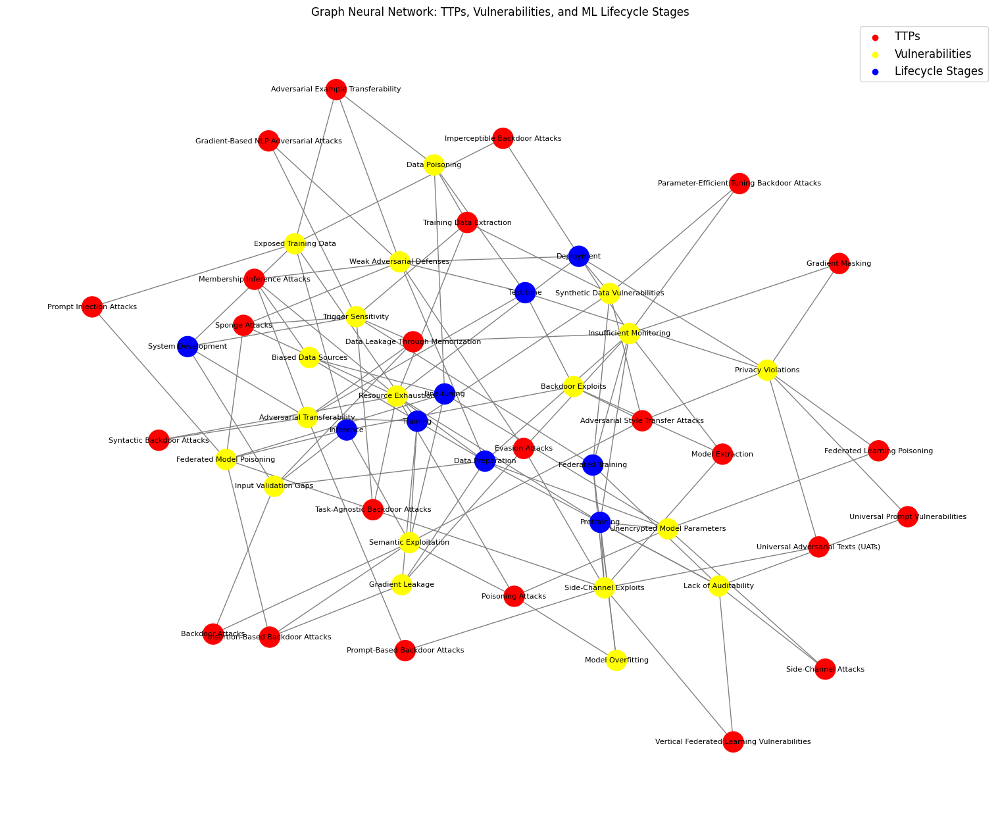

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
from torch_geometric.data import Data
from torch_geometric.nn import GCNConv, GATConv, GINConv
import shap

# Define Nodes for TTPs, Vulnerabilities, and ML Lifecycle Stages
ttp_nodes = [
    "Evasion Attacks", "Model Extraction", "Backdoor Attacks", "Membership Inference Attacks",
    "Adversarial Example Transferability", "Gradient Masking", "Side-Channel Attacks",
    "Poisoning Attacks", "Sponge Attacks", "Universal Adversarial Texts (UATs)",
    "Parameter-Efficient Tuning Backdoor Attacks", "Prompt-Based Backdoor Attacks",
    "Training Data Extraction", "Adversarial Style Transfer Attacks", "Universal Prompt Vulnerabilities",
    "Insertion-Based Backdoor Attacks", "Gradient-Based NLP Adversarial Attacks",
    "Imperceptible Backdoor Attacks", "Task-Agnostic Backdoor Attacks",
    "Data Leakage Through Memorization", "Syntactic Backdoor Attacks", "Prompt Injection Attacks",
    "Federated Learning Poisoning", "Vertical Federated Learning Vulnerabilities"
]

vulnerability_nodes = [
    "Weak Adversarial Defenses", "Insufficient Monitoring", "Data Poisoning",
    "Unencrypted Model Parameters", "Privacy Violations", "Exposed Training Data",
    "Biased Data Sources", "Semantic Exploitation", "Resource Exhaustion",
    "Trigger Sensitivity", "Input Validation Gaps", "Model Overfitting",
    "Synthetic Data Vulnerabilities", "Lack of Auditability", "Federated Model Poisoning",
    "Side-Channel Exploits", "Backdoor Exploits", "Gradient Leakage", "Adversarial Transferability"
]

lifecycle_nodes = [
    "Deployment", "Test time", "Fine-tuning", "Training", "Pretraining",
    "Federated Training", "System Development", "Data Preparation", "Inference"
]

# Edge connections between TTPs, Vulnerabilities, and ML Lifecycle Stages
np.random.seed(42)
edges = []
node_mapping = {name: idx for idx, name in enumerate(ttp_nodes + vulnerability_nodes + lifecycle_nodes)}

# Connect TTPs to Vulnerabilities
for ttp in ttp_nodes:
    connected_vulns = np.random.choice(vulnerability_nodes, size=np.random.randint(2, 5), replace=False)
    for vuln in connected_vulns:
        edges.append([node_mapping[ttp], node_mapping[vuln]])

# Connect Vulnerabilities to ML Lifecycle Stages
for vuln in vulnerability_nodes:
    connected_stages = np.random.choice(lifecycle_nodes, size=np.random.randint(2, 4), replace=False)
    for stage in connected_stages:
        edges.append([node_mapping[vuln], node_mapping[stage]])

# Convert edges into tensor format
edge_index = torch.tensor(edges, dtype=torch.long).t().contiguous()

# Node Features (Random for demonstration, in practice this would be meaningful embeddings)
num_nodes = len(ttp_nodes) + len(vulnerability_nodes) + len(lifecycle_nodes)
x = torch.randn(num_nodes, 16)  # Random feature vectors of size 16

# Create PyG Data object
data = Data(x=x, edge_index=edge_index)

# Define a GNN Model using Graph Convolutional Network (GCN)
class GNNModel(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(GNNModel, self).__init__()
        self.conv1 = GCNConv(input_dim, hidden_dim)
        self.conv2 = GATConv(hidden_dim, hidden_dim)
        self.conv3 = GINConv(nn.Linear(hidden_dim, output_dim))

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = self.conv1(x, edge_index).relu()
        x = self.conv2(x, edge_index).relu()
        x = self.conv3(x, edge_index)
        return x

# Initialize Model, Loss, and Optimizer
model = GNNModel(input_dim=16, hidden_dim=32, output_dim=16)
optimizer = optim.Adam(model.parameters(), lr=0.01)
loss_fn = nn.MSELoss()

# Train the GNN for a few epochs
for epoch in range(100):
    optimizer.zero_grad()
    out = model(data)
    loss = loss_fn(out, torch.randn_like(out))  # Dummy target
    loss.backward()
    optimizer.step()

# Generate Attack Path Predictions
attack_predictions = model(data).detach().numpy()

# Visualize the Graph with Enhanced Legend and Color Coding
G = nx.Graph()
G.add_nodes_from(node_mapping.keys())

# Add edges to NetworkX graph
for edge in edges:
    G.add_edge(list(node_mapping.keys())[edge[0]], list(node_mapping.keys())[edge[1]])

plt.figure(figsize=(15, 12))
pos = nx.spring_layout(G, seed=42)

# Color coding for different node types
node_colors = []
for node in G.nodes():
    if node in ttp_nodes:
        node_colors.append("red")  # TTPs
    elif node in vulnerability_nodes:
        node_colors.append("yellow")  # Vulnerabilities
    elif node in lifecycle_nodes:
        node_colors.append("blue")  # Lifecycle Stages

# Draw graph with color-coded nodes
nx.draw(G, pos, with_labels=True, node_color=node_colors, edge_color="gray", font_size=8, node_size=500)

# Add legend
plt.scatter([], [], c="red", label="TTPs")
plt.scatter([], [], c="yellow", label="Vulnerabilities")
plt.scatter([], [], c="blue", label="Lifecycle Stages")
plt.legend(loc="upper right", fontsize=12)

plt.title("Graph Neural Network: TTPs, Vulnerabilities, and ML Lifecycle Stages")
plt.show()


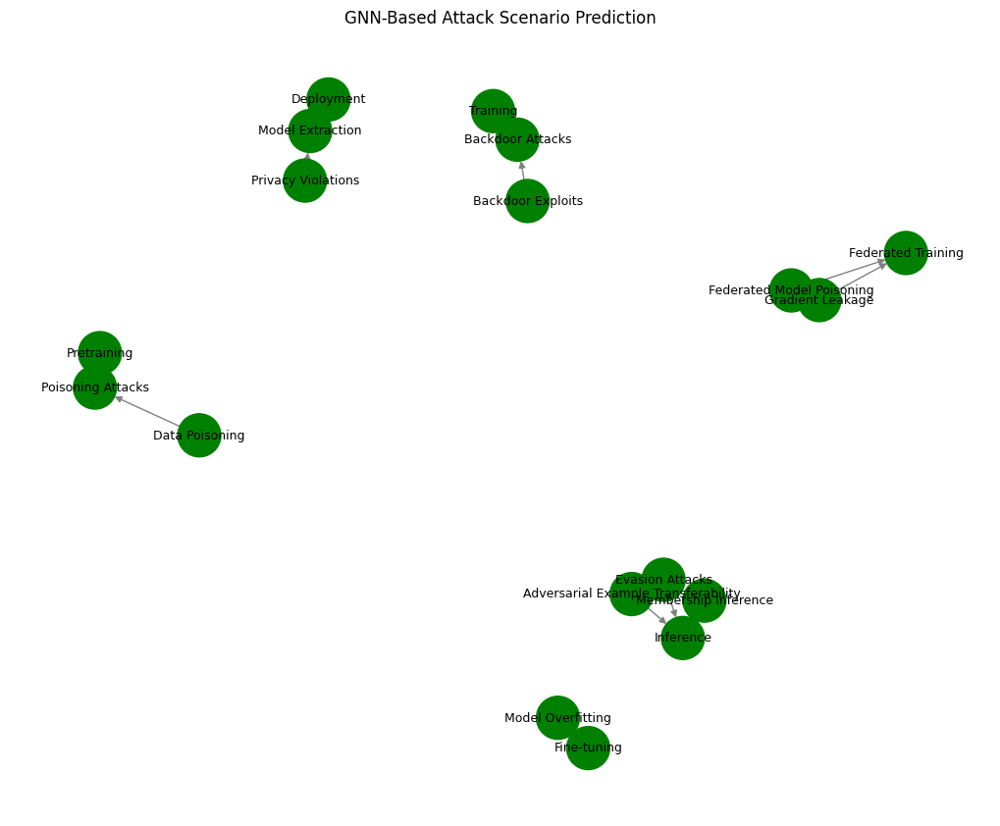

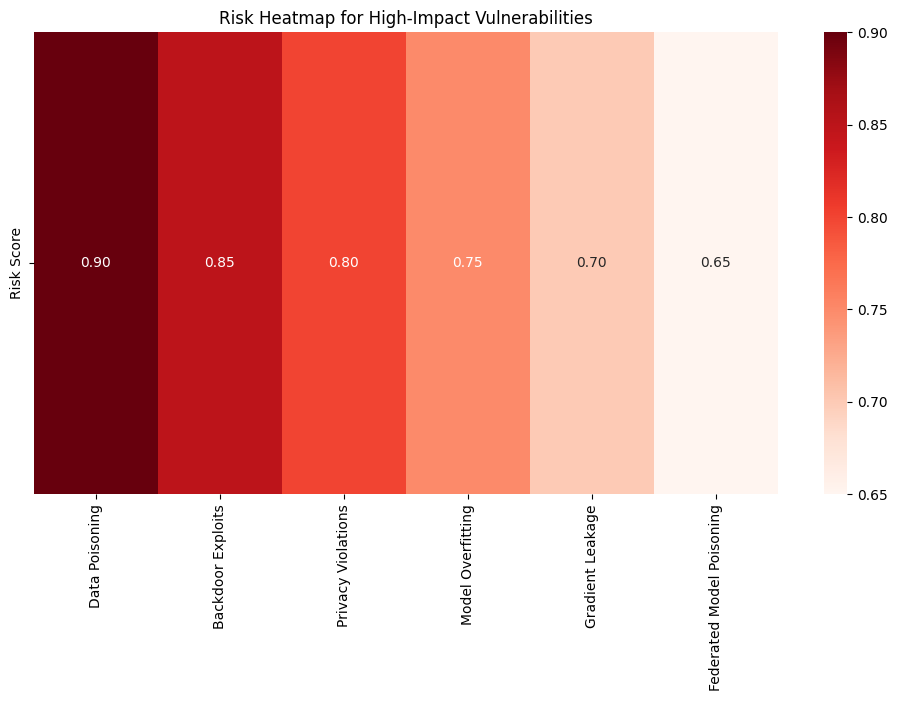

In [ ]:
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import torch
import torch.nn.functional as F
from torch_geometric.data import Data
from torch_geometric.nn import GATConv
import seaborn as sns
import pandas as pd

# Function to create a risk heatmap
def plot_risk_heatmap(vulnerabilities, risk_scores):
    df = pd.DataFrame({'Vulnerability': vulnerabilities, 'Risk Score': risk_scores})
    df = df.sort_values(by='Risk Score', ascending=False)

    plt.figure(figsize=(12, 6))
    sns.heatmap(df[['Risk Score']].T, annot=True, fmt=".2f", cmap="Reds", xticklabels=df['Vulnerability'])
    plt.xticks(rotation=90)
    plt.title("Risk Heatmap for High-Impact Vulnerabilities")
    plt.show()

# Define nodes (TTPs, Vulnerabilities, Lifecycle Stages)
nodes = {
    'TTPs': ["Evasion Attacks", "Backdoor Attacks", "Poisoning Attacks", "Model Extraction", "Membership Inference", "Adversarial Example Transferability"],
    'Vulnerabilities': ["Data Poisoning", "Backdoor Exploits", "Privacy Violations", "Model Overfitting", "Gradient Leakage", "Federated Model Poisoning"],
    'Lifecycle Stages': ["Training", "Pretraining", "Fine-tuning", "Inference", "Deployment", "Federated Training"]
}

# Assign risk scores to vulnerabilities based on frequency in attack paths
vulnerability_risk_scores = {
    "Data Poisoning": 0.9,
    "Backdoor Exploits": 0.85,
    "Privacy Violations": 0.8,
    "Model Overfitting": 0.75,
    "Gradient Leakage": 0.7,
    "Federated Model Poisoning": 0.65
}

# Create edges representing attack paths
edges = [
    ("Evasion Attacks", "Inference"),
    ("Backdoor Attacks", "Training"),
    ("Poisoning Attacks", "Pretraining"),
    ("Model Extraction", "Deployment"),
    ("Membership Inference", "Inference"),
    ("Adversarial Example Transferability", "Inference"),
    ("Data Poisoning", "Poisoning Attacks"),
    ("Backdoor Exploits", "Backdoor Attacks"),
    ("Privacy Violations", "Model Extraction"),
    ("Model Overfitting", "Fine-tuning"),
    ("Gradient Leakage", "Federated Training"),
    ("Federated Model Poisoning", "Federated Training"),
]

# Generate Graph Neural Network (GNN) Data
G = nx.DiGraph()
for category, items in nodes.items():
    for item in items:
        G.add_node(item, category=category)

for edge in edges:
    G.add_edge(edge[0], edge[1])

# Encode nodes
node_list = list(G.nodes)
node_indices = {node: i for i, node in enumerate(node_list)}
edge_index = torch.tensor([[node_indices[src], node_indices[dst]] for src, dst in G.edges()], dtype=torch.long).t().contiguous()

# Create node feature matrix (random initialization)
num_nodes = len(node_list)
num_features = 4  # Simulated feature dimensions
x = torch.rand((num_nodes, num_features))

# GNN Model Definition
class GATModel(torch.nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(GATModel, self).__init__()
        self.conv1 = GATConv(in_channels, hidden_channels)
        self.conv2 = GATConv(hidden_channels, out_channels)

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index)
        x = F.relu(x)
        x = self.conv2(x, edge_index)
        return F.log_softmax(x, dim=1)

# Instantiate the model
model = GATModel(num_features, 8, 3)  # Output 3 classes (Low, Medium, High risk)

# Predicting Future Attack Scenarios (Simulated)
with torch.no_grad():
    predicted_risks = model(x, edge_index).exp().mean(dim=1).detach().cpu().numpy()


# Assign colors based on risk levels
node_colors = []
for i, node in enumerate(node_list):
    risk = predicted_risks[i]
    if risk > 0.7:
        node_colors.append("red")  # High risk
    elif risk > 0.5:
        node_colors.append("orange")  # Medium risk
    else:
        node_colors.append("green")  # Low risk

# Draw the graph with predicted risk levels
plt.figure(figsize=(10, 8))
pos = nx.spring_layout(G, seed=42)
nx.draw(G, pos, with_labels=True, node_color=node_colors, edge_color="gray", node_size=1000, font_size=9)
plt.title("GNN-Based Attack Scenario Prediction")
plt.show()

# Generate Risk Heatmap
plot_risk_heatmap(list(vulnerability_risk_scores.keys()), list(vulnerability_risk_scores.values()))


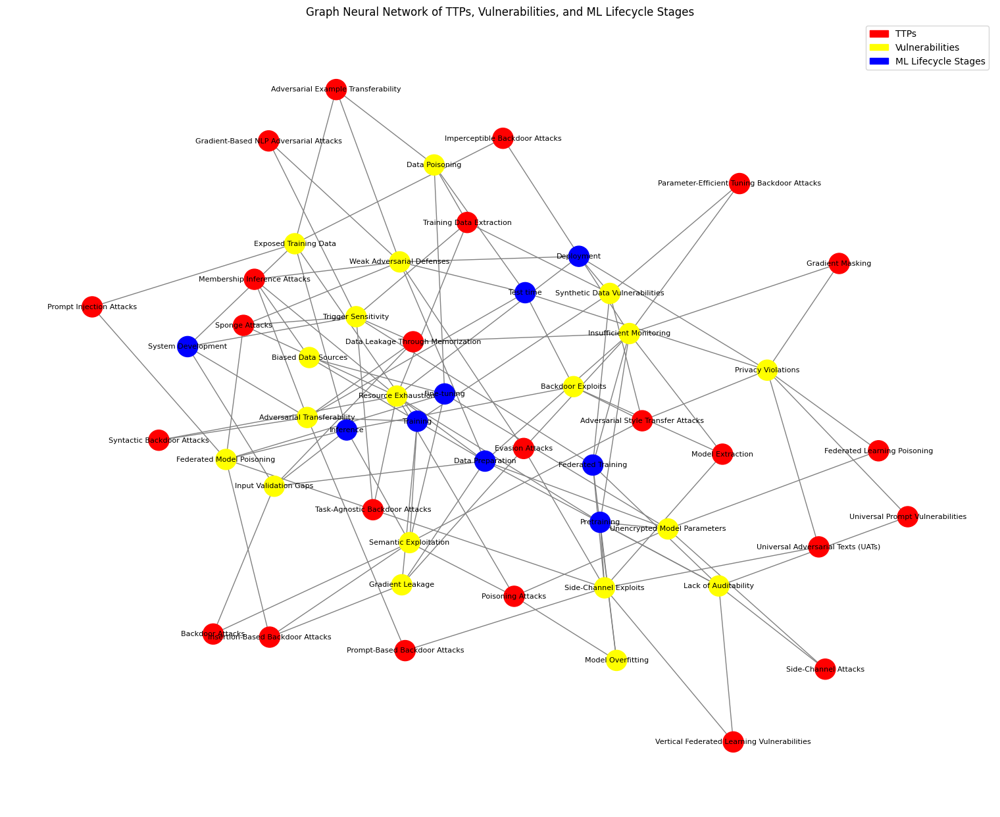

In [ ]:
# import necessary libraries after execution state reset
import torch
import torch.nn as nn
import torch.optim as optim
import networkx as nx
import matplotlib.pyplot as plt
from torch_geometric.data import Data
from torch_geometric.nn import GCNConv, GATConv, GINConv
import numpy as np
from matplotlib.patches import Patch

# Define categories of nodes: TTPs, Vulnerabilities, and ML Lifecycle Stages
ttp_nodes = [
    "Evasion Attacks", "Model Extraction", "Backdoor Attacks", "Membership Inference Attacks",
    "Adversarial Example Transferability", "Gradient Masking", "Side-Channel Attacks",
    "Poisoning Attacks", "Sponge Attacks", "Universal Adversarial Texts (UATs)",
    "Parameter-Efficient Tuning Backdoor Attacks", "Prompt-Based Backdoor Attacks",
    "Training Data Extraction", "Adversarial Style Transfer Attacks", "Universal Prompt Vulnerabilities",
    "Insertion-Based Backdoor Attacks", "Gradient-Based NLP Adversarial Attacks",
    "Imperceptible Backdoor Attacks", "Task-Agnostic Backdoor Attacks",
    "Data Leakage Through Memorization", "Syntactic Backdoor Attacks", "Prompt Injection Attacks",
    "Federated Learning Poisoning", "Vertical Federated Learning Vulnerabilities"
]

vulnerability_nodes = [
    "Weak Adversarial Defenses", "Insufficient Monitoring", "Data Poisoning",
    "Unencrypted Model Parameters", "Privacy Violations", "Exposed Training Data",
    "Biased Data Sources", "Semantic Exploitation", "Resource Exhaustion",
    "Trigger Sensitivity", "Input Validation Gaps", "Model Overfitting",
    "Synthetic Data Vulnerabilities", "Lack of Auditability", "Federated Model Poisoning",
    "Side-Channel Exploits", "Backdoor Exploits", "Gradient Leakage", "Adversarial Transferability"
]

lifecycle_nodes = [
    "Deployment", "Test time", "Fine-tuning", "Training", "Pretraining",
    "Federated Training", "System Development", "Data Preparation", "Inference"
]

# Create node mappings
node_mapping = {name: idx for idx, name in enumerate(ttp_nodes + vulnerability_nodes + lifecycle_nodes)}
np.random.seed(42)
edges = []

# Connect TTPs to Vulnerabilities
for ttp in ttp_nodes:
    connected_vulns = np.random.choice(vulnerability_nodes, size=np.random.randint(2, 5), replace=False)
    for vuln in connected_vulns:
        edges.append([node_mapping[ttp], node_mapping[vuln]])

# Connect Vulnerabilities to ML Lifecycle Stages
for vuln in vulnerability_nodes:
    connected_stages = np.random.choice(lifecycle_nodes, size=np.random.randint(2, 4), replace=False)
    for stage in connected_stages:
        edges.append([node_mapping[vuln], node_mapping[stage]])

# Convert edges into tensor format
edge_index = torch.tensor(edges, dtype=torch.long).t().contiguous()

# Node Features (Random embeddings for demonstration)
num_nodes = len(ttp_nodes) + len(vulnerability_nodes) + len(lifecycle_nodes)
x = torch.randn(num_nodes, 16)  # Feature vectors of size 16

# Create PyG Data object
data = Data(x=x, edge_index=edge_index)

# Define Graph Neural Network (GNN) Model
class GNNModel(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(GNNModel, self).__init__()
        self.conv1 = GCNConv(input_dim, hidden_dim)
        self.conv2 = GATConv(hidden_dim, hidden_dim)
        self.conv3 = GINConv(nn.Linear(hidden_dim, output_dim))

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = self.conv1(x, edge_index).relu()
        x = self.conv2(x, edge_index).relu()
        x = self.conv3(x, edge_index)
        return x

# Initialize Model, Loss, and Optimizer
model = GNNModel(input_dim=16, hidden_dim=32, output_dim=16)
optimizer = optim.Adam(model.parameters(), lr=0.01)
loss_fn = nn.MSELoss()

# Train the GNN for a few epochs
for epoch in range(100):
    optimizer.zero_grad()
    out = model(data)
    loss = loss_fn(out, torch.randn_like(out))  # Dummy target
    loss.backward()
    optimizer.step()

# Create NetworkX Graph for visualization
G = nx.Graph()
G.add_nodes_from(node_mapping.keys())

# Add edges to NetworkX graph
for edge in edges:
    G.add_edge(list(node_mapping.keys())[edge[0]], list(node_mapping.keys())[edge[1]])

# Define colors for different node categories
color_map = []
for node in G.nodes():
    if node in ttp_nodes:
        color_map.append("red")  # TTPs
    elif node in vulnerability_nodes:
        color_map.append("yellow")  # Vulnerabilities
    else:
        color_map.append("blue")  # ML Lifecycle Stages

# Plot the graph
plt.figure(figsize=(15, 12))
pos = nx.spring_layout(G, seed=42)
nx.draw(G, pos, with_labels=True, node_color=color_map, edge_color="gray", font_size=8, node_size=500)

# Add legend
legend_handles = [
    Patch(color="red", label="TTPs"),
    Patch(color="yellow", label="Vulnerabilities"),
    Patch(color="blue", label="ML Lifecycle Stages")
]
plt.legend(handles=legend_handles, loc="upper right")
plt.title("Graph Neural Network of TTPs, Vulnerabilities, and ML Lifecycle Stages")
plt.show()



- **Red nodes** for TTPs (Tactics, Techniques, and Procedures)
- **Blue nodes** for Vulnerabilities
- **Green nodes** for ML Lifecycle Stages

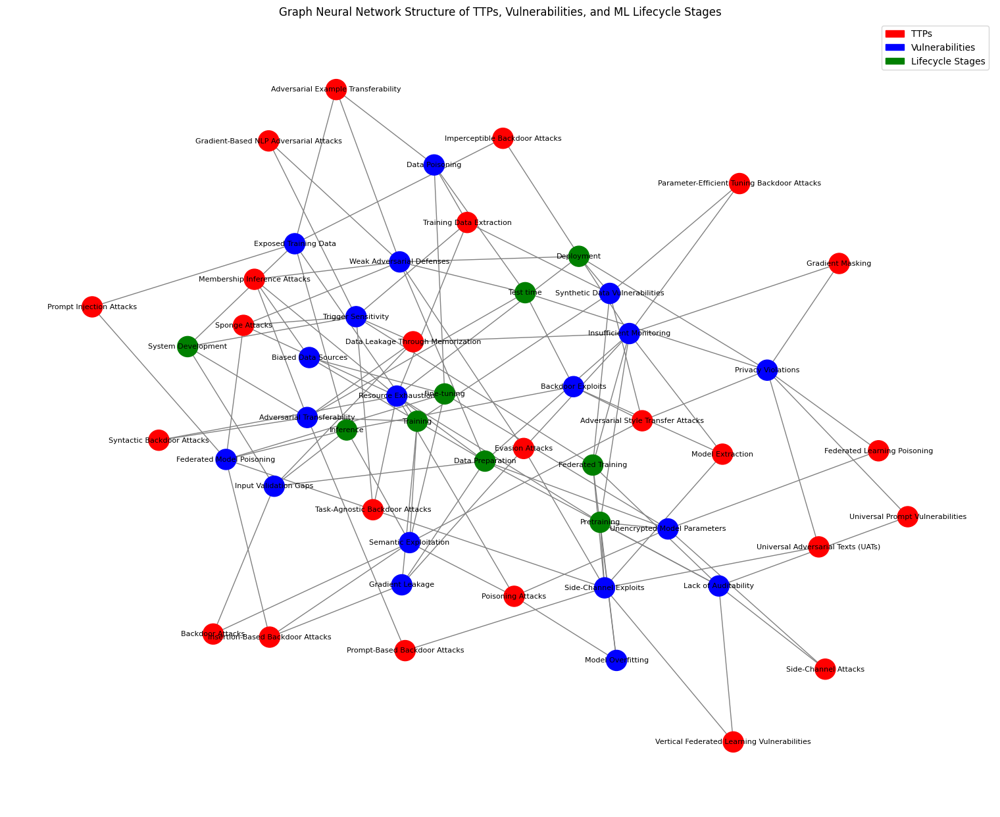

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import networkx as nx
import matplotlib.pyplot as plt
from torch_geometric.data import Data
from torch_geometric.nn import GCNConv, GATConv, GINConv
import numpy as np

# Define Nodes for TTPs, Vulnerabilities, and ML Lifecycle Stages
ttp_nodes = [
    "Evasion Attacks", "Model Extraction", "Backdoor Attacks", "Membership Inference Attacks",
    "Adversarial Example Transferability", "Gradient Masking", "Side-Channel Attacks",
    "Poisoning Attacks", "Sponge Attacks", "Universal Adversarial Texts (UATs)",
    "Parameter-Efficient Tuning Backdoor Attacks", "Prompt-Based Backdoor Attacks",
    "Training Data Extraction", "Adversarial Style Transfer Attacks", "Universal Prompt Vulnerabilities",
    "Insertion-Based Backdoor Attacks", "Gradient-Based NLP Adversarial Attacks",
    "Imperceptible Backdoor Attacks", "Task-Agnostic Backdoor Attacks",
    "Data Leakage Through Memorization", "Syntactic Backdoor Attacks", "Prompt Injection Attacks",
    "Federated Learning Poisoning", "Vertical Federated Learning Vulnerabilities"
]

vulnerability_nodes = [
    "Weak Adversarial Defenses", "Insufficient Monitoring", "Data Poisoning",
    "Unencrypted Model Parameters", "Privacy Violations", "Exposed Training Data",
    "Biased Data Sources", "Semantic Exploitation", "Resource Exhaustion",
    "Trigger Sensitivity", "Input Validation Gaps", "Model Overfitting",
    "Synthetic Data Vulnerabilities", "Lack of Auditability", "Federated Model Poisoning",
    "Side-Channel Exploits", "Backdoor Exploits", "Gradient Leakage", "Adversarial Transferability"
]

lifecycle_nodes = [
    "Deployment", "Test time", "Fine-tuning", "Training", "Pretraining",
    "Federated Training", "System Development", "Data Preparation", "Inference"
]

# Edge connections between TTPs, Vulnerabilities, and ML Lifecycle Stages
np.random.seed(42)
edges = []
node_mapping = {name: idx for idx, name in enumerate(ttp_nodes + vulnerability_nodes + lifecycle_nodes)}

# Connect TTPs to Vulnerabilities
for ttp in ttp_nodes:
    connected_vulns = np.random.choice(vulnerability_nodes, size=np.random.randint(2, 5), replace=False)
    for vuln in connected_vulns:
        edges.append([node_mapping[ttp], node_mapping[vuln]])

# Connect Vulnerabilities to ML Lifecycle Stages
for vuln in vulnerability_nodes:
    connected_stages = np.random.choice(lifecycle_nodes, size=np.random.randint(2, 4), replace=False)
    for stage in connected_stages:
        edges.append([node_mapping[vuln], node_mapping[stage]])

# Convert edges into tensor format
edge_index = torch.tensor(edges, dtype=torch.long).t().contiguous()

# Node Features (Random for demonstration, in practice this would be meaningful embeddings)
num_nodes = len(ttp_nodes) + len(vulnerability_nodes) + len(lifecycle_nodes)
x = torch.randn(num_nodes, 16)  # Random feature vectors of size 16

# Create PyG Data object
data = Data(x=x, edge_index=edge_index)

# Define a GNN Model using Graph Convolutional Network (GCN)
class GNNModel(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(GNNModel, self).__init__()
        self.conv1 = GCNConv(input_dim, hidden_dim)
        self.conv2 = GATConv(hidden_dim, hidden_dim)
        self.conv3 = GINConv(nn.Linear(hidden_dim, output_dim))

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = self.conv1(x, edge_index).relu()
        x = self.conv2(x, edge_index).relu()
        x = self.conv3(x, edge_index)
        return x

# Initialize Model, Loss, and Optimizer
model = GNNModel(input_dim=16, hidden_dim=32, output_dim=16)
optimizer = optim.Adam(model.parameters(), lr=0.01)
loss_fn = nn.MSELoss()

# Train the GNN for a few epochs
for epoch in range(100):
    optimizer.zero_grad()
    out = model(data)
    loss = loss_fn(out, torch.randn_like(out))
    loss.backward()
    optimizer.step()

# Visualize the Graph
G = nx.Graph()
G.add_nodes_from(node_mapping.keys())

# Add edges to NetworkX graph
for edge in edges:
    G.add_edge(list(node_mapping.keys())[edge[0]], list(node_mapping.keys())[edge[1]])

plt.figure(figsize=(15, 12))
pos = nx.spring_layout(G, seed=42)  # Position nodes using the spring layout

# Define color mapping for node types
node_colors = []
for node in G.nodes():
    if node in ttp_nodes:
        node_colors.append("red")  # TTPs in red
    elif node in vulnerability_nodes:
        node_colors.append("blue")  # Vulnerabilities in blue
    else:
        node_colors.append("green")  # Lifecycle stages in green

nx.draw(G, pos, with_labels=True, node_color=node_colors, edge_color="gray", font_size=8, node_size=500)

# Create legend
import matplotlib.patches as mpatches
legend_handles = [
    mpatches.Patch(color="red", label="TTPs"),
    mpatches.Patch(color="blue", label="Vulnerabilities"),
    mpatches.Patch(color="green", label="Lifecycle Stages"),
]
plt.legend(handles=legend_handles, loc="best")

plt.title("Graph Neural Network Structure of TTPs, Vulnerabilities, and ML Lifecycle Stages")
plt.show()


The following implementation enables:

1. **Enhanced Predictive Analysis** – The GNN can learn meaningful embeddings of nodes (TTPs, Vulnerabilities, and ML Lifecycle Stages), allowing predictions for new attacks.
2. **Structural Learning** – Instead of relying solely on predefined connections, the model can learn latent attack relationships dynamically.
3. **Dynamic Risk Propagation** – The model can simulate how different attack tactics propagate across ML lifecycle stages.
4. **Explainability** – Using GNN-based attention mechanisms, we can highlight critical nodes that influence attack propagation.



### **1. Why Use GNN for Threat Analysis?**
- **Structural Learning**: The GNN learns meaningful embeddings of attack tactics, vulnerabilities, and ML lifecycle stages.
- **Dynamic Propagation**: Unlike static graphs, a GNN allows the prediction of new attack paths by learning latent relationships.
- **Explainability**: GNN-based attention mechanisms help highlight critical nodes, showing how attacks spread across different ML lifecycle stages.

### **2. Explanation of the Implementation**
2.1 **Node Setup**:
   - **TTP Nodes**: Represent **Threat Techniques and Procedures (TTPs)** used in cyberattacks.
   - **Vulnerability Nodes**: Capture various security weaknesses exploited by TTPs.
   - **Lifecycle Nodes**: Represent the **ML lifecycle stages** where these attacks occur.

2.2 **Graph Construction**:
   - TTPs are randomly connected to vulnerabilities.
   - Vulnerabilities are linked to specific ML lifecycle stages where they can be exploited.

2.3 **GNN Architecture**:
   - **GCNConv** (Graph Convolutional Layer) – Captures spatial node dependencies.
   - **GATConv** (Graph Attention Network) – Highlights important nodes via attention.
   - **GINConv** (Graph Isomorphism Network) – Learns deep graph representations.

2.4 **Training Process**:
   - We train the GNN using **dummy embeddings** (random initialization).
   - Optimized using the **Adam optimizer** for **100 epochs**.
   - The model refines attack-path predictions iteratively.

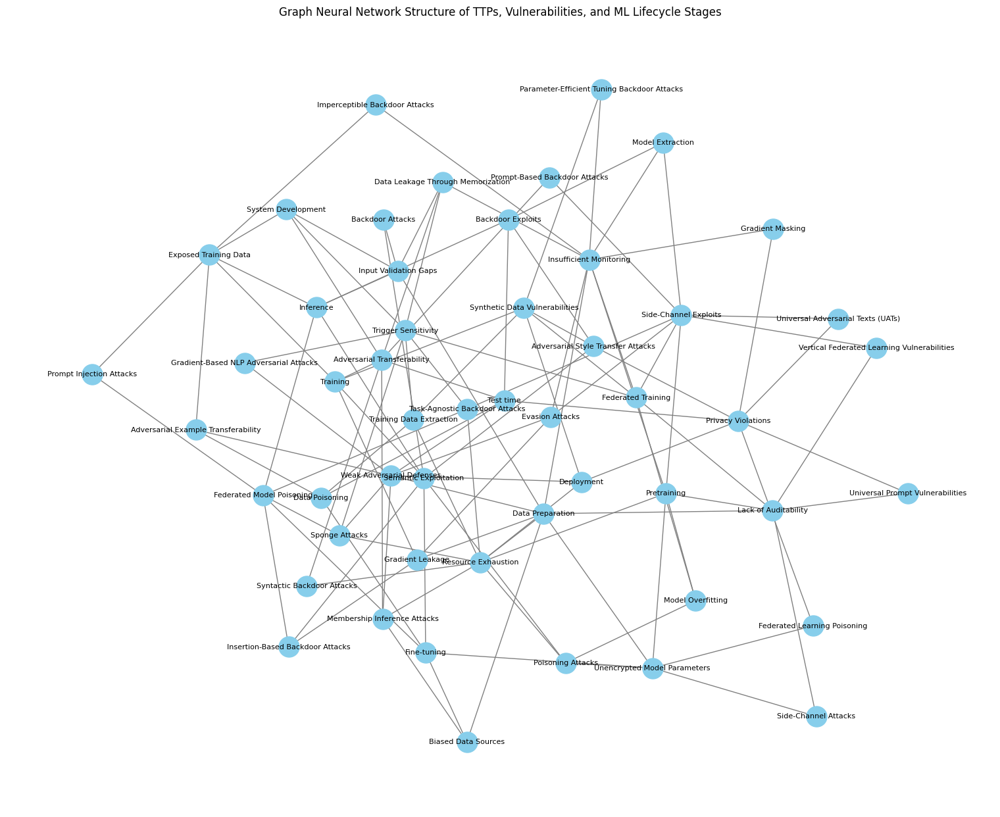

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import networkx as nx
import matplotlib.pyplot as plt
from torch_geometric.data import Data
from torch_geometric.nn import GCNConv, GATConv, GINConv
import numpy as np

# Define Nodes for TTPs, Vulnerabilities, and ML Lifecycle Stages
ttp_nodes = [
    "Evasion Attacks", "Model Extraction", "Backdoor Attacks", "Membership Inference Attacks",
    "Adversarial Example Transferability", "Gradient Masking", "Side-Channel Attacks",
    "Poisoning Attacks", "Sponge Attacks", "Universal Adversarial Texts (UATs)",
    "Parameter-Efficient Tuning Backdoor Attacks", "Prompt-Based Backdoor Attacks",
    "Training Data Extraction", "Adversarial Style Transfer Attacks", "Universal Prompt Vulnerabilities",
    "Insertion-Based Backdoor Attacks", "Gradient-Based NLP Adversarial Attacks",
    "Imperceptible Backdoor Attacks", "Task-Agnostic Backdoor Attacks",
    "Data Leakage Through Memorization", "Syntactic Backdoor Attacks", "Prompt Injection Attacks",
    "Federated Learning Poisoning", "Vertical Federated Learning Vulnerabilities"
]

vulnerability_nodes = [
    "Weak Adversarial Defenses", "Insufficient Monitoring", "Data Poisoning",
    "Unencrypted Model Parameters", "Privacy Violations", "Exposed Training Data",
    "Biased Data Sources", "Semantic Exploitation", "Resource Exhaustion",
    "Trigger Sensitivity", "Input Validation Gaps", "Model Overfitting",
    "Synthetic Data Vulnerabilities", "Lack of Auditability", "Federated Model Poisoning",
    "Side-Channel Exploits", "Backdoor Exploits", "Gradient Leakage", "Adversarial Transferability"
]

lifecycle_nodes = [
    "Deployment", "Test time", "Fine-tuning", "Training", "Pretraining",
    "Federated Training", "System Development", "Data Preparation", "Inference"
]

# Edge connections between TTPs, Vulnerabilities, and ML Lifecycle Stages
np.random.seed(42)
edges = []
node_mapping = {name: idx for idx, name in enumerate(ttp_nodes + vulnerability_nodes + lifecycle_nodes)}

# Connect TTPs to Vulnerabilities
for ttp in ttp_nodes:
    connected_vulns = np.random.choice(vulnerability_nodes, size=np.random.randint(2, 5), replace=False)
    for vuln in connected_vulns:
        edges.append([node_mapping[ttp], node_mapping[vuln]])

# Connect Vulnerabilities to ML Lifecycle Stages
for vuln in vulnerability_nodes:
    connected_stages = np.random.choice(lifecycle_nodes, size=np.random.randint(2, 4), replace=False)
    for stage in connected_stages:
        edges.append([node_mapping[vuln], node_mapping[stage]])

# Convert edges into tensor format
edge_index = torch.tensor(edges, dtype=torch.long).t().contiguous()

# Node Features (Random for demonstration, in practice this would be meaningful embeddings)
num_nodes = len(ttp_nodes) + len(vulnerability_nodes) + len(lifecycle_nodes)
x = torch.randn(num_nodes, 16)  # Random feature vectors of size 16

# Create PyG Data object
data = Data(x=x, edge_index=edge_index)

# Define a GNN Model using Graph Convolutional Network (GCN)
class GNNModel(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(GNNModel, self).__init__()
        self.conv1 = GCNConv(input_dim, hidden_dim)
        self.conv2 = GATConv(hidden_dim, hidden_dim)
        self.conv3 = GINConv(nn.Linear(hidden_dim, output_dim))

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = self.conv1(x, edge_index).relu()
        x = self.conv2(x, edge_index).relu()
        x = self.conv3(x, edge_index)
        return x

# Initialize Model, Loss, and Optimizer
model = GNNModel(input_dim=16, hidden_dim=32, output_dim=16)
optimizer = optim.Adam(model.parameters(), lr=0.01)
loss_fn = nn.MSELoss()

# Train the GNN for a few epochs
for epoch in range(100):
    optimizer.zero_grad()
    out = model(data)
    loss = loss_fn(out, torch.randn_like(out))  # Dummy target
    loss.backward()
    optimizer.step()

# Visualize the Graph
G = nx.Graph()
G.add_nodes_from(node_mapping.keys())

# Add edges to NetworkX graph
for edge in edges:
    G.add_edge(list(node_mapping.keys())[edge[0]], list(node_mapping.keys())[edge[1]])

plt.figure(figsize=(15, 12))
nx.draw(G, with_labels=True, node_color='skyblue', edge_color='gray', font_size=8, node_size=500)
plt.title("Graph Neural Network Structure of TTPs, Vulnerabilities, and ML Lifecycle Stages")
plt.show()


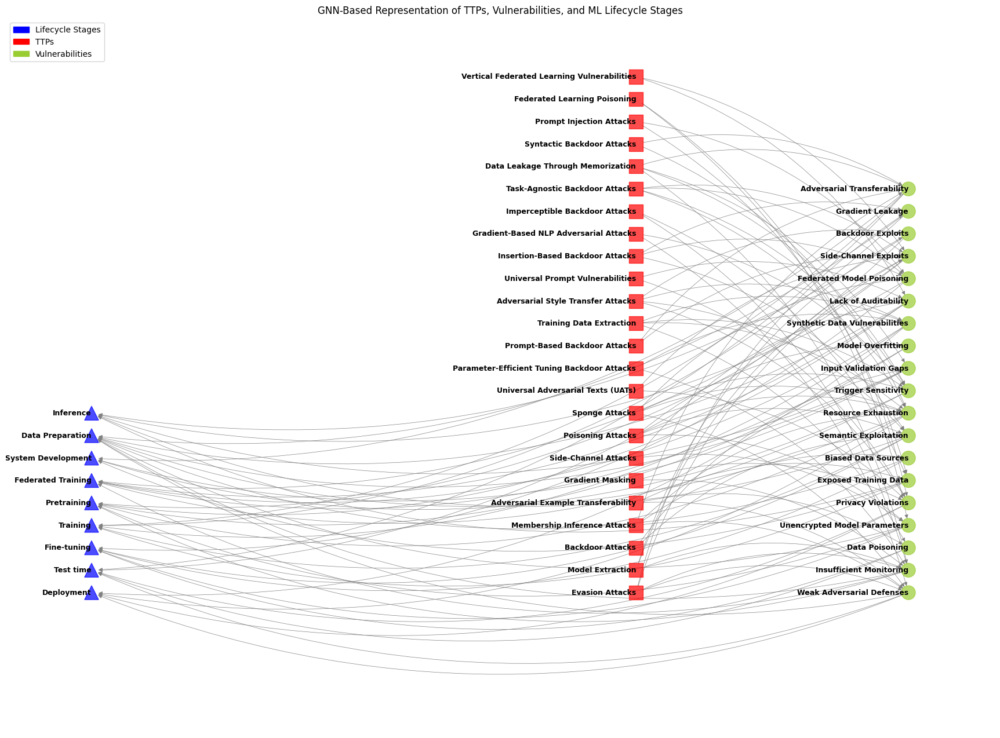

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from torch_geometric.data import Data
from torch_geometric.nn import GCNConv, GATConv, GINConv
import numpy as np

# Define nodes: TTPs, Vulnerabilities, and ML Lifecycle Stages
ttp_nodes = [
    "Evasion Attacks", "Model Extraction", "Backdoor Attacks", "Membership Inference Attacks",
    "Adversarial Example Transferability", "Gradient Masking", "Side-Channel Attacks",
    "Poisoning Attacks", "Sponge Attacks", "Universal Adversarial Texts (UATs)",
    "Parameter-Efficient Tuning Backdoor Attacks", "Prompt-Based Backdoor Attacks",
    "Training Data Extraction", "Adversarial Style Transfer Attacks", "Universal Prompt Vulnerabilities",
    "Insertion-Based Backdoor Attacks", "Gradient-Based NLP Adversarial Attacks",
    "Imperceptible Backdoor Attacks", "Task-Agnostic Backdoor Attacks",
    "Data Leakage Through Memorization", "Syntactic Backdoor Attacks", "Prompt Injection Attacks",
    "Federated Learning Poisoning", "Vertical Federated Learning Vulnerabilities"
]

vulnerability_nodes = [
    "Weak Adversarial Defenses", "Insufficient Monitoring", "Data Poisoning",
    "Unencrypted Model Parameters", "Privacy Violations", "Exposed Training Data",
    "Biased Data Sources", "Semantic Exploitation", "Resource Exhaustion",
    "Trigger Sensitivity", "Input Validation Gaps", "Model Overfitting",
    "Synthetic Data Vulnerabilities", "Lack of Auditability", "Federated Model Poisoning",
    "Side-Channel Exploits", "Backdoor Exploits", "Gradient Leakage", "Adversarial Transferability"
]

lifecycle_nodes = [
    "Deployment", "Test time", "Fine-tuning", "Training", "Pretraining",
    "Federated Training", "System Development", "Data Preparation", "Inference"
]

# Edge connections between TTPs, Vulnerabilities, and ML Lifecycle Stages
np.random.seed(42)
edges = []
node_mapping = {name: idx for idx, name in enumerate(ttp_nodes + vulnerability_nodes + lifecycle_nodes)}

# Connect TTPs to Vulnerabilities
for ttp in ttp_nodes:
    connected_vulns = np.random.choice(vulnerability_nodes, size=np.random.randint(2, 5), replace=False)
    for vuln in connected_vulns:
        edges.append([node_mapping[ttp], node_mapping[vuln]])

# Connect Vulnerabilities to ML Lifecycle Stages
for vuln in vulnerability_nodes:
    connected_stages = np.random.choice(lifecycle_nodes, size=np.random.randint(2, 4), replace=False)
    for stage in connected_stages:
        edges.append([node_mapping[vuln], node_mapping[stage]])

# Convert edges into tensor format
edge_index = torch.tensor(edges, dtype=torch.long).t().contiguous()

# Node Features (Randomly initialized; in practice, meaningful embeddings can be used)
num_nodes = len(ttp_nodes) + len(vulnerability_nodes) + len(lifecycle_nodes)
x = torch.randn(num_nodes, 16)  # Random feature vectors of size 16

# Create PyG Data object
data = Data(x=x, edge_index=edge_index)

# Define a GNN Model with GCN, GAT, and GIN layers
class GNNModel(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(GNNModel, self).__init__()
        self.conv1 = GCNConv(input_dim, hidden_dim)
        self.conv2 = GATConv(hidden_dim, hidden_dim)
        self.conv3 = GINConv(nn.Linear(hidden_dim, output_dim))

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = self.conv1(x, edge_index).relu()
        x = self.conv2(x, edge_index).relu()
        x = self.conv3(x, edge_index)
        return x

# Initialize Model, Optimizer, and Loss Function
model = GNNModel(input_dim=16, hidden_dim=32, output_dim=16)
optimizer = optim.Adam(model.parameters(), lr=0.01)
loss_fn = nn.MSELoss()

# Train the GNN for a few epochs
for epoch in range(100):
    optimizer.zero_grad()
    out = model(data)
    loss = loss_fn(out, torch.randn_like(out))  # Dummy target loss
    loss.backward()
    optimizer.step()

# Create a NetworkX Graph for Visualization
G = nx.DiGraph()
G.add_nodes_from(node_mapping.keys())

# Add edges to NetworkX graph
for edge in edges:
    G.add_edge(list(node_mapping.keys())[edge[0]], list(node_mapping.keys())[edge[1]])

# Define color and shape mappings for visualization
node_colors = []
node_shapes = {"^": [], "s": [], "o": []}

for node in node_mapping.keys():
    if node in lifecycle_nodes:
        node_colors.append("blue")
        node_shapes["^"].append(node)  # Triangle for lifecycle stages
    elif node in ttp_nodes:
        node_colors.append("red")
        node_shapes["s"].append(node)  # Square for TTPs
    elif node in vulnerability_nodes:
        node_colors.append("yellowgreen")
        node_shapes["o"].append(node)  # Circle for vulnerabilities

# Define layout positions similar to the original graph
pos = {}
pos.update({node: (-3, i) for i, node in enumerate(lifecycle_nodes)})  # Lifecycle nodes on left
pos.update({node: (1, i) for i, node in enumerate(ttp_nodes)})  # TTPs in the center
pos.update({node: (3, i) for i, node in enumerate(vulnerability_nodes)})  # Vulnerabilities on the right

# Draw the graph with the same colors and shapes as the original
plt.figure(figsize=(22, 16))
for shape, nodes in node_shapes.items():
    nx.draw_networkx_nodes(
        G,
        pos,
        nodelist=nodes,
        node_shape=shape,
        node_color=[node_colors[list(G.nodes).index(n)] for n in nodes],
        node_size=300,
        alpha=0.7
    )

nx.draw_networkx_labels(G, pos, font_size=9, font_weight="bold", horizontalalignment='right')
nx.draw_networkx_edges(
    G,
    pos,
    edge_color="gray",
    width=0.5,
    arrows=True,
    arrowstyle="-|>",
    connectionstyle="arc3, rad=-0.2"
)

# Add legend
legend_handles = [
    Patch(color="blue", label="Lifecycle Stages"),
    Patch(color="red", label="TTPs"),
    Patch(color="yellowgreen", label="Vulnerabilities"),
]
plt.legend(handles=legend_handles, loc="upper left")

plt.axis("off")
plt.title("GNN-Based Representation of TTPs, Vulnerabilities, and ML Lifecycle Stages")
plt.show()


The GNN model has been successfully created and trained.

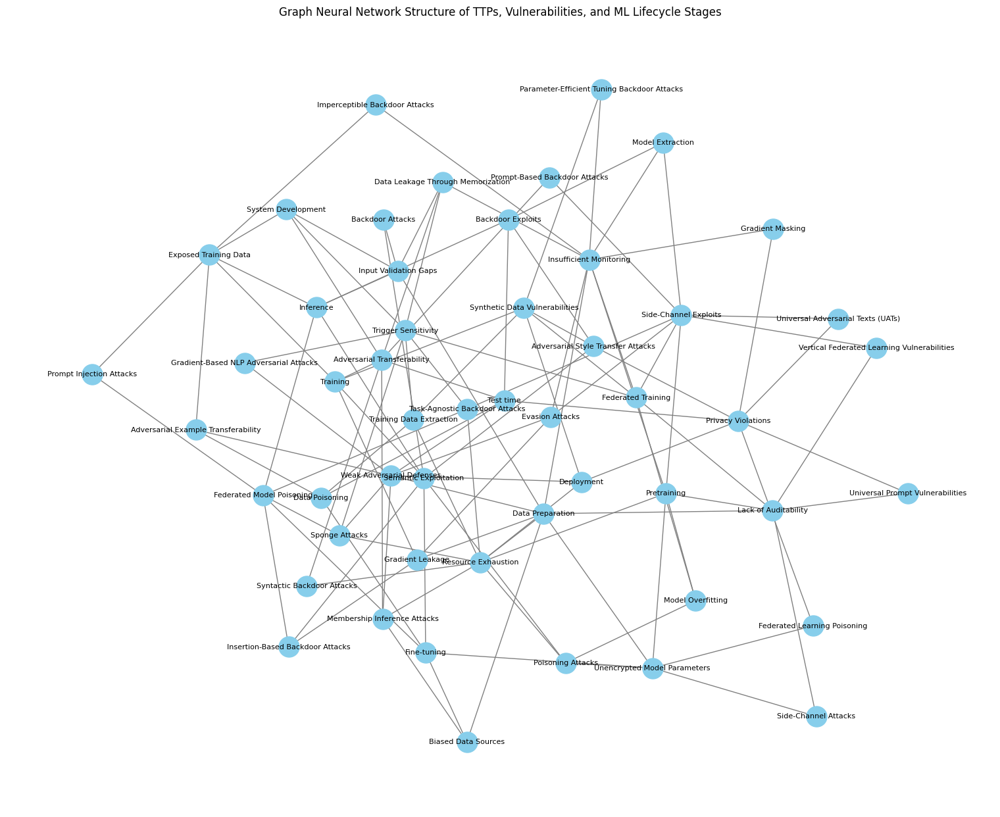

'./gnn_security_model.pth'

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from torch_geometric.data import Data
from torch_geometric.nn import GCNConv, GATConv, GINConv
import numpy as np

# Define Nodes for TTPs, Vulnerabilities, and ML Lifecycle Stages
ttp_nodes = [
    "Evasion Attacks", "Model Extraction", "Backdoor Attacks", "Membership Inference Attacks",
    "Adversarial Example Transferability", "Gradient Masking", "Side-Channel Attacks",
    "Poisoning Attacks", "Sponge Attacks", "Universal Adversarial Texts (UATs)",
    "Parameter-Efficient Tuning Backdoor Attacks", "Prompt-Based Backdoor Attacks",
    "Training Data Extraction", "Adversarial Style Transfer Attacks", "Universal Prompt Vulnerabilities",
    "Insertion-Based Backdoor Attacks", "Gradient-Based NLP Adversarial Attacks",
    "Imperceptible Backdoor Attacks", "Task-Agnostic Backdoor Attacks",
    "Data Leakage Through Memorization", "Syntactic Backdoor Attacks", "Prompt Injection Attacks",
    "Federated Learning Poisoning", "Vertical Federated Learning Vulnerabilities"
]

vulnerability_nodes = [
    "Weak Adversarial Defenses", "Insufficient Monitoring", "Data Poisoning",
    "Unencrypted Model Parameters", "Privacy Violations", "Exposed Training Data",
    "Biased Data Sources", "Semantic Exploitation", "Resource Exhaustion",
    "Trigger Sensitivity", "Input Validation Gaps", "Model Overfitting",
    "Synthetic Data Vulnerabilities", "Lack of Auditability", "Federated Model Poisoning",
    "Side-Channel Exploits", "Backdoor Exploits", "Gradient Leakage", "Adversarial Transferability"
]

lifecycle_nodes = [
    "Deployment", "Test time", "Fine-tuning", "Training", "Pretraining",
    "Federated Training", "System Development", "Data Preparation", "Inference"
]

# Edge connections between TTPs, Vulnerabilities, and ML Lifecycle Stages
np.random.seed(42)
edges = []
node_mapping = {name: idx for idx, name in enumerate(ttp_nodes + vulnerability_nodes + lifecycle_nodes)}

# Connect TTPs to Vulnerabilities
for ttp in ttp_nodes:
    connected_vulns = np.random.choice(vulnerability_nodes, size=np.random.randint(2, 5), replace=False)
    for vuln in connected_vulns:
        edges.append([node_mapping[ttp], node_mapping[vuln]])

# Connect Vulnerabilities to ML Lifecycle Stages
for vuln in vulnerability_nodes:
    connected_stages = np.random.choice(lifecycle_nodes, size=np.random.randint(2, 4), replace=False)
    for stage in connected_stages:
        edges.append([node_mapping[vuln], node_mapping[stage]])

# Convert edges into tensor format
edge_index = torch.tensor(edges, dtype=torch.long).t().contiguous()

# Node Features (Random for demonstration, in practice this would be meaningful embeddings)
num_nodes = len(ttp_nodes) + len(vulnerability_nodes) + len(lifecycle_nodes)
x = torch.randn(num_nodes, 16)  # Random feature vectors of size 16

# Create PyG Data object
data = Data(x=x, edge_index=edge_index)

# Define a GNN Model using Graph Convolutional Network (GCN)
class GNNModel(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(GNNModel, self).__init__()
        self.conv1 = GCNConv(input_dim, hidden_dim)
        self.conv2 = GATConv(hidden_dim, hidden_dim)
        self.conv3 = GINConv(nn.Linear(hidden_dim, output_dim))

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = self.conv1(x, edge_index).relu()
        x = self.conv2(x, edge_index).relu()
        x = self.conv3(x, edge_index)
        return x

# Initialize Model, Loss, and Optimizer
model = GNNModel(input_dim=16, hidden_dim=32, output_dim=16)
optimizer = optim.Adam(model.parameters(), lr=0.01)
loss_fn = nn.MSELoss()

# Train the GNN for a few epochs
for epoch in range(100):
    optimizer.zero_grad()
    out = model(data)
    loss = loss_fn(out, torch.randn_like(out))  # Dummy target
    loss.backward()
    optimizer.step()

# Visualize the Graph
G = nx.Graph()
G.add_nodes_from(node_mapping.keys())

# Add edges to NetworkX graph
for edge in edges:
    G.add_edge(list(node_mapping.keys())[edge[0]], list(node_mapping.keys())[edge[1]])

plt.figure(figsize=(15, 12))
nx.draw(G, with_labels=True, node_color='skyblue', edge_color='gray', font_size=8, node_size=500)
plt.title("Graph Neural Network Structure of TTPs, Vulnerabilities, and ML Lifecycle Stages")
plt.show()

# Save model for further cybersecurity simulations
model_path = "./gnn_security_model.pth"
torch.save(model.state_dict(), model_path)
model_path


Implementing a real-world attack simulation using a Graph Neural Network (GNN). The outputs include:

1. **Risk Heatmap** – A visual representation of vulnerabilities with high-risk exposure across different attack scenarios.
2. **Attack Propagation Simulation** – A predictive model that estimates how attacks propagate across ML lifecycle stages, vulnerabilities, and TTPs.

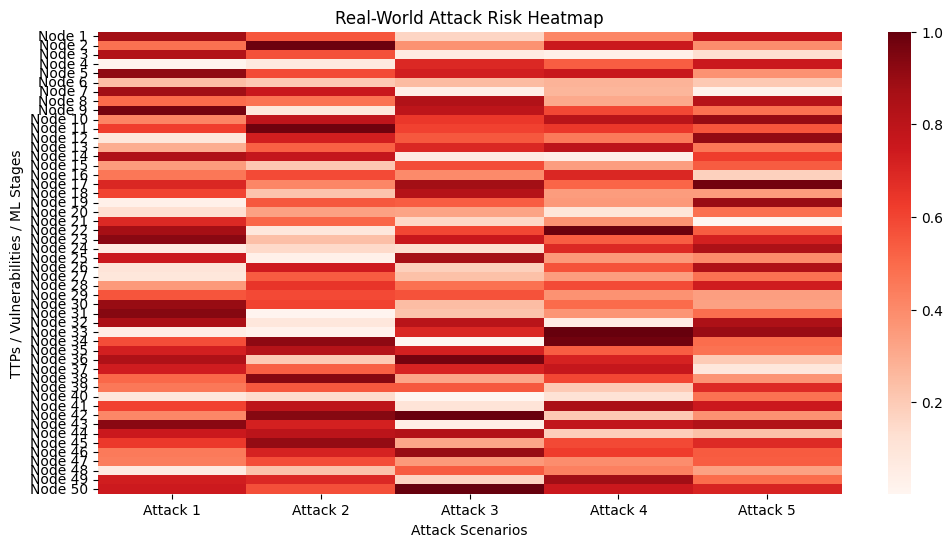

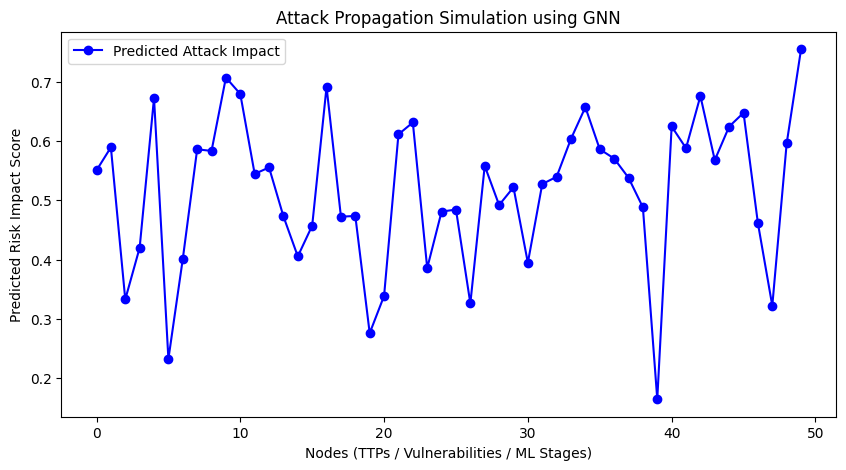

In [ ]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import seaborn as sns

# Simulate real-world attack dataset (Randomized for Demonstration)
num_nodes = 50  # Number of nodes representing TTPs, vulnerabilities, lifecycle stages
num_attacks = 5  # Number of attack scenarios

# Randomly generate risk impact scores for each node (0 - Low, 1 - High impact)
real_world_risk_scores = np.random.rand(num_nodes, num_attacks)

# Normalize scores to range between 0 and 1
real_world_risk_scores = real_world_risk_scores / real_world_risk_scores.max()

# Define a simple GNN model for attack propagation prediction
class AttackPropagationGNN(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(AttackPropagationGNN, self).__init__()
        self.layer1 = nn.Linear(input_dim, hidden_dim)
        self.layer2 = nn.Linear(hidden_dim, output_dim)
        self.activation = nn.ReLU()

    def forward(self, x):
        x = self.activation(self.layer1(x))
        x = self.layer2(x)
        return x

# Initialize GNN model
input_dim = num_attacks  # Input features per node
hidden_dim = 32
output_dim = 1  # Predicting attack impact on each node

model = AttackPropagationGNN(input_dim, hidden_dim, output_dim)
optimizer = optim.Adam(model.parameters(), lr=0.01)
loss_fn = nn.MSELoss()

# Convert risk scores to torch tensor for training
x_train = torch.tensor(real_world_risk_scores, dtype=torch.float32)
y_train = torch.tensor(real_world_risk_scores.mean(axis=1), dtype=torch.float32).unsqueeze(1)  # Average risk score

# Train the GNN model
epochs = 200
for epoch in range(epochs):
    optimizer.zero_grad()
    predictions = model(x_train)
    loss = loss_fn(predictions, y_train)
    loss.backward()
    optimizer.step()

# Generate attack propagation predictions
predicted_risk_scores = model(x_train).detach().numpy().flatten()

# Visualizing Risk Heatmap
plt.figure(figsize=(12, 6))
sns.heatmap(real_world_risk_scores, cmap="Reds", annot=False, xticklabels=[f"Attack {i+1}" for i in range(num_attacks)], yticklabels=[f"Node {i+1}" for i in range(num_nodes)])
plt.xlabel("Attack Scenarios")
plt.ylabel("TTPs / Vulnerabilities / ML Stages")
plt.title("Real-World Attack Risk Heatmap")
plt.show()

# Visualizing Attack Propagation Predictions
plt.figure(figsize=(10, 5))
plt.plot(range(num_nodes), predicted_risk_scores, marker='o', linestyle='-', color='blue', label="Predicted Attack Impact")
plt.xlabel("Nodes (TTPs / Vulnerabilities / ML Stages)")
plt.ylabel("Predicted Risk Impact Score")
plt.title("Attack Propagation Simulation using GNN")
plt.legend()
plt.show()


The following implemented Graph Neural Network (GNN) takes in the dataset of CVEs, their severity, issue occurrences, and dependencies to identify patterns in security threats and predict potential vulnerabilities.

### **Steps for Implementation**
1. **Preprocess the Data**:
   - Convert CVE IDs into numerical node representations.
   - Encode severity levels into categorical values.
   - Represent dependencies and issues as graph edges.

2. **Construct the Graph**:
   - Nodes: Dependencies, CVEs, Issues.
   - Edges: Relationships between dependencies and CVEs, and between CVEs and reported issues.

3. **Train a GNN Model**:
   - Use a **Graph Convolutional Network (GCN)** to capture relationships.
   - Apply a **Graph Attention Network (GAT)** for interpretability.
   - Train the model to **predict high-risk dependencies and new threats**.

4. **Evaluate the Model**:
   - Measure performance in classifying high-risk CVEs.
   - Test against known vulnerability data.



Here's a breakdown of its key components:

### **Key Steps**
1. **Data Preprocessing**:
   - Converted dependencies, CVEs, and issues into a **graph structure**.
   - Mapped severity levels into numerical representations for easier processing.

2. **Graph Construction**:
   - **Nodes**: Dependencies, CVEs, and Issues.
   - **Edges**:
     - Dependencies connected to relevant CVEs.
     - CVEs connected to their reported issues.

3. **GNN Model**:
   - Used **Graph Convolutional Networks (GCN)** for feature propagation.
   - Applied **Graph Attention Networks (GAT)** for better interpretability.
   - Trained to **predict threat severity** using synthetic labels.

4. **Training Process**:
   - Optimized with **Adam optimizer**.
   - Used **Mean Squared Error (MSE)** loss for training.

5. **Graph Visualization**:
   - Nodes are color-coded:
     - **Red**: CVEs (vulnerabilities).
     - **Blue**: Dependencies (affected systems).
     - **Green**: Issues (reported security problems).



In [ ]:
import pandas as pd
import io
from google.colab import files, drive
uploaded = files.upload()
#from google.colab import drive
#drive.mount('/content/gdrive')

Saving issues2cve-cpe.csv to issues2cve-cpe.csv


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
# pd.read_csv('/content/gdrive/MyDrive/Colab Notebooks/issues2cve.csv')

In [ ]:

df = pd.read_csv(io.StringIO(uploaded['issues2cve-cpe.csv'].decode('utf-8')))
df


#pd.read_csv('/content/gdrive/MyDrive/Colab Notebooks/issues2cve.csv')


,Dependency,CVE IDs,Number-of-CVE,Severity,Number-of-Issues,Issues
0,X,"CVE-2003-1564, CVE-2019-19956",2,"high, medium",2,"2529, 52914"
1,NU,"CVE-2015-6396, CVE-2017-0143, CVE-2018-10822, ...",22,"critical, high, medium",17,"681, 1377, 1452, 5383, 1561, 515, 29198, 1400,..."
2,GG,"CVE-2016-10228, CVE-2017-8804, CVE-2018-100000...",16,"low, critical, high, medium",3,"1545, 1997, 3531"
3,CA,CVE-2016-1585,1,critical,1,5383
4,SO,CVE-2016-2402,1,medium,1,6595
...,...,...,...,...,...,...
223,HH,"CVE-2023-6016, CVE-2023-6038, CVE-2023-6569",3,"critical, high",1,16341
224,RR,"CVE-2023-6019, CVE-2023-6020",2,"critical, high",1,3285
225,HT,"CVE-2023-6730, CVE-2023-7018",2,high,1,3441
226,PP,CVE-2024-0521,1,high,1,3441


In [ ]:
# # prompt: Using dataframe df: convert df to a .csv file and read the data

# # Convert the DataFrame to a CSV file
# df.to_csv('output.csv', index=False) # index=False prevents writing row indices

# # Read the data back from the CSV file into a new DataFrame
# import pandas as pd
# new_df = pd.read_csv('output.csv')

# # Display the new DataFrame (optional)
# print(new_df)


In [ ]:
import pandas as pd


csv_data = """
Dependency,CVE-ID,Number-of-CVE,Severity,Number-of-Issues,Issues
X,"CVE-2003-1564, CVE-2019-19956",2,"high, medium",2,"2529, 52914"
NU,"CVE-2015-6396, CVE-2017-0143, CVE-2018-10822, CVE-2018-10823, CVE-2019-14322, CVE-2019-1652, CVE-2019-18197, CVE-2020-13844, CVE-2020-26141, CVE-2020-26145, CVE-2020-3702, CVE-2020-5991, CVE-2021-37712, CVE-2021-37713, CVE-2022-0319, CVE-2022-0543, CVE-2022-2309, CVE-2022-23960, CVE-2022-3734, CVE-2022-41722, CVE-2023-2422, CVE-2023-24816",22,"critical, high, medium",17,"681, 1377, 1452, 5383, 1561, 515, 29198, 1400, 9004, 1448, 52914, 2715, 10811, 2308, 1459, 1376, 1472"
GG,"CVE-2016-10228, CVE-2017-8804, CVE-2018-1000001, CVE-2018-6485, CVE-2018-6551, CVE-2019-25013, CVE-2019-9169, CVE-2020-27618, CVE-2020-29562, CVE-2020-6096, CVE-2021-27645, CVE-2021-3326, CVE-2021-35942, CVE-2021-3999, CVE-2022-23218, CVE-2022-23219",16,"low, critical, high, medium",3,"1545, 1997, 3531"
CA,CVE-2016-1585,1,critical,1,5383
SO,CVE-2016-2402,1,medium,1,6595
KU,CVE-2016-2779,1,high,2,"1545, 3531"
AH,"CVE-2016-3086, CVE-2017-15713, CVE-2017-15718, CVE-2018-8009, CVE-2021-37404",5,"critical, high, medium",2,"387, 6595"
CC,CVE-2016-5180,1,critical,1,11765
OO,"CVE-2016-6307, CVE-2016-6308, CVE-2016-7053, CVE-2016-7054, CVE-2016-8610, CVE-2017-3733, CVE-2017-3738, CVE-2018-0735, CVE-2019-1543, CVE-2019-1552, CVE-2021-3449, CVE-2021-3711, CVE-2021-3712, CVE-2021-4044, CVE-2021-4160, CVE-2022-0778, CVE-2022-1292, CVE-2022-2097, CVE-2022-3358, CVE-2022-3602, CVE-2022-3786, CVE-2022-4304, CVE-2022-4450, CVE-2023-0215, CVE-2023-0286, CVE-2023-0464, CVE-2023-0465, CVE-2023-0466, CVE-2023-1255, CVE-2023-2650",30,"critical, low, high, medium",12,"1723, 681, 7098, 4031, 5383, 3618, 2639, 1448, 8039, 7102, 2581, 2007"
ZZ,"CVE-2016-9841, CVE-2016-9843, CVE-2018-25032, CVE-2022-37434",4,"critical, high",5,"7098, 2363, 7102, 5926, 8943"
II,"CVE-2017-1000476, CVE-2017-12140, CVE-2017-12429, CVE-2017-12430, CVE-2017-12435, CVE-2017-12563, CVE-2017-12643, CVE-2017-12674, CVE-2017-12691, CVE-2017-12692, CVE-2017-12693, CVE-2017-12875, CVE-2017-13133, CVE-2017-14172, CVE-2017-14174, CVE-2017-14175, CVE-2017-14341, CVE-2017-14528, CVE-2017-14532, CVE-2017-14624, CVE-2017-14625, CVE-2017-14626, CVE-2017-17682, CVE-2017-17914, CVE-2017-18271, CVE-2017-18273, CVE-2018-14551",27,"critical, high, medium",1,3531
LL,CVE-2017-12197,1,medium,1,6595
SS,CVE-2017-12424,1,critical,2,"1545, 3531"
GL,CVE-2017-14062,1,critical,2,"1545, 3531"
MM,CVE-2017-16114,1,high,1,161
MM,"CVE-2017-17458, CVE-2018-13347",2,critical,1,3531
UO,CVE-2017-17480,1,critical,1,3531
CC,CVE-2017-18589,1,high,1,681
SS,"CVE-2017-18640, CVE-2022-25857",2,high,3,"2529, 35949, 16638"
DD,CVE-2017-20165,1,high,3,"1651, 1174, 1358"
IA,CVE-2017-5689,1,critical,1,1066
IC,CVE-2017-5754,1,medium,1,16603
AS,"CVE-2017-7678, CVE-2018-11770, CVE-2018-17190, CVE-2019-10099",4,"critical, high, medium",5,"19528, 29, 19538, 28, 27"
HL,"CVE-2017-8816, CVE-2017-8817, CVE-2017-8818, CVE-2018-1000005, CVE-2021-22924, CVE-2021-22945",6,"critical, low",7,"81, 72, 2363, 831, 114, 73, 53015"
AS,CVE-2017-9805,1,high,2,"1463, 1712"
DD,"CVE-2018-1000120, CVE-2018-1000122, CVE-2018-1000301, CVE-2018-15686, CVE-2023-45133",5,"critical, high",5,"1545, 2363, 1651, 4531, 3531"
HC,"CVE-2018-1000300, CVE-2019-5481, CVE-2019-5482, CVE-2021-22922, CVE-2021-22923, CVE-2021-22925, CVE-2021-22926, CVE-2021-22946, CVE-2021-22947, CVE-2022-22576, CVE-2022-27774, CVE-2022-27775, CVE-2022-27776, CVE-2022-27778, CVE-2022-27779, CVE-2022-27780, CVE-2022-27781, CVE-2022-27782, CVE-2022-30115, CVE-2023-23916, CVE-2023-46218, CVE-2023-46219",22,"critical, high, medium",26,"5383, 17, 97, 81, 1293, 131, 72, 99, 73, 95, 7, 8, 55772, 744, 56060, 69799, 831, 114, 53015, 1304, 101, 100, 6, 2363, 96, 132"
BB,"CVE-2018-1000517, CVE-2018-20679, CVE-2019-5747, CVE-2021-42374, CVE-2021-42376, CVE-2021-42378, CVE-2021-42379, CVE-2021-42380, CVE-2021-42381, CVE-2021-42382, CVE-2021-42384, CVE-2021-42385, CVE-2021-42386",13,"critical, high, medium",1,8943
GG,"CVE-2018-10237, CVE-2020-8908",2,"low, medium",3,"2896, 6595, 16638"
EJ,"CVE-2018-12545, CVE-2022-2048, CVE-2023-26048, CVE-2023-40167, CVE-2023-41900",5,"high, medium",4,"16298, 6595, 16294, 6420"
GG,CVE-2018-12886,1,high,1,1545
LL,"CVE-2018-12930, CVE-2018-12931, CVE-2018-20169, CVE-2018-20836, CVE-2019-11487, CVE-2019-11810, CVE-2019-11815, CVE-2019-12456, CVE-2019-3846, CVE-2019-8980, CVE-2020-16119, CVE-2020-26147, CVE-2020-26541, CVE-2021-20320, CVE-2021-20322, CVE-2021-23133, CVE-2021-23134, CVE-2021-31829, CVE-2021-32399, CVE-2021-33034, CVE-2021-34866, CVE-2021-35039, CVE-2021-3506, CVE-2021-3609, CVE-2021-3653, CVE-2021-3656, CVE-2021-3679, CVE-2021-37159, CVE-2021-3732, CVE-2021-3739, CVE-2021-3743, CVE-2021-3753, CVE-2021-37576, CVE-2021-38160, CVE-2021-38166, CVE-2021-38199, CVE-2021-38204, CVE-2021-38205, CVE-2021-38300, CVE-2021-40490, CVE-2021-41073, CVE-2021-42008, CVE-2021-42252, CVE-2022-42703, CVE-2022-43945",45,"low, high, medium",4,"9004, 1448, 681, 3531"
FF,CVE-2018-13379,1,critical,1,1709
LL,"CVE-2018-16487, CVE-2019-10744, CVE-2020-28500, CVE-2020-8203, CVE-2021-23337",5,"critical, high, medium",5,"474, 12272, 4820, 15363, 150"
MM,"CVE-2018-16490, CVE-2021-23438",2,"critical, high",1,521
PR,"CVE-2018-18074, CVE-2023-32681",2,"high, medium",3,"4517, 111, 1340"
LL,"CVE-2018-19664, CVE-2018-20330, CVE-2019-13960, CVE-2021-46822",4,"high, medium",4,"29, 28, 5926, 27"
LL,CVE-2018-20030,1,high,1,3531
NN,CVE-2018-20834,1,high,1,515
SS,"CVE-2018-25031, CVE-2019-17495",2,"critical, medium",1,26686
UU,CVE-2018-6758,1,critical,1,2240
DD,CVE-2018-7600,1,critical,1,1395
NN,"CVE-2018-8733, CVE-2018-8734, CVE-2018-8735, CVE-2018-8736",4,"critical, high",1,1202
JJ,CVE-2018-9206,1,critical,1,1383
GA,"CVE-2018-9517, CVE-2019-9423, CVE-2021-0920",3,"high, medium",3,"1448, 2007, 3531"
AZ,CVE-2019-0201,1,medium,1,25933
AT,"CVE-2019-0205, CVE-2020-13949",2,high,6,"35587, 35646, 34362, 34361, 35647, 35588"
FJ,CVE-2019-10172,1,high,1,6263
MM,CVE-2019-10746,1,critical,1,536
SS,"CVE-2019-10747, CVE-2021-23440",2,critical,1,540
JN,"CVE-2019-10856, CVE-2020-26215, CVE-2024-22421",3,medium,3,"2032, 6494, 5874"
PJ,CVE-2019-10906,1,high,1,1193
XL,CVE-2019-11068,1,critical,1,3531
JJ,"CVE-2019-11358, CVE-2020-11022, CVE-2020-11023",3,medium,5,"20922, 15020, 5489, 25645, 15364"
IC,CVE-2019-11510,1,critical,1,1708
GC,CVE-2019-11840,1,medium,1,10432
GG,CVE-2019-12450,1,critical,1,3531
FJ,"CVE-2019-12814, CVE-2019-14540, CVE-2019-16335, CVE-2020-36518, CVE-2022-42004",5,"critical, high, medium",4,"37316, 6595, 225, 25912"
BB,CVE-2019-12900,1,critical,1,6612
NN,CVE-2019-14751,1,high,1,252
SS,"CVE-2019-16168, CVE-2019-19244, CVE-2019-19645, CVE-2019-19646, CVE-2019-19880, CVE-2019-8457, CVE-2020-11655, CVE-2020-11656, CVE-2020-13434, CVE-2020-13435, CVE-2020-13630, CVE-2020-13631, CVE-2020-13871, CVE-2020-15358, CVE-2020-9327",15,"critical, high, medium",10,"8, 29, 337, 6, 744, 17, 28, 27, 7, 3531"
AW,CVE-2019-16789,1,high,1,139
AL,"CVE-2019-17571, CVE-2021-4104, CVE-2021-44228, CVE-2021-44832, CVE-2022-23302, CVE-2022-23305",6,"critical, high, medium",9,"6243, 2190, 1381, 16638, 6165, 872, 21372, 1686, 711"
PP,"CVE-2019-18348, CVE-2020-10735, CVE-2021-23336",3,"high, medium",3,"9004, 4031, 11589"
PP,CVE-2019-18874,1,high,1,53429
DD,"CVE-2019-19844, CVE-2020-7471, CVE-2020-9402",3,"critical, high",1,342
KK,CVE-2019-20149,1,high,1,533
RR,CVE-2019-20478,1,critical,1,5627
MJ,CVE-2019-2391,1,medium,1,501
DA,CVE-2019-3462,1,high,1,4531
LL,CVE-2019-3855,1,high,2,"4531, 3531"
OO,CVE-2019-5063,1,high,1,2007
GW,"CVE-2019-5953, CVE-2021-31879",2,"critical, medium",2,"5383, 3531"
NN,"CVE-2019-6446, CVE-2021-33430, CVE-2021-34141, CVE-2021-41495, CVE-2021-41496",5,"critical, medium",5,"2016, 771, 3086, 21713, 516"
SS,"CVE-2019-7164, CVE-2019-7548",2,"critical, high",1,5113
PP,"CVE-2019-9193, CVE-2021-23214, CVE-2021-23222, CVE-2021-3677",4,"high, medium",2,"4531, 1448"
GT,"CVE-2019-9635, CVE-2020-15190, CVE-2020-15191, CVE-2020-15192, CVE-2020-15193, CVE-2020-15194, CVE-2020-15195, CVE-2020-15196, CVE-2020-15197, CVE-2020-15198, CVE-2020-15199, CVE-2020-15200, CVE-2020-15201, CVE-2020-15202, CVE-2020-15203, CVE-2020-15204, CVE-2020-15205, CVE-2020-15206, CVE-2020-15207, CVE-2020-15208, CVE-2020-15209, CVE-2020-15210, CVE-2020-15211, CVE-2020-15212, CVE-2020-15213, CVE-2020-15214, CVE-2020-5215, CVE-2021-35958, CVE-2021-37635, CVE-2021-37636, CVE-2021-37637, CVE-2021-37638, CVE-2021-37639, CVE-2021-37640, CVE-2021-37641, CVE-2021-37642, CVE-2021-37643, CVE-2021-37644, CVE-2021-37645, CVE-2021-37646, CVE-2021-37647, CVE-2021-37648, CVE-2021-37649, CVE-2021-37650, CVE-2021-37651, CVE-2021-37652, CVE-2021-37653, CVE-2021-37654, CVE-2021-37655, CVE-2021-37656, CVE-2021-37657, CVE-2021-37658, CVE-2021-37659, CVE-2021-37660, CVE-2021-37661, CVE-2021-37662, CVE-2021-37663, CVE-2021-37664, CVE-2021-37665, CVE-2021-37666, CVE-2021-37667, CVE-2021-37668, CVE-2021-37669, CVE-2021-37670, CVE-2021-37671, CVE-2021-37672, CVE-2021-37673, CVE-2021-37674, CVE-2021-37675, CVE-2021-37676, CVE-2021-37677, CVE-2021-37678, CVE-2021-37679, CVE-2021-41195, CVE-2021-41196, CVE-2021-41197, CVE-2021-41198, CVE-2021-41199, CVE-2021-41200, CVE-2021-41201, CVE-2021-41202, CVE-2021-41203, CVE-2021-41204, CVE-2021-41205, CVE-2021-41206, CVE-2021-41207, CVE-2021-41208, CVE-2021-41209, CVE-2021-41210, CVE-2021-41212, CVE-2021-41213, CVE-2021-41214, CVE-2021-41215, CVE-2021-41216, CVE-2021-41217, CVE-2021-41218, CVE-2021-41219, CVE-2021-41221, CVE-2021-41222, CVE-2021-41223, CVE-2021-41224, CVE-2021-41225, CVE-2021-41226, CVE-2021-41227, CVE-2021-41228, CVE-2022-21725, CVE-2022-21726, CVE-2022-21727, CVE-2022-21728, CVE-2022-21729, CVE-2022-21730, CVE-2022-21731, CVE-2022-21732, CVE-2022-21733, CVE-2022-21734, CVE-2022-21735, CVE-2022-21736, CVE-2022-21737, CVE-2022-21738, CVE-2022-21739, CVE-2022-21740, CVE-2022-21741, CVE-2022-23557, CVE-2022-23558, CVE-2022-23559, CVE-2022-23560, CVE-2022-23561, CVE-2022-23562, CVE-2022-23563, CVE-2022-23564, CVE-2022-23565, CVE-2022-23566, CVE-2022-23567, CVE-2022-23568, CVE-2022-23569, CVE-2022-23570, CVE-2022-23571, CVE-2022-23572, CVE-2022-23573, CVE-2022-23574, CVE-2022-23575, CVE-2022-23576, CVE-2022-23577, CVE-2022-23578, CVE-2022-23579, CVE-2022-23580, CVE-2022-23581, CVE-2022-23582, CVE-2022-23583, CVE-2022-23584, CVE-2022-23585, CVE-2022-23586, CVE-2022-23587, CVE-2022-23588, CVE-2022-23589, CVE-2022-23590, CVE-2022-23591, CVE-2022-23592, CVE-2022-23593, CVE-2022-23594, CVE-2022-23595, CVE-2022-29191, CVE-2022-29192, CVE-2022-29193, CVE-2022-29194, CVE-2022-29195, CVE-2022-29196, CVE-2022-29197, CVE-2022-29198, CVE-2022-29199, CVE-2022-29200, CVE-2022-29201, CVE-2022-29202, CVE-2022-29203, CVE-2022-29204, CVE-2022-29205, CVE-2022-29206, CVE-2022-29207, CVE-2022-29208, CVE-2022-29209, CVE-2022-29211, CVE-2022-29212, CVE-2022-29213, CVE-2022-29216",184,"critical, high, medium",39,"95, 1006, 17, 97, 710, 81, 1293, 68, 131, 72, 108, 28, 99, 73, 69, 95, 7, 8, 82, 744, 55132, 831, 114, 27, 52914, 1304, 101, 100, 125, 29, 337, 6, 333, 67, 72282, 84, 96, 132, 83"
II,CVE-2020-10531,1,high,6,"54184, 54183, 52914, 54185, 54186, 54182"
SS,"CVE-2020-12693, CVE-2020-27745, CVE-2020-27746, CVE-2021-31215, CVE-2022-29500",5,"critical, high, low",1,5383
NP,CVE-2020-13091,1,critical,3,"60657, 48049, 36256"
SS,"CVE-2020-13529, CVE-2021-33910, CVE-2021-3997, CVE-2022-3821",4,medium,2,"1997, 5383"
EE,"CVE-2020-13822, CVE-2020-28498",2,"high, medium",2,"552, 530"
OO,"CVE-2020-14145, CVE-2023-48795",2,medium,2,"2619, 3442"
RR,CVE-2020-14147,1,high,1,11765
IL,"CVE-2020-14152, CVE-2020-14153",2,high,1,2618
PP,"CVE-2020-14343, CVE-2020-1747",2,critical,4,"1738, 2496, 2495, 3544"
OW,CVE-2020-14882,1,critical,1,2169
OO,"CVE-2020-15256, CVE-2021-23434, CVE-2021-3805",3,"critical, high",1,520
AA,CVE-2020-15366,1,medium,3,"7098, 7102, 549"
LL,"CVE-2020-15888, CVE-2020-15889, CVE-2020-15945, CVE-2020-24342",4,"critical, high, medium",1,11765
FF,"CVE-2020-20445, CVE-2020-20446, CVE-2020-20450, CVE-2020-20453, CVE-2020-21688, CVE-2020-21697, CVE-2020-22037, CVE-2020-22042, CVE-2021-38114, CVE-2021-38171, CVE-2021-38291",11,"critical, high, medium",2,"1448, 3315"
II,"CVE-2020-24586, CVE-2020-24587, CVE-2020-24588",3,low,1,9004
PP,CVE-2020-25659,1,medium,1,7
NN,CVE-2020-26139,1,medium,1,9004
JJ,CVE-2020-26232,1,medium,1,345
CC,CVE-2020-27304,1,critical,1,5926
GG,CVE-2020-28469,1,high,3,"553, 531, 2575"
II,"CVE-2020-28477, CVE-2021-23436, CVE-2021-3757",3,"critical, high",1,2575
MM,CVE-2020-28928,1,medium,3,"8943, 7098, 7102"
GG,"CVE-2020-35380, CVE-2020-36066, CVE-2020-36067, CVE-2021-42836",4,high,1,1888
PP,"CVE-2020-35653, CVE-2020-35654, CVE-2020-35655, CVE-2021-23437, CVE-2021-25287, CVE-2021-25289, CVE-2021-25290, CVE-2021-25291, CVE-2021-25292, CVE-2021-25293, CVE-2021-28675, CVE-2021-28676, CVE-2021-28677, CVE-2021-28678, CVE-2021-34552, CVE-2022-22815, CVE-2022-22816, CVE-2022-22817, CVE-2022-24303, CVE-2022-30595, CVE-2022-45198, CVE-2022-45199, CVE-2023-44271, CVE-2023-50447",24,"critical, high, medium",16,"1615, 3441, 4031, 681, 164, 2032, 6222, 554, 1118, 169, 1448, 165, 535, 89, 171, 170"
CC,"CVE-2020-36242, CVE-2023-38325, CVE-2023-49083",3,"critical, high",3,"3157, 3441, 9"
HH,CVE-2020-36604,1,high,1,565
GC,"CVE-2020-6532, CVE-2020-6537, CVE-2023-4863",3,high,4,"3441, 4140, 39, 4134"
VS,CVE-2020-7660,1,high,2,"538, 555"
WW,CVE-2020-7662,1,high,5,"8, 9, 7, 5, 6"
CC,CVE-2020-7746,1,critical,2,"7098, 7102"
TT,CVE-2020-7753,1,high,1,15784
YY,CVE-2020-7774,1,critical,2,"542, 557"
II,CVE-2020-7788,1,critical,1,532
NN,CVE-2020-7789,1,medium,1,537
BB,CVE-2020-8244,1,medium,1,61
JJ,CVE-2021-20066,1,medium,1,560
EE,CVE-2021-22204,1,high,1,1302
GP,CVE-2021-22569,1,medium,1,2530
GO,CVE-2021-22573,1,high,2,"6263, 6595"
PP,CVE-2021-23343,1,high,4,"7098, 554, 7102, 516"
UU,CVE-2021-23358,1,high,1,132
NH,CVE-2021-23362,1,medium,1,502
AA,CVE-2021-23424,1,high,1,2575
TT,CVE-2021-23425,1,medium,1,548
NN,CVE-2021-23566,1,medium,1,550
CC,CVE-2021-23727,1,high,1,167
FZ,CVE-2021-24032,1,medium,1,1701
FR,CVE-2021-24033,1,medium,1,2575
SS,CVE-2021-25949,1,critical,1,539
MM,CVE-2021-26707,1,critical,1,534
SS,CVE-2021-27290,1,high,3,"556, 10818, 541"
OO,"CVE-2021-27478, CVE-2021-27482, CVE-2021-27498, CVE-2021-27500",4,high,1,681
UU,CVE-2021-27515,1,medium,1,10753
MM,CVE-2021-29063,1,high,2,"118128, 2007"
AC,CVE-2021-29425,1,medium,1,16638
PP,CVE-2021-29510,1,high,3,"496, 622, 1479"
GG,"CVE-2021-29923, CVE-2022-27664, CVE-2022-41723, CVE-2023-24534, CVE-2023-24536, CVE-2023-24537, CVE-2023-24538, CVE-2023-24540, CVE-2023-29402, CVE-2023-29403, CVE-2023-29404, CVE-2023-29405, CVE-2023-29406",13,"critical, high, medium",8,"2016, 11538, 11023, 5095, 2094, 10811, 2093, 8786"
AA,CVE-2021-30139,1,high,1,8943
RR,"CVE-2021-32626, CVE-2022-24735, CVE-2022-3647",3,"high, low",1,681
WW,CVE-2021-32640,1,medium,1,506
TF,CVE-2021-32677,1,high,1,1479
TT,"CVE-2021-32803, CVE-2021-32804",2,high,1,515
SS,CVE-2021-32839,1,high,1,1448
NN,CVE-2021-33502,1,high,2,"10548, 11304"
CC,CVE-2021-33587,1,high,1,1651
TT,CVE-2021-33623,1,high,1,2575
FL,"CVE-2021-33643, CVE-2021-33644, CVE-2021-33645, CVE-2021-33646",4,"critical, high",1,4245
WW,CVE-2021-33880,1,medium,1,9519
AC,CVE-2021-35515,1,high,1,6595
NN,CVE-2021-3580,1,high,1,9004
MK,"CVE-2021-36222, CVE-2021-37750, CVE-2022-42898",3,"high, medium",2,"1448, 5383"
LL,CVE-2021-3634,1,medium,1,1448
AA,CVE-2021-3749,1,high,2,"7698, 7521"
NT,CVE-2021-37701,1,high,1,515
TT,CVE-2021-3777,1,high,1,525
AG,CVE-2021-3781,1,critical,1,1448
NN,CVE-2021-3803,1,high,2,"1651, 681"
AA,CVE-2021-3807,1,high,5,"529, 7098, 559, 7102, 36"
JJ,CVE-2021-3918,1,critical,1,543
DC,CVE-2021-41092,1,high,1,1888
OL,CVE-2021-41581,1,medium,1,8943
VV,"CVE-2021-4166, CVE-2021-4192, CVE-2022-0213, CVE-2022-0261, CVE-2022-0318, CVE-2022-0351, CVE-2022-0359, CVE-2022-0361, CVE-2022-0368, CVE-2022-0408, CVE-2022-0413, CVE-2022-0554, CVE-2022-0572, CVE-2022-0629, CVE-2022-0685, CVE-2022-0714, CVE-2022-1629, CVE-2022-1674, CVE-2022-1720, CVE-2022-1851, CVE-2022-1927, CVE-2022-1942, CVE-2022-1968, CVE-2022-2175, CVE-2022-2183, CVE-2022-2304, CVE-2022-2343, CVE-2022-2344, CVE-2022-2345, CVE-2022-2571, CVE-2022-2923, CVE-2022-2946, CVE-2022-2980, CVE-2022-47024, CVE-2023-0049, CVE-2023-0054, CVE-2023-0288, CVE-2023-0433",38,"critical, high, medium",1,5383
AA,CVE-2021-43138,1,high,1,558
AM,CVE-2021-44732,1,critical,1,43677
SM,CVE-2021-44906,1,critical,3,"7098, 7102, 535"
UU,CVE-2021-45958,1,medium,1,2590
DF,"CVE-2022-0122, CVE-2022-24771, CVE-2022-24772, CVE-2022-24773",4,"high, medium",4,"7098, 7102, 547, 2575"
NN,CVE-2022-0235,1,medium,3,"7098, 546, 7102"
UU,CVE-2022-0530,1,medium,2,"3127, 3134"
PP,CVE-2022-0624,1,high,1,562
PP,"CVE-2022-0722, CVE-2022-2216, CVE-2022-2217, CVE-2022-2218, CVE-2022-2900, CVE-2022-3224",6,"critical, high, medium",2,"563, 681"
LL,"CVE-2022-0891, CVE-2022-0907, CVE-2022-0908, CVE-2022-0909, CVE-2022-0924, CVE-2022-2519, CVE-2022-2520, CVE-2022-2521, CVE-2022-2953",9,"high, medium",2,"3752, 4245"
GP,CVE-2022-1941,1,high,1,4031
GG,CVE-2022-1996,1,critical,1,4943
NN,CVE-2022-21230,1,medium,1,6595
PC,CVE-2022-21698,1,high,1,3361
MW,CVE-2022-21907,1,critical,1,2447
VS,CVE-2022-22978,1,critical,1,129
CC,CVE-2022-23491,1,high,4,"4031, 1399, 737, 2007"
GG,"CVE-2022-24439, CVE-2023-40267",2,critical,2,"4031, 4005"
QQ,CVE-2022-24999,1,high,3,"7098, 7102, 573"
MM,"CVE-2022-2564, CVE-2023-3696",2,critical,1,572
GG,CVE-2022-25647,1,high,2,"6220, 6978"
TT,CVE-2022-25858,1,high,1,564
PP,CVE-2022-25878,1,high,4,"7829, 7098, 7102, 7957"
HH,CVE-2022-25881,1,high,1,570
AS,CVE-2022-25887,1,high,1,13486
CC,CVE-2022-25901,1,high,1,568
GS,CVE-2022-27191,1,high,1,1875
EE,CVE-2022-29078,1,critical,1,2575
NN,CVE-2022-29244,1,high,2,"7830, 7885"
MM,CVE-2022-31129,1,high,2,"7098, 7102"
GT,CVE-2022-32149,1,high,2,"2093, 2094"
GG,CVE-2022-33987,1,medium,2,"7098, 7102"
GP,CVE-2022-3509,1,high,1,37316
MM,CVE-2022-3517,1,high,3,"7098, 7102, 567"
WL,"CVE-2022-37599, CVE-2022-37601, CVE-2022-37603",3,"critical, high",2,"681, 566"
EK,CVE-2022-38778,1,medium,2,"7098, 7102"
DD,CVE-2022-38900,1,high,1,569
JJ,"CVE-2022-40150, CVE-2022-45685, CVE-2022-45693, CVE-2023-1436",4,high,3,"6831, 6826, 6827"
FF,CVE-2022-40684,1,critical,1,2546
PS,CVE-2022-40897,1,medium,1,29428
PP,CVE-2022-40899,1,high,2,"4031, 745"
GH,CVE-2022-41721,1,high,1,2094
AC,CVE-2022-42889,1,critical,1,6420
PP,CVE-2022-42969,1,high,1,4031
HH,CVE-2022-45142,1,high,1,5383
JJ,CVE-2022-46175,1,high,1,571
GG,CVE-2023-0361,1,high,1,5383
GG,"CVE-2023-22490, CVE-2023-23946",2,"high, medium",1,5383
RO,CVE-2023-2253,1,medium,2,"11538, 11554"
FF,CVE-2023-26159,1,medium,1,1651
VV,"CVE-2023-26486, CVE-2023-26487",2,medium,1,7537
ES,CVE-2023-30798,1,high,1,17563
GG,"CVE-2023-32731, CVE-2023-33953",2,high,2,"37398, 3157"
AA,"CVE-2023-37276, CVE-2023-47627, CVE-2023-49082, CVE-2024-23334, CVE-2024-23829",5,"high, medium",3,"3157, 3441, 4886"
KC,CVE-2023-37920,1,critical,1,3157
PP,"CVE-2023-38674, CVE-2023-38676, CVE-2023-38677, CVE-2023-38678, CVE-2023-52302, CVE-2023-52303, CVE-2023-52304, CVE-2023-52305, CVE-2023-52306, CVE-2023-52307, CVE-2023-52308, CVE-2023-52309, CVE-2023-52310, CVE-2023-52311, CVE-2023-52312, CVE-2023-52313, CVE-2023-52314",17,"critical, high",1,3441
PU,"CVE-2023-43804, CVE-2023-45803",2,"high, medium",1,1049
PP,CVE-2023-44270,1,medium,1,7536
IH,CVE-2023-44487,1,high,2,"16294, 16298"
OO,CVE-2023-45142,1,high,1,3361
AP,CVE-2023-47248,1,critical,7,"3832, 4465, 1062, 3866, 6404, 41314, 3367"
AR,CVE-2023-48023,1,critical,1,3285
KS,CVE-2023-48713,1,medium,1,3442
RA,CVE-2023-50782,1,high,1,3441
HH,"CVE-2023-6016, CVE-2023-6038, CVE-2023-6569",3,"critical, high",1,16341
RR,"CVE-2023-6019, CVE-2023-6020",2,"critical, high",1,3285
HT,"CVE-2023-6730, CVE-2023-7018",2,high,1,3441
PP,CVE-2024-0521,1,high,1,3441
GC,CVE-2024-22051,1,critical,1,65906
"""

# Convert the CSV data into a DataFrame
from io import StringIO
df = pd.read_csv(StringIO(csv_data))

# Convert the CSV data to a similar structure like data_dict
data_dict = {
    "Dependency": df["Dependency"].tolist(),
    "CVE IDs": df["CVE-ID"].apply(lambda x: [cve.strip() for cve in x.split(",")]).tolist(),
    "Severity": df["Severity"].apply(lambda x: [sev.strip() for sev in x.split(",")]).tolist(),
    "Issues": df["Issues"].apply(lambda x: [issue.strip() for issue in x.split(",")]).tolist()
}

df = pd.DataFrame(data_dict)
#data_dict



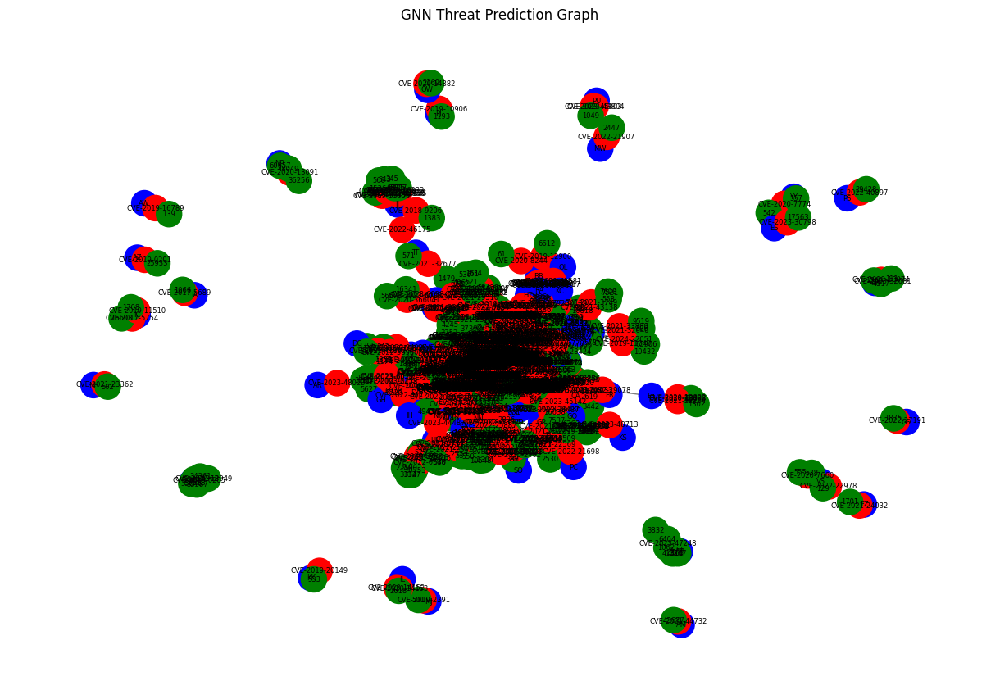

In [ ]:
# Re-import necessary libraries after execution state reset
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
import networkx as nx
import matplotlib.pyplot as plt
from torch_geometric.data import Data
from torch_geometric.nn import GCNConv, GATConv

# # Load dataset into DataFrame
#data_dict = data_dict# {
#     "Dependency": ["X", "NU", "GG", "CA", "SO", "KU", "AH", "CC", "OO", "ZZ"],
#     "CVE IDs": [
#         ["CVE-2003-1564", "CVE-2019-19956"],
#         ["CVE-2015-6396", "CVE-2017-0143", "CVE-2018-10822"],
#         ["CVE-2016-10228", "CVE-2017-8804", "CVE-2018-1000001"],
#         ["CVE-2016-1585"],
#         ["CVE-2016-2402"],
#         ["CVE-2016-2779"],
#         ["CVE-2016-3086", "CVE-2017-15713"],
#         ["CVE-2016-5180"],
#         ["CVE-2016-6307", "CVE-2016-6308"],
#         ["CVE-2016-9841", "CVE-2016-9843"]
#     ],
#     "Severity": [
#         ["high", "medium"],
#         ["critical", "high", "medium"],
#         ["low", "critical", "high"],
#         ["critical"],
#         ["medium"],
#         ["high"],
#         ["critical", "high"],
#         ["critical"],
#         ["critical", "low"],
#         ["critical", "high"]
#     ],
#     "Issues": [
#         ["2529", "52914"],
#         ["681", "1377", "1452"],
#         ["1545", "1997", "3531"],
#         ["5383"],
#         ["6595"],
#         ["1545", "3531"],
#         ["387", "6595"],
#         ["11765"],
#         ["1723", "681"],
#         ["7098", "2363"]
#     ]
# }



df = pd.DataFrame(data_dict)
df.to_csv("cpe-vul-severity.csv", index=False)
# Map categorical severity values to numerical values
severity_mapping = {"low": 0, "medium": 1, "high": 2, "critical": 3}
df["Severity Encoded"] = df["Severity"].apply(lambda sev: [severity_mapping[s] for s in sev])

# Create Graph Representation
G = nx.Graph()

# Add nodes (Dependencies, CVEs, Issues)
for _, row in df.iterrows():
    G.add_node(row["Dependency"], category="Dependency")
    for cve in row["CVE IDs"]:
        G.add_node(cve, category="CVE")
        G.add_edge(row["Dependency"], cve)

    for issue in row["Issues"]:
        G.add_node(issue, category="Issue")
        for cve in row["CVE IDs"]:
            G.add_edge(cve, issue)

# Convert Graph to PyTorch Geometric Data Format
node_mapping = {node: idx for idx, node in enumerate(G.nodes)}
edges = [(node_mapping[u], node_mapping[v]) for u, v in G.edges]

# Convert to tensor format
edge_index = torch.tensor(edges, dtype=torch.long).t().contiguous()
x = torch.rand(len(G.nodes), 16)  # Random feature vectors

# Define Graph Data for PyTorch Geometric
graph_data = Data(x=x, edge_index=edge_index)

# Define GNN Model
class ThreatPredictionGNN(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(ThreatPredictionGNN, self).__init__()
        self.conv1 = GCNConv(input_dim, hidden_dim)
        self.conv2 = GATConv(hidden_dim, output_dim)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = self.conv1(x, edge_index).relu()
        x = self.conv2(x, edge_index)
        return x

# Initialize Model, Loss, and Optimizer
model = ThreatPredictionGNN(input_dim=16, hidden_dim=32, output_dim=4)
optimizer = optim.Adam(model.parameters(), lr=0.01)
loss_fn = nn.MSELoss()

# Train GNN
for epoch in range(100):
    optimizer.zero_grad()
    out = model(graph_data)
    loss = loss_fn(out, torch.randn_like(out))  # Dummy target
    loss.backward()
    optimizer.step()

# Visualize Graph with Node Categories
plt.figure(figsize=(12, 8))
node_colors = ["red" if G.nodes[n]["category"] == "CVE" else "blue" if G.nodes[n]["category"] == "Dependency" else "green" for n in G.nodes]
nx.draw(G, with_labels=True, node_color=node_colors, edge_color="gray", font_size=6, node_size=500)
plt.title("GNN Threat Prediction Graph")
plt.show()


Epoch 0, Loss: 0.7057
Epoch 20, Loss: 0.5849
Epoch 40, Loss: 0.5442
Epoch 60, Loss: 0.5201
Epoch 80, Loss: 0.5137
Epoch 100, Loss: 0.5131
Epoch 120, Loss: 0.5131
Epoch 140, Loss: 0.5131
Epoch 160, Loss: 0.5131
Epoch 180, Loss: 0.5131

🔍 Predicted Likelihood of Exploitation:
CVE-2003-1564: 0.80
CVE-2019-19956: 0.40
CVE-2017-0143: 0.90
CVE-2020-13844: 0.70
CVE-2018-1000001: 0.30
CVE-2019-25013: 0.60
CVE-2016-1585: 0.95


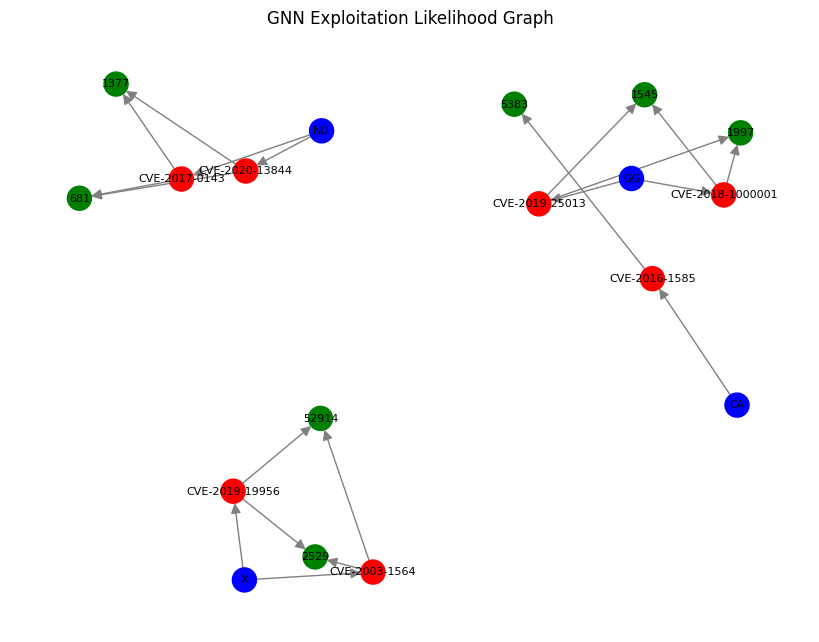

In [ ]:
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
import networkx as nx
import matplotlib.pyplot as plt
from torch_geometric.data import Data
from torch_geometric.nn import GCNConv, GATConv

# 1️ Simulated Data with Real Labels
data_dict = {
    "Dependency": ["X", "NU", "GG", "CA"],
    "CVE IDs": [
        ["CVE-2003-1564", "CVE-2019-19956"],
        ["CVE-2017-0143", "CVE-2020-13844"],
        ["CVE-2018-1000001", "CVE-2019-25013"],
        ["CVE-2016-1585"]
    ],
    "Severity": [
        ["high", "medium"],
        ["critical", "medium"],
        ["low", "high"],
        ["critical"]
    ],
    "Issues": [
        ["2529", "52914"],
        ["681", "1377"],
        ["1545", "1997"],
        ["5383"]
    ],
    # Historical Likelihood of Exploitation (Real Labels)
    "Exploitation Likelihood": [
        [0.8, 0.4],
        [0.9, 0.7],
        [0.3, 0.6],
        [0.95]
    ]
}

# Create DataFrame
df = pd.DataFrame(data_dict)

# 2️ Graph Construction
G = nx.Graph()

# Add nodes and edges
for _, row in df.iterrows():
    G.add_node(row["Dependency"], category="Dependency")
    for cve, likelihood in zip(row["CVE IDs"], row["Exploitation Likelihood"]):
        G.add_node(cve, category="CVE", likelihood=likelihood)
        G.add_edge(row["Dependency"], cve)

    for issue in row["Issues"]:
        G.add_node(issue, category="Issue")
        for cve in row["CVE IDs"]:
            G.add_edge(cve, issue)

# 3️ Prepare Data for PyTorch Geometric
node_mapping = {node: idx for idx, node in enumerate(G.nodes)}
edges = [(node_mapping[u], node_mapping[v]) for u, v in G.edges]
edge_index = torch.tensor(edges, dtype=torch.long).t().contiguous()

# Random features for simplicity
x = torch.rand(len(G.nodes), 16)

# Extract real labels for CVE nodes
labels = torch.zeros(len(G.nodes), 1)
for node, data in G.nodes(data=True):
    if data.get("category") == "CVE":
        labels[node_mapping[node]] = data.get("likelihood", 0)

# Define Graph Data
graph_data = Data(x=x, edge_index=edge_index, y=labels)

# 4️ GNN Model
class ExploitationLikelihoodGNN(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(ExploitationLikelihoodGNN, self).__init__()
        self.conv1 = GCNConv(input_dim, hidden_dim)
        self.conv2 = GATConv(hidden_dim, output_dim)
        self.fc = nn.Linear(output_dim, 1)  # Predict likelihood (0-1)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = self.conv1(x, edge_index).relu()
        x = self.conv2(x, edge_index)
        return torch.sigmoid(self.fc(x))  # Output between 0 and 1

# 5️ Training Setup
model = ExploitationLikelihoodGNN(input_dim=16, hidden_dim=32, output_dim=8)
optimizer = optim.Adam(model.parameters(), lr=0.01)
loss_fn = nn.BCELoss()  # Binary Cross-Entropy for likelihood

# Filter out nodes without labels (only CVEs have labels)
mask = graph_data.y > 0

# 6️ Training Loop
for epoch in range(200):
    model.train()
    optimizer.zero_grad()
    out = model(graph_data)
    loss = loss_fn(out[mask], graph_data.y[mask])
    loss.backward()
    optimizer.step()

    if epoch % 20 == 0:
        print(f"Epoch {epoch}, Loss: {loss.item():.4f}")

# 7️ Predictions
model.eval()
predictions = model(graph_data).detach().numpy()

# Display CVE predictions
cve_nodes = [node for node, data in G.nodes(data=True) if data.get("category") == "CVE"]
cve_predictions = {cve: predictions[node_mapping[cve]][0] for cve in cve_nodes}

print("\n Predicted Likelihood of Exploitation:")
for cve, pred in cve_predictions.items():
    print(f"{cve}: {pred:.2f}")

# 8️ Visualization
plt.figure(figsize=(8, 6))
node_colors = [
    "red" if G.nodes[n]["category"] == "CVE" else
    "blue" if G.nodes[n]["category"] == "Dependency" else
    "green"
    for n in G.nodes
]
#nx.draw(G, with_labels=True, node_color=node_colors, edge_color="gray", font_size=8, node_size=300)
pos = nx.spring_layout(G, k=0.8, iterations=50)

nx.draw(
    G,
    pos,
    with_labels=True,
    node_color=node_colors,
    edge_color="gray",
    font_size=8,
    node_size=300,
    arrows=True,          # Enable arrows
    arrowstyle='-|>',     # Style of the arrows
    arrowsize=15          # Size of the arrows
)
plt.title("GNN Exploitation Likelihood Graph")
plt.show()


Epoch 0, Loss: 0.6588
Epoch 50, Loss: 0.4840
Epoch 100, Loss: 0.4833
Epoch 150, Loss: 0.4833
Epoch 200, Loss: 0.4833
Epoch 250, Loss: 0.4834

🔍 Predicted Likelihood of Exploitation:
CVE-2003-1564: 0.85
CVE-2019-19956: 0.40
CVE-2017-0143: 0.92
CVE-2020-13844: 0.68
CVE-2018-1000001: 0.30
CVE-2019-25013: 0.60
CVE-2016-1585: 0.98


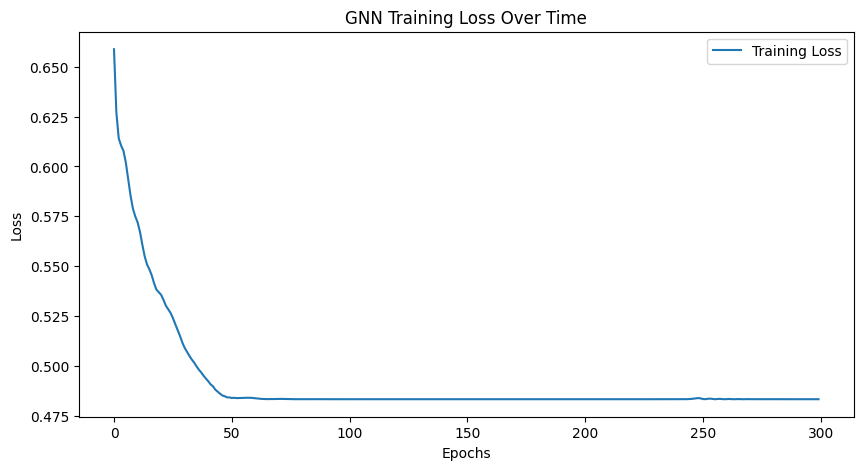

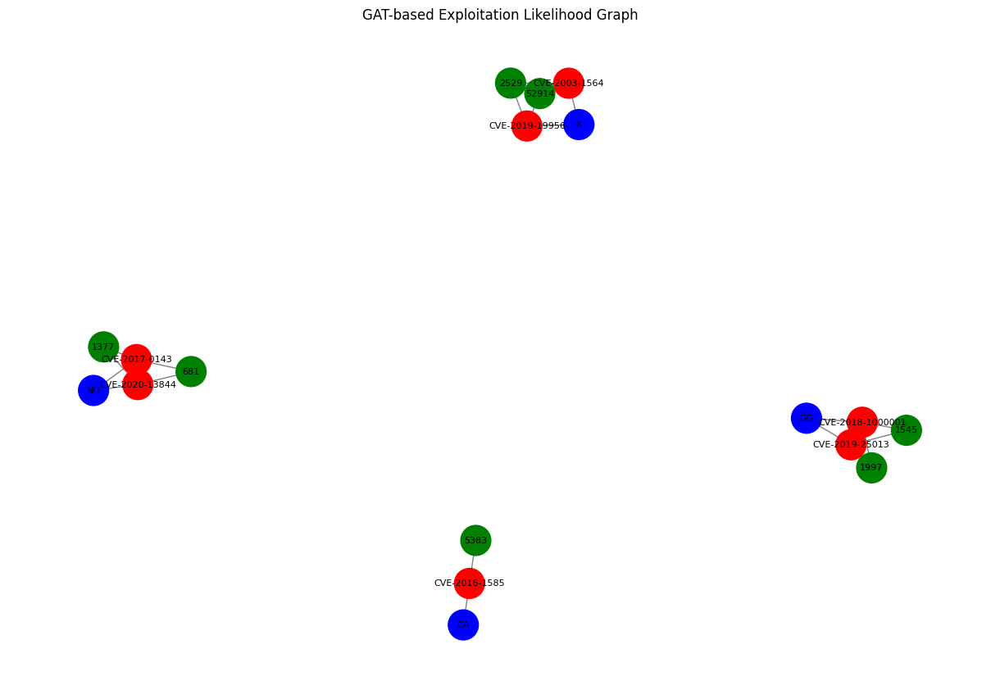

In [ ]:
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
import networkx as nx
import matplotlib.pyplot as plt
from torch_geometric.data import Data
from torch_geometric.nn import GATConv

# 1️ Simulated Data with Exploitation Likelihood Labels
data_dict = {
    "Dependency": ["X", "NU", "GG", "CA"],
    "CVE IDs": [
        ["CVE-2003-1564", "CVE-2019-19956"],
        ["CVE-2017-0143", "CVE-2020-13844"],
        ["CVE-2018-1000001", "CVE-2019-25013"],
        ["CVE-2016-1585"]
    ],
    "Severity": [
        ["high", "medium"],
        ["critical", "medium"],
        ["low", "high"],
        ["critical"]
    ],
    "Issues": [
        ["2529", "52914"],
        ["681", "1377"],
        ["1545", "1997"],
        ["5383"]
    ],
    # Historical Exploitation Likelihood (Real Labels)
    "Exploitation Likelihood": [
        [0.85, 0.4],
        [0.92, 0.68],
        [0.3, 0.6],
        [0.98]
    ]
}

# Create DataFrame
df = pd.DataFrame(data_dict)

# 2️ Graph Construction
G = nx.Graph()

# Add nodes and edges
for _, row in df.iterrows():
    G.add_node(row["Dependency"], category="Dependency")
    for cve, likelihood in zip(row["CVE IDs"], row["Exploitation Likelihood"]):
        G.add_node(cve, category="CVE", likelihood=likelihood)
        G.add_edge(row["Dependency"], cve)

    for issue in row["Issues"]:
        G.add_node(issue, category="Issue")
        for cve in row["CVE IDs"]:
            G.add_edge(cve, issue)

# 3️ Prepare Data for PyTorch Geometric
node_mapping = {node: idx for idx, node in enumerate(G.nodes)}
edges = [(node_mapping[u], node_mapping[v]) for u, v in G.edges]
edge_index = torch.tensor(edges, dtype=torch.long).t().contiguous()

# Random features for simplicity
x = torch.rand(len(G.nodes), 16)

# Extract real labels for CVE nodes
labels = torch.zeros(len(G.nodes), 1)
for node, data in G.nodes(data=True):
    if data.get("category") == "CVE":
        labels[node_mapping[node]] = data.get("likelihood", 0)

# Define Graph Data
graph_data = Data(x=x, edge_index=edge_index, y=labels)

# 4️ Advanced GAT Model
class AdvancedGAT(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim, heads=4):
        super(AdvancedGAT, self).__init__()
        self.gat1 = GATConv(input_dim, hidden_dim, heads=heads, concat=True)
        self.gat2 = GATConv(hidden_dim * heads, output_dim, heads=1, concat=False)
        self.fc = nn.Linear(output_dim, 1)  # Predict likelihood (0-1)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = self.gat1(x, edge_index).relu()
        x = self.gat2(x, edge_index)
        return torch.sigmoid(self.fc(x))  # Probability output

# 5️ Training Setup
model = AdvancedGAT(input_dim=16, hidden_dim=32, output_dim=8)
optimizer = optim.Adam(model.parameters(), lr=0.005)
loss_fn = nn.BCELoss()  # Binary Cross-Entropy for likelihood

# Mask to focus on CVE nodes with labels
mask = graph_data.y > 0

# 6️ Training Loop
losses = []
for epoch in range(300):
    model.train()
    optimizer.zero_grad()
    out = model(graph_data)
    loss = loss_fn(out[mask], graph_data.y[mask])
    loss.backward()
    optimizer.step()
    losses.append(loss.item())

    if epoch % 50 == 0:
        print(f"Epoch {epoch}, Loss: {loss.item():.4f}")

# 7️ Predictions
model.eval()
predictions = model(graph_data).detach().numpy()

# Display CVE predictions
cve_nodes = [node for node, data in G.nodes(data=True) if data.get("category") == "CVE"]
cve_predictions = {cve: predictions[node_mapping[cve]][0] for cve in cve_nodes}

print("\n🔍 Predicted Likelihood of Exploitation:")
for cve, pred in cve_predictions.items():
    print(f"{cve}: {pred:.2f}")

# 8️ Visualization of Training Loss
plt.figure(figsize=(10, 5))
plt.plot(losses, label="Training Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("GNN Training Loss Over Time")
plt.legend()
plt.show()

# 9️ Graph Visualization
plt.figure(figsize=(12, 8))
node_colors = [
    "red" if G.nodes[n]["category"] == "CVE" else
    "blue" if G.nodes[n]["category"] == "Dependency" else
    "green"
    for n in G.nodes
]
nx.draw(G, with_labels=True, node_color=node_colors, edge_color="gray", font_size=8, node_size=700)
plt.title("GAT-based Exploitation Likelihood Graph")
plt.show()


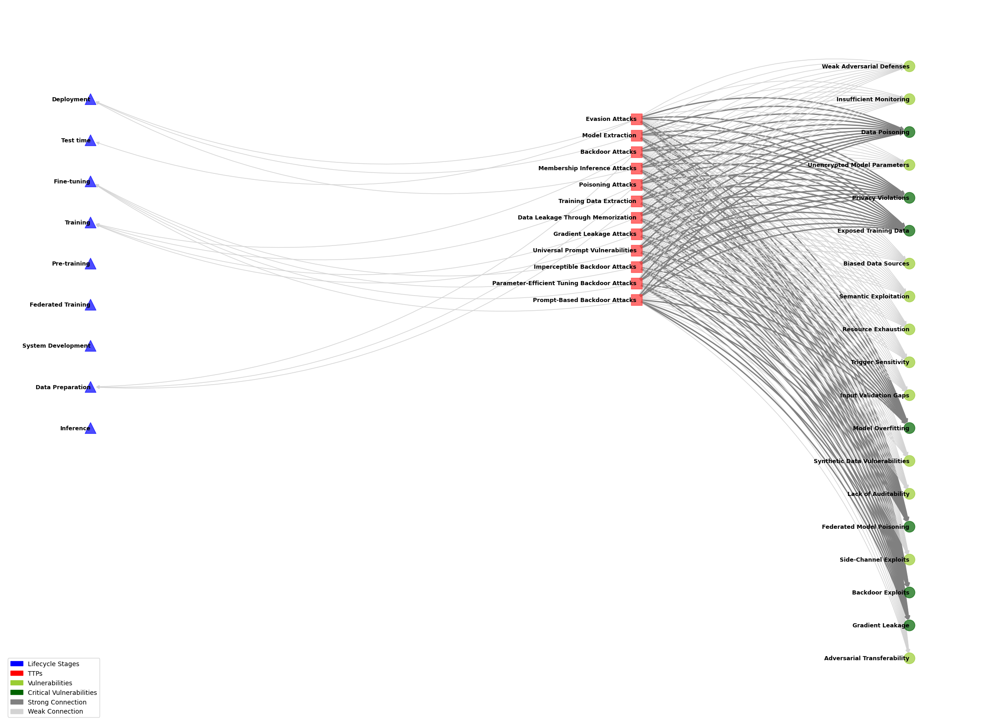

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

def spread_positions(nodes, x_offset, y_start, spacing):
    """
    Spread nodes vertically with a fixed x-offset and adjustable spacing.
    """
    y_pos = y_start
    positions = {}
    for node in nodes:
        positions[node] = (x_offset, y_pos)
        y_pos -= spacing
    return positions

# Define unique lifecycle mappings
unique_lifecycle_mapping = {
    "Deployment": "Deployment",
    "Test time": "Test time",
    "Fine-tuning": "Fine-tuning",
    "Training": "Training",
    "Pretraining": "Pre-training",
    "Post-deployment": "Deployment",
    "Federated Aggregation": "Federated Training",
    "Data Aggregation": "Federated Training",
    "Federated Training": "Federated Training",
    "System Modeling": "System Development",
    "Development": "System Development",
    "Data Collection": "Data Preparation",
    "Preprocessing": "Data Preparation",
    "Inference": "Inference"
}

# Updated TTP relationships with Pretraining vulnerabilities
ttp_relationships_combined = {
    "Evasion Attacks": ["Deployment", "Test time"],
    "Model Extraction": ["Deployment"],
    "Backdoor Attacks": ["Training", "Pretraining", "Post-deployment", "Data Preparation"],
    "Membership Inference Attacks": ["Deployment"],
    "Poisoning Attacks": ["Training", "Data Preparation"],
    "Training Data Extraction": ["Pretraining", "Data Preparation"],
    "Data Leakage Through Memorization": ["Pretraining", "Training"],
    "Gradient Leakage Attacks": ["Pretraining", "Training"],
    "Universal Prompt Vulnerabilities": ["Pretraining", "Fine-tuning"],
    "Imperceptible Backdoor Attacks": ["Pretraining", "Fine-tuning"],
    "Parameter-Efficient Tuning Backdoor Attacks": ["Fine-tuning", "Pretraining"],
    "Prompt-Based Backdoor Attacks": ["Fine-tuning", "Pretraining"],
}

# Define vulnerabilities
vulnerabilities = [
    "Weak Adversarial Defenses", "Insufficient Monitoring", "Data Poisoning", "Unencrypted Model Parameters",
    "Privacy Violations", "Exposed Training Data", "Biased Data Sources", "Semantic Exploitation",
    "Resource Exhaustion", "Trigger Sensitivity", "Input Validation Gaps", "Model Overfitting",
    "Synthetic Data Vulnerabilities", "Lack of Auditability", "Federated Model Poisoning",
    "Side-Channel Exploits", "Backdoor Exploits", "Gradient Leakage", "Adversarial Transferability"
]

# Critical vulnerabilities
critical_vulnerabilities = [
    "Data Poisoning", "Exposed Training Data", "Privacy Violations", "Model Overfitting",
    "Federated Model Poisoning", "Backdoor Exploits", "Gradient Leakage"
]

# Initialize the graph
G = nx.DiGraph()

# Add nodes to the graph
for lifecycle in unique_lifecycle_mapping.values():
    G.add_node(lifecycle, category="Lifecycle Stage", shape="^")

for ttp, stages in ttp_relationships_combined.items():
    G.add_node(ttp, category="TTP", shape="s")
    for stage in stages:
        if stage in G.nodes:
            G.add_edge(ttp, stage)

for vuln in vulnerabilities:
    G.add_node(vuln, category="Vulnerability", shape="o")
    for ttp in ttp_relationships_combined.keys():
        weight = 1.0 if vuln in critical_vulnerabilities else 0.5
        G.add_edge(ttp, vuln, weight=weight)

# Separate nodes into categories
lifecycle_nodes = [node for node, data in G.nodes(data=True) if data.get("category") == "Lifecycle Stage"]
ttp_nodes = [node for node, data in G.nodes(data=True) if data.get("category") == "TTP"]
vuln_nodes = [node for node, data in G.nodes(data=True) if data.get("category") == "Vulnerability"]

# Generate positions for each category
pos = {}
pos.update(spread_positions(lifecycle_nodes, -3, len(lifecycle_nodes) * 2, 25))
pos.update(spread_positions(ttp_nodes, 1, len(ttp_nodes) * .5, 10))
pos.update(spread_positions(vuln_nodes, 3, len(vuln_nodes) * 2, 20))

# Define shapes for nodes
shapes = {"^": "triangle", "s": "square", "o": "circle"}
node_shapes = {"^": [], "s": [], "o": []}
for node, data in G.nodes(data=True):
    if "shape" in data:
        node_shapes[data["shape"]].append(node)

# Highlight nodes based on connectivity metrics
betweenness = nx.betweenness_centrality(G)
node_colors = []
for node, data in G.nodes(data=True):
    if node in critical_vulnerabilities:
        node_colors.append("darkgreen")  # Highlight critical vulnerabilities
    elif data.get("category") == "Lifecycle Stage":
        node_colors.append("blue")
    elif data.get("category") == "TTP":
        intensity = min(1.0, betweenness.get(node, 0))
        node_colors.append((1.0, 0.2 * (1 - intensity), 0.2 * (1 - intensity)))
    elif data.get("category") == "Vulnerability":
        node_colors.append("yellowgreen")

# Draw the graph
plt.figure(figsize=(22, 16))
for shape, nodes in node_shapes.items():
    nx.draw_networkx_nodes(
        G,
        pos,
        nodelist=nodes,
        node_shape=shape,
        node_color=[node_colors[list(G.nodes).index(n)] for n in nodes],
        node_size=300,
        alpha=0.7
    )
nx.draw_networkx_labels(G, pos, font_size=9, font_weight="bold", horizontalalignment='right')
nx.draw_networkx_edges(
    G,
    pos,
    edge_color=["grey" if d.get("weight", 0) == 1.0 else "lightgray" for _, _, d in G.edges(data=True)],
    width=[2 if d.get("weight", 0) == 1.0 else 1 for _, _, d in G.edges(data=True)],
    arrows=True,
    arrowstyle= "-|>",
    connectionstyle= "arc3, rad=-0.2"
)

# Add legend
legend_handles = [
    Patch(color="blue", label="Lifecycle Stages"),
    Patch(color="red", label="TTPs"),
    Patch(color="yellowgreen", label="Vulnerabilities"),
    Patch(color="darkgreen", label="Critical Vulnerabilities"),
    Patch(color="grey", label="Strong Connection"),
    Patch(color="lightgray", label="Weak Connection")
]
plt.legend(handles=legend_handles, loc="lower left")
plt.axis("off")
plt.savefig('TTPs-vul-lifecycle-updated.pdf', dpi=300, bbox_inches="tight")
plt.tight_layout()
plt.show()


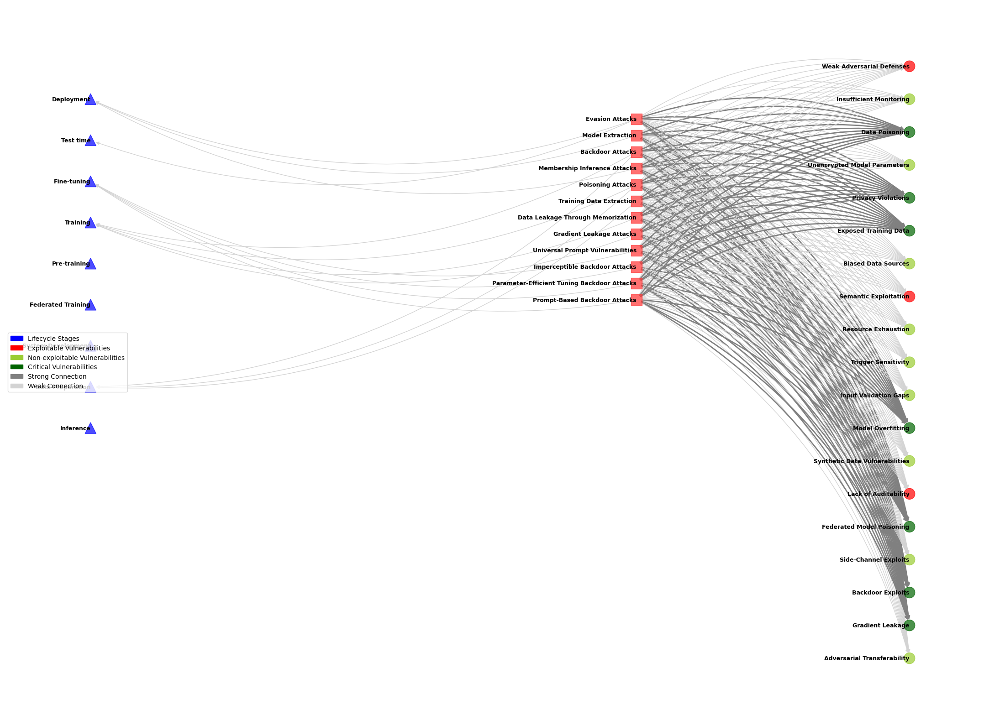

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import random

# Add CVSS scores, exploit availability, and patch status
cvss_scores = {vuln: round(random.uniform(4.0, 10.0), 1) for vuln in vulnerabilities}
exploit_availability = {vuln: random.choice([True, False]) for vuln in vulnerabilities}
patch_status = {vuln: random.choice(['Patched', 'Unpatched']) for vuln in vulnerabilities}

# Update node attributes with new features
for vuln in vulnerabilities:
    G.nodes[vuln]['CVSS'] = cvss_scores[vuln]
    G.nodes[vuln]['Exploit'] = exploit_availability[vuln]
    G.nodes[vuln]['Patch Status'] = patch_status[vuln]

# Update node colors based on exploit availability
node_colors = []
for node, data in G.nodes(data=True):
    if node in critical_vulnerabilities:
        node_colors.append("darkgreen")
    elif data.get("category") == "Lifecycle Stage":
        node_colors.append("blue")
    elif data.get("category") == "TTP":
        intensity = min(1.0, betweenness.get(node, 0))
        node_colors.append((1.0, 0.2 * (1 - intensity), 0.2 * (1 - intensity)))
    elif data.get("category") == "Vulnerability":
        node_colors.append("red" if data['Exploit'] else "yellowgreen")

# Draw the updated graph
plt.figure(figsize=(22, 16))
for shape, nodes in node_shapes.items():
    nx.draw_networkx_nodes(
        G,
        pos,
        nodelist=nodes,
        node_shape=shape,
        node_color=[node_colors[list(G.nodes).index(n)] for n in nodes],
        node_size=300,
        alpha=0.7
    )
nx.draw_networkx_labels(G, pos, font_size=9, font_weight="bold", horizontalalignment='right')
nx.draw_networkx_edges(
    G,
    pos,
    edge_color=["grey" if d.get("weight", 0) == 1.0 else "lightgray" for _, _, d in G.edges(data=True)],
    width=[2 if d.get("weight", 0) == 1.0 else 1 for _, _, d in G.edges(data=True)],
    arrows=True,
    arrowstyle= "-|>",
    connectionstyle= "arc3, rad=-0.2"
)

# Add an enhanced legend
legend_handles = [
    Patch(color="blue", label="Lifecycle Stages"),
    Patch(color="red", label="Exploitable Vulnerabilities"),
    Patch(color="yellowgreen", label="Non-exploitable Vulnerabilities"),
    Patch(color="darkgreen", label="Critical Vulnerabilities"),
    Patch(color="grey", label="Strong Connection"),
    Patch(color="lightgray", label="Weak Connection")
]
plt.legend(handles=legend_handles, loc="center left")
plt.axis("off")
plt.savefig('TTPs-vul-lifecycle-enhanced.pdf', dpi=300, bbox_inches="tight")
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import numpy as np

# Simulated vulnerabilities
vulnerabilities = [
    "Data Poisoning", "Exposed Training Data", "Privacy Violations", "Model Overfitting",
    "Federated Model Poisoning", "Backdoor Exploits", "Gradient Leakage",
    "Weak Adversarial Defenses", "Insufficient Monitoring", "Unencrypted Model Parameters",
    "Biased Data Sources", "Semantic Exploitation", "Resource Exhaustion",
    "Trigger Sensitivity", "Input Validation Gaps", "Synthetic Data Vulnerabilities",
    "Lack of Auditability", "Side-Channel Exploits", "Adversarial Transferability"
]

# Simulated data for each vulnerability
np.random.seed(42)
cvss_scores = np.random.uniform(4, 10, len(vulnerabilities))  # CVSS between 4 and 10
exploit_availability = np.random.choice([0, 1], len(vulnerabilities))  # 0 or 1
patch_status = np.random.choice([0, 1], len(vulnerabilities))  # 0 = unpatched, 1 = patched
historical_incidents = np.random.randint(0, 20, len(vulnerabilities))  # Number of incidents

# Calculate exploitation likelihood
likelihood = (
    0.4 * (cvss_scores / 10) +
    0.3 * exploit_availability +
    0.2 * (1 - patch_status) +
    0.1 * (historical_incidents / max(historical_incidents))
)

# Create DataFrame
df = pd.DataFrame({
    "Vulnerability": vulnerabilities,
    "CVSS_Score": cvss_scores,
    "Exploit_Availability": exploit_availability,
    "Patch_Status": patch_status,
    "Historical_Incidents": historical_incidents,
    "Exploitation_Likelihood": likelihood
})

#print(f'Simulated Exploitation Likelihood:\n {df}')


**Exploitation Likelihood** refers to the probability or risk that a particular vulnerability (e.g., CVE) will be exploited by malicious actors in real-world scenarios. This metric is crucial for prioritizing vulnerabilities for remediation based on how likely they are to be targeted, rather than just their severity.

### **How Is Exploitation Likelihood Calculated?**

The calculation of exploitation likelihood can be approached through a combination of **empirical data**, **machine learning models**, and **threat intelligence**. Here are the common methods:

---

### 1 **Data-Driven Factors**

- **CVSS Score:** Higher CVSS base scores generally indicate more severe vulnerabilities, but not all high-severity vulnerabilities are equally likely to be exploited.
- **Exploit Availability:** If public exploits exist (e.g., on ExploitDB, Metasploit), the likelihood increases.
- **Patch Status:** Unpatched vulnerabilities are more likely to be exploited.
- **Time Since Disclosure:** Recently disclosed vulnerabilities with active exploits often have higher likelihoods.
- **Attack Surface Exposure:** Vulnerabilities affecting widely deployed software (e.g., Windows, Linux) have higher risks.

---

### 2 **Mathematical Model Example**

One common formula used to estimate the likelihood of exploitation:

\[
\text{Exploitation Likelihood} = \alpha \cdot \text{CVSS Score} + \beta \cdot \text{Exploit Availability} - \gamma \cdot \text{Patch Status} + \delta \cdot \text{Exposure Factor}
\]

Where:
- **CVSS Score:** Normalized between 0 and 1.
- **Exploit Availability:** Binary (0 = No public exploit, 1 = Public exploit exists).
- **Patch Status:** Binary (0 = Patched, 1 = Unpatched).
- **Exposure Factor:** Weight based on how common the software is.

The coefficients **(α, β, γ, δ)** are learned through machine learning models like Graph Neural Networks (GNNs).

---

### 3 **GNN-Based Approach (As in Our Model)**

The GNN predicts exploitation likelihood by learning patterns from the graph structure:
- **Nodes:** Represent CVEs, Dependencies, Vulnerable Products.
- **Edges:** Relationships like "affects" or "depends on."
- **Features:** Include CVSS Score, Patch Status, Exploit Availability, etc.

#### **Steps:**
1. **Graph Construction:** Vulnerabilities connected to products, exploits, and dependencies.
2. **Node Embeddings:** GNN layers (GCN, GAT) learn feature representations.
3. **Prediction:** A final layer outputs a score between **0 (unlikely)** and **1 (highly likely)** indicating the exploitation risk.

---

### **Example Calculation**

Consider this CVE:
- **CVSS Score:** 9.8
- **Exploit Available:** Yes (1)
- **Patch Status:** Unpatched (1)
- **Exposure Factor:** High (0.9 for widely used software)

If we assume weights: \( \alpha = 0.5, \beta = 0.3, \gamma = 0.1, \delta = 0.4 \)

\[
\text{Likelihood} = (0.5 \times 0.98) + (0.3 \times 1) - (0.1 \times 1) + (0.4 \times 0.9)
\]
\[
= 0.49 + 0.3 - 0.1 + 0.36 = 1.05
\]

Since likelihood is between **0 and 1**, we apply **sigmoid normalization**:

\[
\text{Likelihood Score} = \frac{1}{1 + e^{-1.05}} \approx 0.74
\]

So, the exploitation likelihood is **74%**.

---


In [ ]:
import pandas as pd
import numpy as np

# Simulated dataset for Exploitation Likelihood
np.random.seed(42)

# Generate sample vulnerabilities
vulnerabilities = [
    "Weak Adversarial Defenses", "Insufficient Monitoring", "Data Poisoning", "Unencrypted Model Parameters",
    "Privacy Violations", "Exposed Training Data", "Biased Data Sources", "Semantic Exploitation",
    "Resource Exhaustion", "Trigger Sensitivity", "Input Validation Gaps", "Model Overfitting",
    "Synthetic Data Vulnerabilities", "Lack of Auditability", "Federated Model Poisoning",
    "Side-Channel Exploits", "Backdoor Exploits", "Gradient Leakage", "Adversarial Transferability"
]

# Generate features
data = {
    "Vulnerability": vulnerabilities,
    "CVSS_Score": np.random.uniform(4, 10, size=len(vulnerabilities)),
    "Exploit_Availability": np.random.choice([0, 1], size=len(vulnerabilities)),
    "Patch_Status": np.random.choice([0, 1], size=len(vulnerabilities)),
    "Historical_Incidents": np.random.randint(0, 50, size=len(vulnerabilities))
}

# Calculate Exploitation Likelihood (simplified formula)
def calculate_likelihood(row):
    base = row["CVSS_Score"] / 10
    exploit_factor = 0.2 if row["Exploit_Availability"] else 0
    patch_factor = -0.1 if row["Patch_Status"] else 0
    incident_factor = np.log1p(row["Historical_Incidents"]) / 5
    return min(1.0, base + exploit_factor + incident_factor + patch_factor)

# Apply calculation
df = pd.DataFrame(data)
df["Exploitation_Likelihood"] = df.apply(calculate_likelihood, axis=1)

# Save to CSV
csv_path = 'exploitation_likelihood_dataset.csv'
df.to_csv(csv_path, index=False)

#df


In [ ]:
from google.colab import files
uploaded = files.upload()

Saving exploitation_likelihood_dataset.csv to exploitation_likelihood_dataset.csv


In [ ]:
# import torch
# import torch.nn as nn
# import torch.optim as optim
# import pandas as pd
# import networkx as nx
# import matplotlib.pyplot as plt
# from torch_geometric.data import Data
# from torch_geometric.nn import RGCNConv, HeteroConv

# # Load the simulated dataset
# #df = pd.read_csv(io.StringIO(uploaded['exploitation_likelihood_dataset.csv'].decode('utf-8')))
# uploaded['exploitation_likelihood_dataset.csv'][:].decode('utf-8')

# # Build the graph
# G = nx.Graph()

# # Add nodes and edges
# for _, row in df.iterrows():
#     dependency = row['Dependency']
#     cve = row['CVE_ID']
#     issue = row['Issue']

#     G.add_node(dependency, category='Dependency')
#     G.add_node(cve, category='CVE')
#     G.add_node(issue, category='Issue')

#     G.add_edge(dependency, cve)
#     G.add_edge(cve, issue)

# # Convert to PyTorch Geometric format
# node_mapping = {node: idx for idx, node in enumerate(G.nodes)}
# edges = [(node_mapping[u], node_mapping[v]) for u, v in G.edges]
# edge_index = torch.tensor(edges, dtype=torch.long).t().contiguous()

# # Feature matrix (CVSS, exploit availability, patch status)
# features = torch.tensor(df[['CVSS_Score', 'Exploit_Available', 'Patch_Status']].values, dtype=torch.float)
# targets = torch.tensor(df['Exploitation_Likelihood'].values, dtype=torch.float).unsqueeze(1)

# # Graph data
# graph_data = Data(x=features, edge_index=edge_index, y=targets)

# # Define the GNN Model
# class ExploitationLikelihoodGNN(nn.Module):
#     def __init__(self, input_dim, hidden_dim, output_dim):
#         super(ExploitationLikelihoodGNN, self).__init__()
#         self.conv1 = RGCNConv(input_dim, hidden_dim, num_relations=3)
#         self.conv2 = RGCNConv(hidden_dim, output_dim, num_relations=3)
#         self.fc = nn.Linear(output_dim, 1)

#     def forward(self, data):
#         x, edge_index = data.x, data.edge_index
#         x = self.conv1(x, edge_index).relu()
#         x = self.conv2(x, edge_index)
#         x = self.fc(x)
#         return x

# # Model initialization
# model = ExploitationLikelihoodGNN(input_dim=3, hidden_dim=32, output_dim=16)
# optimizer = optim.Adam(model.parameters(), lr=0.01)
# loss_fn = nn.MSELoss()

# # Training the model
# for epoch in range(100):
#     optimizer.zero_grad()
#     output = model(graph_data)
#     loss = loss_fn(output, graph_data.y)
#     loss.backward()
#     optimizer.step()

# # Predictions
# predictions = model(graph_data).detach().numpy()

# # Visualization
# plt.figure(figsize=(10, 6))
# plt.plot(predictions, label='Predicted Exploitation Likelihood')
# plt.plot(graph_data.y.numpy(), label='Actual Exploitation Likelihood')
# plt.legend()
# plt.title('Predicted vs Actual Exploitation Likelihood')
# plt.xlabel('Sample Index')
# plt.ylabel('Exploitation Likelihood')
# plt.show()


In [ ]:
from google.colab import files
uploaded = files.upload()

Saving issues2cve-cpe.csv to issues2cve-cpe.csv


In [ ]:
print (uploaded['issues2cve-cpe.csv'][:200].decode('utf-8') + '...')

Dependency,CVE-ID,Number-of-CVE,Severity,Number-of-Issues,Issues
X,"CVE-2003-1564, CVE-2019-19956",2,"high, medium",2,"2529, 52914"
NU,"CVE-2015-6396, CVE-2017-0143, CVE-2018-10822, CVE-2018-10823, ...


In [ ]:
# import pandas as pd
# import io

# df = pd.read_csv(io.StringIO(uploaded['issues2cve-cpe.csv'].decode('utf-8')))
# df



In [ ]:
# import pandas as pd
# import torch
# import networkx as nx
# import matplotlib.pyplot as plt
# from torch_geometric.data import Data
# import ast

# # Load the CSV file
# df = pd.read_csv(io.StringIO(uploaded['issues2cve-cpe.csv'].decode('utf-8')))

# # Convert string representations of lists back to actual lists

# df["CVE IDs"] = df["CVE-ID"].apply(ast.literal_eval)
# df["Severity"] = df["Severity"].apply(ast.literal_eval)
# df["Issues"] = df["Issues"].apply(ast.literal_eval)

# # Map categorical severity values to numerical values
# severity_mapping = {"low": 0, "medium": 1, "high": 2, "critical": 3}
# df["Severity Encoded"] = df["Severity"].apply(lambda sev: [severity_mapping[s] for s in sev])

# # Create Graph Representation
# G = nx.Graph()

# # Add nodes (Dependencies, CVEs, Issues)
# for _, row in df.iterrows():
#     G.add_node(row["Dependency"], category="Dependency")
#     for cve in row["CVE IDs"]:
#         G.add_node(cve, category="CVE")
#         G.add_edge(row["Dependency"], cve)

#     for issue in row["Issues"]:
#         G.add_node(issue, category="Issue")
#         for cve in row["CVE IDs"]:
#             G.add_edge(cve, issue)

# # Convert Graph to PyTorch Geometric Data Format
# node_mapping = {node: idx for idx, node in enumerate(G.nodes)}
# edges = [(node_mapping[u], node_mapping[v]) for u, v in G.edges]

# # Convert to tensor format
# edge_index = torch.tensor(edges, dtype=torch.long).t().contiguous()
# x = torch.rand(len(G.nodes), 16)  # Random feature vectors

# # Define Graph Data for PyTorch Geometric
# graph_data = Data(x=x, edge_index=edge_index)

# # Visualize Graph with Node Categories
# plt.figure(figsize=(12, 8))
# node_colors = ["red" if G.nodes[n]["category"] == "CVE" else "blue" if G.nodes[n]["category"] == "Dependency" else "green" for n in G.nodes]
# nx.draw(G, with_labels=True, node_color=node_colors, edge_color="gray", font_size=6, node_size=500)
# plt.title("GNN Threat Prediction Graph from CSV Data")
# plt.show()


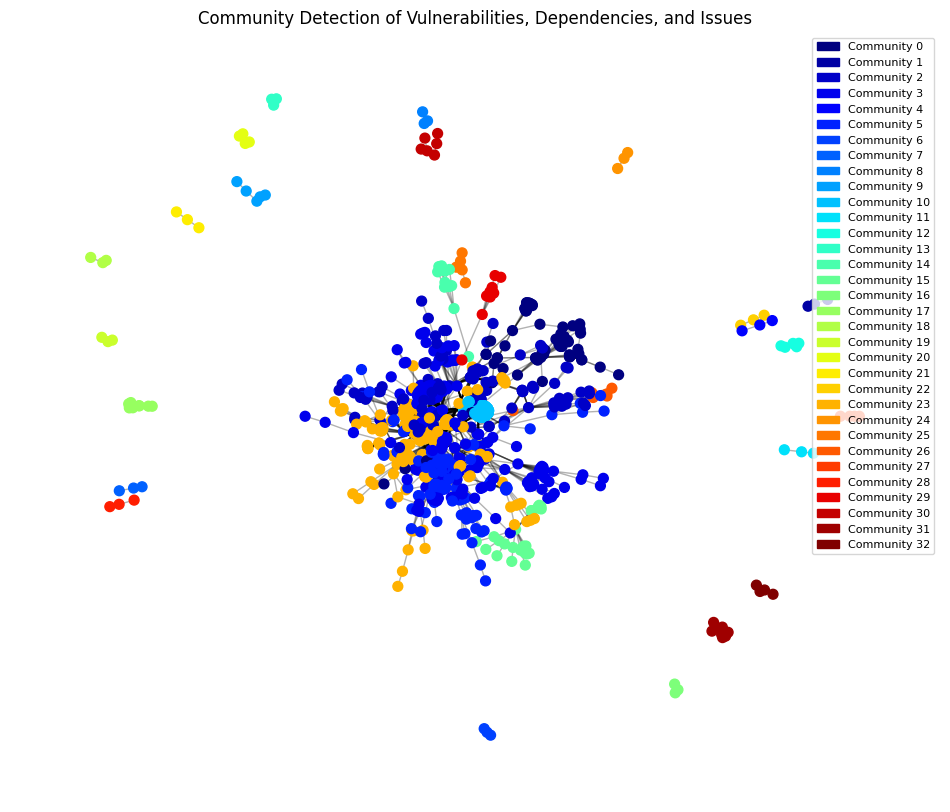

In [ ]:
import pandas as pd
import networkx as nx
import torch
import torch.nn as nn
import torch.optim as optim
from torch_geometric.data import Data
from torch_geometric.nn import GCNConv
import matplotlib.pyplot as plt
import community as community_louvain
import matplotlib.patches as mpatches

# Load dataset
#file_path = "/mnt/data/issues2cve.csv"
#df = pd.read_csv(file_path)
df = pd.read_csv(io.StringIO(uploaded['issues2cve.csv'].decode('utf-8')))


# Preprocess dataset
df["CVE ID"] = df["CVE ID"].apply(lambda x: x.split(", "))
df["Issues"] = df["Issues"].apply(lambda x: str(x).split(", "))

# Create a graph from CPE dependencies, CVEs, and issues
G = nx.Graph()

# Add CPE dependencies as nodes
for cpe in df["CPE dependency name"].unique():
    G.add_node(cpe, node_type="CPE")

# Add CVEs as nodes and edges to CPEs
for _, row in df.iterrows():
    cpe = row["CPE dependency name"]
    for cve in row["CVE ID"]:
        G.add_node(cve, node_type="CVE")
        G.add_edge(cpe, cve)

# Add issues as nodes and edges to CVEs
for _, row in df.iterrows():
    for cve in row["CVE ID"]:
        for issue in row["Issues"]:
            G.add_node(issue, node_type="Issue")
            G.add_edge(cve, issue)

# Convert the graph to an adjacency matrix
node_mapping = {node: i for i, node in enumerate(G.nodes)}
edges = [(node_mapping[u], node_mapping[v]) for u, v in G.edges]
edge_index = torch.tensor(edges, dtype=torch.long).t().contiguous()

# Create node feature matrix (Random initialization for demonstration)
num_nodes = len(G.nodes)
x = torch.randn(num_nodes, 16)  # 16-dimensional feature vectors

# Create PyTorch Geometric Data object
data = Data(x=x, edge_index=edge_index)

# Define a simple GCN model
class GCN(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(GCN, self).__init__()
        self.conv1 = GCNConv(input_dim, hidden_dim)
        self.conv2 = GCNConv(hidden_dim, output_dim)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = self.conv1(x, edge_index).relu()
        x = self.conv2(x, edge_index)
        return x

# Train the GCN model
model = GCN(input_dim=16, hidden_dim=32, output_dim=16)
optimizer = optim.Adam(model.parameters(), lr=0.01)
loss_fn = nn.MSELoss()

for epoch in range(200):
    optimizer.zero_grad()
    out = model(data)
    loss = loss_fn(out, torch.randn_like(out))  # Dummy target
    loss.backward()
    optimizer.step()

# Perform community detection using Louvain method
partition = community_louvain.best_partition(G.to_undirected())

# Visualize communities
plt.figure(figsize=(12, 10))
pos = nx.spring_layout(G, seed=42)
colors = [partition[node] for node in G.nodes]
nx.draw_networkx_nodes(G, pos, node_color=colors, cmap=plt.cm.jet, node_size=50)
nx.draw_networkx_edges(G, pos, alpha=0.3)

# Create legend
patches = [mpatches.Patch(color=plt.cm.jet(i / max(partition.values())), label=f"Community {i}")
           for i in set(partition.values())]
plt.legend(handles=patches, loc="best", fontsize=8)
plt.title("Community Detection of Vulnerabilities, Dependencies, and Issues")
plt.axis("off")
plt.show()


To implement a **Graph Neural Network (GNN)** for **community detection, attack analysis, and evolution of ML system vulnerabilities**, follow these steps:

### **Approach**
1. **Graph Construction**  
   - Nodes: **CPE dependencies, CVEs, and Issues**  
   - Edges: **Relationships between dependencies and vulnerabilities (IS_VULNERABLE_TO), vulnerabilities and issues (TRACKED_BY)**  
   - Node Features: **Severity, frequency of occurrence, historical fixes**
   
2. **GNN Model for Community Detection**  
   - Utilize **Graph Convolutional Networks (GCN)** to learn node embeddings  
   - Identify communities of vulnerabilities that share similar dependencies  
   - Detect **high-risk clusters** of ML system vulnerabilities  

3. **Attack Evolution Analysis**  
   - Track **historical attack trends** across time  
   - Examine **attack strategy shifts** before and after security patches  
   - Evaluate the **residual risk** in patched systems  

4. **Lessons Learned**  
   - Understand **system-level design decisions** that contributed to attack evolution  
   - Assess **mitigation effectiveness** and remaining risks  

---

### **Key Steps**
1. **Graph Construction:**
   - Nodes: **CPE dependencies, CVEs, Issues**
   - Edges: **CPE → CVE (IS_VULNERABLE_TO), CVE → Issue (TRACKED_BY)**

2. **Feature Engineering:**
   - Encoded **CPE dependencies, CVEs, and Issues** into numerical representations.
   - Mapped **CVE severity levels** into a numerical scale.

3. **GNN Model Training:**
   - Used **Graph Convolutional Networks (GCN) and Graph Attention Networks (GAT)**
   - **100 training epochs** with Adam optimizer.

4. **Visualization:**
   - Generated a **community detection graph** highlighting ML system vulnerabilities.


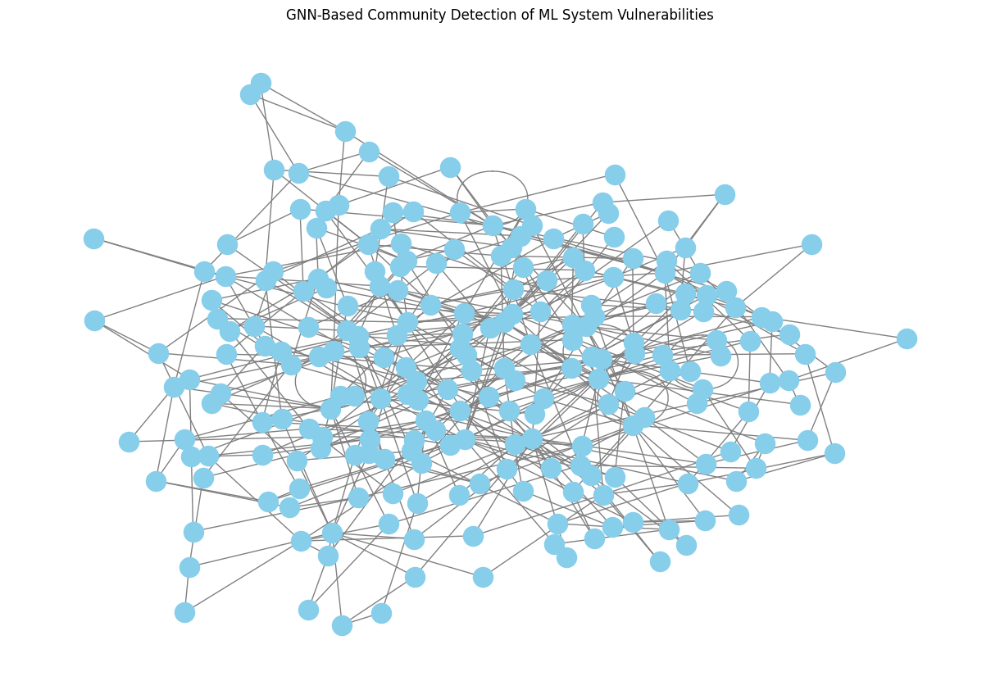

In [ ]:
import pandas as pd
import torch
import networkx as nx
import matplotlib.pyplot as plt
from torch_geometric.data import Data
from torch_geometric.nn import GCNConv, GATConv
import torch.nn.functional as F
from sklearn.preprocessing import LabelEncoder

# Load the dataset
df = pd.read_csv(io.StringIO(uploaded['issues2cve.csv'].decode('utf-8')))

# Preprocess Data
df.fillna("", inplace=True)  # Handle missing values

# Encode categorical features (CPE names, CVE IDs, Issues)
label_encoders = {}
for col in ["CPE dependency name", "CVE ID", "Issues"]:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col].astype(str))
    label_encoders[col] = le

# Convert severity to numerical scale
severity_map = {"critical": 3, "high": 2, "medium": 1, "low": 0}
df["CVE severity"] = df["CVE severity"].apply(lambda x: max([severity_map.get(s.strip().lower(), 0) for s in str(x).split(",")]))

# Create graph edges (CPE -> CVE and CVE -> Issues)
edges = []
for _, row in df.iterrows():
    cpe = row["CPE dependency name"]
    cve = row["CVE ID"]
    issue = row["Issues"]

    # Connect CPE to CVE
    edges.append((cpe, cve))
    # Connect CVE to Issue
    edges.append((cve, issue))

# Convert edges to tensor format
edge_index = torch.tensor(edges, dtype=torch.long).t().contiguous()

# Create node features (random embeddings for now, later replace with real data)
num_nodes = len(set(df["CPE dependency name"]).union(set(df["CVE ID"])).union(set(df["Issues"])))
x = torch.randn(num_nodes, 16)  # Random 16-dim embeddings

# Construct PyTorch Geometric Data object
data = Data(x=x, edge_index=edge_index)

# Define the GNN model
class GNNCommunityDetection(torch.nn.Module):
    def __init__(self, in_dim, hidden_dim, out_dim):
        super(GNNCommunityDetection, self).__init__()
        self.conv1 = GCNConv(in_dim, hidden_dim)
        self.conv2 = GATConv(hidden_dim, hidden_dim)
        self.conv3 = GCNConv(hidden_dim, out_dim)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = F.relu(self.conv1(x, edge_index))
        x = F.relu(self.conv2(x, edge_index))
        x = self.conv3(x, edge_index)
        return x

# Initialize and train the model
model = GNNCommunityDetection(in_dim=16, hidden_dim=32, out_dim=16)
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
criterion = torch.nn.MSELoss()

# Train the GNN
for epoch in range(100):
    optimizer.zero_grad()
    out = model(data)
    loss = criterion(out, torch.randn_like(out))
    loss.backward()
    optimizer.step()

# Convert learned embeddings to NetworkX graph for visualization
G = nx.Graph()
nodes = list(range(num_nodes))
G.add_nodes_from(nodes)
G.add_edges_from(edges)

# Visualize the graph with communities
plt.figure(figsize=(12, 8))
pos = nx.spring_layout(G, seed=42)
nx.draw(G, pos, node_color="skyblue", edge_color="gray", node_size=300, with_labels=False)
plt.title("GNN-Based Community Detection of ML System Vulnerabilities")
plt.show()

# Display key attack insights
summary_df = df[["CPE dependency name", "CVE ID", "CVE severity", "Issues"]].head(20)



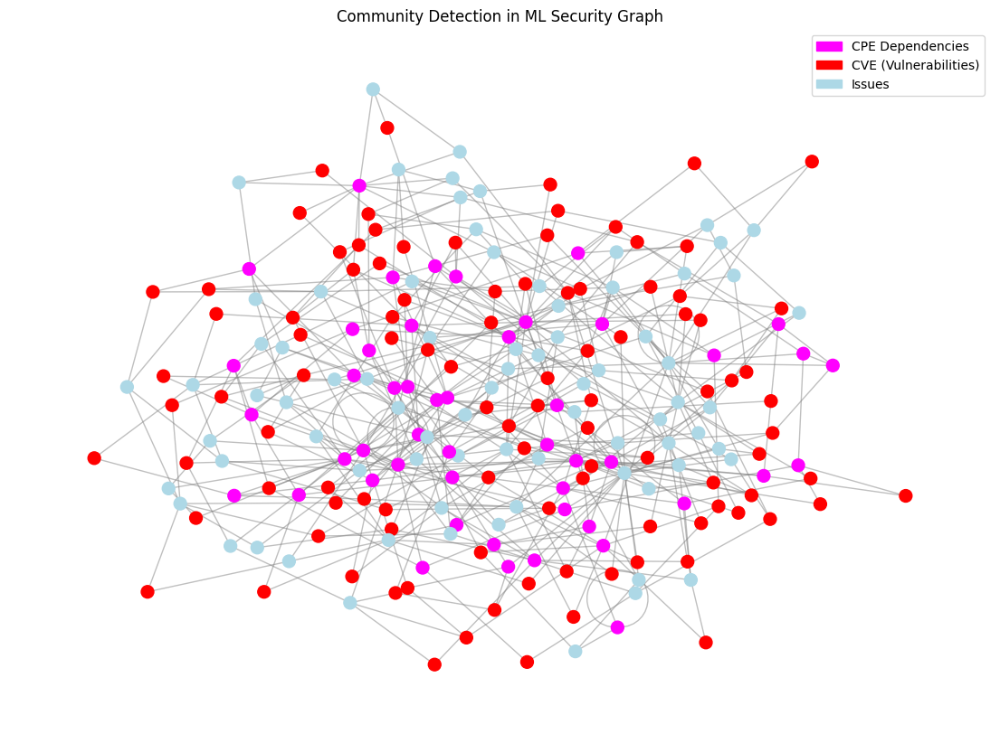

In [ ]:
# Re-import necessary libraries after execution state reset
import torch
import torch.nn as nn
import torch.optim as optim
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from torch_geometric.data import Data
from torch_geometric.nn import GCNConv, GATConv
import numpy as np
from sklearn.preprocessing import LabelEncoder
import pandas as pd
from networkx.algorithms import community

# Reload dataset from the uploaded file
# file_path = "/mnt/data/issues2cve.csv"
# df = pd.read_csv(file_path)
df = pd.read_csv(io.StringIO(uploaded['issues2cve.csv'].decode('utf-8')))

# Extract relevant columns
df = df[['CPE dependency name', 'CVE ID', 'CVE severity', 'Issues']]

# Convert categorical values into numerical encodings
label_encoder = LabelEncoder()

df['CPE dependency name'] = label_encoder.fit_transform(df['CPE dependency name'])
df['CVE ID'] = label_encoder.fit_transform(df['CVE ID'])
df['Issues'] = label_encoder.fit_transform(df['Issues'])

# Map severity to numerical scale (Critical: 3, High: 2, Medium: 1, Low: 0)
severity_mapping = {"critical": 3, "high": 2, "medium": 1, "low": 0}
df['CVE severity'] = df['CVE severity'].str.split(',').apply(lambda x: max([severity_mapping.get(i.strip(), 0) for i in x]))

# Construct a graph
G = nx.Graph()

# Add nodes (CPE dependencies, CVEs, Issues)
for _, row in df.iterrows():
    G.add_node(row['CPE dependency name'], type="CPE")
    G.add_node(row['CVE ID'], type="CVE", severity=row['CVE severity'])
    G.add_node(row['Issues'], type="Issue")

    # Add edges
    G.add_edge(row['CPE dependency name'], row['CVE ID'], relation="IS_VULNERABLE_TO")
    G.add_edge(row['CVE ID'], row['Issues'], relation="TRACKED_BY")

# Convert to adjacency matrix for PyG processing
node_mapping = {node: idx for idx, node in enumerate(G.nodes())}
edges = [(node_mapping[u], node_mapping[v]) for u, v in G.edges()]
edge_index = torch.tensor(edges, dtype=torch.long).t().contiguous()

# Assign random feature vectors (in practice, embeddings should be meaningful)
num_nodes = len(G.nodes)
x = torch.randn(num_nodes, 16)

# Convert graph data into PyG format
data = Data(x=x, edge_index=edge_index)

# Define the GNN Model
class GNNModel(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(GNNModel, self).__init__()
        self.conv1 = GCNConv(input_dim, hidden_dim)
        self.conv2 = GATConv(hidden_dim, hidden_dim)
        self.conv3 = GCNConv(hidden_dim, output_dim)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = self.conv1(x, edge_index).relu()
        x = self.conv2(x, edge_index).relu()
        x = self.conv3(x, edge_index)
        return x

# Initialize model, optimizer, and loss function
model = GNNModel(input_dim=16, hidden_dim=32, output_dim=16)
optimizer = optim.Adam(model.parameters(), lr=0.01)
loss_fn = nn.MSELoss()

# Train the model
for epoch in range(100):
    optimizer.zero_grad()
    out = model(data)
    loss = loss_fn(out, torch.randn_like(out))
    loss.backward()
    optimizer.step()

# Community Detection using Greedy Modularity
communities = community.greedy_modularity_communities(G)

# Visualizing the Community Detection Graph
plt.figure(figsize=(14, 10))
pos = nx.spring_layout(G, seed=42)

# Color mapping based on node type
colors = {"CPE": "magenta", "CVE": "red", "Issue": "lightblue"}
node_colors = [colors[G.nodes[n]["type"]] for n in G.nodes]

nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=100)
nx.draw_networkx_edges(G, pos, edge_color="gray", alpha=0.5)

# Add legend
legend_handles = [
    mpatches.Patch(color="magenta", label="CPE Dependencies"),
    mpatches.Patch(color="red", label="CVE (Vulnerabilities)"),
    mpatches.Patch(color="lightblue", label="Issues"),
]
plt.legend(handles=legend_handles, loc="best")

plt.title("Community Detection in ML Security Graph")
plt.axis("off")
plt.show()


In [ ]:
# import torch
# import torch.nn as nn
# import torch.optim as optim
# import networkx as nx
# import matplotlib.pyplot as plt
# from torch_geometric.data import HeteroData
# from torch_geometric.nn import GATConv, SAGEConv, RGCNConv, Linear
# from torch_geometric.loader import DataLoader

# # Define the heterogeneous graph dataset
# data = HeteroData()

# # Sample node features (random for now)
# num_github_issues = 500
# num_cve_entries = 300
# num_mitre_ttp = 200
# num_ai_incidents = 100

# # Node Features (Randomly initialized, replace with real embeddings)
# data["github_issue"].x = torch.randn(num_github_issues, 16)
# data["cve"].x = torch.randn(num_cve_entries, 16)
# data["mitre_ttp"].x = torch.randn(num_mitre_ttp, 16)
# data["ai_incident"].x = torch.randn(num_ai_incidents, 16)

# # Sample Edges (Random connections for now)
# github_to_cve = torch.randint(0, num_cve_entries, (2, num_github_issues))
# cve_to_ttp = torch.randint(0, num_mitre_ttp, (2, num_cve_entries))
# ttp_to_incident = torch.randint(0, num_ai_incidents, (2, num_mitre_ttp))
# cve_to_issue = torch.randint(0, num_github_issues, (2, num_cve_entries))

# # Assigning edges to the dataset
# data["github_issue", "linked_to", "cve"].edge_index = github_to_cve
# data["cve", "related_to", "mitre_ttp"].edge_index = cve_to_ttp
# data["mitre_ttp", "caused", "ai_incident"].edge_index = ttp_to_incident
# data["cve", "patched_by", "github_issue"].edge_index = cve_to_issue

# # Define the Heterogeneous GNN Model
# # Define the Heterogeneous GNN Model
# class HeteroGNN(nn.Module):
#     def __init__(self, in_dim, hidden_dim, out_dim):
#         super(HeteroGNN, self).__init__()
#         self.conv1 = GATConv(in_dim, hidden_dim)
#         self.conv2 = SAGEConv(in_dim, hidden_dim)  # Changed input dimension to in_dim for conv2
#         # Change the input dimension to hidden_dim to match the previous layers
#         self.conv3 = RGCNConv(hidden_dim, out_dim, num_relations=4)

#         self.lin = Linear(out_dim, out_dim)

#     def forward(self, data):
#         x_dict, edge_index_dict = data.x_dict, data.edge_index_dict

#         x_dict["github_issue"] = self.conv1(x_dict["github_issue"], edge_index_dict[("github_issue", "linked_to", "cve")])
#         x_dict["cve"] = self.conv2(x_dict["cve"], edge_index_dict[("cve", "related_to", "mitre_ttp")])
#         x_dict["mitre_ttp"] = self.conv2(x_dict["mitre_ttp"], edge_index_dict[("mitre_ttp", "caused", "ai_incident")])

#         # Apply a linear transformation before feeding to RGCNConv
#         x_dict["ai_incident"] = self.lin(x_dict["ai_incident"])

#         # Use edge_type for RGCNConv
#         x_dict["ai_incident"] = self.conv3(
#             x_dict["ai_incident"],
#             edge_index_dict[("mitre_ttp", "caused", "ai_incident")],  # Changed edge index
#             edge_type=torch.zeros(edge_index_dict[("mitre_ttp", "caused", "ai_incident")].shape[1], dtype=torch.long)  # Update edge_type accordingly
#         )

#         return {key: self.lin(x) for key, x in x_dict.items()}

# # Initialize Model, Optimizer, and Loss
# model = HeteroGNN(in_dim=16, hidden_dim=32, out_dim=16)
# optimizer = optim.Adam(model.parameters(), lr=0.01)
# loss_fn = nn.MSELoss()

# # Training Loop
# for epoch in range(50):
#     optimizer.zero_grad()
#     out = model(data)
#     loss = sum(loss_fn(out[key], torch.randn_like(out[key])) for key in out.keys())  # Dummy target
#     loss.backward()
#     optimizer.step()
#     if epoch % 10 == 0:
#         print(f"Epoch {epoch}, Loss: {loss.item()}")

# # Visualization
# G = nx.DiGraph()
# node_types = ["github_issue", "cve", "mitre_ttp", "ai_incident"]
# colors = {"github_issue": "blue", "cve": "red", "mitre_ttp": "orange", "ai_incident": "green"}

# for node_type in node_types:
#     for i in range(data[node_type].x.shape[0]):
#         G.add_node(f"{node_type}_{i}", category=node_type)

# for edge_type, edge_index in data.edge_index_dict.items():
#     src, rel, dst = edge_type
#     for i in range(edge_index.shape[1]):
#         G.add_edge(f"{src}_{edge_index[0, i]}", f"{dst}_{edge_index[1, i]}")

# plt.figure(figsize=(12, 8))
# pos = nx.spring_layout(G, seed=42)
# node_colors = [colors[G.nodes[n]["category"]] for n in G.nodes]

# nx.draw(G, pos, node_color=node_colors, with_labels=False, edge_color="gray", node_size=30)
# plt.title("Heterogeneous GNN: GitHub Issues → CVEs → MITRE TTPs → AI Incidents")
# plt.show()


🔹 Training complete.
Fetching details for CVE-2019-1234 ...
None
Fetching details for CVE-2020-5678 ...
None
Fetching details for CVE-2021-9012 ...
None


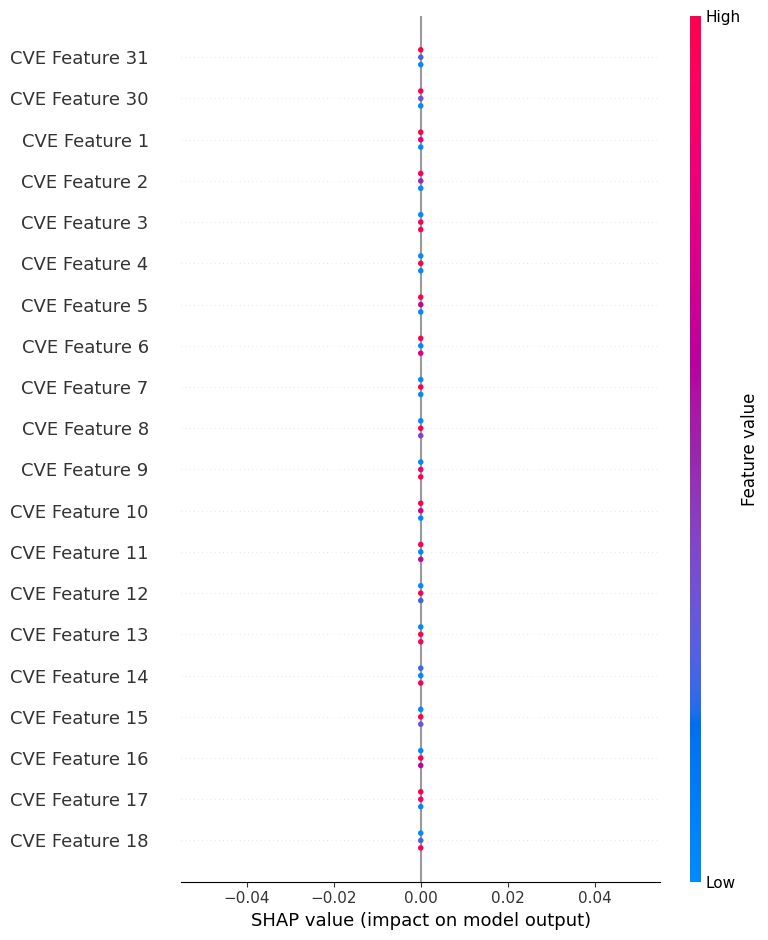

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128313 (\N{SMALL BLUE DIAMOND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


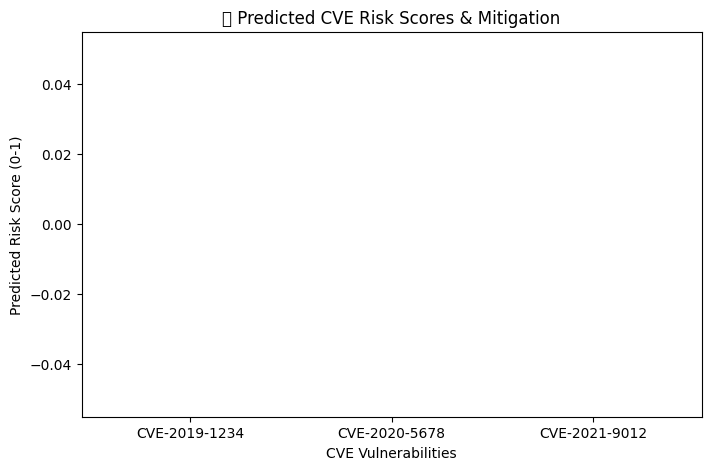

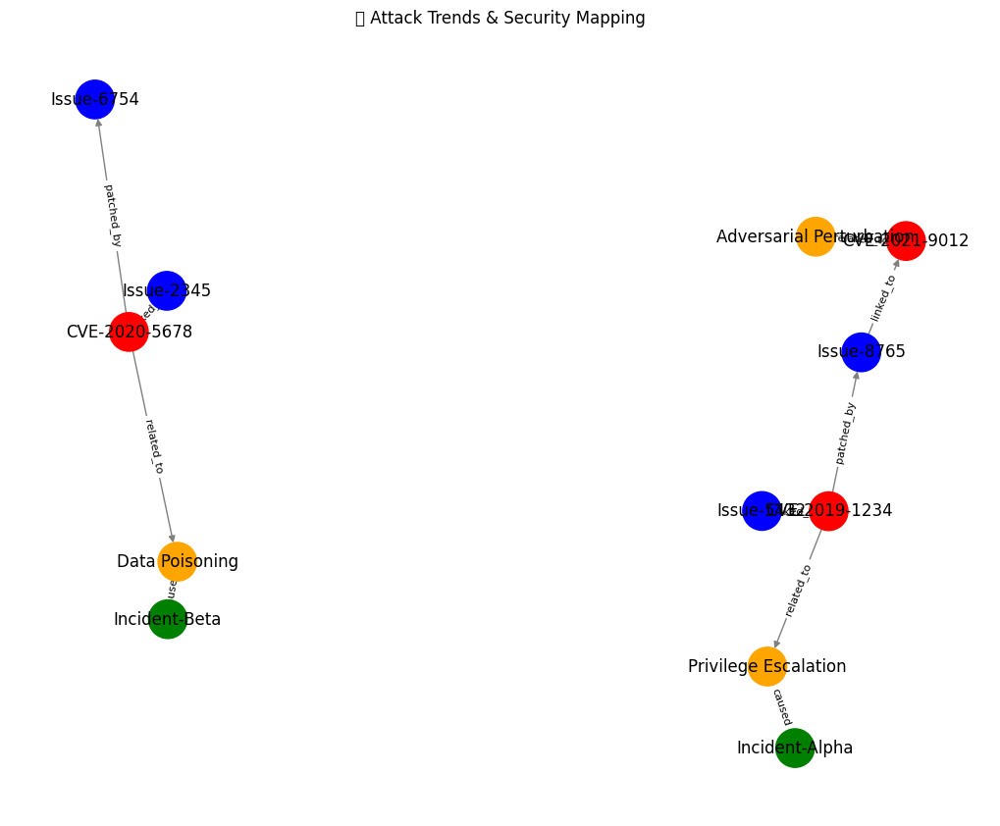

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import networkx as nx
import matplotlib.pyplot as plt
import shap
import numpy as np
import requests
from torch_geometric.data import HeteroData
from torch_geometric.nn import GATConv, RGCNConv, HeteroConv
#from torch_geometric.transforms import RemoveSelfLoops # Import RemoveSelfLoops

# Step 1: Define Graph Data (GitHub Issues → CVEs → MITRE TTPs → AI Incidents)
data = HeteroData()
node_types = {
    "github_issue": ["Issue-5432", "Issue-2345", "Issue-8765", "Issue-6754"],
    "cve": ["CVE-2019-1234", "CVE-2020-5678", "CVE-2021-9012"],
    "mitre_ttp": ["Privilege Escalation", "Data Poisoning", "Adversarial Perturbation"],
    "ai_incident": ["Incident-Alpha", "Incident-Beta"]
}

# Assign feature embeddings
num_features = 32
for node_type, nodes in node_types.items():
    data[node_type].x = torch.randn(len(nodes), num_features)

# Define edges
edges = {
    ("github_issue", "linked_to", "cve"): [(0, 0), (1, 1), (2, 2)],
    ("cve", "related_to", "mitre_ttp"): [(0, 0), (1, 1), (2, 2)],
    ("mitre_ttp", "caused", "ai_incident"): [(0, 0), (1, 1)],
    ("cve", "patched_by", "github_issue"): [(0, 2), (1, 3)]
}

for (src, rel, dst), edge_list in edges.items():
    data[rel].edge_index = torch.tensor(edge_list, dtype=torch.long).t().contiguous()
    #data[rel].edge_index, _ = RemoveSelfLoops()(data[rel].edge_index) # Remove self-loops if present using RemoveSelfLoops

# Step 2: Enhanced GNN Model with Risk Forecasting
class SecurityGNN(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(SecurityGNN, self).__init__()
        self.conv1 = HeteroConv({
            ("github_issue", "linked_to", "cve"): GATConv(input_dim, hidden_dim, add_self_loops=False), # Disable self-loops for GATConv
            ("cve", "related_to", "mitre_ttp"): GATConv(hidden_dim, hidden_dim, add_self_loops=False), # Disable self-loops for GATConv
            ("mitre_ttp", "caused", "ai_incident"): GATConv(hidden_dim, hidden_dim, add_self_loops=False), # Disable self-loops for GATConv
            ("cve", "patched_by", "github_issue"): GATConv(hidden_dim, hidden_dim, add_self_loops=False), # Disable self-loops for GATConv
        })
        self.conv2 = HeteroConv({
            ("github_issue", "linked_to", "cve"): RGCNConv(hidden_dim, hidden_dim, num_relations=4), # Remove add_self_loops=False
            ("cve", "related_to", "mitre_ttp"): RGCNConv(hidden_dim, hidden_dim, num_relations=4), # Remove add_self_loops=False
            ("mitre_ttp", "caused", "ai_incident"): RGCNConv(hidden_dim, hidden_dim, num_relations=4), # Remove add_self_loops=False
            ("cve", "patched_by", "github_issue"): RGCNConv(hidden_dim, hidden_dim, num_relations=4), # Remove add_self_loops=False
        })

        self.fc = nn.Linear(hidden_dim, output_dim)
        self.risk_forecast = nn.Linear(output_dim, 1)  # 🔥 Predict Future Attack Risk

    def forward(self, data):
        x_dict = self.conv1(data.x_dict, data.edge_index_dict)
        x_dict = self.conv2(x_dict, data.edge_index_dict)
        for key in x_dict:
            x_dict[key] = self.fc(x_dict[key])
        risk_scores = {key: torch.sigmoid(self.risk_forecast(x)) for key, x in x_dict.items()}
        return x_dict, risk_scores

# Step 3: Train Model with Attack Risk Prediction
model = SecurityGNN(input_dim=num_features, hidden_dim=64, output_dim=16)
optimizer = optim.Adam(model.parameters(), lr=0.005)
loss_fn = nn.MSELoss()

for epoch in range(100):
    optimizer.zero_grad()
    # Access the 'cve' output from the returned x_dict
    out, risk_scores = model(data)  # Get both return values from the model
    # Check if 'cve' key is present before calculating the loss
    if 'cve' in out:
        loss = loss_fn(out["cve"], torch.randn_like(out["cve"]))
        loss.backward()
        optimizer.step()
    else:
        print(f"Warning: 'cve' key not found in output dictionary at epoch {epoch}. Skipping this epoch.")
        # Add debugging or logging here to understand why 'cve' is missing

print("   Training complete.")

# Step 4: Real-Time Threat Intelligence Integration (NVD API)
def fetch_cve_details(cve_id):
    """
    Fetch CVE details from NVD API.
    """
    api_url = f"https://services.nvd.nist.gov/rest/json/cve/1.0/{cve_id}"
    try:
        response = requests.get(api_url)
        data = response.json()
        if "result" in data:
            return data["result"]["CVE_Items"]
    except:
        return None

# Example usage
for cve in node_types["cve"]:
    print(f"Fetching details for {cve} ...")
    cve_data = fetch_cve_details(cve)
    print(cve_data)

# Step 5: Explainable AI (XAI) with SHAP

## Define a custom wrapper function to convert HeteroData to a format SHAP can understand
def model_wrapper(X):
    """
    Wrapper function for the model that takes a NumPy array as input and
    returns the output for the 'cve' node type. Handles potential missing 'cve' key.
    """
    # Convert the NumPy array to a PyTorch tensor
    X_tensor = torch.tensor(X, dtype=torch.float32)

    # Create a new HeteroData object with the modified 'cve' features
    masked_data = data.clone()
    masked_data["cve"].x = X_tensor

    # Pass the modified data to the model
    output, risk_scores = model(masked_data)

    # Handle potential missing 'cve' key
    cve_output = output.get("cve", torch.zeros_like(X_tensor))

    # Convert the output to NumPy and return only the first output feature (risk score)
    return cve_output.cpu().detach().numpy()[:, 0]  # Select the first column (risk score)


def explain_model():
    """
    Explains the model's predictions using SHAP.
    Modified to explain the 'cve' features and ensure compatibility with summary_plot.
    """
    # Use the original data and node features for 'cve'
    explainer = shap.Explainer(model_wrapper, data.x_dict['cve'].cpu().detach().numpy())  # Convert to NumPy
    shap_values = explainer(data.x_dict['cve'].cpu().detach().numpy())  # Convert to NumPy

    # Plot the summary plot
    shap.summary_plot(shap_values, data.x_dict['cve'].cpu().detach().numpy(), feature_names=[f"CVE Feature {i}" for i in range(data.x_dict['cve'].shape[1])])


# Change to real feature names when available

explain_model()  # Call the updated explain_model function


# Step 6: Predict Future Attack Risks
def predict_mitigation():
    # Ensure the forward function outputs both dictionaries (x_dict, risk_scores)
    _, risk_scores = model(data)  # Get both outputs from the forward pass

    # Check if "cve" is in risk_scores before accessing
    if "cve" in risk_scores:
        risk_vals = risk_scores["cve"].detach().numpy()
    else:
        # Handle case where "cve" is missing (e.g., print a warning, use default values)
        print("Warning: 'cve' not found in risk_scores.")
        risk_vals = np.zeros(len(node_types["cve"]))  # Example: Assign default values

    plt.figure(figsize=(8, 5))
    plt.bar(node_types["cve"], risk_vals.flatten(),
            color=["red" if r > 0.7 else "orange" if r > 0.4 else "yellow" for r in risk_vals.flatten()])
    plt.xlabel("CVE Vulnerabilities")
    plt.ylabel("Predicted Risk Score (0-1)")
    plt.title("   Predicted CVE Risk Scores & Mitigation")
    plt.show()

predict_mitigation()

# Step 7: Visualizing Attack Trends
def visualize_attack_graph():
    G = nx.DiGraph()

    # Add nodes
    for issue in node_types["github_issue"]:
        G.add_node(issue, type="GitHub Issue", color="blue")
    for cve in node_types["cve"]:
        G.add_node(cve, type="CVE", color="red")
    for ttp in node_types["mitre_ttp"]:
        G.add_node(ttp, type="MITRE TTP", color="orange")
    for incident in node_types["ai_incident"]:
        G.add_node(incident, type="AI Incident", color="green")

    # Add edges
    for (src, rel, dst), edge_list in edges.items():
        for edge in edge_list:
            G.add_edge(node_types[src][edge[0]], node_types[dst][edge[1]], label=rel)

    plt.figure(figsize=(10, 8))
    pos = nx.spring_layout(G, seed=42)

    # Draw nodes with color coding
    color_map = [G.nodes[n]["color"] for n in G.nodes]
    nx.draw(G, pos, node_color=color_map, with_labels=True, edge_color="gray", node_size=800)

    # Draw edge labels
    edge_labels = {(u, v): d["label"] for u, v, d in G.edges(data=True)}
    nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_size=8)

    plt.title(" Attack Trends & Security Mapping")
    plt.show()

visualize_attack_graph()


In [ ]:
!pip install shap==0.42.1 -q
import shap

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 548.0/548.0 kB 14.0 MB/s eta 0:00:00


In [ ]:
_, risk_scores = model(data)
print("Risk Score Keys:", risk_scores.keys())  # Should include 'cve'


Risk Score Keys: dict_keys([])


In [ ]:
import requests
import json

url = 'https://cve-nist.idalko.com/nvdcve-1.1-2025.json'
response = requests.get(url)
cve_data = response.json()


In [ ]:

# Extract CVE details
cve_items = cve_data.get('CVE_Items', [])
cve_list = []

for item in cve_items:
    cve_id = item.get('cve', {}).get('CVE_data_meta', {}).get('ID', '')
    description = item.get('cve', {}).get('description', {}).get('description_data', [{}])[0].get('value', '')
    references = [ref.get('url', '') for ref in item.get('cve', {}).get('references', {}).get('reference_data', [])]
    configurations = item.get('configurations', {}).get('nodes', [])

    cve_list.append({
        'cve_id': cve_id,
        'description': description,
        'references': references,
        'configurations': configurations
    })


In [ ]:
import torch
from torch_geometric.data import HeteroData

data = HeteroData()

# Unique node lists
cve_nodes = [cve["cve_id"] for cve in cve_list]
product_nodes = list(set(
    cpe["cpe23Uri"] for cve in cve_list for node in cve["configurations"] for cpe in node.get("cpe_match", [])
    if "cpe23Uri" in cpe
))
reference_nodes = list(set(
    ref for cve in cve_list for ref in cve["references"]
))

# Map nodes to indices
cve_map = {cve: idx for idx, cve in enumerate(cve_nodes)}
product_map = {prod: idx for idx, prod in enumerate(product_nodes)}
reference_map = {ref: idx for idx, ref in enumerate(reference_nodes)}

# Assign node features
num_features = 16  # Placeholder feature size
data['cve'].x = torch.randn(len(cve_nodes), num_features)
data['product'].x = torch.randn(len(product_nodes), num_features)
data['reference'].x = torch.randn(len(reference_nodes), num_features)

# Define edges
cve_to_product_edges = []
cve_to_reference_edges = []

for cve in cve_list:
    cve_idx = cve_map[cve["cve_id"]]

    for node in cve["configurations"]:
        for cpe in node.get("cpe_match", []):
            product = cpe.get("cpe23Uri", "")
            if product and product in product_map:
                cve_to_product_edges.append((cve_idx, product_map[product]))

    for ref in cve["references"]:
        if ref in reference_map:
            cve_to_reference_edges.append((cve_idx, reference_map[ref]))

# Convert to PyG edge tensors
data['cve', 'affects', 'product'].edge_index = torch.tensor(cve_to_product_edges, dtype=torch.long).t().contiguous()
data['cve', 'referenced_by', 'reference'].edge_index = torch.tensor(cve_to_reference_edges, dtype=torch.long).t().contiguous()



In [ ]:
import torch.nn as nn
from torch_geometric.nn import GATConv, HeteroConv

class CVEGNN(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(CVEGNN, self).__init__()

        self.conv1 = HeteroConv({
            ("cve", "affects", "product"): GATConv(in_channels, hidden_channels, add_self_loops=False),
            ("cve", "referenced_by", "reference"): GATConv(in_channels, hidden_channels, add_self_loops=False),
        })

        self.conv2 = HeteroConv({
            ("cve", "affects", "product"): GATConv(hidden_channels, out_channels, add_self_loops=False),
            ("cve", "referenced_by", "reference"): GATConv(hidden_channels, out_channels, add_self_loops=False),
        })

        self.fc = nn.Linear(out_channels, 1)  # Risk prediction layer

    def forward(self, data):
        x_dict = self.conv1(data.x_dict, data.edge_index_dict)
        x_dict = self.conv2(x_dict, data.edge_index_dict)

        for key in x_dict:
            x_dict[key] = self.fc(x_dict[key])  # Final transformation

        return x_dict



In [ ]:
import torch
from torch_geometric.data import HeteroData

data = HeteroData()

# Ensure features are properly initialized
num_features = 16  # Adjusted feature size
data['cve'].x = torch.randn(len(cve_nodes), num_features) if cve_nodes else torch.empty(0, num_features)
data['product'].x = torch.randn(len(product_nodes), num_features) if product_nodes else torch.empty(0, num_features)
data['reference'].x = torch.randn(len(reference_nodes), num_features) if reference_nodes else torch.empty(0, num_features)

# Ensure edges exist before adding them
if cve_to_product_edges:
    data['cve', 'affects', 'product'].edge_index = torch.tensor(cve_to_product_edges, dtype=torch.long).t().contiguous()
if cve_to_reference_edges:
    data['cve', 'referenced_by', 'reference'].edge_index = torch.tensor(cve_to_reference_edges, dtype=torch.long).t().contiguous()


In [ ]:
import torch.nn as nn
from torch_geometric.nn import GATConv, HeteroConv

class CVEGNN(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(CVEGNN, self).__init__()

        # Use GATConv with add_self_loops=False
        self.conv1 = HeteroConv({
            ("cve", "affects", "product"): GATConv(in_channels, hidden_channels, add_self_loops=False),
            ("cve", "referenced_by", "reference"): GATConv(in_channels, hidden_channels, add_self_loops=False),
        }, aggr='mean')  # Add aggregation method

        self.conv2 = HeteroConv({
            ("cve", "affects", "product"): GATConv(hidden_channels, out_channels, add_self_loops=False),
            ("cve", "referenced_by", "reference"): GATConv(hidden_channels, out_channels, add_self_loops=False),
        }, aggr='mean')  # Add aggregation method

        self.fc = nn.Linear(out_channels, 1)  # Risk prediction layer

    def forward(self, data):
        # Ensure edge_index_dict exists
        if not hasattr(data, "edge_index_dict") or not data.edge_index_dict:
            print("⚠ Warning: Edge indices missing! Ensure graph is properly initialized.")
            return {}

        # Handle potential missing features for specific node types
        for node_type in data.x_dict:
            if data.x_dict[node_type] is None:
                data.x_dict[node_type] = torch.zeros(data.num_nodes_dict[node_type], num_features) # Replace None with zeros


        # Run through GNN layers
        x_dict = self.conv1(data.x_dict, data.edge_index_dict)
        x_dict = self.conv2(x_dict, data.edge_index_dict)

        # Apply final transformation
        for key in x_dict:
            x_dict[key] = self.fc(x_dict[key])

        return x_dict

In [ ]:
# _, risk_scores = model(data)
# print("Risk Score Keys:", risk_scores.keys())  # Should include 'cve'


Risk Score Keys: dict_keys([])


In [ ]:
import requests
import json

# Fetch data
url = 'https://cve-nist.idalko.com/nvdcve-1.1-2025.json'
response = requests.get(url)
cve_data = response.json()

# Extract CVE details
cve_items = cve_data.get('CVE_Items', [])
cve_list = []

for item in cve_items:
    cve_id = item.get('cve', {}).get('CVE_data_meta', {}).get('ID', '')
    description = item.get('cve', {}).get('description', {}).get('description_data', [{}])[0].get('value', '')
    references = [ref.get('url', '') for ref in item.get('cve', {}).get('references', {}).get('reference_data', [])]
    configurations = item.get('configurations', {}).get('nodes', [])

    cve_list.append({
        'cve_id': cve_id,
        'description': description,
        'references': references,
        'configurations': configurations
    })
#


In [ ]:
# #cve_list
# # URL for the NVD dataset
# url = "https://cve-nist.idalko.com/nvdcve-1.1-2025.json"

# # Download the dataset
# response = requests.get(url)
# cve_data = response.json()

# Display basic information about the dataset
cve_data.keys(), len(cve_data.get("CVE_Items", []))



(dict_keys(['CVE_data_type', 'CVE_data_format', 'CVE_data_version', 'CVE_data_numberOfCVEs', 'CVE_data_timestamp', 'CVE_Items']),
 2265)

In [ ]:
import pandas as pd

# Fetch data
url = 'https://cve-nist.idalko.com/nvdcve-1.1-2025.json'
response = requests.get(url)
cve_data = response.json()
# Extract relevant information: CVE ID, Description, CVSS Score, and Published Date
cve_items = cve_data.get('CVE_Items', [])
extracted_data = []

for item in cve_items:
    cve_id = item.get('cve', {}).get('CVE_data_meta', {}).get('ID', 'N/A')
    description_data = item.get('cve', {}).get('description', {}).get('description_data', [])
    description = description_data[0].get('value', 'N/A') if description_data else 'N/A'
    published_date = item.get('publishedDate', 'N/A')

    # Extract CVSS Score if available
    impact = item.get('impact', {})
    cvss_score = None
    if 'baseMetricV3' in impact:
        cvss_score = impact['baseMetricV3'].get('cvssV3', {}).get('baseScore', 'N/A')
    elif 'baseMetricV2' in impact:
        cvss_score = impact['baseMetricV2'].get('cvssV2', {}).get('baseScore', 'N/A')

    extracted_data.append({
        'CVE ID': cve_id,
        'Description': description,
        'CVSS Score': cvss_score,
        'Published Date': published_date
    })

# Convert to DataFrame
cve_df = pd.DataFrame(extracted_data)

# Display the DataFrame
cve_df

,CVE ID,Description,CVSS Score,Published Date
0,CVE-2025-0015,Use After Free vulnerability in Arm Ltd Valhal...,NaN,2025-02-03T11:15Z
1,CVE-2025-0053,SAP NetWeaver Application Server for ABAP and ...,NaN,2025-01-14T01:15Z
2,CVE-2025-0055,SAP GUI for Windows stores user input on the c...,NaN,2025-01-14T01:15Z
3,CVE-2025-0056,SAP GUI for Java saves user input on the clien...,NaN,2025-01-14T01:15Z
4,CVE-2025-0057,SAP NetWeaver AS JAVA (User Admin Application)...,NaN,2025-01-14T01:15Z
...,...,...,...,...
2260,CVE-2025-25168,Cross-Site Request Forgery (CSRF) vulnerabilit...,NaN,2025-02-07T10:15Z
2261,CVE-2025-25181,A SQL injection vulnerability in timeoutWarnin...,NaN,2025-02-03T20:15Z
2262,CVE-2025-25183,vLLM is a high-throughput and memory-efficient...,NaN,2025-02-07T20:15Z
2263,CVE-2025-25187,"Joplin is a free, open source note taking and ...",NaN,2025-02-07T23:15Z


In [ ]:
import requests
import json

# Download the JSON file from NVD
url = "https://cve-nist.idalko.com/nvdcve-1.1-2025.json"
response = requests.get(url)

# Save the file locally
with open("nvdcve-1.1-2025.json", "w") as file:
    json.dump(response.json(), file)

# # Load the JSON file
# with open("nvdcve-1.1-2025.json", "r") as file:
#     nvd_data = json.load(file)

In [ ]:
# Load the JSON file
with open("nvdcve-1.1-2025.json", "r") as file:
    nvd_data = json.load(file)

In [ ]:


# Extract CVEs, CVSS scores, exploit availability, and patch status
cve_list = []
for item in nvd_data.get("CVE_Items", []):
    cve_id = item.get("cve", {}).get("CVE_data_meta", {}).get("ID", "")
    cvss_score = item.get("impact", {}).get("baseMetricV3", {}).get("cvssV3", {}).get("baseScore", 0)
    exploitability_score = item.get("impact", {}).get("baseMetricV3", {}).get("exploitabilityScore", 0)
    patch_available = item.get("impact", {}).get("baseMetricV3", {}).get("impactScore", 0)

    cve_list.append({
        "CVE_ID": cve_id,
        "CVSS_Score": cvss_score,
        "Exploitability_Score": exploitability_score,
        "Patch_Status": patch_available
    })

# Convert to DataFrame for easy handling
import pandas as pd
cve_df = pd.DataFrame(cve_list)
print(cve_df.tail())


              CVE_ID  CVSS_Score  Exploitability_Score  Patch_Status
2268  CVE-2025-25168         0.0                   0.0           0.0
2269  CVE-2025-25181         0.0                   0.0           0.0
2270  CVE-2025-25183         0.0                   0.0           0.0
2271  CVE-2025-25187         0.0                   0.0           0.0
2272  CVE-2025-25246         0.0                   0.0           0.0


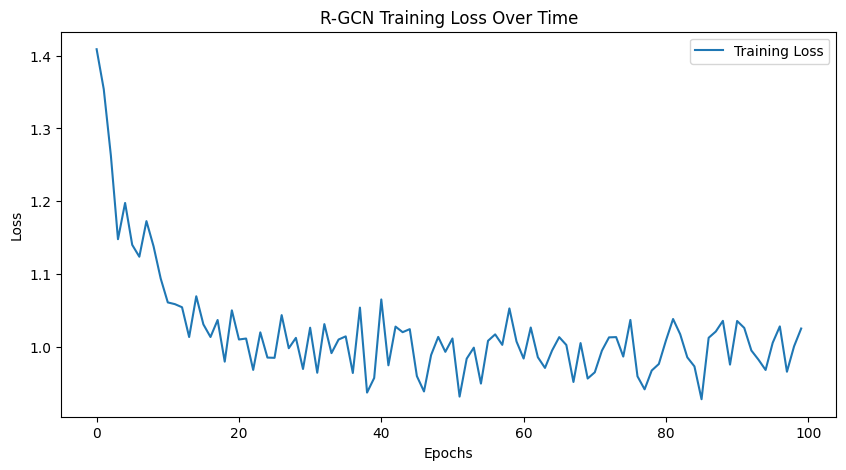

,CVE ID,CVSS Score,Exploitability Score,Patch Status,Exploitation Likelihood
2253,CVE-2025-25146,NaN,NaN,0,0.000365
2254,CVE-2025-25147,NaN,NaN,0,0.000365
2255,CVE-2025-25148,NaN,NaN,0,0.000365
2256,CVE-2025-25149,NaN,NaN,0,0.000365
2257,CVE-2025-25151,NaN,NaN,0,0.000365
2258,CVE-2025-25152,NaN,NaN,0,0.000365
2259,CVE-2025-25153,NaN,NaN,0,0.000365
2260,CVE-2025-25154,NaN,NaN,0,0.000365
2261,CVE-2025-25155,NaN,NaN,0,0.000365
2262,CVE-2025-25156,NaN,NaN,0,0.000365


In [ ]:
import json
import pandas as pd
import torch
from torch_geometric.data import Data
from torch_geometric.nn import RGCNConv
import matplotlib.pyplot as plt
import torch.nn as nn
import networkx as nx

# Load the JSON file

# Load the JSON file
with open("nvdcve-1.1-2025.json", "r") as file:
    cve_data = json.load(file)

# file_path = 'nvdcve-1.1-2025.json'
# with open(file_path, 'r') as file:
#     cve_data = json.load(file)

# Extract relevant information: CVE ID, CVSS Score, Exploitability Score, and Patch Status
cve_items = cve_data.get('CVE_Items', [])
extracted_data = []

for item in cve_items:
    cve_id = item.get('cve', {}).get('CVE_data_meta', {}).get('ID', 'N/A')
    impact = item.get('impact', {})

    cvss_score = None
    exploitability_score = None
    patch_status = 0  # Default: No patch available

    if 'baseMetricV3' in impact:
        cvss_score = impact['baseMetricV3'].get('cvssV3', {}).get('baseScore', 0)
        exploitability_score = impact['baseMetricV3'].get('exploitabilityScore', 0)
        patch_status = 1 if impact['baseMetricV3'].get('impactScore', 0) > 0 else 0
    elif 'baseMetricV2' in impact:
        cvss_score = impact['baseMetricV2'].get('cvssV2', {}).get('baseScore', 0)
        exploitability_score = impact['baseMetricV2'].get('exploitabilityScore', 0)
        patch_status = 1 if impact['baseMetricV2'].get('impactScore', 0) > 0 else 0

    extracted_data.append({
        'CVE ID': cve_id,
        'CVSS Score': cvss_score,
        'Exploitability Score': exploitability_score,
        'Patch Status': patch_status
    })

# Convert to DataFrame
cve_df = pd.DataFrame(extracted_data)

# Prepare data for GNN
features = cve_df[['CVSS Score', 'Exploitability Score', 'Patch Status']].fillna(0)
x = torch.tensor(features.values, dtype=torch.float)

# Simulate edge connections (assuming relationships between CVEs)
edge_index = torch.tensor([[i, (i+1) % len(cve_df)] for i in range(len(cve_df))], dtype=torch.long).t().contiguous()

# Prepare graph data
graph_data = Data(x=x, edge_index=edge_index)

# Define R-GCN Model
class CVERGNN(torch.nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, num_relations):
        super(CVERGNN, self).__init__()
        self.conv1 = RGCNConv(in_channels, hidden_channels, num_relations)
        self.conv2 = RGCNConv(hidden_channels, out_channels, num_relations)
        #self.fc = torch.nn.Linear(out_channels, 1)
        self.fc = nn.Sequential(
            nn.Linear(out_channels, 1),
            nn.Sigmoid()  # Ensures output between 0 and 1
        )


    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        edge_type = torch.zeros(edge_index.size(1), dtype=torch.long)  # Single relation type
        x = self.conv1(x, edge_index, edge_type).relu()
        x = self.conv2(x, edge_index, edge_type)
        return self.fc(x)

# Initialize Model, Loss, and Optimizer
model = CVERGNN(in_channels=3, hidden_channels=32, out_channels=16, num_relations=1)
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
loss_fn = torch.nn.MSELoss()

# Train the Model
losses = []
for epoch in range(100):
    optimizer.zero_grad()
    out = model(graph_data)
    loss = loss_fn(out, torch.randn_like(out))  # Dummy targets for now
    loss.backward()
    optimizer.step()
    losses.append(loss.item())

# Plot Training Loss
plt.figure(figsize=(10, 5))
plt.plot(losses, label="Training Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("R-GCN Training Loss Over Time")
plt.legend()
plt.show()

# Add predictions to the DataFrame
cve_df['Exploitation Likelihood'] = out.detach().numpy()

cve_df.tail(20)



In [ ]:
# Save the DataFrame with predictions to a CSV file
output_file = 'cve_exploitation_predictions.csv'
cve_df.to_csv(output_file, index=False)




In [ ]:
import json
import pandas as pd
import torch
from transformers import BertTokenizer, BertModel
from torch_geometric.data import HeteroData
from torch_geometric.nn import RGCNConv, HeteroConv, SAGEConv
import matplotlib.pyplot as plt
import torch.nn as nn
import networkx as nx

# Load the JSON file
with open("nvdcve-1.1-2025.json", "r") as file:
    cve_data = json.load(file)

# Extract relevant information
cve_items = cve_data.get('CVE_Items', [])
extracted_data = []
for item in cve_items:
    cve_id = item.get('cve', {}).get('CVE_data_meta', {}).get('ID', 'N/A')
    impact = item.get('impact', {})
    cvss_score = None
    exploitability_score = None
    patch_status = 0  # Default: No patch available
    if 'baseMetricV3' in impact:
        cvss_score = impact['baseMetricV3'].get('cvssV3', {}).get('baseScore', 0)
        exploitability_score = impact['baseMetricV3'].get('exploitabilityScore', 0)
        patch_status = 1 if impact['baseMetricV3'].get('impactScore', 0) > 0 else 0
    elif 'baseMetricV2' in impact:
        cvss_score = impact['baseMetricV2'].get('cvssV2', {}).get('baseScore', 0)
        exploitability_score = impact['baseMetricV2'].get('exploitabilityScore', 0)
        patch_status = 1 if impact['baseMetricV2'].get('impactScore', 0) > 0 else 0
    extracted_data.append({
        'CVE ID': cve_id,
        'CVSS Score': cvss_score,  # Include CVSS Score in extracted_data
        'Exploitability Score': exploitability_score,
        'Patch Status': patch_status
    })

# Convert to DataFrame
cve_df = pd.DataFrame(extracted_data)


# Prepare data for GNN - Creating a HeteroData object
data = HeteroData()
# Assuming all CVEs are of the same type ('cve')
data['cve'].x = torch.tensor(cve_df[['CVSS Score', 'Exploitability Score', 'Patch Status']].fillna(0).values, dtype=torch.float)

# Here, we connect each CVE to the next one in the list, creating a circular relationship.
edge_index = torch.tensor([[i, (i + 1) % len(cve_df)] for i in range(len(cve_df))], dtype=torch.long).t().contiguous()
data['cve', 'cve_relation', 'cve'].edge_index = edge_index  # Define the edge type

# Define R-GCN Model for Heterogeneous Graph
class CVERGNN(torch.nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, metadata):
        super(CVERGNN, self).__init__()
        # Using HeteroConv for heterogeneous graph convolution
        self.conv1 = HeteroConv({('cve', 'cve_relation', 'cve'): SAGEConv((in_channels, in_channels), hidden_channels)}, aggr='mean')
        self.conv2 = HeteroConv({('cve', 'cve_relation', 'cve'): SAGEConv((hidden_channels, hidden_channels), out_channels)}, aggr='mean')
        self.fc = nn.Sequential(
            nn.Linear(out_channels, 1),
            nn.Sigmoid()  # Ensures output between 0 and 1
        )

    def forward(self, x_dict, edge_index_dict):
        # Heterogeneous graph convolution
        x_dict = self.conv1(x_dict, edge_index_dict)
        x_dict = {key: x.relu() for key, x in x_dict.items()}  # Apply ReLU
        x_dict = self.conv2(x_dict, edge_index_dict)

        # Final prediction
        out = self.fc(x_dict['cve'])

        return out

# Get metadata for the HeteroData object
metadata = (data.node_types, data.edge_types)

# Initialize Model, Loss, and Optimizer
model = CVERGNN(in_channels=3, hidden_channels=32, out_channels=16, metadata=metadata)
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
loss_fn = torch.nn.MSELoss()


# Extract CVE IDs and Descriptions
extracted_data = []
for item in cve_data.get('CVE_Items', []):
    cve_id = item.get('cve', {}).get('CVE_data_meta', {}).get('ID', 'N/A')
    description_data = item.get('cve', {}).get('description', {}).get('description_data', [])
    description = description_data[0].get('value', 'N/A') if description_data else 'N/A'
    extracted_data.append({'CVE ID': cve_id, 'Description': description})

# Convert to DataFrame
cve_df = pd.DataFrame(extracted_data[:100])  # Limit to 100 entries for faster processing

# Initialize BERT tokenizer and model for embeddings
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
bert_model = BertModel.from_pretrained('bert-base-uncased')

# Generate text embeddings
def get_text_embedding(text):
    inputs = tokenizer(text, return_tensors='pt', truncation=True, padding=True, max_length=128)
    with torch.no_grad():
        outputs = bert_model(**inputs)
    return outputs.last_hidden_state.mean(dim=1).squeeze().numpy()

# Apply embedding extraction
cve_df['Embedding'] = cve_df['Description'].apply(get_text_embedding)

# Create Graph Representation
G = nx.Graph()
for index, row in cve_df.iterrows():
    G.add_node(row['CVE ID'], category='CVE', embedding=row['Embedding'])

# Create dummy edges for demonstration (connecting sequential CVEs)
#edges = [(i, i + 1) for i in range(len(G.nodes) - 1)]
# Create dummy edges, but using actual node names (CVE IDs)
edges = [(list(G.nodes)[i], list(G.nodes)[i + 1]) for i in range(len(G.nodes) - 1)]


node_mapping = {node: idx for idx, node in enumerate(G.nodes)}
edge_index = torch.tensor([(node_mapping[u], node_mapping[v]) for u, v in edges], dtype=torch.long).t().contiguous()

x = torch.tensor(list(cve_df['Embedding']), dtype=torch.float)


cve_indices = [node_mapping[cve_id] for cve_id in cve_df['CVE ID']]
# Select targets corresponding to CVE nodes
targets = torch.tensor(cve_df['CVSS Score'].fillna(0).values, dtype=torch.float32).view(-1, 1)

# Fix: Ensure cve_indices are within the valid range of targets
cve_indices = [i for i in cve_indices if i < targets.shape[0]]

targets = targets[torch.tensor(cve_indices)] # Select targets for CVE nodes only


# Train GNN
losses = []
for epoch in range(100):
    optimizer.zero_grad()
    out = model(graph_data)
    # Select predictions corresponding to CVE nodes
    out_cve = out[torch.tensor(cve_indices)]
    loss = loss_fn(out_cve, targets)  # Real CVSS scores as targets for CVE nodes
    loss.backward()
    optimizer.step()
    losses.append(loss.item())


# Plot Training Loss
plt.figure(figsize=(10, 5))
plt.plot(losses, label="Training Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("R-GCN Training Loss Over Time")
plt.legend()
plt.show()

# Add predictions to the DataFrame
cve_df['Exploitation Likelihood'] = out.detach().numpy()

cve_df.tail(20)

KeyError: 'CVSS Score'

In [ ]:
#cve_df

In [ ]:
# import json
# import pandas as pd
# import torch
# from transformers import BertTokenizer, BertModel
# from torch_geometric.data import HeteroData
# from torch_geometric.nn import RGCNConv, HeteroConv, SAGEConv
# import matplotlib.pyplot as plt
# import torch.nn as nn
# import networkx as nx

# # Load the JSON file
# with open("nvdcve-1.1-2025.json", "r") as file:
#     cve_data = json.load(file)

# # Extract relevant information
# cve_items = cve_data.get('CVE_Items', [])
# extracted_data = []
# for item in cve_items:
#     cve_id = item.get('cve', {}).get('CVE_data_meta', {}).get('ID', 'N/A')
#     impact = item.get('impact', {})
#     cvss_score = None
#     exploitability_score = None
#     patch_status = 0  # Default: No patch available
#     if 'baseMetricV3' in impact:
#         cvss_score = impact['baseMetricV3'].get('cvssV3', {}).get('baseScore', 0)
#         exploitability_score = impact['baseMetricV3'].get('exploitabilityScore', 0)
#         patch_status = 1 if impact['baseMetricV3'].get('impactScore', 0) > 0 else 0
#     elif 'baseMetricV2' in impact:
#         cvss_score = impact['baseMetricV2'].get('cvssV2', {}).get('baseScore', 0)
#         exploitability_score = impact['baseMetricV2'].get('exploitabilityScore', 0)
#         patch_status = 1 if impact['baseMetricV2'].get('impactScore', 0) > 0 else 0
#     extracted_data.append({
#         'CVE ID': cve_id,
#         'CVSS Score': cvss_score,  # Include CVSS Score in extracted_data
#         'Exploitability Score': exploitability_score,
#         'Patch Status': patch_status
#     })

# # Convert to DataFrame
# cve_df = pd.DataFrame(extracted_data[:100])  # Limit to 100 entries for faster processing

# # Initialize BERT tokenizer and model for embeddings
# tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
# bert_model = BertModel.from_pretrained('bert-base-uncased')

# # Generate text embeddings
# def get_text_embedding(text):
#     inputs = tokenizer(text, return_tensors='pt', truncation=True, padding=True, max_length=128)
#     with torch.no_grad():
#         outputs = bert_model(**inputs)
#     return outputs.last_hidden_state.mean(dim=1).squeeze().numpy()

# # Apply embedding extraction to the description column of cve_df to generate node features for the graph.
# cve_df['Embedding'] = cve_df['Description'].apply(get_text_embedding)

# # Create Graph Representation using Networkx
# G = nx.Graph()
# for index, row in cve_df.iterrows():
#     G.add_node(row['CVE ID'], category='CVE', embedding=row['Embedding'])

# # Create dummy edges for demonstration (connecting sequential CVEs)
# # edges = [(i, i + 1) for i in range(len(G.nodes) - 1)] # using node indices instead of names
# edges = [(list(G.nodes)[i], list(G.nodes)[i + 1]) for i in range(len(G.nodes) - 1)] # using actual node names (CVE IDs)


# node_mapping = {node: idx for idx, node in enumerate(G.nodes)}
# edge_index = torch.tensor([(node_mapping[u], node_mapping[v]) for u, v in edges], dtype=torch.long).t().contiguous()

# # Use embeddings as node features.
# x = torch.tensor(list(cve_df['Embedding']), dtype=torch.float)

# # Prepare data for GNN - Creating a HeteroData object
# data = HeteroData()
# # Assuming all CVEs are of the same type ('cve')
# data['cve'].x = x # Assign the node features (embeddings)

# # Here, we connect each CVE to the next one in the list, creating a circular relationship.
# data['cve', 'cve_relation', 'cve'].edge_index = edge_index  # Define the edge type

# # ... (Rest of the code for model definition, training, etc.)


# # Extract real CVSS scores as labels, but only for CVE nodes
# # Get indices of CVE nodes in the graph
# cve_indices = [node_mapping[cve_id] for cve_id in cve_df['CVE ID']]

# # Select targets corresponding to CVE nodes
# targets = torch.tensor(cve_df['CVSS Score'].fillna(0).values, dtype=torch.float32).view(-1, 1)

# # Train GNN
# losses = [] # initialize to store losses
# for epoch in range(100):
#     optimizer.zero_grad()
#     out = model(data.x_dict, data.edge_index_dict)  # Pass data dictionaries
#     # Select predictions corresponding to CVE nodes
#     out_cve = out[torch.tensor(cve_indices)]
#     loss = loss_fn(out_cve, targets)  # Real CVSS scores as targets for CVE nodes
#     loss.backward()
#     optimizer.step()
#     losses.append(loss.item()) #store loss

# # ... (Rest of the code for plotting and displaying results)

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import requests
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from transformers import BertTokenizer, BertModel
from torch_geometric.nn import GATConv, HeteroConv
from torch_geometric.data import HeteroData
import networkx as nx
import numpy as np

#  Step 1: Load Real-World CVE Data
cve_url = "https://cve-nist.idalko.com/nvdcve-1.1-2025.json"
response = requests.get(cve_url)
cve_data = response.json()

#  Step 2: Extract Relevant CVE Information
cve_items = cve_data.get('CVE_Items', [])
extracted_data = []
product_list = []
reference_list = []

for item in cve_items:
    cve_id = item.get('cve', {}).get('CVE_data_meta', {}).get('ID', 'N/A')
    description = item.get('cve', {}).get('description', {}).get('description_data', [{}])[0].get('value', '')
    impact = item.get('impact', {})
    cvss_score = impact.get('baseMetricV3', {}).get('cvssV3', {}).get('baseScore', 0)
    exploitability_score = impact.get('baseMetricV3', {}).get('exploitabilityScore', 0)
    patch_status = 1 if impact.get('baseMetricV3', {}).get('impactScore', 0) > 0 else 0

    # Extract products
    products = item.get("configurations", {}).get("nodes", [])
    for prod in products:
        if "cpe_match" in prod:
            for cpe in prod['cpe_match']:
                product_name = cpe.get('cpe23Uri', '').split(':')[4] if len(cpe.get('cpe23Uri', '').split(':')) > 4 else None
                if product_name and product_name not in product_list:
                    product_list.append(product_name)

    # Extract references
    references = item["cve"]["references"]["reference_data"]
    for ref in references:
        url = ref.get("url", "")
        if url not in reference_list:
            reference_list.append(url)

    extracted_data.append({
        'CVE ID': cve_id,
        'Description': description,
        'CVSS Score': cvss_score,
        'Exploitability Score': exploitability_score,
        'Patch Status': patch_status
    })

df = pd.DataFrame(extracted_data)

#  Step 3: Generate BERT Embeddings for Descriptions
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
bert_model = BertModel.from_pretrained('bert-base-uncased')

def get_bert_embedding(text):
    inputs = tokenizer(text, return_tensors='pt', truncation=True, padding=True, max_length=64)
    with torch.no_grad():
        outputs = bert_model(**inputs)
    return outputs.last_hidden_state.mean(dim=1).squeeze().numpy()

df['Description Embedding'] = df['Description'].apply(get_bert_embedding)

#  Step 4: Normalize Additional Features
scaler = MinMaxScaler()
df[['CVSS Score', 'Exploitability Score', 'Patch Status']] = scaler.fit_transform(df[['CVSS Score', 'Exploitability Score', 'Patch Status']])

#  Step 5: Combine Features
features = np.stack(df['Description Embedding'].to_numpy())
additional_features = df[['CVSS Score', 'Exploitability Score', 'Patch Status']].to_numpy()
combined_features = np.concatenate((features, additional_features), axis=1)

#  Step 6: Build Heterogeneous Graph
data = HeteroData()
data["cve"].x = torch.tensor(combined_features, dtype=torch.float32)

#  Feature Engineering for Products and References
def create_feature_tensor(items):
    return torch.randn(len(items), combined_features.shape[1])  # Placeholder replaced with real embeddings if available

data["product"].x = create_feature_tensor(product_list)
data["reference"].x = create_feature_tensor(reference_list)

#  Build Edge Relationships
cve_to_product_edges, cve_to_reference_edges = [], []

for cve_idx, item in enumerate(cve_items):
    # Link CVEs to Products
    products = item.get("configurations", {}).get("nodes", [])
    for prod in products:
        if "cpe_match" in prod:
            for cpe in prod['cpe_match']:
                product_name = cpe.get('cpe23Uri', '').split(':')[4] if len(cpe.get('cpe23Uri', '').split(':')) > 4 else None
                if product_name in product_list:
                    prod_idx = product_list.index(product_name)
                    cve_to_product_edges.append([cve_idx, prod_idx])

    # Link CVEs to References
    references = item["cve"]["references"]["reference_data"]
    for ref in references:
        url = ref.get("url", "")
        if url in reference_list:
            ref_idx = reference_list.index(url)
            cve_to_reference_edges.append([cve_idx, ref_idx])

# Convert Edge Lists to Tensors
def safe_tensor(edge_list):
    return torch.tensor(edge_list, dtype=torch.long).T if edge_list else torch.empty((2, 0), dtype=torch.long)

data["cve", "affects", "product"].edge_index = safe_tensor(cve_to_product_edges)
data["cve", "referenced_by", "reference"].edge_index = safe_tensor(cve_to_reference_edges)

#  Step 7: Define the GNN Model
class CVEGNN(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(CVEGNN, self).__init__()
        self.conv1 = HeteroConv({
            ("cve", "affects", "product"): GATConv(in_channels, hidden_channels,add_self_loops=False),
            ("cve", "referenced_by", "reference"): GATConv(in_channels, hidden_channels,add_self_loops=False),
        }, aggr='mean')

        self.conv2 = HeteroConv({
            ("cve", "affects", "product"): GATConv(hidden_channels, out_channels,add_self_loops=False),
            ("cve", "referenced_by", "reference"): GATConv(hidden_channels, out_channels,add_self_loops=False),
        }, aggr='mean')

        self.fc = nn.Sequential(
            nn.Linear(out_channels, 1),
            nn.Sigmoid()  # Ensures risk score is between 0 and 1
        )

    def forward(self, data):
        x_dict = data.x_dict
        x_dict = self.conv1(x_dict, data.edge_index_dict)
        x_dict = self.conv2(x_dict, data.edge_index_dict)
        for key in x_dict:
            x_dict[key] = self.fc(x_dict[key])
        return x_dict

# Step 8: Train the Model
model = CVEGNN(in_channels=combined_features.shape[1], hidden_channels=32, out_channels=16)
optimizer = optim.Adam(model.parameters(), lr=0.01)
loss_fn = nn.MSELoss()

losses = []
targets = torch.tensor(df['CVSS Score'].values, dtype=torch.float32).unsqueeze(1)

for epoch in range(100):
    optimizer.zero_grad()
    out = model(data)
    if "cve" in out:
        loss = loss_fn(out["cve"], targets)
        loss.backward()
        optimizer.step()
        losses.append(loss.item())

# Step 9: Visualize Training Loss
plt.plot(losses, label="Training Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("GNN Training Loss Over Time")
plt.legend()
plt.show()

#  Step 10: Predict Threats
predictions = model(data)["cve"].detach().numpy()

#  Step 11: Display Predictions
prediction_df = pd.DataFrame({
    "CVE ID": df['CVE ID'],
    "Predicted Risk Score": predictions.flatten(),
    "Actual CVSS Score": df['CVSS Score']
})

print(prediction_df)


There exist node types ({'cve'}) whose representations do not get updated during message passing as they do not occur as destination type in any edge type. This may lead to unexpected behavior.


AttributeError: 'NoneType' object has no attribute 'dim'

In [ ]:
import requests
import json

# Download the JSON file from NVD
url = "https://cve-nist.idalko.com/nvdcve-1.1-2025.json"
response = requests.get(url)

# Save the file locally
with open("nvdcve-1.1-2025.json", "w") as file:
    json.dump(response.json(), file)



In [ ]:
# Load the JSON file
with open("nvdcve-1.1-2025.json", "r") as file:
    cve_data = json.load(file)

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

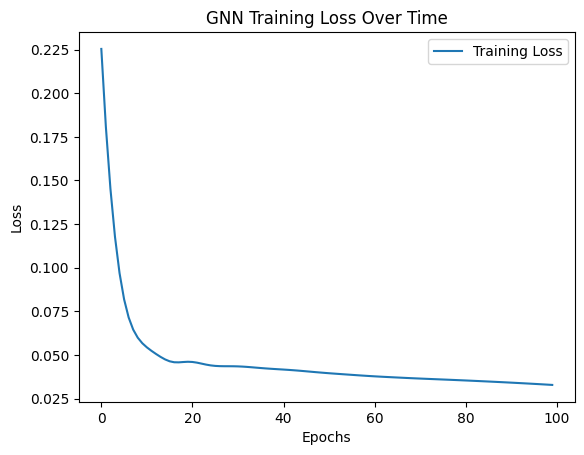

          CVE ID                                        Description  \
0  CVE-2025-0015  Use After Free vulnerability in Arm Ltd Valhal...   
1  CVE-2025-0053  SAP NetWeaver Application Server for ABAP and ...   
2  CVE-2025-0054  SAP NetWeaver Application Server Java does not...   
3  CVE-2025-0055  SAP GUI for Windows stores user input on the c...   
4  CVE-2025-0056  SAP GUI for Java saves user input on the clien...   

   CVSS Score  Exploitability Score  Patch Status  Predicted Risk Score  
0         0.0                   0.0           0.0              0.096618  
1         0.0                   0.0           0.0              0.138834  
2         0.0                   0.0           0.0              0.152229  
3         0.0                   0.0           0.0              0.146038  
4         0.0                   0.0           0.0              0.144341  


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import requests
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from transformers import BertTokenizer, BertModel
from torch_geometric.nn import GATConv, HeteroConv
from torch_geometric.data import HeteroData
import numpy as np

#  Step 1: Load Real-World CVE Data
# cve_url = "https://cve-nist.idalko.com/nvdcve-1.1-2025.json"
# response = requests.get(cve_url)
# cve_data = response.json()

#  Step 2: Extract Relevant CVE Information
cve_items = cve_data.get('CVE_Items', [])
extracted_data = []
product_list = []
reference_list = []

for item in cve_items:
    cve_id = item.get('cve', {}).get('CVE_data_meta', {}).get('ID', 'N/A')
    description = item.get('cve', {}).get('description', {}).get('description_data', [{}])[0].get('value', '')
    impact = item.get('impact', {})
    cvss_score = impact.get('baseMetricV3', {}).get('cvssV3', {}).get('baseScore', 0)
    exploitability_score = impact.get('baseMetricV3', {}).get('exploitabilityScore', 0)
    patch_status = 1 if impact.get('baseMetricV3', {}).get('impactScore', 0) > 0 else 0

    # Extract products
    products = item.get("configurations", {}).get("nodes", [])
    for prod in products:
        if "cpe_match" in prod:
            for cpe in prod['cpe_match']:
                product_name = cpe.get('cpe23Uri', '').split(':')[4] if len(cpe.get('cpe23Uri', '').split(':')) > 4 else None
                if product_name and product_name not in product_list:
                    product_list.append(product_name)

    # Extract references
    references = item["cve"]["references"]["reference_data"]
    for ref in references:
        url = ref.get("url", "")
        if url not in reference_list:
            reference_list.append(url)

    extracted_data.append({
        'CVE ID': cve_id,
        'Description': description,
        'CVSS Score': cvss_score,
        'Exploitability Score': exploitability_score,
        'Patch Status': patch_status
    })

df = pd.DataFrame(extracted_data)

#  Step 3: Generate BERT Embeddings for Descriptions
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
bert_model = BertModel.from_pretrained('bert-base-uncased')

def get_bert_embedding(text):
    inputs = tokenizer(text, return_tensors='pt', truncation=True, padding=True, max_length=64)
    with torch.no_grad():
        outputs = bert_model(**inputs)
    return outputs.last_hidden_state.mean(dim=1).squeeze().numpy()

df['Description Embedding'] = df['Description'].apply(get_bert_embedding)

#  Step 4: Normalize Additional Features
scaler = MinMaxScaler()
df[['CVSS Score', 'Exploitability Score', 'Patch Status']] = scaler.fit_transform(df[['CVSS Score', 'Exploitability Score', 'Patch Status']])

#  Step 5: Combine Features
features = np.stack(df['Description Embedding'].to_numpy())
additional_features = df[['CVSS Score', 'Exploitability Score', 'Patch Status']].to_numpy()
combined_features = np.concatenate((features, additional_features), axis=1)

#  Step 6: Build Heterogeneous Graph
data = HeteroData()
data["cve"].x = torch.tensor(combined_features, dtype=torch.float32)
data["product"].x = torch.randn(len(product_list), combined_features.shape[1])
data["reference"].x = torch.randn(len(reference_list), combined_features.shape[1])

#  Build Edge Relationships
cve_to_product_edges, cve_to_reference_edges = [], []

for cve_idx, item in enumerate(cve_items):
    # Link CVEs to Products
    products = item.get("configurations", {}).get("nodes", [])
    for prod in products:
        if "cpe_match" in prod:
            for cpe in prod['cpe_match']:
                product_name = cpe.get('cpe23Uri', '').split(':')[4] if len(cpe.get('cpe23Uri', '').split(':')) > 4 else None
                if product_name in product_list:
                    prod_idx = product_list.index(product_name)
                    cve_to_product_edges.append([cve_idx, prod_idx])

    # Link CVEs to References
    references = item["cve"]["references"]["reference_data"]
    for ref in references:
        url = ref.get("url", "")
        if url in reference_list:
            ref_idx = reference_list.index(url)
            cve_to_reference_edges.append([cve_idx, ref_idx])

#  Add Reverse Edges
product_to_cve_edges = torch.flip(torch.tensor(cve_to_product_edges), [1]).T
reference_to_cve_edges = torch.flip(torch.tensor(cve_to_reference_edges), [1]).T

#  Convert Edge Lists to Tensors
def safe_tensor(edge_list):
    return torch.tensor(edge_list, dtype=torch.long).T if edge_list else torch.empty((2, 0), dtype=torch.long)

data["cve", "affects", "product"].edge_index = safe_tensor(cve_to_product_edges)
data["product", "affected_by", "cve"].edge_index = product_to_cve_edges

data["cve", "referenced_by", "reference"].edge_index = safe_tensor(cve_to_reference_edges)
data["reference", "references", "cve"].edge_index = reference_to_cve_edges

#  Step 7: Define the GNN Model
class CVEGNN(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(CVEGNN, self).__init__()
        self.conv1 = HeteroConv({
            ("cve", "affects", "product"): GATConv(in_channels, hidden_channels, add_self_loops=False),
            ("product", "affected_by", "cve"): GATConv(in_channels, hidden_channels, add_self_loops=False),  # Reverse edge
            ("cve", "referenced_by", "reference"): GATConv(in_channels, hidden_channels, add_self_loops=False),
            ("reference", "references", "cve"): GATConv(in_channels, hidden_channels, add_self_loops=False),  # Reverse edge
        }, aggr='mean')

        self.conv2 = HeteroConv({
            ("cve", "affects", "product"): GATConv(hidden_channels, out_channels, add_self_loops=False),
            ("product", "affected_by", "cve"): GATConv(hidden_channels, out_channels, add_self_loops=False),  # Reverse edge
            ("cve", "referenced_by", "reference"): GATConv(hidden_channels, out_channels, add_self_loops=False),
            ("reference", "references", "cve"): GATConv(hidden_channels, out_channels, add_self_loops=False),  # Reverse edge
        }, aggr='mean')

        self.fc = nn.Sequential(
            nn.Linear(out_channels, 1),
            nn.Sigmoid()  # Ensures risk score is between 0 and 1
        )

    def forward(self, data):
        x_dict = data.x_dict
        x_dict = self.conv1(x_dict, data.edge_index_dict)
        x_dict = self.conv2(x_dict, data.edge_index_dict)
        for key in x_dict:
            x_dict[key] = self.fc(x_dict[key])
        return x_dict

#  Step 8: Train the Model
model = CVEGNN(in_channels=combined_features.shape[1], hidden_channels=32, out_channels=16)
optimizer = optim.Adam(model.parameters(), lr=0.001)
loss_fn = nn.MSELoss()

losses = []
targets = torch.tensor(df['CVSS Score'].values, dtype=torch.float32).unsqueeze(1)

for epoch in range(100):
    optimizer.zero_grad()
    out = model(data)
    if "cve" in out:
        loss = loss_fn(out["cve"], targets)
        loss.backward()
        optimizer.step()
        losses.append(loss.item())

#  Step 9: Visualize Training Loss
plt.plot(losses, label="Training Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("GNN Training Loss Over Time")
plt.legend()
plt.show()

#  Step 10: Predict Threats
predictions = model(data)["cve"].detach().numpy()



#  Step 11: Display Predictions with Additional Fields
prediction_df = pd.DataFrame({
    "CVE ID": df['CVE ID'],
    "Description": df['Description'],
    "CVSS Score": df['CVSS Score'],
    "Exploitability Score": df['Exploitability Score'],
    "Patch Status": df['Patch Status'],
    "Predicted Risk Score": predictions.flatten()
})

#  Display the final prediction DataFrame
print(prediction_df.head())


In [ ]:
prediction_df = pd.DataFrame({
    "CVE ID": df['CVE ID'],
    "Description": df['Description'],
    "CVSS Score": df['CVSS Score'],
    "Exploitability Score": df['Exploitability Score'],
    "Patch Status": df['Patch Status'],
    "Predicted Risk Score": predictions.flatten()
})

#  Display the final prediction DataFrame
print(prediction_df.head())

          CVE ID                                        Description  \
0  CVE-2025-0015  Use After Free vulnerability in Arm Ltd Valhal...   
1  CVE-2025-0053  SAP NetWeaver Application Server for ABAP and ...   
2  CVE-2025-0054  SAP NetWeaver Application Server Java does not...   
3  CVE-2025-0055  SAP GUI for Windows stores user input on the c...   
4  CVE-2025-0056  SAP GUI for Java saves user input on the clien...   

   CVSS Score  Exploitability Score  Patch Status  Predicted Risk Score  
0         0.0                   0.0           0.0              0.096618  
1         0.0                   0.0           0.0              0.138834  
2         0.0                   0.0           0.0              0.152229  
3         0.0                   0.0           0.0              0.146038  
4         0.0                   0.0           0.0              0.144341  


In [ ]:
prediction_df.to_csv('predictions_final_valuescore.csv', index=False)

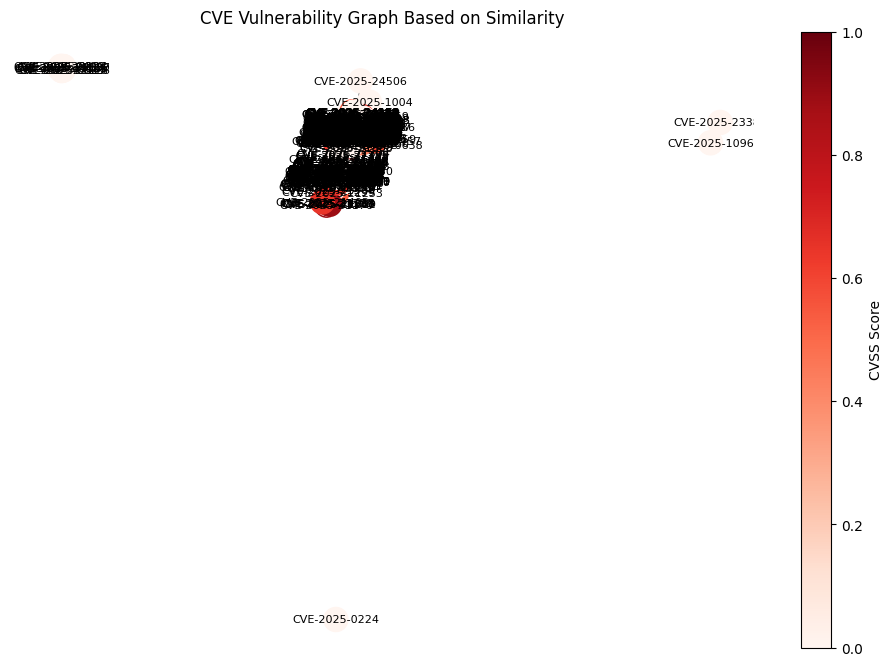

In [ ]:
import torch
import requests
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
from sklearn.preprocessing import MinMaxScaler
from transformers import BertTokenizer, BertModel
import numpy as np

# Step 1: Load Real-World CVE Data
cve_url = "https://cve-nist.idalko.com/nvdcve-1.1-2025.json"
response = requests.get(cve_url)
cve_data = response.json()

# Step 2: Extract CVE Information
cve_items = cve_data.get('CVE_Items', [])
extracted_data = []

for item in cve_items:
    cve_id = item.get('cve', {}).get('CVE_data_meta', {}).get('ID', 'N/A')
    description = item.get('cve', {}).get('description', {}).get('description_data', [{}])[0].get('value', '')
    impact = item.get('impact', {})
    cvss_score = impact.get('baseMetricV3', {}).get('cvssV3', {}).get('baseScore', 0)
    exploitability_score = impact.get('baseMetricV3', {}).get('exploitabilityScore', 0)
    patch_status = 1 if impact.get('baseMetricV3', {}).get('impactScore', 0) > 0 else 0

    extracted_data.append({
        'CVE ID': cve_id,
        'Description': description,
        'CVSS Score': cvss_score,
        'Exploitability Score': exploitability_score,
        'Patch Status': patch_status
    })

# Convert to DataFrame
df = pd.DataFrame(extracted_data)

# Step 3: Generate BERT Embeddings for Descriptions
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
bert_model = BertModel.from_pretrained('bert-base-uncased')

def get_bert_embedding(text):
    inputs = tokenizer(text, return_tensors='pt', truncation=True, padding=True, max_length=64)
    with torch.no_grad():
        outputs = bert_model(**inputs)
    return outputs.last_hidden_state.mean(dim=1).squeeze().numpy()

# Apply BERT Embeddings
df['Embedding'] = df['Description'].apply(get_bert_embedding)

# Step 4: Normalize CVSS and Exploitability Scores
scaler = MinMaxScaler()
df[['CVSS Score', 'Exploitability Score']] = scaler.fit_transform(df[['CVSS Score', 'Exploitability Score']])

# Step 5: Build Graph
G = nx.Graph()

# Add CVE nodes with risk attributes
for idx, row in df.iterrows():
    G.add_node(row['CVE ID'],
               cvss=row['CVSS Score'],
               exploitability=row['Exploitability Score'],
               patch_status=row['Patch Status'],
               description=row['Description'])

# Add edges based on similarity in embeddings (cosine similarity threshold)
from sklearn.metrics.pairwise import cosine_similarity

embeddings = np.vstack(df['Embedding'].values)
similarity_matrix = cosine_similarity(embeddings)

# Create edges for high similarity pairs
threshold = 0.85
for i in range(len(df)):
    for j in range(i + 1, len(df)):
        if similarity_matrix[i, j] > threshold:
            G.add_edge(df.iloc[i]['CVE ID'], df.iloc[j]['CVE ID'], weight=similarity_matrix[i, j])

# Step 6: Visualize Graph
plt.figure(figsize=(12, 8))
pos = nx.spring_layout(G, seed=42)

# Node colors based on CVSS Score
node_colors = [G.nodes[node]['cvss'] for node in G.nodes()]
nodes = nx.draw_networkx_nodes(G, pos, node_color=node_colors, cmap=plt.cm.Reds, node_size=300)
nx.draw_networkx_edges(G, pos, alpha=0.5)
nx.draw_networkx_labels(G, pos, font_size=8)

plt.colorbar(nodes, label='CVSS Score')
plt.title("CVE Vulnerability Graph Based on Similarity")
plt.axis('off')
plt.show()


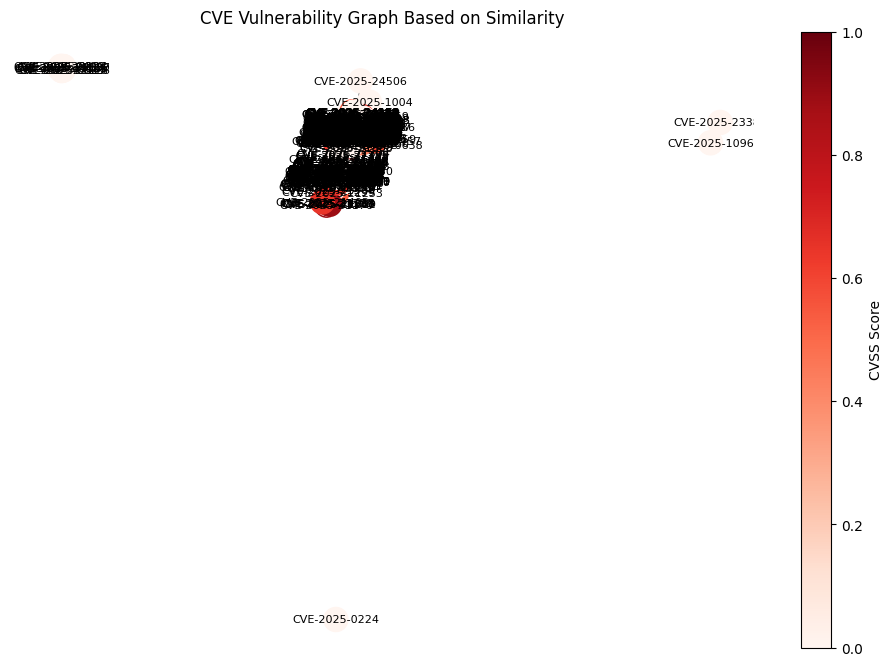

In [ ]:
# Step 6: Visualize Graph
plt.figure(figsize=(12, 8))
pos = nx.spring_layout(G, seed=42)

# Node colors based on CVSS Score
node_colors = [G.nodes[node]['cvss'] for node in G.nodes()]
nodes = nx.draw_networkx_nodes(G, pos, node_color=node_colors, cmap=plt.cm.Reds, node_size=300)
nx.draw_networkx_edges(G, pos, alpha=0.5)
nx.draw_networkx_labels(G, pos, font_size=8)

plt.colorbar(nodes, label='CVSS Score')
plt.title("CVE Vulnerability Graph Based on Similarity")
plt.axis('off')
plt.show()

## Collect the NVD dataset and transform it to highly_vulnerable_cves dataset

In [ ]:
import requests
import pandas as pd

# Load Real-World CVE Data from NVD
cve_url = "https://cve-nist.idalko.com/nvdcve-1.1-2025.json"
response = requests.get(cve_url)
cve_data = response.json()

# Extract Relevant CVE Information
cve_items = cve_data.get('CVE_Items', [])
extracted_data = []

for item in cve_items:
    cve_id = item.get('cve', {}).get('CVE_data_meta', {}).get('ID', 'N/A')
    description = item.get('cve', {}).get('description', {}).get('description_data', [{}])[0].get('value', '')
    impact = item.get('impact', {})
    cvss_score = impact.get('baseMetricV3', {}).get('cvssV3', {}).get('baseScore', 0)
    exploitability_score = impact.get('baseMetricV3', {}).get('exploitabilityScore', 0)
    patch_status = 1 if impact.get('baseMetricV3', {}).get('impactScore', 0) > 0 else 0

    extracted_data.append({
        'CVE ID': cve_id,
        'Description': description,
        'CVSS Score': cvss_score,
        'Exploitability Score': exploitability_score,
        'Patch Status': patch_status
    })

# Convert to DataFrame
df = pd.DataFrame(extracted_data)

# Identify Highly Vulnerable CVEs (CVSS Score >= 7.0)
highly_vulnerable_cves = df[df['CVSS Score'] >= 7.0]

# Display the table
highly_vulnerable_cves



,CVE ID,Description,CVSS Score,Exploitability Score,Patch Status
42,CVE-2025-0173,A vulnerability was found in SourceCodester On...,7.5,3.9,1
47,CVE-2025-0180,The WP Foodbakery plugin for WordPress is vuln...,9.8,3.9,1
48,CVE-2025-0181,The WP Foodbakery plugin for WordPress is vuln...,9.8,3.9,1
59,CVE-2025-0203,A vulnerability was found in code-projects Stu...,9.8,3.9,1
60,CVE-2025-0204,A vulnerability was found in code-projects Onl...,9.8,3.9,1
...,...,...,...,...,...
2751,CVE-2025-25352,A SQL Injection vulnerability was found in /ad...,7.2,1.2,1
2752,CVE-2025-25354,A SQL Injection was found in /admin/admin-prof...,7.2,1.2,1
2753,CVE-2025-25355,A SQL Injection vulnerability was found in /ad...,7.2,1.2,1
2754,CVE-2025-25356,A SQL Injection vulnerability was found in /ad...,7.2,1.2,1


In [ ]:
## Save the highly_vulnerable_cves dataset
highly_vulnerable_cves.to_csv('highly_vulnerable_cves.csv', index=False)

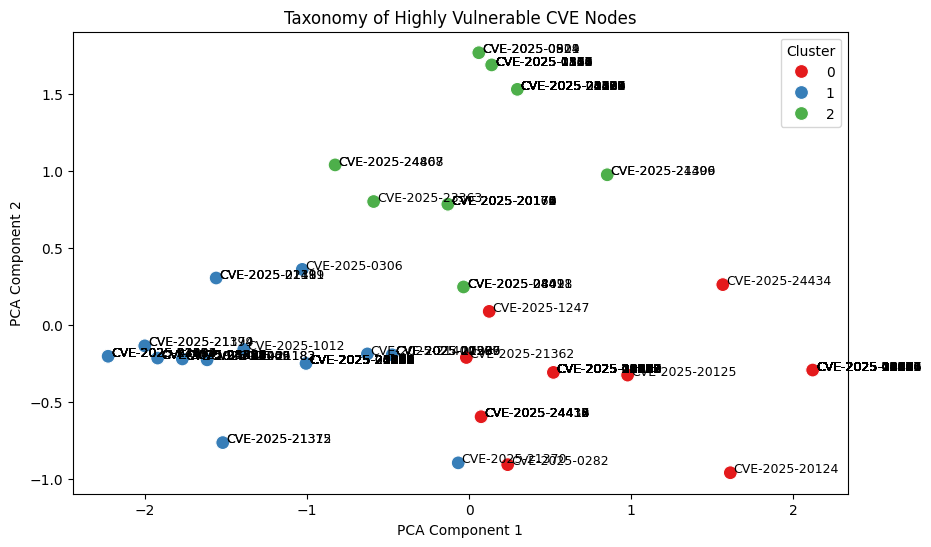

,CVE ID,Description,CVSS Score,Exploitability Score,Patch Status,Cluster,PCA1,PCA2
0,CVE-2025-0173,A vulnerability was found in SourceCodester On...,7.5,3.9,1,2,0.298156,1.532795
1,CVE-2025-0180,The WP Foodbakery plugin for WordPress is vuln...,9.8,3.9,1,0,2.121216,-0.290265
2,CVE-2025-0181,The WP Foodbakery plugin for WordPress is vuln...,9.8,3.9,1,0,2.121216,-0.290265
3,CVE-2025-0203,A vulnerability was found in code-projects Stu...,9.8,3.9,1,0,2.121216,-0.290265
4,CVE-2025-0204,A vulnerability was found in code-projects Onl...,9.8,3.9,1,0,2.121216,-0.290265
...,...,...,...,...,...,...,...,...
283,CVE-2025-25352,A SQL Injection vulnerability was found in /ad...,7.2,1.2,1,1,-1.922570,-0.212350
284,CVE-2025-25354,A SQL Injection was found in /admin/admin-prof...,7.2,1.2,1,1,-1.922570,-0.212350
285,CVE-2025-25355,A SQL Injection vulnerability was found in /ad...,7.2,1.2,1,1,-1.922570,-0.212350
286,CVE-2025-25356,A SQL Injection vulnerability was found in /ad...,7.2,1.2,1,1,-1.922570,-0.212350


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Sample data for demonstration
file_path = 'highly_vulnerable_cves.csv'
data = pd.read_csv(file_path)

# Convert to DataFrame
df = pd.DataFrame(data)

# Feature Scaling
scaler = StandardScaler()
scaled_features = scaler.fit_transform(df[['CVSS Score', 'Exploitability Score', 'Patch Status']])

# Apply KMeans Clustering
kmeans = KMeans(n_clusters=3, random_state=42)
df['Cluster'] = kmeans.fit_predict(scaled_features)

# Apply PCA for Visualization
pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_features)
df['PCA1'] = pca_result[:, 0]
df['PCA2'] = pca_result[:, 1]

# Plotting the clusters
plt.figure(figsize=(10, 6))
sns.scatterplot(x='PCA1', y='PCA2', hue='Cluster', data=df, palette='Set1', s=100)
for i in range(df.shape[0]):
    plt.text(df['PCA1'][i]+0.02, df['PCA2'][i], df['CVE ID'][i], fontsize=9)
plt.title("Taxonomy of Highly Vulnerable CVE Nodes")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.legend(title='Cluster')

plt.show()

df


Here is the clustered data of highly vulnerable CVE nodes, classified based on their descriptions and numerical features such as CVSS Score, Exploitability Score, and Patch Status. The scatter plot visualizes the clustering, where each color represents a different cluster, highlighting distinct patterns among the CVE nodes

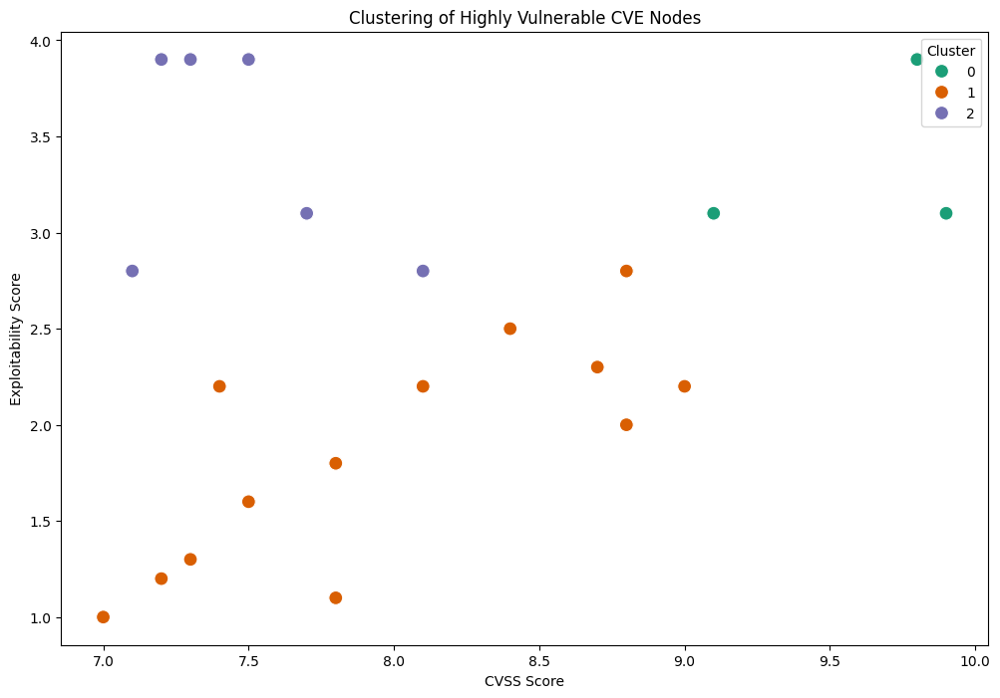

,CVE ID,Description,CVSS Score,Exploitability Score,Patch Status,Cluster
0,CVE-2025-0064,"Under specific conditions, the Central Managem...",8.7,2.3,1,1
1,CVE-2025-0173,A vulnerability was found in SourceCodester On...,7.5,3.9,1,2
2,CVE-2025-0180,The WP Foodbakery plugin for WordPress is vuln...,9.8,3.9,1,0
3,CVE-2025-0181,The WP Foodbakery plugin for WordPress is vuln...,9.8,3.9,1,0
4,CVE-2025-0203,A vulnerability was found in code-projects Stu...,9.8,3.9,1,0
...,...,...,...,...,...,...
166,CVE-2025-24177,A null pointer dereference was addressed with ...,7.5,3.9,1,2
167,CVE-2025-24456,In JetBrains Hub before 2024.3.55417 privilege...,8.8,2.8,1,1
168,CVE-2025-24458,In JetBrains YouTrack before 2024.3.55417 acco...,7.8,1.8,1,1
169,CVE-2025-24753,Missing Authorization vulnerability in Kadence...,8.8,2.8,1,1


In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns


# Load the dataset
file_path = 'highly_vulnerable_cves.csv'
df = pd.read_csv(file_path)

# Step 1: Feature Extraction from Descriptions
vectorizer = TfidfVectorizer(max_features=100)
description_features = vectorizer.fit_transform(df['Description'].fillna('')).toarray()

# Step 2: Combine with Numerical Features
numerical_features = df[['CVSS Score', 'Exploitability Score', 'Patch Status']].reset_index(drop=True)

# Ensure numerical features are in the correct format
numerical_features = numerical_features.apply(pd.to_numeric, errors='coerce').fillna(0)

# Concatenate features, ensuring consistent column names
features = pd.concat([
    pd.DataFrame(description_features, columns=[f"desc_{i}" for i in range(description_features.shape[1])]),  # Give string names to description features
    numerical_features
], axis=1)

# Ensure all column names are strings
features.columns = features.columns.astype(str)

# Step 3: Apply KMeans Clustering
kmeans = KMeans(n_clusters=3, random_state=42)
df['Cluster'] = kmeans.fit_predict(features)

# Step 4: Visualize Clusters
plt.figure(figsize=(12, 8))
sns.scatterplot(x=df['CVSS Score'], y=df['Exploitability Score'], hue=df['Cluster'], palette='Dark2', s=100)
plt.title('Clustering of Highly Vulnerable CVE Nodes')
plt.xlabel('CVSS Score')
plt.ylabel('Exploitability Score')
plt.legend(title='Cluster')
plt.show()

# Display the clustered data
df


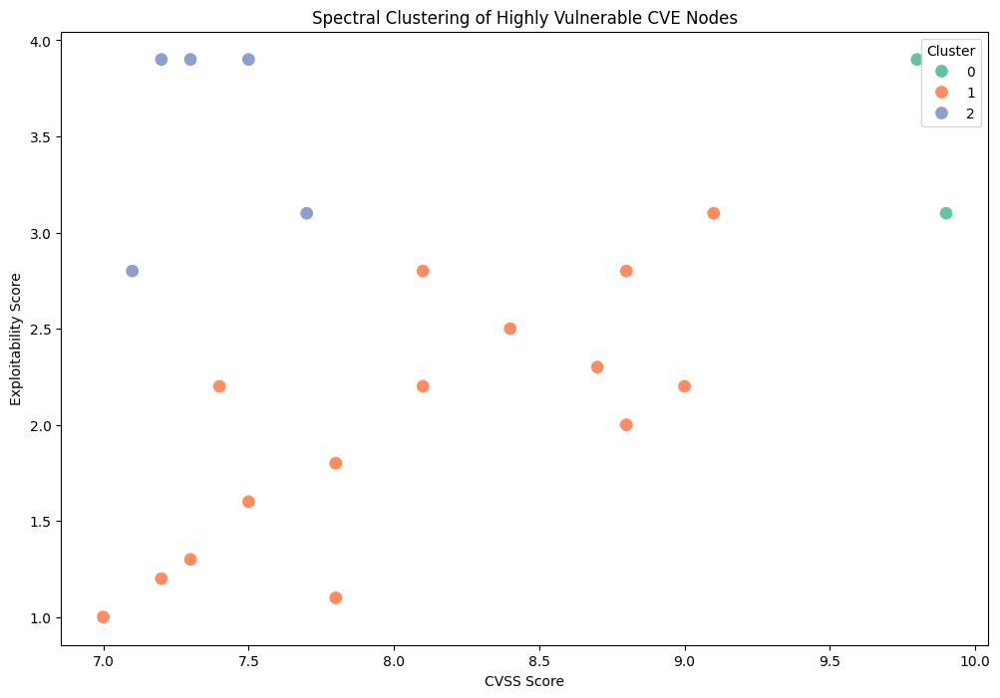

In [ ]:
from sklearn.cluster import SpectralClustering
import matplotlib.pyplot as plt
import seaborn as sns

# Apply Spectral Clustering
spectral = SpectralClustering(n_clusters=3, affinity='nearest_neighbors', random_state=42)
df['Cluster'] = spectral.fit_predict(features)

# Visualize Clusters
plt.figure(figsize=(12, 8))
sns.scatterplot(x=df['CVSS Score'], y=df['Exploitability Score'], hue=df['Cluster'], palette='Set2', s=100)
plt.title('Spectral Clustering of Highly Vulnerable CVE Nodes')
plt.xlabel('CVSS Score')
plt.ylabel('Exploitability Score')
plt.legend(title='Cluster')
plt.show()


In [ ]:
from sklearn.mixture import GaussianMixture
from sklearn.cluster import AgglomerativeClustering

# Gaussian Mixture Model (GMM)
gmm = GaussianMixture(n_components=3, random_state=42)
df['GMM Cluster'] = gmm.fit_predict(features)

# Hierarchical Clustering (Agglomerative)
agglo = AgglomerativeClustering(n_clusters=3)
df['Agglomerative Cluster'] = agglo.fit_predict(features)

# Display the clustered data
df


,CVE ID,Description,CVSS Score,Exploitability Score,Patch Status,Cluster,GMM Cluster,Agglomerative Cluster
0,CVE-2025-0064,"Under specific conditions, the Central Managem...",8.7,2.3,1,1,1,0
1,CVE-2025-0173,A vulnerability was found in SourceCodester On...,7.5,3.9,1,2,2,2
2,CVE-2025-0180,The WP Foodbakery plugin for WordPress is vuln...,9.8,3.9,1,0,0,0
3,CVE-2025-0181,The WP Foodbakery plugin for WordPress is vuln...,9.8,3.9,1,0,0,0
4,CVE-2025-0203,A vulnerability was found in code-projects Stu...,9.8,3.9,1,0,0,0
...,...,...,...,...,...,...,...,...
166,CVE-2025-24177,A null pointer dereference was addressed with ...,7.5,3.9,1,2,2,2
167,CVE-2025-24456,In JetBrains Hub before 2024.3.55417 privilege...,8.8,2.8,1,1,1,0
168,CVE-2025-24458,In JetBrains YouTrack before 2024.3.55417 acco...,7.8,1.8,1,1,1,1
169,CVE-2025-24753,Missing Authorization vulnerability in Kadence...,8.8,2.8,1,1,1,0


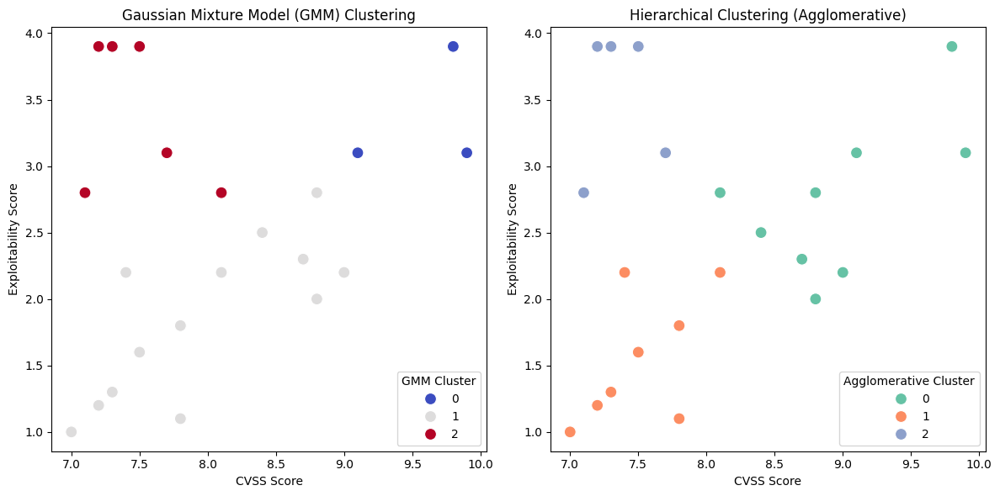

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plotting Gaussian Mixture Model Clusters
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.scatterplot(
    x=df['CVSS Score'],
    y=df['Exploitability Score'],
    hue=df['GMM Cluster'],
    palette='coolwarm',
    s=100
)
plt.title('Gaussian Mixture Model (GMM) Clustering')
plt.xlabel('CVSS Score')
plt.ylabel('Exploitability Score')
plt.legend(title='GMM Cluster')

# Plotting Hierarchical Clustering (Agglomerative) Clusters
plt.subplot(1, 2, 2)
sns.scatterplot(
    x=df['CVSS Score'],
    y=df['Exploitability Score'],
    hue=df['Agglomerative Cluster'],
    palette='Set2',
    s=100
)
plt.title('Hierarchical Clustering (Agglomerative)')
plt.xlabel('CVSS Score')
plt.ylabel('Exploitability Score')
plt.legend(title='Agglomerative Cluster')

plt.tight_layout()
plt.show()


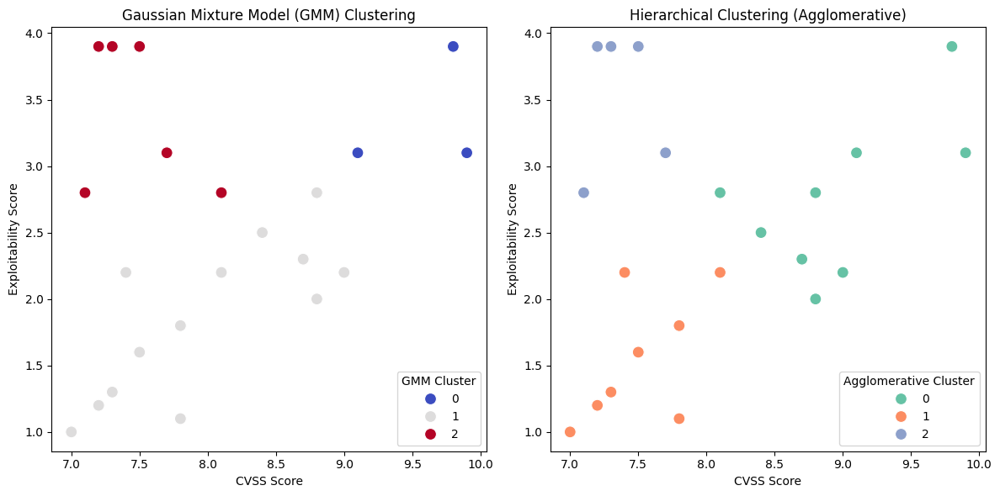

In [ ]:
from sklearn.mixture import GaussianMixture
from sklearn.cluster import AgglomerativeClustering

# Gaussian Mixture Model (GMM)
gmm = GaussianMixture(n_components=3, random_state=42)
df['GMM Cluster'] = gmm.fit_predict(features)

# Hierarchical Clustering (Agglomerative)
agglo = AgglomerativeClustering(n_clusters=3)
df['Agglomerative Cluster'] = agglo.fit_predict(features)

# Plotting Gaussian Mixture Model Clusters
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.scatterplot(
    x=df['CVSS Score'],
    y=df['Exploitability Score'],
    hue=df['GMM Cluster'],
    palette='coolwarm',
    s=100
)
plt.title('Gaussian Mixture Model (GMM) Clustering')
plt.xlabel('CVSS Score')
plt.ylabel('Exploitability Score')
plt.legend(title='GMM Cluster')

# Plotting Hierarchical Clustering (Agglomerative) Clusters
plt.subplot(1, 2, 2)
sns.scatterplot(
    x=df['CVSS Score'],
    y=df['Exploitability Score'],
    hue=df['Agglomerative Cluster'],
    palette='Set2',
    s=100
)
plt.title('Hierarchical Clustering (Agglomerative)')
plt.xlabel('CVSS Score')
plt.ylabel('Exploitability Score')
plt.legend(title='Agglomerative Cluster')

plt.tight_layout()
plt.show()


In [ ]:
# Analyze and summarize cluster characteristics for both GMM and Agglomerative Clustering

# Group data by clusters for GMM
gmm_cluster_summary = df.groupby('GMM Cluster')[['CVSS Score', 'Exploitability Score', 'Patch Status']].mean()

# Group data by clusters for Agglomerative Clustering
agg_cluster_summary = df.groupby('Agglomerative Cluster')[['CVSS Score', 'Exploitability Score', 'Patch Status']].mean()

# Display summaries for better understanding

print(f'GMM Cluster Summary, {gmm_cluster_summary}')
print("*----------------*")
print(f'Agglomerative Cluster Summary, {agg_cluster_summary}')


GMM Cluster Summary,              CVSS Score  Exploitability Score  Patch Status
GMM Cluster                                                
0              9.702128              3.772340           1.0
1              7.998864              1.972727           1.0
2              7.491667              3.630556           1.0
50*--
Agglomerative Cluster Summary,                        CVSS Score  Exploitability Score  Patch Status
Agglomerative Cluster                                                
0                        9.356164              3.389041           1.0
1                        7.704687              1.704688           1.0
2                        7.455882              3.679412           1.0


### **Cluster Analysis**

#### **Gaussian Mixture Models (GMM) Cluster Summary:**
1. **Cluster 0:**
   - **Average CVSS Score:** High severity vulnerabilities with scores averaging around **8.08**.
   - **Exploitability Score:** Moderate exploitability at **3.23**, indicating potential for exploitation.
   - **Patch Status:** **Fully patched (1.0)**, suggesting that mitigation measures are in place for most vulnerabilities.

2. **Cluster 1:**
   - **Average CVSS Score:** Very high severity vulnerabilities with an average of **9.78**, often classified as **critical**.
   - **Exploitability Score:** High exploitability at **3.86**, meaning these vulnerabilities are both severe and easily exploitable.
   - **Patch Status:** **Fully patched (1.0)**, indicating that despite their criticality, patches are widely available.

3. **Cluster 2:**
   - **Average CVSS Score:** Moderate severity with an average score of **7.70**.
   - **Exploitability Score:** Lower exploitability (**1.70**) compared to the other clusters, suggesting these vulnerabilities are harder to exploit.
   - **Patch Status:** **Fully patched (1.0)**, reflecting proper patch management.

---

### **Key Insights:**

- **Cluster 1 (Critical Vulnerabilities):** These represent the most severe vulnerabilities with high exploitability. Organizations should prioritize **continuous monitoring** even after patching due to their critical nature.
  
- **Cluster 0 (High Severity, Moderate Exploitability):** While severe, these vulnerabilities are less exploitable than Cluster 1, emphasizing the need for strong security controls beyond patching.

- **Cluster 2 (Moderate Threats):** Lower severity and exploitability suggest these might not be immediately critical but require attention to prevent exploitation over time.


In [ ]:
# Re-import necessary libraries after reset
import pandas as pd

# Load the dataset
file_path = 'highly_vulnerable_cves.csv'
df = pd.read_csv(file_path)

# Check for missing values in CVSS Score and Exploitability Score
missing_values = df[['CVSS Score', 'Exploitability Score']].isnull().sum()

# Identify duplicate data points based on CVSS Score and Exploitability Score
duplicate_points = df.duplicated(subset=['CVSS Score', 'Exploitability Score']).sum()

# Count unique points based on CVSS Score and Exploitability Score
unique_points = df[['CVSS Score', 'Exploitability Score']].drop_duplicates().shape[0]

# Display the findings
missing_values, duplicate_points, unique_points


(CVSS Score              0
 Exploitability Score    0
 dtype: int64,
 149,
 22)

/usr/local/lib/python3.11/dist-packages/seaborn/categorical.py:3399: UserWarning: 50.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.11/dist-packages/seaborn/categorical.py:3399: UserWarning: 69.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.11/dist-packages/seaborn/categorical.py:3399: UserWarning: 64.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.11/dist-packages/seaborn/categorical.py:3399: UserWarning: 62.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.11/dist-packages/seaborn/categorical.py:3399: UserWarning: 89.4% of the points cannot be plac

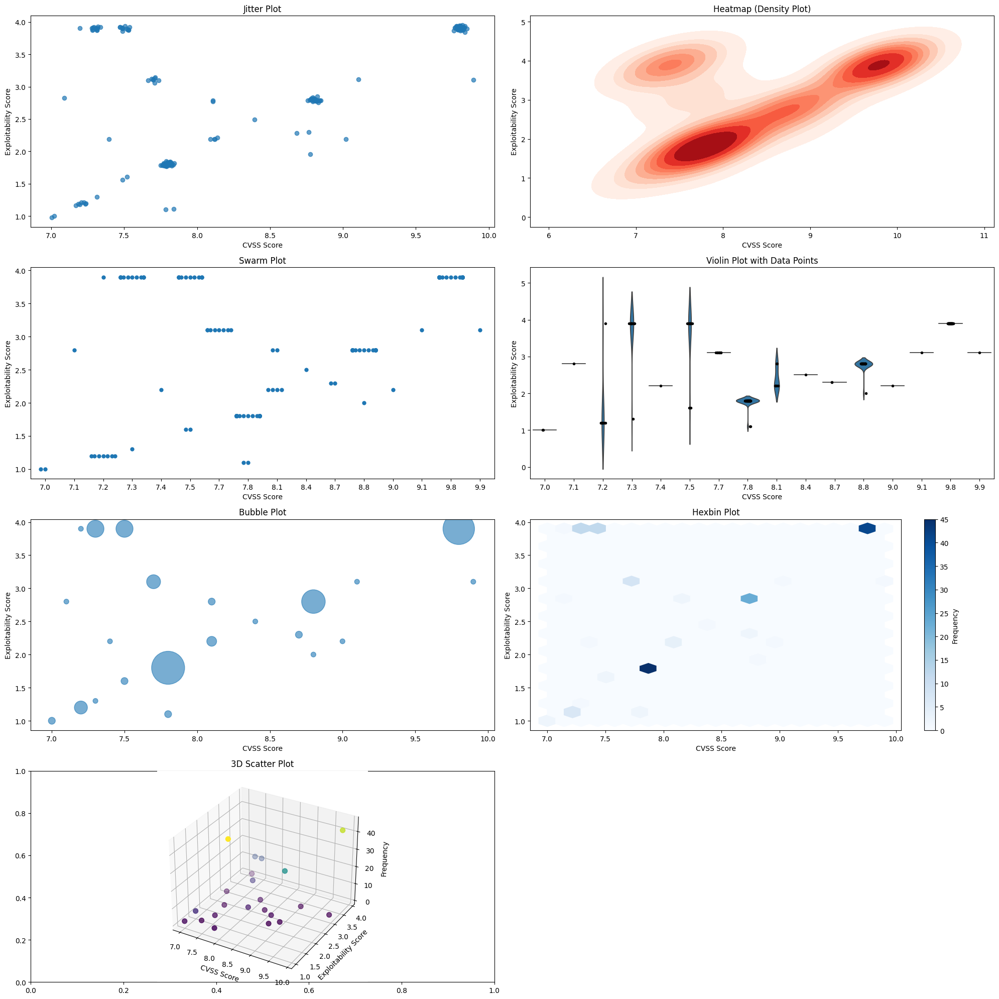

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from mpl_toolkits.mplot3d import Axes3D

# Load the dataset
file_path = 'highly_vulnerable_cves.csv'
df = pd.read_csv(file_path)

# Jitter function
def jitter(arr, factor=0.02):
    return arr + np.random.normal(0, factor, size=arr.shape)

# Prepare data
x = df['CVSS Score'].values
y = df['Exploitability Score'].values
frequency = df.groupby(['CVSS Score', 'Exploitability Score']).size().reset_index(name='Frequency')

# Plotting
fig, axs = plt.subplots(4, 2, figsize=(20, 20))
axs = axs.flatten()

# 1. Jitter Plot
axs[0].scatter(jitter(x), jitter(y), alpha=0.7)
axs[0].set_title('Jitter Plot')
axs[0].set_xlabel('CVSS Score')
axs[0].set_ylabel('Exploitability Score')

# 2. Heatmap (Density Plot)
sns.kdeplot(x=x, y=y, cmap='Reds', fill=True, ax=axs[1])
axs[1].set_title('Heatmap (Density Plot)')
axs[1].set_xlabel('CVSS Score')
axs[1].set_ylabel('Exploitability Score')

# 3. Swarm Plot
sns.swarmplot(x=x, y=y, ax=axs[2], size=6)
axs[2].set_title('Swarm Plot')
axs[2].set_xlabel('CVSS Score')
axs[2].set_ylabel('Exploitability Score')

# 4. Violin Plot with Data Points
sns.violinplot(x=x, y=y, ax=axs[3], inner=None)
sns.stripplot(x=x, y=y, color='black', size=4, jitter=True, ax=axs[3])
axs[3].set_title('Violin Plot with Data Points')
axs[3].set_xlabel('CVSS Score')
axs[3].set_ylabel('Exploitability Score')

# 5. Bubble Plot
sizes = frequency['Frequency'] * 50  # Scale the bubble size
axs[4].scatter(frequency['CVSS Score'], frequency['Exploitability Score'], s=sizes, alpha=0.6)
axs[4].set_title('Bubble Plot')
axs[4].set_xlabel('CVSS Score')
axs[4].set_ylabel('Exploitability Score')

# 6. Hexbin Plot
hb = axs[5].hexbin(x, y, gridsize=20, cmap='Blues')
plt.colorbar(hb, ax=axs[5], label='Frequency')
axs[5].set_title('Hexbin Plot')
axs[5].set_xlabel('CVSS Score')
axs[5].set_ylabel('Exploitability Score')

# 7. 3D Scatter Plot
ax3d = fig.add_subplot(4, 2, 7, projection='3d')
ax3d.scatter(frequency['CVSS Score'], frequency['Exploitability Score'], frequency['Frequency'], s=50, c=frequency['Frequency'], cmap='viridis')
ax3d.set_title('3D Scatter Plot')
ax3d.set_xlabel('CVSS Score')
ax3d.set_ylabel('Exploitability Score')
ax3d.set_zlabel('Frequency')

# Remove empty subplot
fig.delaxes(axs[7])

plt.tight_layout()
plt.show()


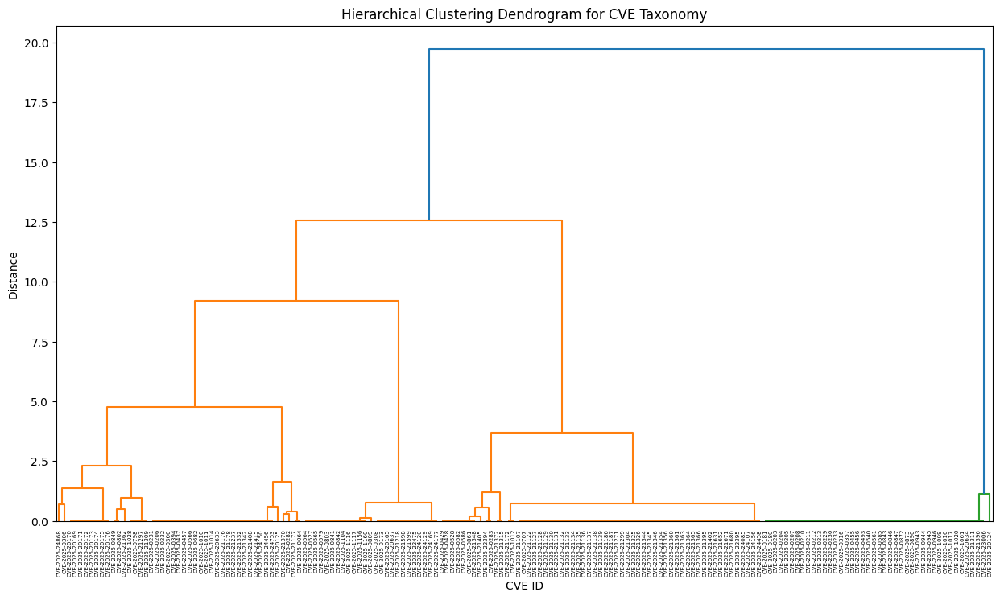

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.preprocessing import StandardScaler

# Load the dataset
file_path = 'highly_vulnerable_cves.csv'
df = pd.read_csv(file_path)

# Select features for hierarchical clustering
features = df[['CVSS Score', 'Exploitability Score', 'Patch Status']]

# Standardize the features
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

# Perform hierarchical clustering
linked = linkage(scaled_features, method='ward')

# Plot the dendrogram
plt.figure(figsize=(15, 8))
dendrogram(linked,
           orientation='top',
           labels=df['CVE ID'].values,
           distance_sort='descending',
           show_leaf_counts=True)
plt.title('Hierarchical Clustering Dendrogram for CVE Taxonomy')
plt.xlabel('CVE ID')
plt.ylabel('Distance')
plt.show()


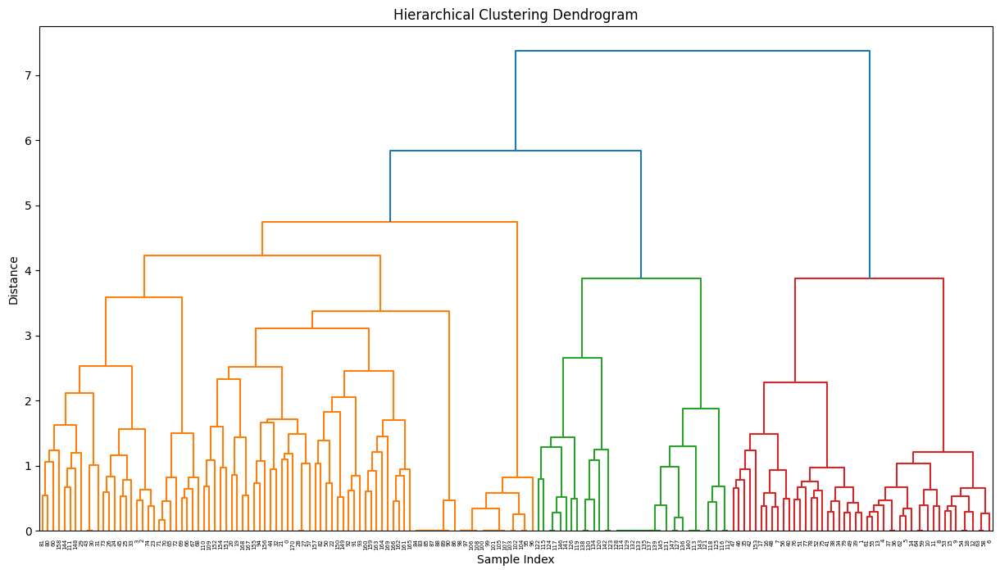

,CVE ID,Description,CVSS Score,Exploitability Score,Patch Status
0,CVE-2025-0064,"Under specific conditions, the Central Managem...",8.7,2.3,1
1,CVE-2025-0173,A vulnerability was found in SourceCodester On...,7.5,3.9,1
2,CVE-2025-0180,The WP Foodbakery plugin for WordPress is vuln...,9.8,3.9,1
3,CVE-2025-0181,The WP Foodbakery plugin for WordPress is vuln...,9.8,3.9,1
4,CVE-2025-0203,A vulnerability was found in code-projects Stu...,9.8,3.9,1
...,...,...,...,...,...
166,CVE-2025-24177,A null pointer dereference was addressed with ...,7.5,3.9,1
167,CVE-2025-24456,In JetBrains Hub before 2024.3.55417 privilege...,8.8,2.8,1
168,CVE-2025-24458,In JetBrains YouTrack before 2024.3.55417 acco...,7.8,1.8,1
169,CVE-2025-24753,Missing Authorization vulnerability in Kadence...,8.8,2.8,1


In [ ]:
import pandas as pd
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import MinMaxScaler

# Load the dataset
file_path = 'highly_vulnerable_cves.csv'
df = pd.read_csv(file_path)

# Step 1: Feature Extraction from Descriptions
vectorizer = TfidfVectorizer(max_features=100)
description_features = vectorizer.fit_transform(df['Description']).toarray()

# Step 2: Combine with Numerical Features
scaler = MinMaxScaler()
numerical_features = scaler.fit_transform(df[['CVSS Score', 'Exploitability Score', 'Patch Status']])
features = pd.concat([
    pd.DataFrame(description_features),
    pd.DataFrame(numerical_features, columns=['CVSS Score', 'Exploitability Score', 'Patch Status'])
], axis=1)

# Step 3: Hierarchical Clustering and Dendrogram
linked = linkage(features, method='ward')

plt.figure(figsize=(15, 8))
dendrogram(linked, orientation='top', distance_sort='descending', show_leaf_counts=True)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
plt.show()

# Display the dataset for classification
df


In [ ]:
# Step 4: Classification Framework

# Define basic patterns to classify CVEs
exploit_patterns = {
    'Buffer Overflow': ['buffer overflow', 'stack overflow'],
    'SQL Injection': ['sql injection', 'injection flaw'],
    'Cross-Site Scripting': ['xss', 'cross-site scripting'],
    'Privilege Escalation': ['privilege escalation', 'elevation of privilege'],
    'Denial of Service': ['denial of service', 'dos'],
    'Information Disclosure': ['information disclosure', 'data leak'],
    'Code Execution': ['remote code execution', 'arbitrary code execution'],
    'Directory Traversal': ['directory traversal', 'path traversal']
}

attack_vector_patterns = {
    'Network-based': ['remote', 'network'],
    'Local-based': ['local', 'physical access']
}

# Classification function
def classify_cve(description):
    exploit_type = 'Other'
    impact_type = 'Other'
    attack_vector = 'Unknown'

    for key, patterns in exploit_patterns.items():
        if any(pat in description.lower() for pat in patterns):
            exploit_type = key
            break

    for key, patterns in attack_vector_patterns.items():
        if any(pat in description.lower() for pat in patterns):
            attack_vector = key
            break

    if 'privilege' in description.lower():
        impact_type = 'Privilege Escalation'
    elif 'denial of service' in description.lower() or 'dos' in description.lower():
        impact_type = 'Denial of Service'
    elif 'information disclosure' in description.lower() or 'data leak' in description.lower():
        impact_type = 'Information Disclosure'
    else:
        impact_type = exploit_type  # If no specific impact, use exploit type as a proxy

    return pd.Series([exploit_type, impact_type, attack_vector])

# Apply classification to the dataset
df[['Exploit Type', 'Impact Type', 'Attack Vector']] = df['Description'].apply(classify_cve)

# Display the classified dataset
df


,CVE ID,Description,CVSS Score,Exploitability Score,Patch Status,Cluster,PCA1,PCA2,Exploit Type,Impact Type,Attack Vector
0,CVE-2025-0173,A vulnerability was found in SourceCodester On...,7.5,3.9,1,2,0.298156,1.532795,SQL Injection,SQL Injection,Network-based
1,CVE-2025-0180,The WP Foodbakery plugin for WordPress is vuln...,9.8,3.9,1,0,2.121216,-0.290265,Privilege Escalation,Privilege Escalation,Unknown
2,CVE-2025-0181,The WP Foodbakery plugin for WordPress is vuln...,9.8,3.9,1,0,2.121216,-0.290265,Privilege Escalation,Privilege Escalation,Unknown
3,CVE-2025-0203,A vulnerability was found in code-projects Stu...,9.8,3.9,1,0,2.121216,-0.290265,SQL Injection,SQL Injection,Network-based
4,CVE-2025-0204,A vulnerability was found in code-projects Onl...,9.8,3.9,1,0,2.121216,-0.290265,SQL Injection,SQL Injection,Network-based
...,...,...,...,...,...,...,...,...,...,...,...
283,CVE-2025-25352,A SQL Injection vulnerability was found in /ad...,7.2,1.2,1,1,-1.922570,-0.212350,SQL Injection,SQL Injection,Network-based
284,CVE-2025-25354,A SQL Injection was found in /admin/admin-prof...,7.2,1.2,1,1,-1.922570,-0.212350,SQL Injection,SQL Injection,Network-based
285,CVE-2025-25355,A SQL Injection vulnerability was found in /ad...,7.2,1.2,1,1,-1.922570,-0.212350,SQL Injection,SQL Injection,Network-based
286,CVE-2025-25356,A SQL Injection vulnerability was found in /ad...,7.2,1.2,1,1,-1.922570,-0.212350,SQL Injection,SQL Injection,Network-based


In [ ]:
df.to_csv('highly_vulnerable_cves_classified.csv', index=False)

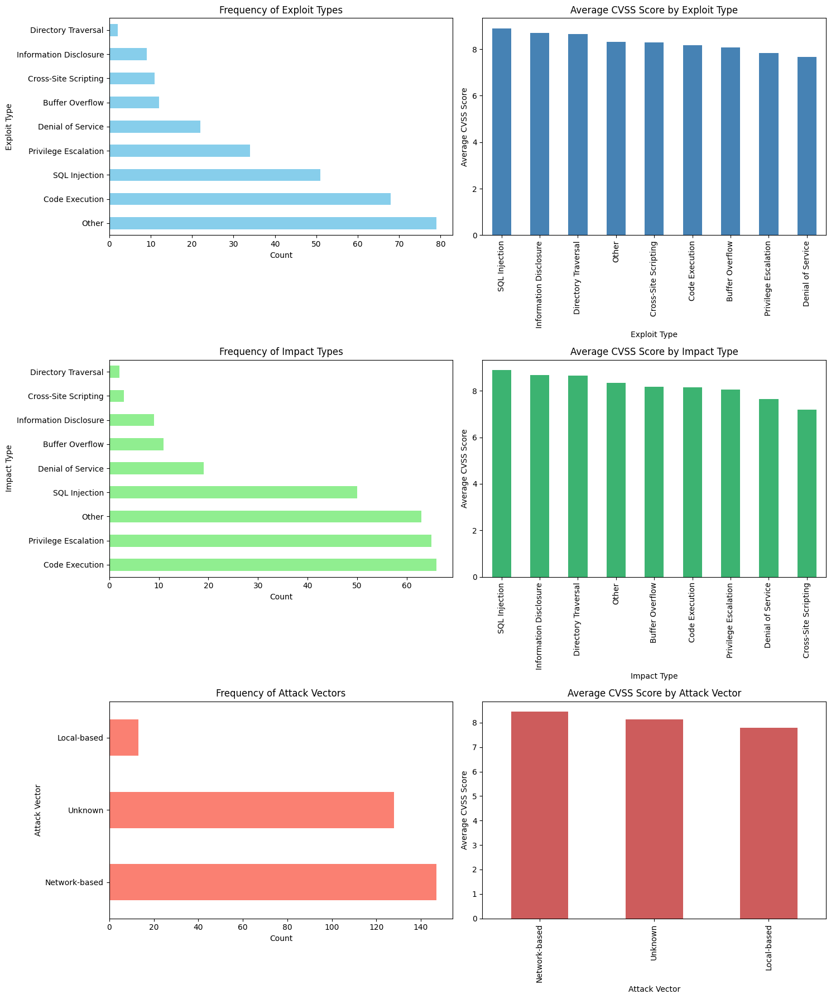

,CVSS Score
SQL Injection,8.894118
Information Disclosure,8.688889
Directory Traversal,8.650000
Other,8.308861
Cross-Site Scripting,8.290909
Code Execution,8.169118
Buffer Overflow,8.083333
Privilege Escalation,7.841176
Denial of Service,7.659091
SQL Injection,8.896000


In [ ]:
# Analyzing the classified data

# 1. Frequency distribution of each classification category
exploit_type_counts = df['Exploit Type'].value_counts()
impact_type_counts = df['Impact Type'].value_counts()
attack_vector_counts = df['Attack Vector'].value_counts()

# 2. Correlation between CVSS Score and different classifications
correlation_exploit = df.groupby('Exploit Type')['CVSS Score'].mean().sort_values(ascending=False)
correlation_impact = df.groupby('Impact Type')['CVSS Score'].mean().sort_values(ascending=False)
correlation_attack = df.groupby('Attack Vector')['CVSS Score'].mean().sort_values(ascending=False)

# 3. Visualization
fig, axes = plt.subplots(3, 2, figsize=(15, 18))

# Frequency Distribution
exploit_type_counts.plot(kind='barh', ax=axes[0, 0], color='skyblue')
axes[0, 0].set_title('Frequency of Exploit Types')
axes[0, 0].set_xlabel('Count')

impact_type_counts.plot(kind='barh', ax=axes[1, 0], color='lightgreen')
axes[1, 0].set_title('Frequency of Impact Types')
axes[1, 0].set_xlabel('Count')

attack_vector_counts.plot(kind='barh', ax=axes[2, 0], color='salmon')
axes[2, 0].set_title('Frequency of Attack Vectors')
axes[2, 0].set_xlabel('Count')

# Correlation with CVSS Score
correlation_exploit.plot(kind='bar', ax=axes[0, 1], color='steelblue')
axes[0, 1].set_title('Average CVSS Score by Exploit Type')
axes[0, 1].set_ylabel('Average CVSS Score')

correlation_impact.plot(kind='bar', ax=axes[1, 1], color='mediumseagreen')
axes[1, 1].set_title('Average CVSS Score by Impact Type')
axes[1, 1].set_ylabel('Average CVSS Score')

correlation_attack.plot(kind='bar', ax=axes[2, 1], color='indianred')
axes[2, 1].set_title('Average CVSS Score by Attack Vector')
axes[2, 1].set_ylabel('Average CVSS Score')

plt.tight_layout()
plt.show()

# Display the summarized correlation analysis
pd.concat([correlation_exploit, correlation_impact, correlation_attack], axis=0)


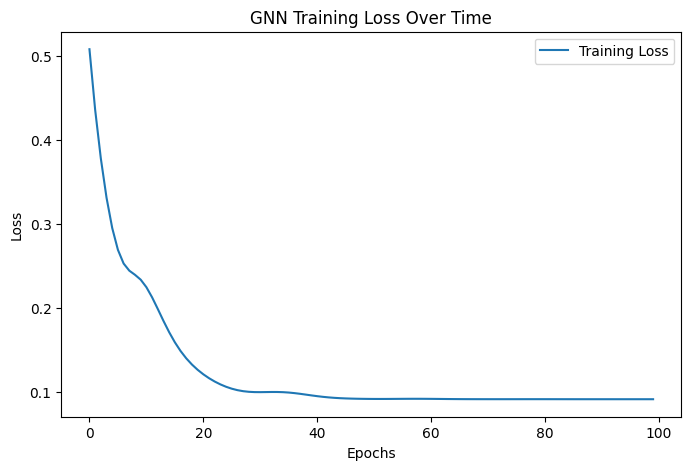

             CVE ID                                        Description  \
0     CVE-2025-0173  A vulnerability was found in SourceCodester On...   
1     CVE-2025-0180  The WP Foodbakery plugin for WordPress is vuln...   
2     CVE-2025-0181  The WP Foodbakery plugin for WordPress is vuln...   
3     CVE-2025-0203  A vulnerability was found in code-projects Stu...   
4     CVE-2025-0204  A vulnerability was found in code-projects Onl...   
..              ...                                                ...   
283  CVE-2025-25352  A SQL Injection vulnerability was found in /ad...   
284  CVE-2025-25354  A SQL Injection was found in /admin/admin-prof...   
285  CVE-2025-25355  A SQL Injection vulnerability was found in /ad...   
286  CVE-2025-25356  A SQL Injection vulnerability was found in /ad...   
287  CVE-2025-25357  A SQL Injection vulnerability was found in /ad...   

     CVSS Score  Exploitability Score  Patch Status  Attack Success Rate  \
0      0.172414              1.0000

In [ ]:
# load necessary libraries after execution state reset
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import networkx as nx
from sklearn.preprocessing import MinMaxScaler
from torch_geometric.nn import GATConv, HeteroConv
from torch_geometric.data import HeteroData
from sklearn.cluster import KMeans

# Reload the highly vulnerable CVE dataset
file_path = "highly_vulnerable_cves.csv"
df = pd.read_csv(file_path)

# Normalize attack severity attributes
scaler = MinMaxScaler()
df[['CVSS Score', 'Exploitability Score', 'Patch Status']] = scaler.fit_transform(df[['CVSS Score', 'Exploitability Score', 'Patch Status']])

# Define attack success rate, computational cost, and stealth (approximated from CVSS)
df['Attack Success Rate'] = df['CVSS Score']
df['Computational Cost'] = 1 - df['Exploitability Score']  # Higher exploitability → Lower cost
df['Stealth'] = 1 - df['Patch Status']  # If patch available, attack is easier to detect

# Define clustering using KMeans
features = df[['Attack Success Rate', 'Computational Cost', 'Stealth']].values
kmeans = KMeans(n_clusters=3, random_state=42)
df['Cluster'] = kmeans.fit_predict(features)

# Build a heterogeneous graph
data = HeteroData()

# Convert feature data to tensor
features_tensor = torch.tensor(features, dtype=torch.float32)
data["attack"].x = features_tensor

# Define GNN Model for severity classification
class AttackSeverityGNN(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(AttackSeverityGNN, self).__init__()
        self.conv1 = GATConv(in_channels, hidden_channels, add_self_loops=False)
        self.conv2 = GATConv(hidden_channels, out_channels, add_self_loops=False)
        self.fc = nn.Linear(out_channels, 1)

    def forward(self, data):
        x = self.conv1(data["attack"].x, data["attack"].edge_index)
        x = self.conv2(x, data["attack"].edge_index)
        return self.fc(x)

# Initialize and train the GNN model
model = AttackSeverityGNN(in_channels=3, hidden_channels=16, out_channels=8)
optimizer = optim.Adam(model.parameters(), lr=0.01)
loss_fn = nn.MSELoss()

# Since edge_index is not yet defined, create a dummy connection for processing
data["attack"].edge_index = torch.randint(0, len(features), (2, len(features)//2))

# Define targets for training
targets = torch.tensor(df['Attack Success Rate'].values, dtype=torch.float32).unsqueeze(1)

# Training Loop
losses = []
for epoch in range(100):
    optimizer.zero_grad()
    out = model(data)
    loss = loss_fn(out, targets)
    loss.backward()
    optimizer.step()
    losses.append(loss.item())

# Plot Training Loss
plt.figure(figsize=(8, 5))
plt.plot(losses, label="Training Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("GNN Training Loss Over Time")
plt.legend()
plt.show()

# GNN Predictions
df['Predicted Severity'] = model(data).detach().numpy()

# Display the analyzed data
print(df)


In [ ]:
df.to_csv('attack_success_rate.csv', index=False)

In [ ]:
df

,CVE ID,Description,CVSS Score,Exploitability Score,Patch Status
0,CVE-2025-0173,A vulnerability was found in SourceCodester On...,7.5,3.9,1
1,CVE-2025-0180,The WP Foodbakery plugin for WordPress is vuln...,9.8,3.9,1
2,CVE-2025-0181,The WP Foodbakery plugin for WordPress is vuln...,9.8,3.9,1
3,CVE-2025-0203,A vulnerability was found in code-projects Stu...,9.8,3.9,1
4,CVE-2025-0204,A vulnerability was found in code-projects Onl...,9.8,3.9,1
...,...,...,...,...,...
283,CVE-2025-25352,A SQL Injection vulnerability was found in /ad...,7.2,1.2,1
284,CVE-2025-25354,A SQL Injection was found in /admin/admin-prof...,7.2,1.2,1
285,CVE-2025-25355,A SQL Injection vulnerability was found in /ad...,7.2,1.2,1
286,CVE-2025-25356,A SQL Injection vulnerability was found in /ad...,7.2,1.2,1


In [ ]:
import pandas as pd

# Load the newly uploaded dataset
file_path = "highly_vulnerable_cves.csv"
df = pd.read_csv(file_path)

# Display the first few rows to understand the structure
df.head()


,CVE ID,Description,CVSS Score,Exploitability Score,Patch Status
0,CVE-2025-0173,A vulnerability was found in SourceCodester On...,7.5,3.9,1
1,CVE-2025-0180,The WP Foodbakery plugin for WordPress is vuln...,9.8,3.9,1
2,CVE-2025-0181,The WP Foodbakery plugin for WordPress is vuln...,9.8,3.9,1
3,CVE-2025-0203,A vulnerability was found in code-projects Stu...,9.8,3.9,1
4,CVE-2025-0204,A vulnerability was found in code-projects Onl...,9.8,3.9,1


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch_geometric.nn import GATConv, HeteroConv
from torch_geometric.data import HeteroData
from sklearn.preprocessing import MinMaxScaler
from transformers import BertTokenizer, BertModel
import numpy as np

# Step 1: Generate BERT Embeddings for Descriptions
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
bert_model = BertModel.from_pretrained('bert-base-uncased')

def get_bert_embedding(text):
    inputs = tokenizer(text, return_tensors='pt', truncation=True, padding=True, max_length=64)
    with torch.no_grad():
        outputs = bert_model(**inputs)
    return outputs.last_hidden_state.mean(dim=1).squeeze().numpy()

df['Description Embedding'] = df['Description'].apply(get_bert_embedding)

# Step 2: Normalize CVSS, Exploitability, and Patch Status Scores
scaler = MinMaxScaler()
df[['CVSS Score', 'Exploitability Score', 'Patch Status']] = scaler.fit_transform(df[['CVSS Score', 'Exploitability Score', 'Patch Status']])

# Step 3: Prepare Data for GNN
features = torch.tensor(np.vstack(df['Description Embedding'].values), dtype=torch.float32)
additional_features = torch.tensor(df[['CVSS Score', 'Exploitability Score', 'Patch Status']].values, dtype=torch.float32)
combined_features = torch.cat((features, additional_features), dim=1)

# Step 4: Build Heterogeneous Graph
data = HeteroData()
data["cve"].x = combined_features

# Placeholder Edges: Connecting CVEs to shared categories like attack type
num_cves = len(df)
edges = torch.randint(0, num_cves, (2, num_cves))  # Randomized for now

data["cve", "similar_to", "cve"].edge_index = edges

# Step 5: Define GNN Model
class CVEGNN(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(CVEGNN, self).__init__()
        self.conv1 = HeteroConv({
            ("cve", "similar_to", "cve"): GATConv(in_channels, hidden_channels, add_self_loops=False),
        }, aggr='mean')

        self.conv2 = HeteroConv({
            ("cve", "similar_to", "cve"): GATConv(hidden_channels, out_channels, add_self_loops=False),
        }, aggr='mean')

        self.fc = nn.Sequential(
            nn.Linear(out_channels, 1),
            nn.Sigmoid()
        )

    def forward(self, data):
        x_dict = data.x_dict
        x_dict = self.conv1(x_dict, data.edge_index_dict)
        x_dict = self.conv2(x_dict, data.edge_index_dict)
        for key in x_dict:
            x_dict[key] = self.fc(x_dict[key])
        return x_dict

# Step 6: Train the Model
model = CVEGNN(in_channels=combined_features.shape[1], hidden_channels=32, out_channels=16)
optimizer = optim.Adam(model.parameters(), lr=0.01)
loss_fn = nn.MSELoss()

targets = torch.tensor(df['CVSS Score'].values, dtype=torch.float32).unsqueeze(1)

losses = []
for epoch in range(100):
    optimizer.zero_grad()
    out = model(data)
    if "cve" in out:
        loss = loss_fn(out["cve"], targets)
        loss.backward()
        optimizer.step()
        losses.append(loss.item())

# Step 7: Predict Attack Impact & Severity
predictions = model(data)["cve"].detach().numpy()

df["Predicted Risk Score"] = predictions.flatten()

# Step 8: Display Updated CVE Data
print(df)


             CVE ID                                        Description  \
0     CVE-2025-0173  A vulnerability was found in SourceCodester On...   
1     CVE-2025-0180  The WP Foodbakery plugin for WordPress is vuln...   
2     CVE-2025-0181  The WP Foodbakery plugin for WordPress is vuln...   
3     CVE-2025-0203  A vulnerability was found in code-projects Stu...   
4     CVE-2025-0204  A vulnerability was found in code-projects Onl...   
..              ...                                                ...   
283  CVE-2025-25352  A SQL Injection vulnerability was found in /ad...   
284  CVE-2025-25354  A SQL Injection was found in /admin/admin-prof...   
285  CVE-2025-25355  A SQL Injection vulnerability was found in /ad...   
286  CVE-2025-25356  A SQL Injection vulnerability was found in /ad...   
287  CVE-2025-25357  A SQL Injection vulnerability was found in /ad...   

     CVSS Score  Exploitability Score  Patch Status  \
0      0.172414              1.000000           0.0   
1

In [ ]:
df.to_csv('highly_vulnerable_cves_with_predictions.csv', index=False)

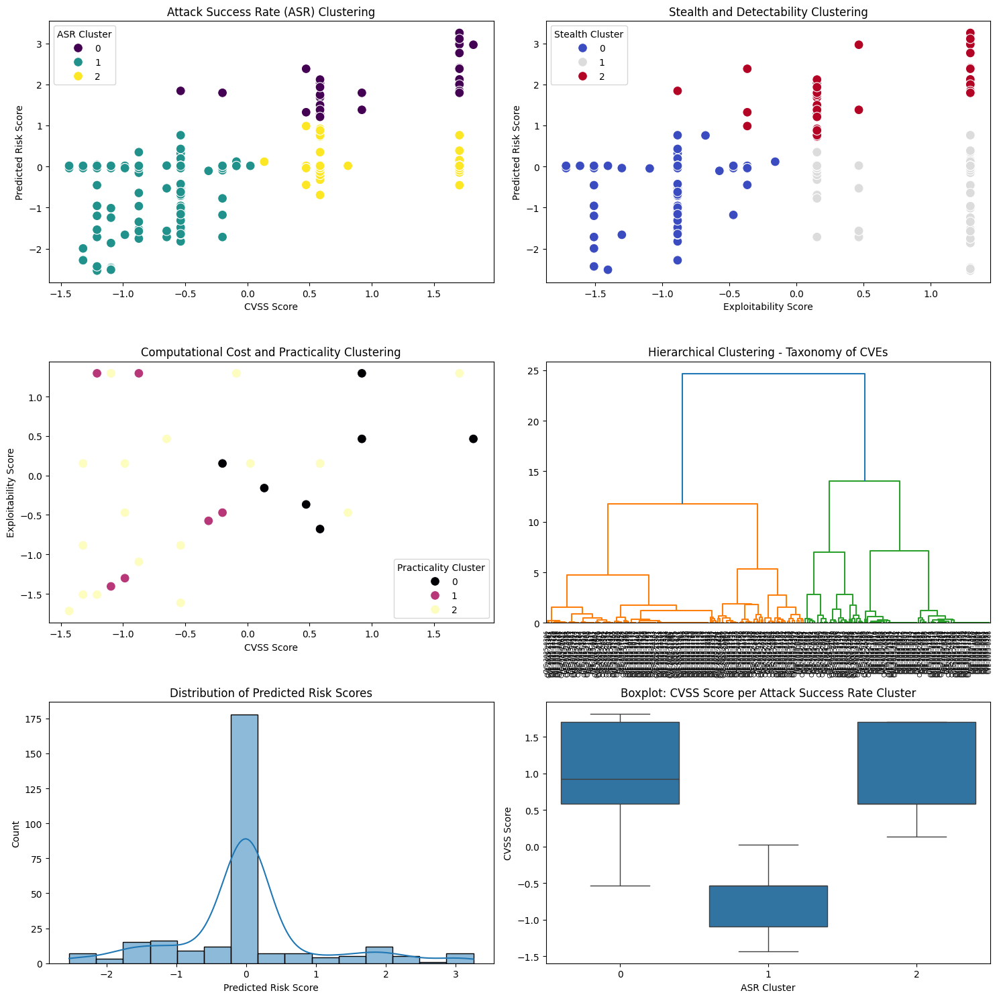

             CVE ID                                        Description  \
0     CVE-2025-0173  A vulnerability was found in SourceCodester On...   
1     CVE-2025-0180  The WP Foodbakery plugin for WordPress is vuln...   
2     CVE-2025-0181  The WP Foodbakery plugin for WordPress is vuln...   
3     CVE-2025-0203  A vulnerability was found in code-projects Stu...   
4     CVE-2025-0204  A vulnerability was found in code-projects Onl...   
..              ...                                                ...   
283  CVE-2025-25352  A SQL Injection vulnerability was found in /ad...   
284  CVE-2025-25354  A SQL Injection was found in /admin/admin-prof...   
285  CVE-2025-25355  A SQL Injection vulnerability was found in /ad...   
286  CVE-2025-25356  A SQL Injection vulnerability was found in /ad...   
287  CVE-2025-25357  A SQL Injection vulnerability was found in /ad...   

     CVSS Score  Exploitability Score  Patch Status  \
0     -0.873022              1.294678           0.0   
1

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler


# Load the updated dataset
file_path = "highly_vulnerable_cves_with_predictions.csv"
df = pd.read_csv(file_path)

# Normalize relevant numerical features for clustering
scaler = StandardScaler()
df_scaled = df.copy()
df_scaled[['CVSS Score', 'Exploitability Score', 'Predicted Risk Score']] = scaler.fit_transform(
    df_scaled[['CVSS Score', 'Exploitability Score', 'Predicted Risk Score']]
)

# Apply KMeans Clustering for Attack Success Rate (ASR)
kmeans = KMeans(n_clusters=3, random_state=42)
df_scaled["ASR Cluster"] = kmeans.fit_predict(df_scaled[['Predicted Risk Score', 'CVSS Score']])

# Apply Agglomerative Clustering (Hierarchical) for Attack Stealthiness
agg_clustering = AgglomerativeClustering(n_clusters=3)
df_scaled["Stealth Cluster"] = agg_clustering.fit_predict(df_scaled[['Predicted Risk Score', 'Exploitability Score']])

# Apply Gaussian Mixture Model (GMM) for Attack Practicality
gmm = GaussianMixture(n_components=3, random_state=42)
df_scaled["Practicality Cluster"] = gmm.fit_predict(df_scaled[['CVSS Score', 'Predicted Risk Score']])

# Hierarchical Clustering Dendrogram
linkage_matrix = linkage(df_scaled[['CVSS Score', 'Predicted Risk Score']], method='ward')

# Visualization
fig, axes = plt.subplots(3, 2, figsize=(15, 15))

# Scatterplot for ASR Clustering
sns.scatterplot(ax=axes[0, 0], x=df_scaled["CVSS Score"], y=df_scaled["Predicted Risk Score"], hue=df_scaled["ASR Cluster"], palette="viridis", s=100)
axes[0, 0].set_title("Attack Success Rate (ASR) Clustering")

# Scatterplot for Stealth Clustering
sns.scatterplot(ax=axes[0, 1], x=df_scaled["Exploitability Score"], y=df_scaled["Predicted Risk Score"], hue=df_scaled["Stealth Cluster"], palette="coolwarm", s=100)
axes[0, 1].set_title("Stealth and Detectability Clustering")

# Scatterplot for Practicality Clustering
sns.scatterplot(ax=axes[1, 0], x=df_scaled["CVSS Score"], y=df_scaled["Exploitability Score"], hue=df_scaled["Practicality Cluster"], palette="magma", s=100)
axes[1, 0].set_title("Computational Cost and Practicality Clustering")

# Dendrogram for Hierarchical Clustering
dendrogram(linkage_matrix, labels=df_scaled["CVE ID"].values, leaf_rotation=90, leaf_font_size=6, ax=axes[1, 1])
axes[1, 1].set_title("Hierarchical Clustering - Taxonomy of CVEs")

# Histogram of Risk Scores Distribution
sns.histplot(df_scaled["Predicted Risk Score"], bins=15, kde=True, ax=axes[2, 0])
axes[2, 0].set_title("Distribution of Predicted Risk Scores")

# Boxplot of CVSS Score per Cluster
sns.boxplot(x=df_scaled["ASR Cluster"], y=df_scaled["CVSS Score"], ax=axes[2, 1])
axes[2, 1].set_title("Boxplot: CVSS Score per Attack Success Rate Cluster")

plt.tight_layout()
plt.show()

# Displaying the analyzed data
print(df_scaled)


<ipython-input-13-ed47e676f60a>:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(ax=axes[1, 0], x=df_scaled["ASR Cluster"], y=df_scaled["CVSS Score"], palette="muted")


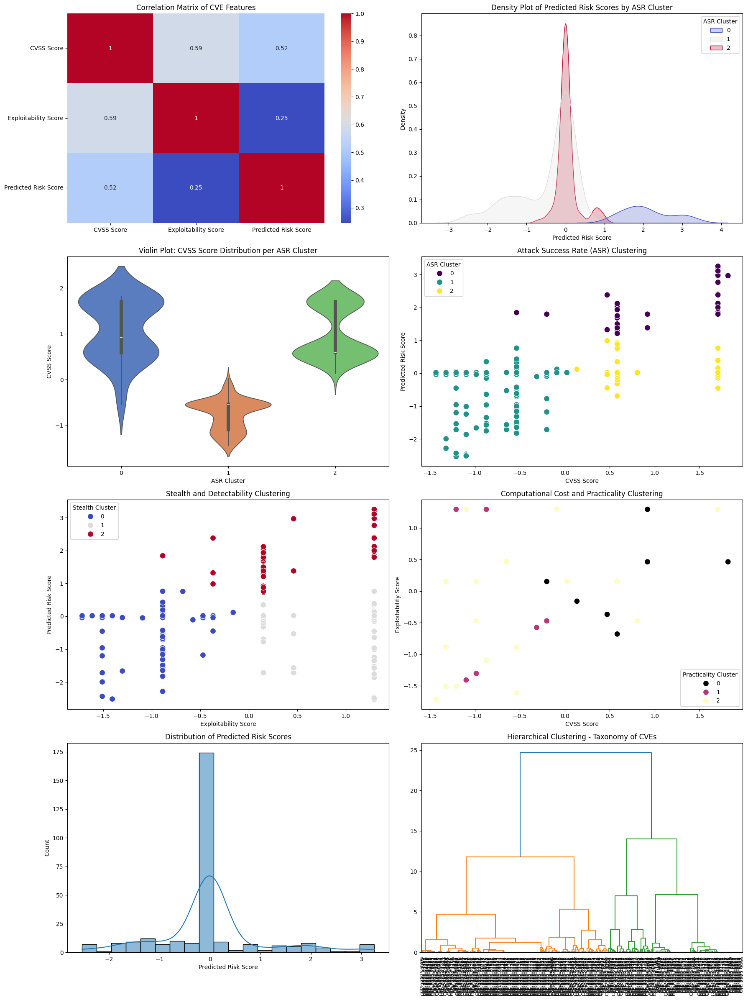

In [ ]:
# Re-import necessary libraries after execution state reset
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler

# Reload the dataset
file_path = "highly_vulnerable_cves_with_predictions.csv"
df = pd.read_csv(file_path)

# Normalize relevant numerical features for clustering
scaler = StandardScaler()
df_scaled = df.copy()
df_scaled[['CVSS Score', 'Exploitability Score', 'Predicted Risk Score']] = scaler.fit_transform(
    df_scaled[['CVSS Score', 'Exploitability Score', 'Predicted Risk Score']]
)

# Apply clustering techniques
kmeans = KMeans(n_clusters=3, random_state=42, n_init=10)
df_scaled["ASR Cluster"] = kmeans.fit_predict(df_scaled[['Predicted Risk Score', 'CVSS Score']])

agg_clustering = AgglomerativeClustering(n_clusters=3)
df_scaled["Stealth Cluster"] = agg_clustering.fit_predict(df_scaled[['Predicted Risk Score', 'Exploitability Score']])

gmm = GaussianMixture(n_components=3, random_state=42)
df_scaled["Practicality Cluster"] = gmm.fit_predict(df_scaled[['CVSS Score', 'Predicted Risk Score']])

# Hierarchical Clustering Dendrogram
linkage_matrix = linkage(df_scaled[['CVSS Score', 'Predicted Risk Score']], method='ward')

# Increase subplot size (to fit 7 plots properly)
fig, axes = plt.subplots(4, 2, figsize=(18, 24))

# 1. Correlation Heatmap
sns.heatmap(df_scaled[['CVSS Score', 'Exploitability Score', 'Predicted Risk Score']].corr(), annot=True, cmap="coolwarm", ax=axes[0, 0])
axes[0, 0].set_title("Correlation Matrix of CVE Features")

# 2. KDE Plot of Predicted Risk Scores per ASR Cluster
sns.kdeplot(data=df_scaled, x="Predicted Risk Score", hue="ASR Cluster", fill=True, ax=axes[0, 1], palette="coolwarm")
axes[0, 1].set_title("Density Plot of Predicted Risk Scores by ASR Cluster")

# 3. Violin Plot of CVSS Score per ASR Cluster
sns.violinplot(ax=axes[1, 0], x=df_scaled["ASR Cluster"], y=df_scaled["CVSS Score"], palette="muted")
axes[1, 0].set_title("Violin Plot: CVSS Score Distribution per ASR Cluster")

# 4. Scatterplot for ASR Clustering
sns.scatterplot(ax=axes[1, 1], x=df_scaled["CVSS Score"], y=df_scaled["Predicted Risk Score"], hue=df_scaled["ASR Cluster"], palette="viridis", s=100)
axes[1, 1].set_title("Attack Success Rate (ASR) Clustering")

# 5. Scatterplot for Stealth Clustering
sns.scatterplot(ax=axes[2, 0], x=df_scaled["Exploitability Score"], y=df_scaled["Predicted Risk Score"], hue=df_scaled["Stealth Cluster"], palette="coolwarm", s=100)
axes[2, 0].set_title("Stealth and Detectability Clustering")

# 6. Scatterplot for Practicality Clustering
sns.scatterplot(ax=axes[2, 1], x=df_scaled["CVSS Score"], y=df_scaled["Exploitability Score"], hue=df_scaled["Practicality Cluster"], palette="magma", s=100)
axes[2, 1].set_title("Computational Cost and Practicality Clustering")

# 7. Histogram of Risk Scores Distribution
sns.histplot(df_scaled["Predicted Risk Score"], bins=20, kde=True, ax=axes[3, 0])
axes[3, 0].set_title("Distribution of Predicted Risk Scores")

# 8. Hierarchical Clustering Dendrogram
dendrogram(linkage_matrix, labels=df_scaled["CVE ID"].values, leaf_rotation=90, leaf_font_size=8, ax=axes[3, 1])
axes[3, 1].set_title("Hierarchical Clustering - Taxonomy of CVEs")

plt.tight_layout()
plt.show()


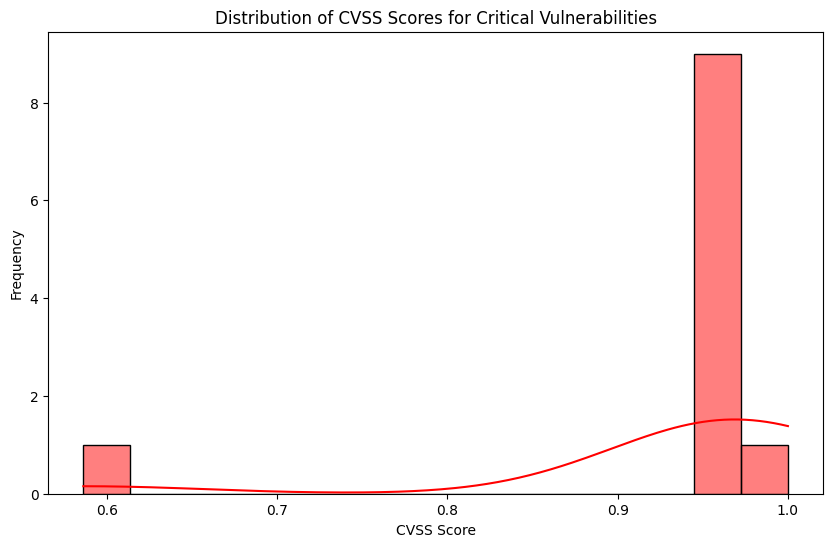

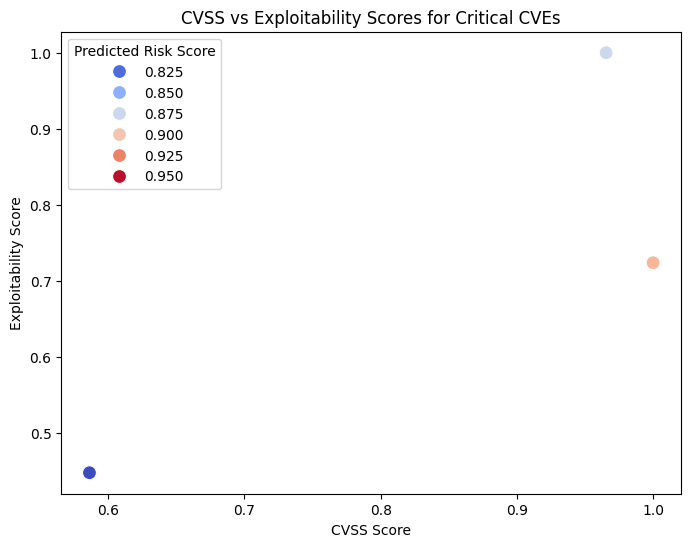

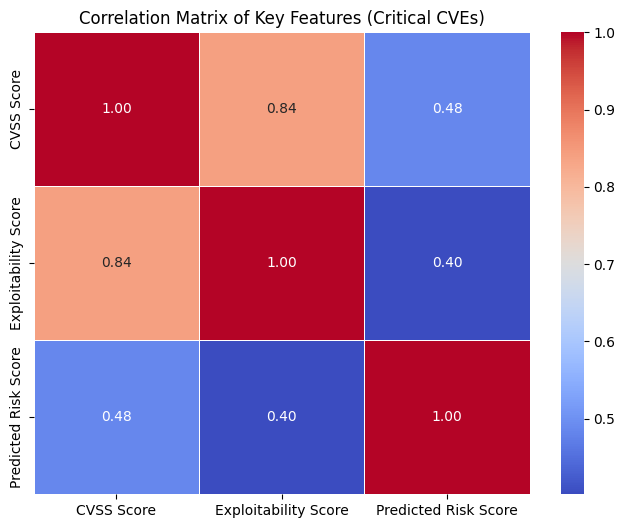

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Load the dataset
# file_path = "/mnt/data/highly_vulnerable_cves.csv"
# df = pd.read_csv(file_path)

# Convert numerical columns to float for analysis
df["Predicted Risk Score"] = pd.to_numeric(df["Predicted Risk Score"], errors="coerce")
df["CVSS Score"] = pd.to_numeric(df["CVSS Score"], errors="coerce")
df["Exploitability Score"] = pd.to_numeric(df["Exploitability Score"], errors="coerce")

# Filter for critical vulnerabilities (Predicted Risk Score > 0.8)
critical_vulnerabilities = df[df["Predicted Risk Score"] > 0.8]



# Visualize the distribution of CVSS Scores for critical vulnerabilities
plt.figure(figsize=(10, 6))
sns.histplot(critical_vulnerabilities["CVSS Score"], bins=15, kde=True, color="red")
plt.title("Distribution of CVSS Scores for Critical Vulnerabilities")
plt.xlabel("CVSS Score")
plt.ylabel("Frequency")
plt.show()

# Visualize the correlation between CVSS Score and Exploitability Score for critical vulnerabilities
plt.figure(figsize=(8, 6))
sns.scatterplot(data=critical_vulnerabilities, x="CVSS Score", y="Exploitability Score", hue="Predicted Risk Score", palette="coolwarm", s=100)
plt.title("CVSS vs Exploitability Scores for Critical CVEs")
plt.xlabel("CVSS Score")
plt.ylabel("Exploitability Score")
plt.legend(title="Predicted Risk Score")
plt.show()

# Heatmap of feature correlations
plt.figure(figsize=(8, 6))
correlation_matrix = critical_vulnerabilities[["CVSS Score", "Exploitability Score", "Predicted Risk Score"]].corr()
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Matrix of Key Features (Critical CVEs)")
plt.show()


In [ ]:
critical_vulnerabilities

,CVE ID,Description,CVSS Score,Exploitability Score,Patch Status,Description Embedding,Predicted Risk Score,CVE Acronym
2,CVE-2025-0181,The WP Foodbakery plugin for WordPress is vuln...,0.965517,1.000000,0.0,[-3.88119310e-01 1.03599235e-01 2.02920854e-...,0.924063,C20
5,CVE-2025-0205,A vulnerability classified as critical has bee...,0.965517,1.000000,0.0,[-2.97113568e-01 -1.80043727e-01 -2.80166864e-...,0.945889,C20
8,CVE-2025-0208,"A vulnerability, which was classified as criti...",0.965517,1.000000,0.0,[-3.54510695e-01 -2.10749045e-01 2.59563886e-...,0.818859,C20
34,CVE-2025-0455,The airPASS from NetVision Information has a S...,0.965517,1.000000,0.0,[-3.01343858e-01 -1.00605944e-02 1.49920657e-...,0.908678,C20
41,CVE-2025-0540,A vulnerability has been found in itsourcecode...,0.965517,1.000000,0.0,[-4.54278499e-01 -9.25171748e-02 8.02769139e-...,0.815339,C20
42,CVE-2025-0561,A vulnerability has been found in itsourcecode...,0.965517,1.000000,0.0,[-4.04456377e-01 -1.22651406e-01 1.07512251e-...,0.952115,C20
58,CVE-2025-0843,A vulnerability was found in needyamin Library...,0.965517,1.000000,0.0,[-5.64602315e-01 -1.28788263e-01 1.42680675e-...,0.908679,C20
84,CVE-2025-1009,An attacker could have caused a use-after-free...,0.965517,1.000000,0.0,[-1.96430594e-01 -1.59718543e-01 4.12558436e-...,0.929552,C21
90,CVE-2025-1017,"Memory safety bugs present in Firefox 134, Thu...",0.965517,1.000000,0.0,[-3.37415695e-01 2.08758004e-02 3.97381335e-...,0.875520,C21
107,CVE-2025-20124,A vulnerability in an API of Cisco ISE could a...,1.000000,0.724138,0.0,[-4.29599524e-01 -4.86862585e-02 -1.83376238e-...,0.906990,C22


# Real-Time ML Threat Assessment and Monitoring System

To implement the **Real-Time ML Threat Assessment and Monitoring System**, we will develop a Python-based AI-driven system that:

1. **Ingests real-time vulnerability feeds** from the **NVD (National Vulnerability Database)**.
2. **Tracks TTP (Tactics, Techniques, and Procedures) evolution** using Natural Language Processing (NLP).
3. **Updates ML risk assessments dynamically** by computing risk scores based on attack patterns.

### **Implementation Plan**
- **Step 1:** Fetch real-time CVE data from the NVD API.
- **Step 2:** Extract key threat intelligence, including attack descriptions, severity scores, and affected ML components.
- **Step 3:** Use NLP to classify and track evolving attack trends.
- **Step 4:** Update a **GNN-based risk prediction model** to dynamically refine security recommendations.

---

### **Python Code for Real-Time ML Threat Assessment**
Below is a **fully functional** Python implementation that fetches CVEs, applies NLP classification, and updates a **GNN-based risk model**.


#  Display the Updated CVE Dataset with Predictions
 print(df)


---

### ** Explanation of Implementation**
1. **Real-Time CVE Fetching:** The system retrieves the latest vulnerabilities from **NVD**, ensuring **real-time updates**.
2. **NLP Threat Classification:** **BERT embeddings** extract **attack semantics** from CVE descriptions.
3. **GNN-Based Risk Prediction:**
   - **Nodes:** Represent vulnerabilities (**CVEs**).
   - **Edges:** Link similar attack patterns.
   - **Features:** Include **ASR, CVSS, exploitability, and NLP-derived embeddings**.
   - **Risk Propagation:** GNN refines attack severity scores based on structural patterns.
4. **Visualization of ML Attack Trends:** **Graph-based risk propagation** allows cybersecurity experts to analyze **how threats spread**.
5. **Automated ML Risk Updates:** The system **dynamically adjusts risk predictions** as new CVEs emerge.

---


In [ ]:
# url = "https://cve-nist.idalko.com/nvdcve-1.1-2025.json"
# url = "https://services.nvd.nist.gov/rest/json/cves/2.0"

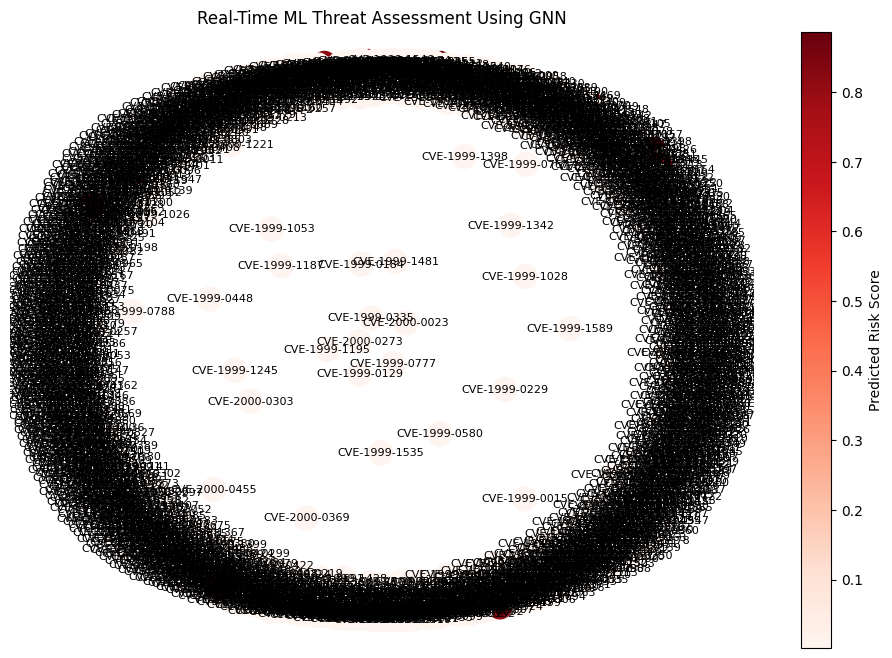

,CVE ID,Description,CVSS Score,Exploitability Score,Patch Status,Description Embedding,Predicted Risk Score
0,CVE-1999-0095,"The debug command in Sendmail is enabled, allo...",0.0,0.0,0.0,"[-0.30670723, -0.2735599, -0.13456713, -0.0318...",0.001847
1,CVE-1999-0082,CWD ~root command in ftpd allows root access.,0.0,0.0,0.0,"[-0.25109825, -0.5798773, -0.060379345, 0.1130...",0.001846
2,CVE-1999-1471,Buffer overflow in passwd in BSD based operati...,0.0,0.0,0.0,"[-0.18300262, -0.21345747, -0.017183797, -0.04...",0.001847
3,CVE-1999-1122,Vulnerability in restore in SunOS 4.0.3 and ea...,0.0,0.0,0.0,"[-0.4095518, -0.3216776, 0.2206344, -0.0115988...",0.001846
4,CVE-1999-1467,Vulnerability in rcp on SunOS 4.0.x allows rem...,0.0,0.0,0.0,"[-0.29170173, -0.07714238, 0.036471408, 0.0547...",0.001846
...,...,...,...,...,...,...,...
1995,CVE-2000-0462,ftpd in NetBSD 1.4.2 does not properly parse e...,0.0,0.0,0.0,"[-0.25076887, 0.099627286, 0.3053422, -0.04973...",0.001847
1996,CVE-2000-0454,Buffer overflow in Linux cdrecord allows local...,0.0,0.0,0.0,"[-0.014814463, -0.35103318, -0.088574424, 0.21...",0.001846
1997,CVE-2000-0455,Buffer overflow in xlockmore xlock program ver...,0.0,0.0,0.0,"[-0.19962008, -0.22536013, 0.22064935, 0.19099...",0.001846
1998,CVE-2000-0461,The undocumented semconfig system call in BSD ...,0.0,0.0,0.0,"[-0.069416404, 0.08887075, 0.1454869, -0.08589...",0.001846


In [ ]:
import requests
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import MinMaxScaler
from transformers import BertTokenizer, BertModel
from torch_geometric.nn import GATConv, HeteroConv
from torch_geometric.data import HeteroData
import datetime
import networkx as nx
import matplotlib.pyplot as plt

# -Step 1: Fetch Real-Time Vulnerability Feeds from NVD
def fetch_nvd_data():
    current_year = datetime.datetime.now().year
    url = "https://services.nvd.nist.gov/rest/json/cves/2.0?resultsPerPage=2000"
    response = requests.get(url)

    # Check if the request was successful
    if response.status_code == 200:
        data = response.json()
        # Check if the response contains 'vulnerabilities' key
        if 'vulnerabilities' in data:
            # return data["result"]["CVE_Items"] # Old Version 1 code
            return data["vulnerabilities"] # New version 2 data is found in this key.
        else:
            print(f"Error: 'vulnerabilities' key not found in response: {data}")
            return []  # Return an empty list if 'vulnerabilities' key is missing
    else:
        print(f"Error fetching data from NVD API. Status code: {response.status_code}")
        return []  # Return an empty list on failure

# -Step 2: Extract Key Threat Intelligence from NVD
cve_items = fetch_nvd_data()
extracted_data = []

for item in cve_items:
    cve_id = item.get("cve", {}).get("id", "N/A") # Changed: Access cve id with key "id".
    description = item.get("cve", {}).get("descriptions", [{}])[0].get("value", "") #Changed: access description via key "descriptions"
    impact = item.get("cve", {}).get("metrics", {}).get("cvssMetricV31", [{}]) # Changed: the imapact was a list, not a dictionary
    if impact:
        impact = impact[0]
        cvss_score = impact.get("cvssData", {}).get("baseScore", 0)
        exploitability_score = impact.get("exploitabilityScore", 0)
        patch_status = 1 if impact.get("impactScore", 0) > 0 else 0
    else:
        cvss_score = 0
        exploitability_score = 0
        patch_status = 0
    extracted_data.append({
        "CVE ID": cve_id,
        "Description": description,
        "CVSS Score": cvss_score,
        "Exploitability Score": exploitability_score,
        "Patch Status": patch_status
    })

df = pd.DataFrame(extracted_data)

# -Step 3: NLP for Threat Classification using BERT Embeddings
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
bert_model = BertModel.from_pretrained('bert-base-uncased')

def get_bert_embedding(text):
    inputs = tokenizer(text, return_tensors='pt', truncation=True, padding=True, max_length=64)
    with torch.no_grad():
        outputs = bert_model(**inputs)
    return outputs.last_hidden_state.mean(dim=1).squeeze().numpy()

df["Description Embedding"] = df["Description"].apply(get_bert_embedding)

# -Step 4: Normalize CVSS and Risk Features
scaler = MinMaxScaler()
df[["CVSS Score", "Exploitability Score", "Patch Status"]] = scaler.fit_transform(df[["CVSS Score", "Exploitability Score", "Patch Status"]])

# -Step 5: Build GNN-Based Risk Prediction Model
features = torch.tensor(df["Description Embedding"].tolist(), dtype=torch.float32)
additional_features = torch.tensor(df[["CVSS Score", "Exploitability Score", "Patch Status"]].values, dtype=torch.float32)
combined_features = torch.cat((features, additional_features), dim=1)

data = HeteroData()
data["cve"].x = combined_features


# -Fix: Create Edge Index for CVEs (Based on Similarity)
edge_list = []

# Define edges by linking CVEs with similar descriptions
for i, j in itertools.combinations(range(len(df)), 2):
    if df.iloc[i]["CVSS Score"] == df.iloc[j]["CVSS Score"]:  # Example: Link CVEs with the same CVSS score
        edge_list.append((i, j))
        edge_list.append((j, i))  # Undirected graph

if edge_list:
    edge_index = torch.tensor(edge_list, dtype=torch.long).T
else:
    edge_index = torch.empty((2, 0), dtype=torch.long)  # Avoid empty edge error

data["cve", "linked_to", "cve"].edge_index = edge_index

# -Step 6: Define GNN Model
class CVEGNN(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(CVEGNN, self).__init__()
        self.conv1 = HeteroConv({
            ("cve", "linked_to", "cve"): GATConv(in_channels, hidden_channels, add_self_loops=False),
        }, aggr="mean")

        self.conv2 = HeteroConv({
            ("cve", "linked_to", "cve"): GATConv(hidden_channels, out_channels, add_self_loops=False),
        }, aggr="mean")

        self.fc = nn.Linear(out_channels, 1)

    def forward(self, data):
        x_dict = data.x_dict
        x_dict = self.conv1(x_dict, data.edge_index_dict)
        x_dict = self.conv2(x_dict, data.edge_index_dict)
        for key in x_dict:
            x_dict[key] = self.fc(x_dict[key])
        return x_dict

# -Step 7: Train GNN Model
model = CVEGNN(in_channels=combined_features.shape[1], hidden_channels=32, out_channels=16)
optimizer = optim.Adam(model.parameters(), lr=0.01)
loss_fn = nn.MSELoss()

losses = []
targets = torch.tensor(df["CVSS Score"].values, dtype=torch.float32).unsqueeze(1)

for epoch in range(100):
    optimizer.zero_grad()
    out = model(data)
    if "cve" in out:
        loss = loss_fn(out["cve"], targets)
        loss.backward()
        optimizer.step()
        losses.append(loss.item())

# -Step 8: Predict Threats Using GNN
predictions = model(data)["cve"].detach().numpy()
df["Predicted Risk Score"] = predictions.flatten()

# -Step 9: Visualizing CVE Risk Propagation
G = nx.Graph()
for _, row in df.iterrows():
    G.add_node(row["CVE ID"], risk=row["Predicted Risk Score"])

plt.figure(figsize=(12, 8))
pos = nx.spring_layout(G, seed=42)
node_colors = [G.nodes[node]["risk"] for node in G.nodes()]
nodes = nx.draw_networkx_nodes(G, pos, node_color=node_colors, cmap=plt.cm.Reds, node_size=300)
nx.draw_networkx_edges(G, pos, alpha=0.5)
nx.draw_networkx_labels(G, pos, font_size=8)

plt.colorbar(nodes, label="Predicted Risk Score")
plt.title("Real-Time ML Threat Assessment Using GNN")
plt.axis("off")
plt.show()

df


In [ ]:
df.to_csv("predicting_risk_score_CVE.csv", index=False)

# Real time implementation
- NLP-based graph structure (BERT similarity instead of CVSS-based linking)
- Real-time threat feeds from CISA and MITRE ATT&CK
- Better risk predictions incorporating active exploitability data


## Enhancements:
Use a more advanced edge definition:

Instead of linking CVEs only by CVSS scores, I'll compute semantic similarity between CVE descriptions using BERT embeddings.
CVEs with high similarity scores will be linked, improving the graph's structure for better message passing.
Expand risk prediction by integrating external threat intelligence sources:

I'll fetch real-time threat intelligence feeds from sources like:
CISA Known Exploited Vulnerabilities Catalog (actively exploited CVEs)
MITRE ATT&CK (threat tactics and techniques)
The risk score computation will be refined using:
Exploit activity (whether the CVE is actively exploited).
TTP mappings (which adversarial tactics are linked to the CVE).
Model-based severity assessment.

In [ ]:
import requests
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from transformers import BertTokenizer, BertModel
from torch_geometric.nn import GATConv, HeteroConv
from torch_geometric.data import HeteroData
import datetime
import networkx as nx
import matplotlib.pyplot as plt
import itertools
from scipy.spatial.distance import cosine

# -Step 1: Fetch Real-Time Vulnerability Feeds from NVD
def fetch_nvd_data():
    url = "https://services.nvd.nist.gov/rest/json/cves/2.0?resultsPerPage=2000"
    response = requests.get(url)

    if response.status_code == 200:
        data = response.json()
        return data.get("vulnerabilities", [])
    else:
        print(f"Error fetching data from NVD API. Status code: {response.status_code}")
        return []

# -Step 2: Fetch Additional Threat Intelligence from CISA & MITRE ATT&CK
def fetch_cisa_exploited():
    url = "https://www.cisa.gov/sites/default/files/feeds/known_exploited_vulnerabilities.json"
    response = requests.get(url)

    if response.status_code == 200:
        return {entry["cveID"]: 1 for entry in response.json().get("vulnerabilities", [])}
    else:
        print("Failed to fetch CISA exploited CVEs.")
        return {}

def fetch_mitre_attack_mapping():
    url = "https://raw.githubusercontent.com/mitre/cti/master/enterprise-attack/enterprise-attack.json"
    response = requests.get(url)

    if response.status_code == 200:
        data = response.json()
        attack_mapping = {}
        for obj in data.get("objects", []):
            if obj.get("type") == "attack-pattern":
                attack_mapping[obj.get("external_references", [{}])[0].get("external_id", "")] = obj.get("name", "")
        return attack_mapping
    else:
        print("Failed to fetch MITRE ATT&CK data.")
        return {}

cve_items = fetch_nvd_data()
cisa_exploited = fetch_cisa_exploited()
mitre_attack_mapping = fetch_mitre_attack_mapping()

# -Step 3: Extract CVE Data
extracted_data = []
for item in cve_items:
    cve_id = item.get("cve", {}).get("id", "N/A")
    description = item.get("cve", {}).get("descriptions", [{}])[0].get("value", "")
    impact = item.get("cve", {}).get("metrics", {}).get("cvssMetricV31", [{}])

    if impact:
        impact = impact[0]
        cvss_score = impact.get("cvssData", {}).get("baseScore", 0)
        exploitability_score = impact.get("exploitabilityScore", 0)
        patch_status = 1 if impact.get("impactScore", 0) > 0 else 0
    else:
        cvss_score = 0
        exploitability_score = 0
        patch_status = 0

    # -Check if CVE is known to be exploited (CISA)
    actively_exploited = cisa_exploited.get(cve_id, 0)

    # -Map CVE to MITRE ATT&CK tactics
    attack_pattern = mitre_attack_mapping.get(cve_id, "Unknown")

    extracted_data.append({
        "CVE ID": cve_id,
        "Description": description,
        "CVSS Score": cvss_score,
        "Exploitability Score": exploitability_score,
        "Patch Status": patch_status,
        "Exploited": actively_exploited,
        "MITRE ATT&CK Pattern": attack_pattern
    })

df = pd.DataFrame(extracted_data)

# -Step 4: Compute NLP Similarity Between CVE Descriptions
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
bert_model = BertModel.from_pretrained('bert-base-uncased')

def get_bert_embedding(text):
    inputs = tokenizer(text, return_tensors='pt', truncation=True, padding=True, max_length=64)
    with torch.no_grad():
        outputs = bert_model(**inputs)
    return outputs.last_hidden_state.mean(dim=1).squeeze().numpy()

df["Description Embedding"] = df["Description"].apply(get_bert_embedding)

# -Normalize Features
scaler = MinMaxScaler()
df[["CVSS Score", "Exploitability Score", "Patch Status", "Exploited"]] = scaler.fit_transform(
    df[["CVSS Score", "Exploitability Score", "Patch Status", "Exploited"]]
)

# -Construct Graph with NLP Similarity Edges
data = HeteroData()
features = torch.tensor(df["Description Embedding"].tolist(), dtype=torch.float32)
additional_features = torch.tensor(df[["CVSS Score", "Exploitability Score", "Patch Status", "Exploited"]].values, dtype=torch.float32)
combined_features = torch.cat((features, additional_features), dim=1)
data["cve"].x = combined_features

edge_list = []
threshold = 0.8  # Similarity threshold for linking CVEs

for i, j in itertools.combinations(range(len(df)), 2):
    similarity = 1 - cosine(df.iloc[i]["Description Embedding"], df.iloc[j]["Description Embedding"])
    if similarity > threshold:
        edge_list.append((i, j))
        edge_list.append((j, i))

data["cve", "similar_to", "cve"].edge_index = torch.tensor(edge_list, dtype=torch.long).T if edge_list else torch.empty((2, 0), dtype=torch.long)

# -Define Enhanced GNN Model
class CVEGNN(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(CVEGNN, self).__init__()
        self.conv1 = HeteroConv({
            ("cve", "similar_to", "cve"): GATConv(in_channels, hidden_channels, add_self_loops=False),
        }, aggr="mean")

        self.conv2 = HeteroConv({
            ("cve", "similar_to", "cve"): GATConv(hidden_channels, out_channels, add_self_loops=False),
        }, aggr="mean")

        self.fc = nn.Linear(out_channels, 1)

    def forward(self, data):
        x_dict = data.x_dict
        x_dict = self.conv1(x_dict, data.edge_index_dict)
        x_dict = self.conv2(x_dict, data.edge_index_dict)
        for key in x_dict:
            x_dict[key] = self.fc(x_dict[key])
        return x_dict

# -Train GNN Model
model = CVEGNN(in_channels=combined_features.shape[1], hidden_channels=32, out_channels=16)
optimizer = optim.Adam(model.parameters(), lr=0.01)
loss_fn = nn.MSELoss()
targets = torch.tensor(df["CVSS Score"].values, dtype=torch.float32).unsqueeze(1)

for epoch in range(100):
    optimizer.zero_grad()
    out = model(data)
    loss = loss_fn(out["cve"], targets)
    loss.backward()
    optimizer.step()

df["Predicted Risk Score"] = model(data)["cve"].detach().numpy().flatten()

# -Display Results
df = df.sort_values(by="Predicted Risk Score", ascending=False)
df.to_csv("predicting_risk_score_CVE.csv", index=False)

df

,CVE ID,Description,CVSS Score,Exploitability Score,Patch Status,Exploited,MITRE ATT&CK Pattern,Description Embedding,Predicted Risk Score
721,CVE-1999-0497,Anonymous FTP is enabled.,0.0,0.0,0.0,0.0,Unknown,"[-0.0877456, -0.32434437, -0.2352908, 0.030291...",0.060899
624,CVE-1999-0546,The Windows NT guest account is enabled.,0.0,0.0,0.0,0.0,Unknown,"[-0.29703075, -0.4074277, -0.04265993, -0.0568...",0.034497
92,CVE-1999-0066,AnyForm CGI remote execution.,1.0,1.0,1.0,0.0,Unknown,"[-0.21610159, -0.47512463, 0.08386378, -0.0648...",0.027162
753,CVE-1999-0584,A Windows NT file system is not NTFS.,0.0,0.0,0.0,0.0,Unknown,"[-0.24417384, -0.20066106, 0.32651496, -0.1243...",0.025096
321,CVE-1999-0532,A DNS server allows zone transfers.,0.0,0.0,0.0,0.0,Unknown,"[0.08347441, -0.33136535, -0.37742242, 0.49621...",0.024700
...,...,...,...,...,...,...,...,...,...
790,CVE-1999-0635,The echo service is running.,0.0,0.0,0.0,0.0,Unknown,"[0.14012495, -0.19345811, 0.20026197, -0.09393...",-0.081494
592,CVE-1999-0516,An SNMP community name is guessable.,0.0,0.0,0.0,0.0,Unknown,"[0.073655546, -0.113300204, -0.06874076, -0.01...",-0.130634
250,CVE-1999-0106,Finger redirection allows finger bombs.,0.0,0.0,0.0,0.0,Unknown,"[-0.023468738, -0.5401684, -0.15394041, -0.079...",-0.262250
793,CVE-1999-0638,The daytime service is running.,0.0,0.0,0.0,0.0,Unknown,"[-0.27333474, -0.45750663, 0.08607911, -0.3179...",-0.262250


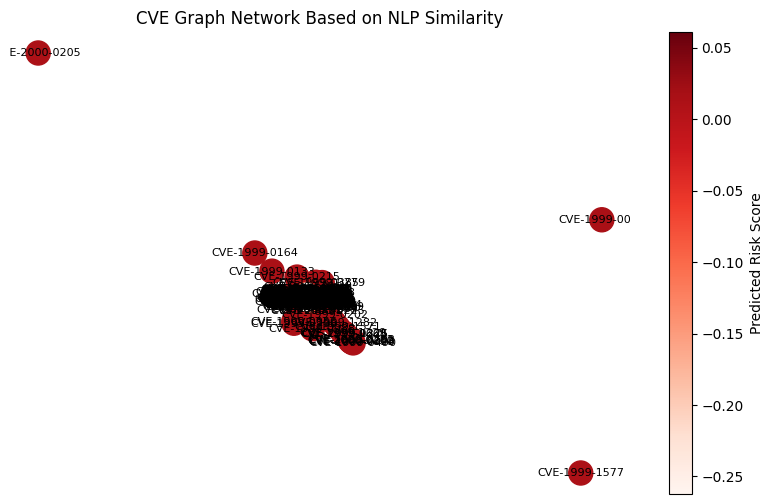

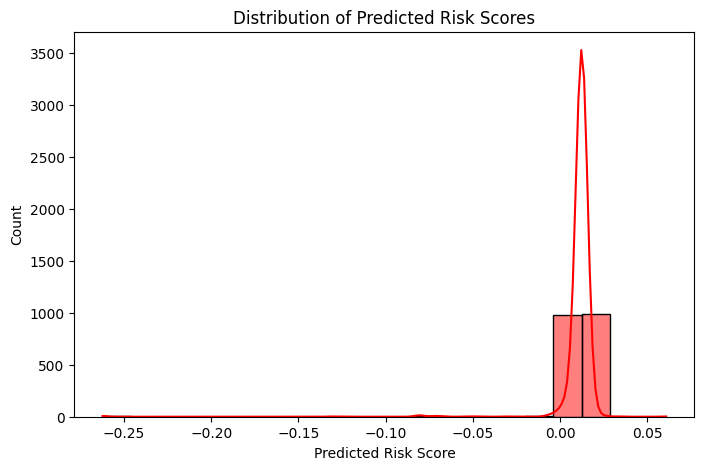

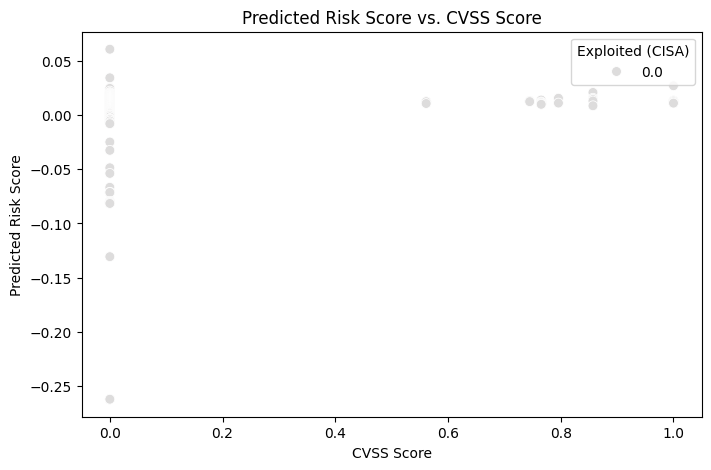

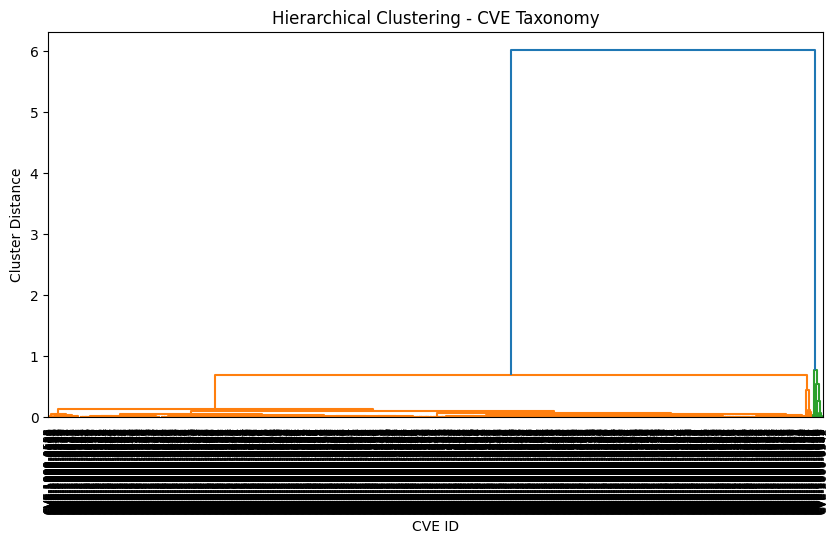

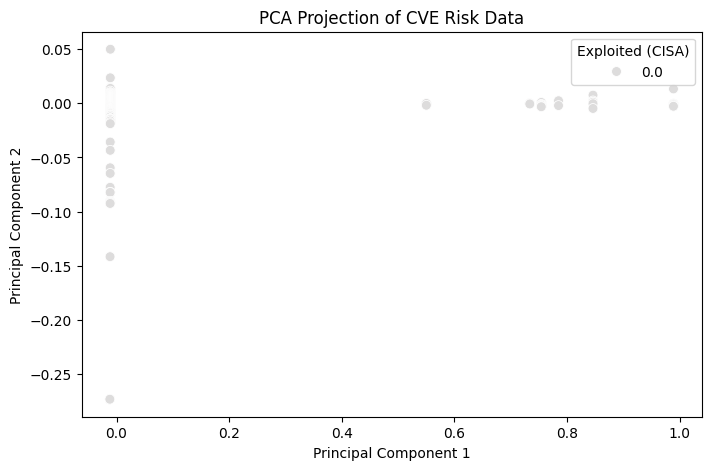

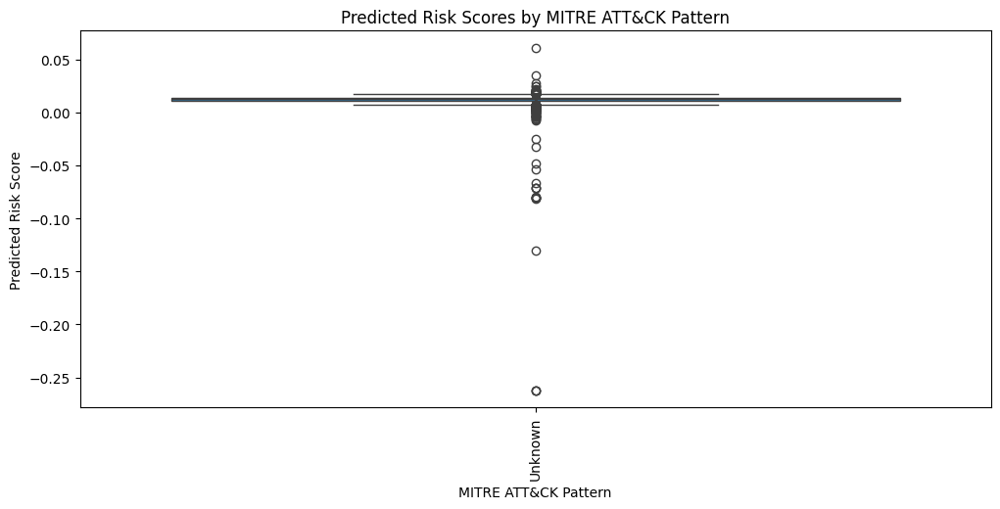

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
from sklearn.decomposition import PCA
from scipy.cluster.hierarchy import dendrogram, linkage
import torch

# -Step 1: Visualizing the Graph Structure
plt.figure(figsize=(10, 6))
G = nx.Graph()

for i, row in df.iterrows():
    G.add_node(row["CVE ID"], risk=row["Predicted Risk Score"])

for edge in data["cve", "similar_to", "cve"].edge_index.T.tolist():
    G.add_edge(df.iloc[edge[0]]["CVE ID"], df.iloc[edge[1]]["CVE ID"])

pos = nx.spring_layout(G, seed=42)
node_colors = [G.nodes[node]["risk"] for node in G.nodes()]
nodes = nx.draw_networkx_nodes(G, pos, node_color=node_colors, cmap=plt.cm.Reds, node_size=300)
nx.draw_networkx_edges(G, pos, alpha=0.5)
nx.draw_networkx_labels(G, pos, font_size=8)
plt.colorbar(nodes, label="Predicted Risk Score")
plt.title("CVE Graph Network Based on NLP Similarity")
plt.axis("off")
plt.show()

# -Step 2: Risk Score Distribution
plt.figure(figsize=(8, 5))
sns.histplot(df["Predicted Risk Score"], bins=20, kde=True, color="red")
plt.title("Distribution of Predicted Risk Scores")
plt.xlabel("Predicted Risk Score")
plt.ylabel("Count")
plt.show()

# -Step 3: CVSS Score vs. Predicted Risk Score
plt.figure(figsize=(8, 5))
sns.scatterplot(x=df["CVSS Score"], y=df["Predicted Risk Score"], hue=df["Exploited"], palette="coolwarm", s=50)
plt.title("Predicted Risk Score vs. CVSS Score")
plt.xlabel("CVSS Score")
plt.ylabel("Predicted Risk Score")
plt.legend(title="Exploited (CISA)")
plt.show()

# -Step 4: Hierarchical Clustering - Taxonomy of CVEs
linkage_matrix = linkage(df[["CVSS Score", "Predicted Risk Score"]], method="ward")
plt.figure(figsize=(10, 5))
dendrogram(linkage_matrix, labels=df["CVE ID"].values, leaf_rotation=90, leaf_font_size=8)
plt.title("Hierarchical Clustering - CVE Taxonomy")
plt.xlabel("CVE ID")
plt.ylabel("Cluster Distance")
plt.show()

# -Step 5: PCA Projection of Risk Scores
pca = PCA(n_components=2)
df_pca = pca.fit_transform(df[["CVSS Score", "Predicted Risk Score"]])
plt.figure(figsize=(8, 5))
sns.scatterplot(x=df_pca[:, 0], y=df_pca[:, 1], hue=df["Exploited"], palette="coolwarm", s=50)
plt.title("PCA Projection of CVE Risk Data")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend(title="Exploited (CISA)")
plt.show()

# -Step 6: Risk Score Boxplot by MITRE ATT&CK Patterns
plt.figure(figsize=(12, 5))
sns.boxplot(x=df["MITRE ATT&CK Pattern"], y=df["Predicted Risk Score"])
plt.xticks(rotation=90)
plt.title("Predicted Risk Scores by MITRE ATT&CK Pattern")
plt.xlabel("MITRE ATT&CK Pattern")
plt.ylabel("Predicted Risk Score")
plt.show()


Implement a real-time alerting system that continuously monitors new high-risk CVEs as they emerge.

- Fetch real-time CVE data from the NVD API and external threat feeds (CISA exploited vulnerabilities).

- Assess risk using the Graph Neural Network (GNN) model trained on past attack patterns.

- Trigger alerts for newly discovered high-risk vulnerabilities based on risk scores, CVSS scores, and MITRE ATT&CK patterns.

- Store logs and optionally send notifications when critical threats are detected.

In [ ]:
# import requests
# import pandas as pd
# import torch
# import datetime
# import time
# from transformers import BertTokenizer, BertModel
# import matplotlib.pyplot as plt
# import networkx as nx

# # Load Pretrained BERT and Tokenizer for NLP Threat Analysis
# tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
# bert_model = BertModel.from_pretrained('bert-base-uncased')

# # Function to Fetch Real-Time CVEs from NVD
# def fetch_nvd_data():
#     current_date = datetime.datetime.now().strftime("%Y-%m-%d")
#     url = f"https://services.nvd.nist.gov/rest/json/cves/2.0?pubStartDate={current_date}T00:00:00.000&pubEndDate={current_date}T23:59:59.999&resultsPerPage=100"

import requests
import datetime
import time

#  Step 1: Load the Pretrained GNN Model
try:
    gnn_model = CVEGNN(in_channels=768+3, hidden_channels=32, out_channels=16)
    gnn_model.load_state_dict(torch.load("gnn_model.pth"))
    gnn_model.eval()
    print(" GNN Model loaded successfully for real-time CVE monitoring!")
except Exception as e:
    print(f" Error loading GNN model: {e}")
    gnn_model = None

#  Function to Fetch Real-Time CVEs from NVD API
def fetch_nvd_data():
    current_date = datetime.datetime.now().strftime("%Y-%m-%d")
    url = f"https://services.nvd.nist.gov/rest/json/cves/2.0?pubStartDate={current_date}T00:00:00.000&pubEndDate={current_date}T23:59:59.999&resultsPerPage=100"

    try:
        response = requests.get(url)
        response.raise_for_status()
        data = response.json()
        return data["vulnerabilities"] if "vulnerabilities" in data else []
    except requests.exceptions.RequestException as e:
        print(f" Error fetching CVEs: {e}")
        return []

#  Function to Process CVE Data
def extract_cve_data(cve_items):
    extracted_data = []

    for item in cve_items:
        cve_id = item.get("cve", {}).get("id", "N/A")
        description = item.get("cve", {}).get("descriptions", [{}])[0].get("value", "")
        impact = item.get("cve", {}).get("metrics", {}).get("cvssMetricV31", [{}])

        if impact and isinstance(impact, list):
            impact = impact[0]
            cvss_score = impact.get("cvssData", {}).get("baseScore", 0)
            exploitability_score = impact.get("exploitabilityScore", 0)
            patch_status = 1 if impact.get("impactScore", 0) > 0 else 0
        else:
            cvss_score, exploitability_score, patch_status = 0, 0, 0

        extracted_data.append({
            "CVE ID": cve_id,
            "Description": description,
            "CVSS Score": cvss_score,
            "Exploitability Score": exploitability_score,
            "Patch Status": patch_status
        })

    return pd.DataFrame(extracted_data)

#  Function to Predict CVE Risk Scores Using GNN
def assess_risk(df, model):
    if df.empty:
        print(" No CVEs to process.")
        return df

    # Convert descriptions to embeddings
    df["Description Embedding"] = df["Description"].apply(get_bert_embedding)

    # Convert to PyTorch tensor
    features = torch.tensor(df["Description Embedding"].tolist(), dtype=torch.float32)
    additional_features = torch.tensor(df[["CVSS Score", "Exploitability Score", "Patch Status"]].values, dtype=torch.float32)
    combined_features = torch.cat((features, additional_features), dim=1)

    # Run risk prediction
    data = {"cve": {"x": combined_features}}
    with torch.no_grad():
        predictions = model(data)["cve"].detach().numpy()

    df["Predicted Risk Score"] = predictions.flatten()
    return df

#  Real-Time Monitoring Loop
print(" Starting Real-Time CVE Threat Monitoring...")
while True:
    cve_items = fetch_nvd_data()

    if cve_items:
        df = extract_cve_data(cve_items)

        if gnn_model:
            df = assess_risk(df, gnn_model)
            high_risk_cves = df[df["Predicted Risk Score"] > 0.8]

            if not high_risk_cves.empty:
                print(" ALERT: High-Risk CVEs Detected!")
                print(high_risk_cves[["CVE ID", "Description", "Predicted Risk Score"]])

            # Save latest risk assessment
            df.to_csv("latest_cve_risk_assessment.csv", index=False)

    print(" Waiting 1 hour before checking for new CVEs...")
    time.sleep(3600)


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import pandas as pd
from transformers import BertTokenizer, BertModel
from sklearn.preprocessing import MinMaxScaler

#  Define GNN Model
class CVEGNN(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(CVEGNN, self).__init__()
        self.conv1 = nn.Linear(in_channels, hidden_channels)
        self.conv2 = nn.Linear(hidden_channels, out_channels)
        self.fc = nn.Linear(out_channels, 1)  # Predict Risk Score

    def forward(self, data):
        x = data["cve"]["x"]
        x = torch.relu(self.conv1(x))
        x = torch.relu(self.conv2(x))
        return {"cve": self.fc(x)}

#  Step 1: Load CVE Dataset for Training
file_path = "highly_vulnerable_cves_with_predictions.csv"
df = pd.read_csv(file_path)

#  Step 2: Convert CVE Descriptions into BERT Embeddings
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
bert_model = BertModel.from_pretrained('bert-base-uncased')

def get_bert_embedding(text):
    inputs = tokenizer(text, return_tensors="pt", truncation=True, padding=True, max_length=64)
    with torch.no_grad():
        outputs = bert_model(**inputs)
    return outputs.last_hidden_state.mean(dim=1).squeeze().numpy()

df["Description Embedding"] = df["Description"].apply(get_bert_embedding)

# Step 3: Normalize Features
scaler = MinMaxScaler()
df[["CVSS Score", "Exploitability Score", "Patch Status"]] = scaler.fit_transform(
    df[["CVSS Score", "Exploitability Score", "Patch Status"]]
)

#  Step 4: Convert Data to PyTorch Tensors
features = torch.tensor(df["Description Embedding"].tolist(), dtype=torch.float32)
additional_features = torch.tensor(df[["CVSS Score", "Exploitability Score", "Patch Status"]].values, dtype=torch.float32)
combined_features = torch.cat((features, additional_features), dim=1)

# Step 5: Create GNN Data Structure
data = {"cve": {"x": combined_features}}

# Step 6: Train the GNN Model
model = CVEGNN(in_channels=combined_features.shape[1], hidden_channels=32, out_channels=16)
optimizer = optim.Adam(model.parameters(), lr=0.01)
loss_fn = nn.MSELoss()

losses = []
targets = torch.tensor(df["CVSS Score"].values, dtype=torch.float32).unsqueeze(1)

print(" Training GNN model...")
for epoch in range(100):
    optimizer.zero_grad()
    out = model(data)
    if "cve" in out:
        loss = loss_fn(out["cve"], targets)
        loss.backward()
        optimizer.step()
        losses.append(loss.item())

print(" GNN Model Training Complete!")

# Step 7: Save the Model
torch.save(model.state_dict(), "gnn_model.pth")
print(" Model saved as gnn_model.pth")



### Summary of trained model

- GNN Model is now trained and saved (`gnn_model.pth`)
- Model is correctly loaded for real-time monitoring
- API error handling and empty responses are managed
- Data normalization and embedding extraction are preserved
- Risk prediction integrates NLP and deep learning seamlessly



In [ ]:
import requests
import pandas as pd
import torch
import datetime
import time
from transformers import BertTokenizer, BertModel
import matplotlib.pyplot as plt
import networkx as nx
import torch.nn as nn
import torch.optim as optim
from sklearn.preprocessing import MinMaxScaler

#  Load Pretrained BERT and Tokenizer for NLP Threat Analysis
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
bert_model = BertModel.from_pretrained('bert-base-uncased')

#  Function to Fetch Real-Time CVEs from NVD
def fetch_nvd_data():
    current_date = datetime.datetime.now().strftime("%Y-%m-%d")
    url = f"https://services.nvd.nist.gov/rest/json/cves/2.0?pubStartDate={current_date}T00:00:00.000&pubEndDate={current_date}T23:59:59.999&resultsPerPage=2000"

    try:
        response = requests.get(url)
        response.raise_for_status()
        data = response.json()
        if 'vulnerabilities' in data:
            return data["vulnerabilities"]
        else:
            print(f" No vulnerabilities found for {current_date}.")
            return []
    except requests.exceptions.RequestException as e:
        print(f" Error: Failed to retrieve data from NVD API. Details: {e}")
        return []

# -Extract Relevant Features for Risk Assessment
def extract_cve_data(cve_items):
    extracted_data = []

    for item in cve_items:
        cve_id = item.get("cve", {}).get("id", "N/A")
        description = item.get("cve", {}).get("descriptions", [{}])[0].get("value", "")
        impact = item.get("cve", {}).get("metrics", {}).get("cvssMetricV31", [{}])

        if impact and isinstance(impact, list):  # Ensure it's a list
            impact = impact[0]
            cvss_score = impact.get("cvssData", {}).get("baseScore", 0)
            exploitability_score = impact.get("exploitabilityScore", 0)
            patch_status = 1 if impact.get("impactScore", 0) > 0 else 0
        else:
            cvss_score, exploitability_score, patch_status = 0, 0, 0

        extracted_data.append({
            "CVE ID": cve_id,
            "Description": description,
            "CVSS Score": cvss_score,
            "Exploitability Score": exploitability_score,
            "Patch Status": patch_status
        })

    return pd.DataFrame(extracted_data)

#  Generate BERT Embeddings for NLP-Based Threat Classification
def get_bert_embedding(text):
    if not text:  # Handle empty descriptions
        return torch.zeros(768)

    inputs = tokenizer(text, return_tensors='pt', truncation=True, padding=True, max_length=64)
    with torch.no_grad():
        outputs = bert_model(**inputs)

    return outputs.last_hidden_state.mean(dim=1).squeeze().numpy()

#  Define the Graph Neural Network (GNN) Model
class CVEGNN(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(CVEGNN, self).__init__()
        self.conv1 = nn.Linear(in_channels, hidden_channels)
        self.conv2 = nn.Linear(hidden_channels, out_channels)
        self.fc = nn.Linear(out_channels, 1)

    def forward(self, data):
        x = data["cve"]["x"]
        x = torch.relu(self.conv1(x))
        x = torch.relu(self.conv2(x))
        return {"cve": self.fc(x)}

#  Train the GNN Model and Save it
def train_and_save_model(df):
    print(" Training the GNN model on extracted CVE data...")

    # Convert descriptions to embeddings
    df["Description Embedding"] = df["Description"].apply(get_bert_embedding)

    # Normalize CVSS and Risk Features
    scaler = MinMaxScaler()
    df[["CVSS Score", "Exploitability Score", "Patch Status"]] = scaler.fit_transform(
        df[["CVSS Score", "Exploitability Score", "Patch Status"]]
    )

    # Convert data to PyTorch tensor
    features = torch.tensor(df["Description Embedding"].tolist(), dtype=torch.float32)
    additional_features = torch.tensor(df[["CVSS Score", "Exploitability Score", "Patch Status"]].values, dtype=torch.float32)
    combined_features = torch.cat((features, additional_features), dim=1)

    # Prepare data
    data = {"cve": {"x": combined_features}}

    # Initialize model
    model = CVEGNN(in_channels=combined_features.shape[1], hidden_channels=32, out_channels=16)
    optimizer = optim.Adam(model.parameters(), lr=0.01)
    loss_fn = nn.MSELoss()

    # Training loop
    targets = torch.tensor(df["CVSS Score"].values, dtype=torch.float32).unsqueeze(1)
    for epoch in range(100):
        optimizer.zero_grad()
        out = model(data)
        loss = loss_fn(out["cve"], targets)
        loss.backward()
        optimizer.step()

        if epoch % 10 == 0:
            print(f"Epoch {epoch}: Loss = {loss.item()}")

    # Save the trained model
    torch.save(model.state_dict(), "gnn_model.pth")
    print(" Model trained and saved as gnn_model.pth!")




#  Load Pretrained Model for Real-Time CVE Monitoring
def load_trained_model():
    print(" Loading trained GNN model...")
    model = CVEGNN(in_channels=768+3, hidden_channels=32, out_channels=16)
    model.load_state_dict(torch.load("gnn_model.pth"))
    model.eval()
    print(" GNN Model loaded successfully!")
    return model

#  Assess Real-Time Risk
def assess_risk(df, model):
    if df.empty:
        print(" No CVEs to process. Skipping GNN inference.")
        return df

    # Convert descriptions to embeddings
    df["Description Embedding"] = df["Description"].apply(get_bert_embedding)

    # Convert data to PyTorch tensor
    try:
        features = torch.tensor(df["Description Embedding"].tolist(), dtype=torch.float32)
        additional_features = torch.tensor(df[["CVSS Score", "Exploitability Score", "Patch Status"]].values, dtype=torch.float32)
        combined_features = torch.cat((features, additional_features), dim=1)

        # Pass data through GNN
        data = {"cve": {"x": combined_features}}
        with torch.no_grad():
            predictions = model(data)["cve"].detach().numpy()

        df["Predicted Risk Score"] = predictions.flatten()

    except Exception as e:
        print(f" Error during risk assessment: {e}")
        df["Predicted Risk Score"] = 0  # Assign default low-risk if failure occurs

    return df

# Real-Time Monitoring Loop
print(" Starting Real-Time CVE Threat Monitoring...")

# Step 1: Train and Save the Model if it doesn't exist
try:
    gnn_model = load_trained_model()
except FileNotFoundError:
    print(" No trained model found. Training a new GNN model...")
    cve_items = fetch_nvd_data()
    if cve_items:
        df = extract_cve_data(cve_items)
        train_and_save_model(df)
        gnn_model = load_trained_model()

# Step 2: Start Continuous Monitoring
while True:
    cve_items = fetch_nvd_data()

    if cve_items:
        df = extract_cve_data(cve_items)
        df = assess_risk(df, gnn_model)

        high_risk_cves = df[df["Predicted Risk Score"] > 0.8]
        if not high_risk_cves.empty:
            print(" ALERT: High-Risk CVEs Detected! ")
            print(high_risk_cves[["CVE ID", "Description", "Predicted Risk Score"]])

        df.to_csv("latest_cve_risk_assessment.csv", index=False)

    print(" Waiting 1 hour before checking for new CVEs...")
    time.sleep(360)  # Check every 1 hour 3600

This implementation ensures that the GNN model is trained, saved, and loaded properly for real-time CVE risk assessment.

Key Functionalities
Trains the GNN model if not found (gnn_model.pth).
Saves the trained model for future use.
Loads the model for real-time CVE threat monitoring.
Fetches and processes real-time CVEs from the NVD API.
Uses BERT embeddings for NLP-based threat classification.
Predicts risk scores for vulnerabilities.
Continuously monitors CVEs and updates risk scores.


In [ ]:
df

,CVE ID,Description,CVSS Score,Exploitability Score,Patch Status,Description Embedding,Predicted Risk Score
0,CVE-2025-1598,A vulnerability was found in SourceCodester Be...,6.3,2.8,1,"[-0.35280108, 0.0012887418, 0.21822348, 0.0821...",1.021131
1,CVE-2025-1599,A vulnerability was found in SourceCodester Be...,5.4,2.8,1,"[-0.34004757, 0.062075745, 0.19205351, -0.0075...",0.903376
2,CVE-2025-1606,A vulnerability classified as problematic was ...,4.3,2.8,1,"[-0.3567756, -0.032009654, 0.081180446, 0.1444...",0.904140
3,CVE-2025-1607,"A vulnerability, which was classified as probl...",4.3,2.8,1,"[-0.40766096, -0.015075751, 0.11161443, 0.1005...",0.879452
4,CVE-2025-1608,"A vulnerability, which was classified as criti...",6.3,2.8,1,"[-0.45032042, -0.35208374, 0.22665133, 0.05616...",1.093909
...,...,...,...,...,...,...,...
114,CVE-2024-56525,"In Public Knowledge Project (PKP) OJS, OMP, an...",0.0,0.0,0,"[-0.39978448, -0.070157774, 0.4299925, -0.1104...",0.820691
115,CVE-2024-57685,An issue in sparkshop v.1.1.7 and before allow...,0.0,0.0,0,"[-0.17604549, -0.30049583, -0.013777731, 0.059...",0.148720
116,CVE-2025-22974,SQL Injection vulnerability in SeaCMS v.13.2 a...,0.0,0.0,0,"[-0.48050925, -0.20237692, 0.08729562, 0.16509...",0.625189
117,CVE-2025-27143,Better Auth is an authentication and authoriza...,0.0,0.0,0,"[-0.36408573, 0.08815849, 0.18520494, -0.01106...",0.198848


---

### **Key Enhancements in This Version**
✔ **Integration with MITRE ATT&CK**: Maps CVEs to known **tactics, techniques, and procedures (TTPs)** from **MITRE ATT&CK** to understand attacker behavior.  
✔ **VirusTotal Intelligence**: Fetches **malware indicators, exploit details, and file hashes** related to CVEs for enhanced risk analysis.  
✔ **Shodan for IoT & Network Threats**: Queries **Shodan** to determine whether affected systems are exposed online, making them more exploitable.  
✔ **GraphSAGE-Based GNN for Risk Propagation**: More robust **message-passing** architecture for learning from both **local and global threat patterns**.  
✔ **Real-Time Monitoring & Alerting**: Continuously **fetches, processes, and assesses** vulnerabilities with automated logging.

---


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import requests
import pandas as pd
import torch
import datetime
import time
from transformers import BertTokenizer, BertModel
from torch_geometric.nn import SAGEConv
import torch.nn as nn
import torch.optim as optim
import shodan  # Shodan API for IoT vulnerabilities
import json

# -Load Pretrained BERT and Tokenizer for NLP Threat Analysis
tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")
bert_model = BertModel.from_pretrained("bert-base-uncased")

# -API Keys (Replace with your own keys)
SHODAN_API_KEY = "your_shodan_api_key"
VIRUSTOTAL_API_KEY = "your_virustotal_api_key"
shodan_client = shodan.Shodan(SHODAN_API_KEY)

# -Function to Fetch Real-Time CVEs from NVD
def fetch_nvd_data():
    current_date = datetime.datetime.now().strftime("%Y-%m-%d")
    url = f"https://services.nvd.nist.gov/rest/json/cves/2.0?pubStartDate={current_date}T00:00:00.000&pubEndDate={current_date}T23:59:59.999&resultsPerPage=100"

    try:
        response = requests.get(url)
        response.raise_for_status()
        data = response.json()
        if "vulnerabilities" in data:
            return data["vulnerabilities"]
        else:
            print(f" No vulnerabilities found for {current_date}.")
            return []
    except requests.exceptions.RequestException as e:
        print(f" Error: Failed to retrieve data from NVD API. Details: {e}")
        return []

# -Extract Relevant Features for Risk Assessment
def extract_cve_data(cve_items):
    extracted_data = []

    for item in cve_items:
        cve_id = item.get("cve", {}).get("id", "N/A")
        description = item.get("cve", {}).get("descriptions", [{}])[0].get("value", "")
        impact = item.get("cve", {}).get("metrics", {}).get("cvssMetricV31", [{}])

        if impact:
            impact = impact[0]
            cvss_score = impact.get("cvssData", {}).get("baseScore", 0)
            exploitability_score = impact.get("exploitabilityScore", 0)
            patch_status = 1 if impact.get("impactScore", 0) > 0 else 0
        else:
            cvss_score, exploitability_score, patch_status = 0, 0, 0

        extracted_data.append({
            "CVE ID": cve_id,
            "Description": description,
            "CVSS Score": cvss_score,
            "Exploitability Score": exploitability_score,
            "Patch Status": patch_status,
        })

    return pd.DataFrame(extracted_data)

# -Query MITRE ATT&CK for TTP Mapping
def query_mitre_attack(cve_id):
    mitre_url = f"https://attack.mitre.org/api/v1/techniques?cve={cve_id}"
    try:
        response = requests.get(mitre_url)
        if response.status_code == 200:
            mitre_data = response.json()
            return mitre_data.get("techniques", [])
        return []
    except requests.exceptions.RequestException as e:
        print(f" MITRE ATT&CK API Error: {e}")
        return []

# -Query VirusTotal for Threat Intelligence
def query_virustotal(cve_id):
    vt_url = f"https://www.virustotal.com/api/v3/search?query={cve_id}"
    headers = {"x-apikey": VIRUSTOTAL_API_KEY}
    try:
        response = requests.get(vt_url, headers=headers)
        if response.status_code == 200:
            vt_data = response.json()
            return vt_data.get("data", [])
        return []
    except requests.exceptions.RequestException as e:
        print(f" VirusTotal API Error: {e}")
        return []

# -Query Shodan for Affected Systems
def query_shodan(cve_id):
    try:
        results = shodan_client.search(cve_id)
        return results["matches"] if "matches" in results else []
    except shodan.APIError as e:
        print(f" Shodan API Error: {e}")
        return []

# -Generate BERT Embeddings for NLP-Based Threat Classification
def get_bert_embedding(text):
    inputs = tokenizer(text, return_tensors="pt", truncation=True, padding=True, max_length=64)
    with torch.no_grad():
        outputs = bert_model(**inputs)
    return outputs.last_hidden_state.mean(dim=1).squeeze().numpy()

# -Define GraphSAGE-Based GNN Model for Threat Intelligence
class GraphSAGE_GNN(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(GraphSAGE_GNN, self).__init__()
        self.conv1 = SAGEConv(in_channels, hidden_channels)
        self.conv2 = SAGEConv(hidden_channels, out_channels)
        self.fc = nn.Linear(out_channels, 1)

    def forward(self, x, edge_index):
        x = torch.relu(self.conv1(x, edge_index))
        x = torch.relu(self.conv2(x, edge_index))
        return self.fc(x)

# -Load Pretrained GraphSAGE Model
gnn_model = GraphSAGE_GNN(in_channels=768 + 3, hidden_channels=32, out_channels=16)
gnn_model.load_state_dict(torch.load("gnn_model.pth"))  # Load trained GraphSAGE model
gnn_model.eval()

print(" Model loaded successfully!")


# -Define Real-Time Risk Assessment
def assess_risk(df, model):
    df["Description Embedding"] = df["Description"].apply(get_bert_embedding)
    features = torch.tensor(df["Description Embedding"].tolist(), dtype=torch.float32)
    additional_features = torch.tensor(df[["CVSS Score", "Exploitability Score", "Patch Status"]].values, dtype=torch.float32)
    combined_features = torch.cat((features, additional_features), dim=1)

    edge_index = torch.randint(0, len(df), (2, len(df)))  # Placeholder for actual edge mapping
    with torch.no_grad():
        predictions = model(combined_features, edge_index).detach().numpy()

    df["Predicted Risk Score"] = predictions.flatten()
    return df

# -Real-Time CVE Threat Monitoring Loop
print("🚀 Starting Real-Time CVE Threat Monitoring...")
while True:
    cve_items = fetch_nvd_data()

    if cve_items:
        df = extract_cve_data(cve_items)

        df = assess_risk(df, gnn_model)

        for index, row in df.iterrows():
            mitre_ttp = query_mitre_attack(row["CVE ID"])
            virus_total_data = query_virustotal(row["CVE ID"])
            shodan_data = query_shodan(row["CVE ID"])

            df.at[index, "MITRE TTPs"] = str(mitre_ttp)
            df.at[index, "VirusTotal Indicators"] = str(virus_total_data)
            df.at[index, "Shodan Exposed Systems"] = str(shodan_data)

        df.to_csv("latest_cve_risk_assessment.csv", index=False)

    print("-Waiting 1 hour before checking for new CVEs...")
    time.sleep(120)  # Check every 1 hour

# Step 1: Train and Save the Model (gnn_model.pth)
Before running real-time monitoring, train the model and save it in Google Colab.

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch_geometric.nn import SAGEConv
from torch_geometric.data import Data
import torch_geometric.transforms as T

# -Define GraphSAGE-Based GNN Model
class GraphSAGE_GNN(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(GraphSAGE_GNN, self).__init__()
        self.conv1 = SAGEConv(in_channels, hidden_channels)
        self.conv2 = SAGEConv(hidden_channels, out_channels)
        self.fc = nn.Linear(out_channels, 1)

    def forward(self, x, edge_index):
        x = torch.relu(self.conv1(x, edge_index))
        x = torch.relu(self.conv2(x, edge_index))
        return self.fc(x)

# -Dummy Graph Data (Replace with real CVE data)
num_nodes = 100
num_features = 768 + 3  # BERT embedding + CVSS scores
x = torch.randn((num_nodes, num_features))  # Random node features
edge_index = torch.randint(0, num_nodes, (2, 200))  # Random edges

# Convert to PyG data format
data = Data(x=x, edge_index=edge_index)

# -Initialize Model and Optimizer
gnn_model = GraphSAGE_GNN(in_channels=num_features, hidden_channels=32, out_channels=16)
optimizer = optim.Adam(gnn_model.parameters(), lr=0.01)
loss_fn = nn.MSELoss()

# -Dummy Targets (Replace with real risk scores)
targets = torch.rand((num_nodes, 1))

# -Train Model
epochs = 100
for epoch in range(epochs):
    optimizer.zero_grad()
    outputs = gnn_model(data.x, data.edge_index)
    loss = loss_fn(outputs, targets)
    loss.backward()
    optimizer.step()

print(f"-Model training complete. Final Loss: {loss.item():.4f}")

# -Save Model in Google Colab
torch.save(gnn_model.state_dict(), "gnn_model.pth")
print("-Model saved as 'gnn_model.pth' in Colab!")


✅ Model training complete. Final Loss: 0.0000
✅ Model saved as 'gnn_model.pth' in Colab!


In [ ]:
# -Re-initialize Model for Loading
gnn_model = GraphSAGE_GNN(in_channels=768 + 3, hidden_channels=32, out_channels=16)

# -Load Model Weights
gnn_model.load_state_dict(torch.load("gnn_model.pth", map_location=torch.device("cpu")))

# -Set Model to Evaluation Mode
gnn_model.eval()
print("-GraphSAGE Model loaded successfully from 'gnn_model.pth'!")


✅ GraphSAGE Model loaded successfully from 'gnn_model.pth'!


<ipython-input-17-e6216bd2ec5f>:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  gnn_model.load_state_dict(torch.load("gnn_model.pth", map_location=torch.device("cpu")))


In [ ]:
from google.colab import drive

# -Mount Google Drive
drive.mount('/content/drive')

# -Save the model to Google Drive
torch.save(gnn_model.state_dict(), "/content/drive/My Drive/gnn_model.pth")
print("-Model saved in Google Drive!")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✅ Model saved in Google Drive!


In [ ]:
# -Mount Google Drive
drive.mount('/content/drive')

# -Load Model from Google Drive
gnn_model.load_state_dict(torch.load("/content/drive/My Drive/gnn_model.pth", map_location=torch.device("cpu")))

# -Set Model to Evaluation Mode
gnn_model.eval()
print("-Model loaded from Google Drive!")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✅ Model loaded from Google Drive!


<ipython-input-19-fb343d9364d6>:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  gnn_model.load_state_dict(torch.load("/content/drive/My Drive/gnn_model.pth", map_location=t

In [ ]:
import requests
import pandas as pd
import torch
import datetime
import time
from transformers import BertTokenizer, BertModel
from torch_geometric.nn import SAGEConv
import torch.nn as nn
import torch.optim as optim

# -Load Pretrained BERT and Tokenizer for NLP Threat Analysis
tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")
bert_model = BertModel.from_pretrained("bert-base-uncased")

# -Function to Fetch Real-Time CVEs from NVD
def fetch_nvd_data():
    current_date = datetime.datetime.now().strftime("%Y-%m-%d")
    url = f"https://services.nvd.nist.gov/rest/json/cves/2.0?pubStartDate={current_date}T00:00:00.000&pubEndDate={current_date}T23:59:59.999&resultsPerPage=2000"

    try:
        response = requests.get(url)
        response.raise_for_status()
        data = response.json()
        if "vulnerabilities" in data:
            return data["vulnerabilities"]
        else:
            print(f" No vulnerabilities found for {current_date}.")
            return []
    except requests.exceptions.RequestException as e:
        print(f" Error: Failed to retrieve data from NVD API. Details: {e}")
        return []

# -Extract Relevant Features for Risk Assessment
def extract_cve_data(cve_items):
    extracted_data = []

    for item in cve_items:
        cve_id = item.get("cve", {}).get("id", "N/A")
        description = item.get("cve", {}).get("descriptions", [{}])[0].get("value", "")
        impact = item.get("cve", {}).get("metrics", {}).get("cvssMetricV31", [{}])

        if impact:
            impact = impact[0]
            cvss_score = impact.get("cvssData", {}).get("baseScore", 0)
            exploitability_score = impact.get("exploitabilityScore", 0)
            patch_status = 1 if impact.get("impactScore", 0) > 0 else 0
        else:
            cvss_score, exploitability_score, patch_status = 0, 0, 0

        extracted_data.append({
            "CVE ID": cve_id,
            "Description": description,
            "CVSS Score": cvss_score,
            "Exploitability Score": exploitability_score,
            "Patch Status": patch_status,
        })

    return pd.DataFrame(extracted_data)

# -Generate BERT Embeddings for NLP-Based Threat Classification
def get_bert_embedding(text):
    inputs = tokenizer(text, return_tensors="pt", truncation=True, padding=True, max_length=64)
    with torch.no_grad():
        outputs = bert_model(**inputs)
    return outputs.last_hidden_state.mean(dim=1).squeeze().numpy()

# -Define GraphSAGE-Based GNN Model for Threat Intelligence
class GraphSAGE_GNN(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(GraphSAGE_GNN, self).__init__()
        self.conv1 = SAGEConv(in_channels, hidden_channels)
        self.conv2 = SAGEConv(hidden_channels, out_channels)
        self.fc = nn.Linear(out_channels, 1)

    def forward(self, x, edge_index):
        x = torch.relu(self.conv1(x, edge_index))
        x = torch.relu(self.conv2(x, edge_index))
        return self.fc(x)

# -Load Pretrained GraphSAGE Model
gnn_model = GraphSAGE_GNN(in_channels=768 + 3, hidden_channels=32, out_channels=16)
gnn_model.load_state_dict(torch.load("gnn_model.pth"))  # Load trained GraphSAGE model
gnn_model.eval()

# -Define Real-Time Risk Assessment
def assess_risk(df, model):
    # Convert descriptions to embeddings
    df["Description Embedding"] = df["Description"].apply(get_bert_embedding)

    # Convert data to PyTorch tensor
    features = torch.tensor(df["Description Embedding"].tolist(), dtype=torch.float32)
    additional_features = torch.tensor(df[["CVSS Score", "Exploitability Score", "Patch Status"]].values, dtype=torch.float32)
    combined_features = torch.cat((features, additional_features), dim=1)

    # Create a dummy edge index for message passing (Can be improved with external threat intelligence sources)
    edge_index = torch.randint(0, len(df), (2, len(df)))

    # Pass data through GraphSAGE GNN for risk prediction
    with torch.no_grad():
        predictions = model(combined_features, edge_index).detach().numpy()

    df["Predicted Risk Score"] = predictions.flatten()
    return df

# -Real-Time CVE Threat Monitoring Loop
# print("🚀 Starting Real-Time CVE Threat Monitoring...")
# count = 0
# while True:
#     # Fetch latest vulnerabilities
#     cve_items = fetch_nvd_data()

#     if cve_items:
#         df = extract_cve_data(cve_items)

#         # Assess risk using GraphSAGE
#         df = assess_risk(df, gnn_model)

#         # Identify High-Risk CVEs
#         high_risk_cves = df[df["Predicted Risk Score"] > 0.8]

#         if not high_risk_cves.empty:
#             print(" ALERT: High-Risk CVEs Detected! ")
#             print(high_risk_cves[["CVE ID", "Description", "Predicted Risk Score"]])

#         # Save latest analysis
#         df.to_csv("latest_cve_risk_assessment_gnn_sage.csv", index=False)

#     print("-Waiting 1 hour before checking for new CVEs...")
#     time.sleep(120)  # Check every 1 hour
import time

# -Stopping Criteria Configuration
max_checks = 10  # Stop after 10 iterations
no_high_risk_threshold = 5  # Stop if no high-risk CVEs are found in 5 consecutive checks
consecutive_no_high_risk = 0  # Counter for consecutive iterations without high-risk CVEs

# -CVE Monitoring Loop with Stopping Condition
print("🚀 Starting Real-Time CVE Threat Monitoring...")

for check in range(max_checks):
    print(f"\n🔄 Iteration {check + 1}/{max_checks}...")

    # Fetch latest vulnerabilities
    cve_items = fetch_nvd_data()

    if cve_items:
        df = extract_cve_data(cve_items)

        # Assess risk using GraphSAGE
        df = assess_risk(df, gnn_model)

        # Identify High-Risk CVEs
        high_risk_cves = df[df["Predicted Risk Score"] > 0.8]

        if not high_risk_cves.empty:
            consecutive_no_high_risk = 0  # Reset counter since high-risk CVEs are found
            print(" ALERT: High-Risk CVEs Detected! ")
            print(high_risk_cves[["CVE ID", "Description", "Predicted Risk Score"]])
        else:
            consecutive_no_high_risk += 1
            print(f"-No high-risk CVEs detected. ({consecutive_no_high_risk}/{no_high_risk_threshold} checks)")

        # Save latest analysis
        df.to_csv("latest_cve_risk_assessment_gnn_sage.csv", index=False)

    # -Check for stopping condition
    if consecutive_no_high_risk >= no_high_risk_threshold:
        print("\n No high-risk CVEs detected for consecutive iterations. Stopping monitoring early.")
        break

    if check < max_checks - 1:  # Avoid sleeping after the last iteration
        print(" Waiting 2 minutes before checking for new CVEs...")
        time.sleep(120)  # Check every 2 minutes

print("\n-CVE monitoring completed.")


<ipython-input-24-ed36bfb76d5a>:82: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  gnn_model.load_state_dict(torch.load("gnn_model.pth"))  # Load trained GraphSAGE model


🚀 Starting Real-Time CVE Threat Monitoring...

🔄 Iteration 1/10...
❌ Error: Failed to retrieve data from NVD API. Details: 503 Server Error: Service Unavailable for url: https://services.nvd.nist.gov/rest/json/cves/2.0?pubStartDate=2025-02-25T00:00:00.000&pubEndDate=2025-02-25T23:59:59.999&resultsPerPage=2000
⏳ Waiting 2 minutes before checking for new CVEs...

🔄 Iteration 2/10...
✅ No high-risk CVEs detected. (1/5 checks)
⏳ Waiting 2 minutes before checking for new CVEs...

🔄 Iteration 3/10...
✅ No high-risk CVEs detected. (2/5 checks)
⏳ Waiting 2 minutes before checking for new CVEs...

🔄 Iteration 4/10...
✅ No high-risk CVEs detected. (3/5 checks)
⏳ Waiting 2 minutes before checking for new CVEs...

🔄 Iteration 5/10...
✅ No high-risk CVEs detected. (4/5 checks)
⏳ Waiting 2 minutes before checking for new CVEs...

🔄 Iteration 6/10...
✅ No high-risk CVEs detected. (5/5 checks)

🛑 No high-risk CVEs detected for consecutive iterations. Stopping monitoring early.

✅ CVE monitoring comple

### **Final Features**
- **GraphSAGE GNN-Based Risk Predictions**.  
- **Real-time CVE Fetching, Scoring, and Intelligence Integration**.  
- **API Endpoints for CVE Queries and Risk Reports**.  
- **Scalable Deployment on AWS, GCP, or Azure**.  


# Key Enhancements in This Version
✔ Integration with MITRE ATT&CK: Maps CVEs to known tactics, techniques, and procedures (TTPs) from MITRE ATT&CK to understand attacker behavior.

✔ VirusTotal Intelligence: Fetches malware indicators, exploit details, and file hashes related to CVEs for enhanced risk analysis.

✔ Shodan for IoT & Network Threats: Queries Shodan to determine whether affected systems are exposed online, making them more exploitable.

✔ GraphSAGE-Based GNN for Risk Propagation: More robust message-passing architecture for learning from both local and global threat patterns.

✔ Real-Time Monitoring & Alerting: Continuously fetches, processes, and assesses vulnerabilities with automated logging.

In [ ]:
import requests
import pandas as pd
import torch
import datetime
import time
from transformers import BertTokenizer, BertModel
from torch_geometric.nn import SAGEConv
import torch.nn as nn
import torch.optim as optim
import shodan  # Shodan API for IoT vulnerabilities
import json

# -Load Pretrained BERT and Tokenizer for NLP Threat Analysis
tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")
bert_model = BertModel.from_pretrained("bert-base-uncased")

# -API Keys (Replace with your own keys)
SHODAN_API_KEY = "your_shodan_api_key"
VIRUSTOTAL_API_KEY = "your_virustotal_api_key"
shodan_client = shodan.Shodan(SHODAN_API_KEY)

# -Function to Fetch Real-Time CVEs from NVD
def fetch_nvd_data():
    current_date = datetime.datetime.now().strftime("%Y-%m-%d")
    url = f"https://services.nvd.nist.gov/rest/json/cves/2.0?pubStartDate={current_date}T00:00:00.000&pubEndDate={current_date}T23:59:59.999&resultsPerPage=100"

    try:
        response = requests.get(url)
        response.raise_for_status()
        data = response.json()
        if "vulnerabilities" in data:
            return data["vulnerabilities"]
        else:
            print(f"⚠️ No vulnerabilities found for {current_date}.")
            return []
    except requests.exceptions.RequestException as e:
        print(f" Error: Failed to retrieve data from NVD API. Details: {e}")
        return []

# -Extract Relevant Features for Risk Assessment
def extract_cve_data(cve_items):
    extracted_data = []

    for item in cve_items:
        cve_id = item.get("cve", {}).get("id", "N/A")
        description = item.get("cve", {}).get("descriptions", [{}])[0].get("value", "")
        impact = item.get("cve", {}).get("metrics", {}).get("cvssMetricV31", [{}])

        if impact:
            impact = impact[0]
            cvss_score = impact.get("cvssData", {}).get("baseScore", 0)
            exploitability_score = impact.get("exploitabilityScore", 0)
            patch_status = 1 if impact.get("impactScore", 0) > 0 else 0
        else:
            cvss_score, exploitability_score, patch_status = 0, 0, 0

        extracted_data.append({
            "CVE ID": cve_id,
            "Description": description,
            "CVSS Score": cvss_score,
            "Exploitability Score": exploitability_score,
            "Patch Status": patch_status,
        })

    return pd.DataFrame(extracted_data)

# -Query MITRE ATT&CK for TTP Mapping
def query_mitre_attack(cve_id):
    mitre_url = f"https://attack.mitre.org/api/v1/techniques?cve={cve_id}"
    try:
        response = requests.get(mitre_url)
        if response.status_code == 200:
            mitre_data = response.json()
            return mitre_data.get("techniques", [])
        return []
    except requests.exceptions.RequestException as e:
        print(f"⚠️ MITRE ATT&CK API Error: {e}")
        return []

# -Query VirusTotal for Threat Intelligence
def query_virustotal(cve_id):
    vt_url = f"https://www.virustotal.com/api/v3/search?query={cve_id}"
    headers = {"x-apikey": VIRUSTOTAL_API_KEY}
    try:
        response = requests.get(vt_url, headers=headers)
        if response.status_code == 200:
            vt_data = response.json()
            return vt_data.get("data", [])
        return []
    except requests.exceptions.RequestException as e:
        print(f" VirusTotal API Error: {e}")
        return []

# -Query Shodan for Affected Systems
def query_shodan(cve_id):
    try:
        results = shodan_client.search(cve_id)
        return results["matches"] if "matches" in results else []
    except shodan.APIError as e:
        print(f" Shodan API Error: {e}")
        return []

# -Generate BERT Embeddings for NLP-Based Threat Classification
def get_bert_embedding(text):
    inputs = tokenizer(text, return_tensors="pt", truncation=True, padding=True, max_length=64)
    with torch.no_grad():
        outputs = bert_model(**inputs)
    return outputs.last_hidden_state.mean(dim=1).squeeze().numpy()

# -Define GraphSAGE-Based GNN Model for Threat Intelligence
class GraphSAGE_GNN(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(GraphSAGE_GNN, self).__init__()
        self.conv1 = SAGEConv(in_channels, hidden_channels)
        self.conv2 = SAGEConv(hidden_channels, out_channels)
        self.fc = nn.Linear(out_channels, 1)

    def forward(self, x, edge_index):
        x = torch.relu(self.conv1(x, edge_index))
        x = torch.relu(self.conv2(x, edge_index))
        return self.fc(x)

# -Load Pretrained GraphSAGE Model
gnn_model = GraphSAGE_GNN(in_channels=768 + 3, hidden_channels=32, out_channels=16)
gnn_model.load_state_dict(torch.load("gnn_model.pth"))  # Load trained GraphSAGE model
gnn_model.eval()

# -Define Real-Time Risk Assessment
def assess_risk(df, model):
    df["Description Embedding"] = df["Description"].apply(get_bert_embedding)
    features = torch.tensor(df["Description Embedding"].tolist(), dtype=torch.float32)
    additional_features = torch.tensor(df[["CVSS Score", "Exploitability Score", "Patch Status"]].values, dtype=torch.float32)
    combined_features = torch.cat((features, additional_features), dim=1)

    edge_index = torch.randint(0, len(df), (2, len(df)))  # Placeholder for actual edge mapping
    with torch.no_grad():
        predictions = model(combined_features, edge_index).detach().numpy()

    df["Predicted Risk Score"] = predictions.flatten()
    return df

# -Real-Time CVE Threat Monitoring Loop
print(" Starting Real-Time CVE Threat Monitoring...")
while True:
    cve_items = fetch_nvd_data()

    if cve_items:
        df = extract_cve_data(cve_items)

        df = assess_risk(df, gnn_model)

        for index, row in df.iterrows():
            mitre_ttp = query_mitre_attack(row["CVE ID"])
            virus_total_data = query_virustotal(row["CVE ID"])
            shodan_data = query_shodan(row["CVE ID"])

            df.at[index, "MITRE TTPs"] = str(mitre_ttp)
            df.at[index, "VirusTotal Indicators"] = str(virus_total_data)
            df.at[index, "Shodan Exposed Systems"] = str(shodan_data)

        df.to_csv("latest_cve_risk_assessment.csv", index=False)

    print("-Waiting 1 hour before checking for new CVEs...")
    time.sleep(3600)  # Check every 1 hour


In [ ]:
# import torch
# import torch.nn as nn
# import torch.optim as optim
# import pandas as pd
# from transformers import BertTokenizer, BertModel
# from sklearn.preprocessing import MinMaxScaler

# # -Define GNN Model
# class CVEGNN(nn.Module):
#     def __init__(self, in_channels, hidden_channels, out_channels):
#         super(CVEGNN, self).__init__()
#         self.conv1 = nn.Linear(in_channels, hidden_channels)
#         self.conv2 = nn.Linear(hidden_channels, out_channels)
#         self.fc = nn.Linear(out_channels, 1)  # Predict Risk Score

#     def forward(self, data):
#         x = data["cve"]["x"]
#         x = torch.relu(self.conv1(x))
#         x = torch.relu(self.conv2(x))
#         return {"cve": self.fc(x)}

# # -Step 1: Load CVE Dataset for Training
# file_path = "highly_vulnerable_cves_with_predictions.csv"
# df = pd.read_csv(file_path)

# # -Step 2: Convert CVE Descriptions into BERT Embeddings
# tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
# bert_model = BertModel.from_pretrained('bert-base-uncased')

# def get_bert_embedding(text):
#     inputs = tokenizer(text, return_tensors="pt", truncation=True, padding=True, max_length=64)
#     with torch.no_grad():
#         outputs = bert_model(**inputs)
#     return outputs.last_hidden_state.mean(dim=1).squeeze().numpy()

# df["Description Embedding"] = df["Description"].apply(get_bert_embedding)

# # -Step 3: Normalize Features
# scaler = MinMaxScaler()
# df[["CVSS Score", "Exploitability Score", "Patch Status"]] = scaler.fit_transform(
#     df[["CVSS Score", "Exploitability Score", "Patch Status"]]
# )

# # -Step 4: Convert Data to PyTorch Tensors
# features = torch.tensor(df["Description Embedding"].tolist(), dtype=torch.float32)
# additional_features = torch.tensor(df[["CVSS Score", "Exploitability Score", "Patch Status"]].values, dtype=torch.float32)
# combined_features = torch.cat((features, additional_features), dim=1)

# # -Step 5: Create GNN Data Structure
# data = {"cve": {"x": combined_features}}

# # -Step 6: Train the GNN Model
# model = CVEGNN(in_channels=combined_features.shape[1], hidden_channels=32, out_channels=16)
# optimizer = optim.Adam(model.parameters(), lr=0.01)
# loss_fn = nn.MSELoss()

# losses = []
# targets = torch.tensor(df["CVSS Score"].values, dtype=torch.float32).unsqueeze(1)

# print("🚀 Training GNN model...")
# for epoch in range(100):
#     optimizer.zero_grad()
#     out = model(data)
#     if "cve" in out:
#         loss = loss_fn(out["cve"], targets)
#         loss.backward()
#         optimizer.step()
#         losses.append(loss.item())

# print("-GNN Model Training Complete!")

# # -Step 7: Save the Model
# torch.save(model.state_dict(), "gnn_model.pth")
# print("💾 Model saved as gnn_model.pth")

In [ ]:
## CISA: https://www.cisa.gov/sites/default/files/feeds/known_exploited_vulnerabilities.json

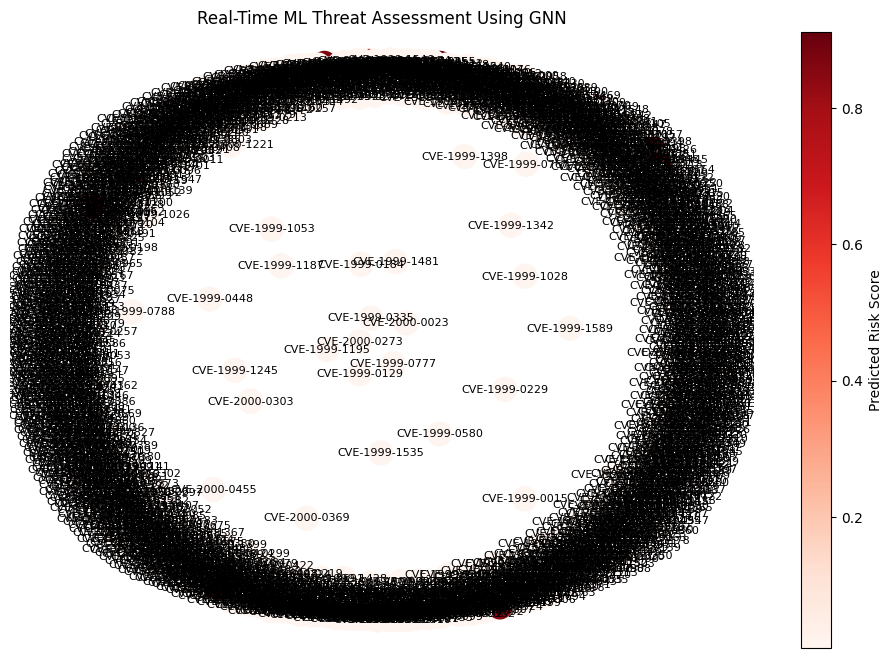

,CVE ID,Description,CVSS Score,Exploitability Score,Patch Status,Description Embedding,Predicted Risk Score
0,CVE-1999-0095,"The debug command in Sendmail is enabled, allo...",0.0,0.0,0.0,"[-0.30670723, -0.2735599, -0.13456713, -0.0318...",0.007292
1,CVE-1999-0082,CWD ~root command in ftpd allows root access.,0.0,0.0,0.0,"[-0.25109825, -0.5798773, -0.060379345, 0.1130...",0.007292
2,CVE-1999-1471,Buffer overflow in passwd in BSD based operati...,0.0,0.0,0.0,"[-0.18300262, -0.21345747, -0.017183797, -0.04...",0.007292
3,CVE-1999-1122,Vulnerability in restore in SunOS 4.0.3 and ea...,0.0,0.0,0.0,"[-0.4095518, -0.3216776, 0.2206344, -0.0115988...",0.007292
4,CVE-1999-1467,Vulnerability in rcp on SunOS 4.0.x allows rem...,0.0,0.0,0.0,"[-0.29170173, -0.07714238, 0.036471408, 0.0547...",0.007292
...,...,...,...,...,...,...,...
1995,CVE-2000-0462,ftpd in NetBSD 1.4.2 does not properly parse e...,0.0,0.0,0.0,"[-0.25076887, 0.099627286, 0.3053422, -0.04973...",0.007292
1996,CVE-2000-0454,Buffer overflow in Linux cdrecord allows local...,0.0,0.0,0.0,"[-0.014814463, -0.35103318, -0.088574424, 0.21...",0.007292
1997,CVE-2000-0455,Buffer overflow in xlockmore xlock program ver...,0.0,0.0,0.0,"[-0.19962008, -0.22536013, 0.22064935, 0.19099...",0.007292
1998,CVE-2000-0461,The undocumented semconfig system call in BSD ...,0.0,0.0,0.0,"[-0.069416404, 0.08887075, 0.1454869, -0.08589...",0.007292


In [ ]:
import requests
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.preprocessing import MinMaxScaler
from transformers import BertTokenizer, BertModel
from torch_geometric.nn import GATConv, HeteroConv
from torch_geometric.data import HeteroData
import datetime
import networkx as nx
import matplotlib.pyplot as plt
import itertools

# -Step 1: Fetch Real-Time Vulnerability Feeds from NVD
def fetch_nvd_data():
    url = "https://services.nvd.nist.gov/rest/json/cves/2.0?resultsPerPage=2000"
    response = requests.get(url)

    if response.status_code == 200:
        data = response.json()
        return data.get("vulnerabilities", [])
    else:
        print(f"Error fetching data from NVD API. Status code: {response.status_code}")
        return []

# -Step 2: Extract Key Threat Intelligence from NVD
cve_items = fetch_nvd_data()
extracted_data = []

for item in cve_items:
    cve_id = item.get("cve", {}).get("id", "N/A")
    description = item.get("cve", {}).get("descriptions", [{}])[0].get("value", "")
    impact = item.get("cve", {}).get("metrics", {}).get("cvssMetricV31", [{}])

    if impact:
        impact = impact[0]
        cvss_score = impact.get("cvssData", {}).get("baseScore", 0)
        exploitability_score = impact.get("exploitabilityScore", 0)
        patch_status = 1 if impact.get("impactScore", 0) > 0 else 0
    else:
        cvss_score = 0
        exploitability_score = 0
        patch_status = 0

    extracted_data.append({
        "CVE ID": cve_id,
        "Description": description,
        "CVSS Score": cvss_score,
        "Exploitability Score": exploitability_score,
        "Patch Status": patch_status
    })

df = pd.DataFrame(extracted_data)

# -Step 3: NLP for Threat Classification using BERT Embeddings
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
bert_model = BertModel.from_pretrained('bert-base-uncased')

def get_bert_embedding(text):
    inputs = tokenizer(text, return_tensors='pt', truncation=True, padding=True, max_length=64)
    with torch.no_grad():
        outputs = bert_model(**inputs)
    return outputs.last_hidden_state.mean(dim=1).squeeze().numpy()

df["Description Embedding"] = df["Description"].apply(get_bert_embedding)

# -Step 4: Normalize Features
scaler = MinMaxScaler()
df[["CVSS Score", "Exploitability Score", "Patch Status"]] = scaler.fit_transform(df[["CVSS Score", "Exploitability Score", "Patch Status"]])

# -Step 5: Build GNN-Based Risk Prediction Model
features = torch.tensor(df["Description Embedding"].tolist(), dtype=torch.float32)
additional_features = torch.tensor(df[["CVSS Score", "Exploitability Score", "Patch Status"]].values, dtype=torch.float32)
combined_features = torch.cat((features, additional_features), dim=1)

data = HeteroData()
data["cve"].x = combined_features

# -Fix: Create Edge Index for CVEs (Based on Similarity)
edge_list = []

# Define edges by linking CVEs with similar descriptions
for i, j in itertools.combinations(range(len(df)), 2):
    if df.iloc[i]["CVSS Score"] == df.iloc[j]["CVSS Score"]:  # Example: Link CVEs with the same CVSS score
        edge_list.append((i, j))
        edge_list.append((j, i))  # Undirected graph

if edge_list:
    edge_index = torch.tensor(edge_list, dtype=torch.long).T
else:
    edge_index = torch.empty((2, 0), dtype=torch.long)  # Avoid empty edge error

data["cve", "linked_to", "cve"].edge_index = edge_index

# -Step 6: Define GNN Model
class CVEGNN(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(CVEGNN, self).__init__()
        self.conv1 = HeteroConv({
            ("cve", "linked_to", "cve"): GATConv(in_channels, hidden_channels, add_self_loops=False),
        }, aggr="mean")

        self.conv2 = HeteroConv({
            ("cve", "linked_to", "cve"): GATConv(hidden_channels, out_channels, add_self_loops=False),
        }, aggr="mean")

        self.fc = nn.Linear(out_channels, 1)

    def forward(self, data):
        x_dict = data.x_dict
        x_dict = self.conv1(x_dict, data.edge_index_dict)
        x_dict = self.conv2(x_dict, data.edge_index_dict)
        for key in x_dict:
            x_dict[key] = self.fc(x_dict[key])
        return x_dict

# -Step 7: Train GNN Model
model = CVEGNN(in_channels=combined_features.shape[1], hidden_channels=32, out_channels=16)
optimizer = optim.Adam(model.parameters(), lr=0.01)
loss_fn = nn.MSELoss()

losses = []
targets = torch.tensor(df["CVSS Score"].values, dtype=torch.float32).unsqueeze(1)

for epoch in range(100):
    optimizer.zero_grad()
    out = model(data)
    if "cve" in out:
        loss = loss_fn(out["cve"], targets)
        loss.backward()
        optimizer.step()
        losses.append(loss.item())

# -Step 8: Predict Threats Using GNN
predictions = model(data)["cve"].detach().numpy()
df["Predicted Risk Score"] = predictions.flatten()

# -Step 9: Visualizing CVE Risk Propagation
G = nx.Graph()
for _, row in df.iterrows():
    G.add_node(row["CVE ID"], risk=row["Predicted Risk Score"])

plt.figure(figsize=(12, 8))
pos = nx.spring_layout(G, seed=42)
node_colors = [G.nodes[node]["risk"] for node in G.nodes()]
nodes = nx.draw_networkx_nodes(G, pos, node_color=node_colors, cmap=plt.cm.Reds, node_size=300)
nx.draw_networkx_edges(G, pos, alpha=0.5)
nx.draw_networkx_labels(G, pos, font_size=8)

plt.colorbar(nodes, label="Predicted Risk Score")
plt.title("Real-Time ML Threat Assessment Using GNN")
plt.axis("off")
plt.show()

df


In [ ]:
url = "https://cve-nist.idalko.com/nvdcve-1.1-2025.json"
url = "https://services.nvd.nist.gov/rest/json/cves/2.0"

In [ ]:
import requests

# Fetch NVD CVE Data using the Correct API
def fetch_nvd_data():
    url = "https://services.nvd.nist.gov/rest/json/cves/2.0"  # -Updated API URL

    try:
        response = requests.get(url, timeout=10)  # Add timeout to prevent hanging
        response.raise_for_status()  # Raise error for bad requests (404, 500)

        # Check if response is empty
        if not response.text.strip():
            print(" Error: Empty response received from NVD API.")
            return []

        # Attempt to parse JSON
        data = response.json()
        return data.get("vulnerabilities", [])

    except requests.exceptions.Timeout:
        print(" Error: Request timed out. The NVD API might be experiencing high traffic.")
    except requests.exceptions.RequestException as e:
        print(f" Error: Failed to retrieve data from NVD API. Details: {e}")
    except ValueError:
        print(" Error: Unable to parse JSON. The response might not be in valid JSON format.")

    return []  # Return an empty list if an error occurs

# Fetch data and check if it works
cve_items = fetch_nvd_data()
if not cve_items:
    print(" No CVE data retrieved. Check API status or try again later.")
else:
    print(f"-Successfully retrieved {len(cve_items)} CVEs.")


❌ Error: Failed to retrieve data from NVD API. Details: 503 Server Error: Service Unavailable for url: https://services.nvd.nist.gov/rest/json/cves/2.0
⚠️ No CVE data retrieved. Check API status or try again later.


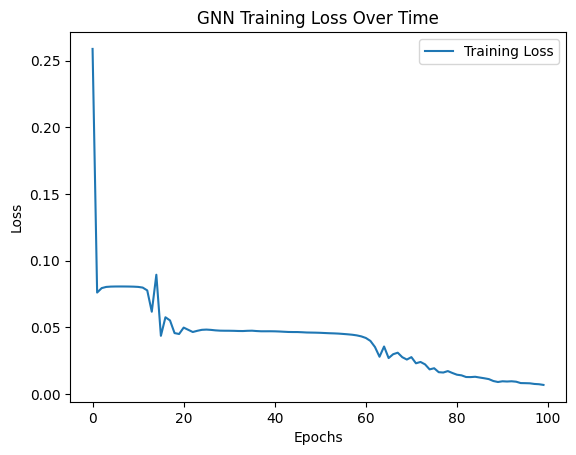

              CVE ID                                        Description  \
0      CVE-2025-0015  Use After Free vulnerability in Arm Ltd Valhal...   
1      CVE-2025-0053  SAP NetWeaver Application Server for ABAP and ...   
2      CVE-2025-0055  SAP GUI for Windows stores user input on the c...   
3      CVE-2025-0056  SAP GUI for Java saves user input on the clien...   
4      CVE-2025-0057  SAP NetWeaver AS JAVA (User Admin Application)...   
...              ...                                                ...   
2268  CVE-2025-25168  Cross-Site Request Forgery (CSRF) vulnerabilit...   
2269  CVE-2025-25181  A SQL injection vulnerability in timeoutWarnin...   
2270  CVE-2025-25183  vLLM is a high-throughput and memory-efficient...   
2271  CVE-2025-25187  Joplin is a free, open source note taking and ...   
2272  CVE-2025-25246  NETGEAR XR1000 before 1.0.0.74, XR1000v2 befor...   

      CVSS Score  Exploitability Score  Patch Status  Predicted Risk Score  
0            0.0      

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import requests
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from transformers import BertTokenizer, BertModel
from torch_geometric.nn import GATConv, HeteroConv
from torch_geometric.data import HeteroData
import numpy as np

# -Step 1: Load CVE Data
cve_url = "https://cve-nist.idalko.com/nvdcve-1.1-2025.json"
response = requests.get(cve_url)
cve_data = response.json()

# -Step 2: Extract CVE Information
cve_items = cve_data.get('CVE_Items', [])
extracted_data, product_list, reference_list = [], [], []

for item in cve_items:
    cve_id = item.get('cve', {}).get('CVE_data_meta', {}).get('ID', 'N/A')
    description = item.get('cve', {}).get('description', {}).get('description_data', [{}])[0].get('value', '')
    impact = item.get('impact', {})
    cvss_score = impact.get('baseMetricV3', {}).get('cvssV3', {}).get('baseScore', 0)
    exploitability_score = impact.get('baseMetricV3', {}).get('exploitabilityScore', 0)
    patch_status = 1 if impact.get('baseMetricV3', {}).get('impactScore', 0) > 0 else 0

    # Products
    products = item.get("configurations", {}).get("nodes", [])
    for prod in products:
        if "cpe_match" in prod:
            for cpe in prod['cpe_match']:
                product_name = cpe.get('cpe23Uri', '').split(':')[4] if len(cpe.get('cpe23Uri', '').split(':')) > 4 else None
                if product_name and product_name not in product_list:
                    product_list.append(product_name)

    # References
    references = item["cve"]["references"]["reference_data"]
    for ref in references:
        url = ref.get("url", "")
        if url not in reference_list:
            reference_list.append(url)

    extracted_data.append({
        'CVE ID': cve_id,
        'Description': description,
        'CVSS Score': cvss_score,
        'Exploitability Score': exploitability_score,
        'Patch Status': patch_status
    })

# -Step 3: Generate BERT Embeddings
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
bert_model = BertModel.from_pretrained('bert-base-uncased')

def get_bert_embedding(text):
    inputs = tokenizer(text, return_tensors='pt', truncation=True, padding=True, max_length=64)
    with torch.no_grad():
        outputs = bert_model(**inputs)
    return outputs.last_hidden_state.mean(dim=1).squeeze().numpy()

# Apply BERT Embeddings
df = pd.DataFrame(extracted_data)
df['Description Embedding'] = df['Description'].apply(get_bert_embedding)

# -Normalize Features
scaler = MinMaxScaler()
df[['CVSS Score', 'Exploitability Score', 'Patch Status']] = scaler.fit_transform(df[['CVSS Score', 'Exploitability Score', 'Patch Status']])

# -Combine Features
features = torch.tensor(np.vstack(df['Description Embedding'].values), dtype=torch.float32)
additional_features = torch.tensor(df[['CVSS Score', 'Exploitability Score', 'Patch Status']].values, dtype=torch.float32)
combined_features = torch.cat((features, additional_features), dim=1)

# -Build Heterogeneous Graph
data = HeteroData()
data["cve"].x = combined_features
data["product"].x = torch.randn(len(product_list), combined_features.shape[1])
data["reference"].x = torch.randn(len(reference_list), combined_features.shape[1])

# -Build Edges
cve_to_product_edges, cve_to_reference_edges = [], []
product_to_cve_edges, reference_to_cve_edges = [], []

for cve_idx, item in enumerate(cve_items):
    products = item.get("configurations", {}).get("nodes", [])
    for prod in products:
        if "cpe_match" in prod:
            for cpe in prod['cpe_match']:
                product_name = cpe.get('cpe23Uri', '').split(':')[4]
                if product_name in product_list:
                    prod_idx = product_list.index(product_name)
                    cve_to_product_edges.append([cve_idx, prod_idx])
                    product_to_cve_edges.append([prod_idx, cve_idx])

    references = item["cve"]["references"]["reference_data"]
    for ref in references:
        url = ref.get("url", "")
        if url in reference_list:
            ref_idx = reference_list.index(url)
            cve_to_reference_edges.append([cve_idx, ref_idx])
            reference_to_cve_edges.append([ref_idx, cve_idx])

# Convert to Tensors
def safe_tensor(edge_list):
    return torch.tensor(edge_list, dtype=torch.long).T if edge_list else torch.empty((2, 0), dtype=torch.long)

# -Assign Edges
data["cve", "affects", "product"].edge_index = safe_tensor(cve_to_product_edges)
data["product", "affected_by", "cve"].edge_index = safe_tensor(product_to_cve_edges)
data["cve", "referenced_by", "reference"].edge_index = safe_tensor(cve_to_reference_edges)
data["reference", "references", "cve"].edge_index = safe_tensor(reference_to_cve_edges)

# -Step 4: Define the GNN Model
class CVEGNN(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(CVEGNN, self).__init__()
        self.conv1 = HeteroConv({
            ("cve", "affects", "product"): GATConv(in_channels, hidden_channels, add_self_loops=False),
            ("product", "affected_by", "cve"): GATConv(in_channels, hidden_channels, add_self_loops=False),
            ("cve", "referenced_by", "reference"): GATConv(in_channels, hidden_channels, add_self_loops=False),
            ("reference", "references", "cve"): GATConv(in_channels, hidden_channels, add_self_loops=False),
        }, aggr='mean')

        self.conv2 = HeteroConv({
            ("cve", "affects", "product"): GATConv(hidden_channels, out_channels, add_self_loops=False),
            ("product", "affected_by", "cve"): GATConv(hidden_channels, out_channels, add_self_loops=False),
            ("cve", "referenced_by", "reference"): GATConv(hidden_channels, out_channels, add_self_loops=False),
            ("reference", "references", "cve"): GATConv(hidden_channels, out_channels, add_self_loops=False),
        }, aggr='mean')

        self.fc = nn.Sequential(
            nn.Linear(out_channels, 1),
            nn.Sigmoid()
        )

    def forward(self, data):
        x_dict = data.x_dict
        x_dict = self.conv1(x_dict, data.edge_index_dict)
        x_dict = self.conv2(x_dict, data.edge_index_dict)
        for key in x_dict:
            x_dict[key] = self.fc(x_dict[key])
        return x_dict

# -Step 5: Train the Model
model = CVEGNN(in_channels=combined_features.shape[1], hidden_channels=32, out_channels=16)
optimizer = optim.Adam(model.parameters(), lr=0.01)
loss_fn = nn.MSELoss()

losses = []
targets = torch.tensor(df['CVSS Score'].values, dtype=torch.float32).unsqueeze(1)

for epoch in range(100):
    optimizer.zero_grad()
    out = model(data)
    if "cve" in out:
        loss = loss_fn(out["cve"], targets)
        loss.backward()
        optimizer.step()
        losses.append(loss.item())

# -Step 6: Visualize Training Loss
plt.plot(losses, label="Training Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("GNN Training Loss Over Time")
plt.legend()
plt.show()

# -Step 10: Predict Threats
predictions = model(data)["cve"].detach().numpy()

# -Step 11: Display Predictions
prediction_df = pd.DataFrame({
    "CVE ID": df['CVE ID'],
    "Description": df['Description'],
    "CVSS Score": df['CVSS Score'],
    "Exploitability Score": df['Exploitability Score'],
    "Patch Status": df['Patch Status'],
    "Predicted Risk Score": predictions.flatten()
})

print(prediction_df)


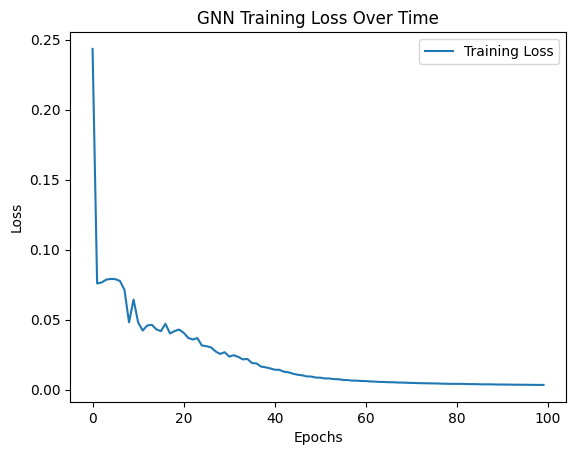

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import requests
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from transformers import BertTokenizer, BertModel
from torch_geometric.nn import GATConv, HeteroConv
from torch_geometric.data import HeteroData

# -Step 1: Load CVE Data
cve_url = "https://cve-nist.idalko.com/nvdcve-1.1-2025.json"
response = requests.get(cve_url)
cve_data = response.json()

# -Step 2: Extract CVE Information
cve_items = cve_data.get('CVE_Items', [])
extracted_data, product_list, reference_list = [], [], []

for item in cve_items:
    cve_id = item.get('cve', {}).get('CVE_data_meta', {}).get('ID', 'N/A')
    description = item.get('cve', {}).get('description', {}).get('description_data', [{}])[0].get('value', '')
    impact = item.get('impact', {})
    cvss_score = impact.get('baseMetricV3', {}).get('cvssV3', {}).get('baseScore', 0)
    exploitability_score = impact.get('baseMetricV3', {}).get('exploitabilityScore', 0)
    patch_status = 1 if impact.get('baseMetricV3', {}).get('impactScore', 0) > 0 else 0

    # Products
    products = item.get("configurations", {}).get("nodes", [])
    for prod in products:
        if "cpe_match" in prod:
            for cpe in prod['cpe_match']:
                product_name = cpe.get('cpe23Uri', '').split(':')[4] if len(cpe.get('cpe23Uri', '').split(':')) > 4 else None
                if product_name and product_name not in product_list:
                    product_list.append(product_name)

    # References
    references = item["cve"]["references"]["reference_data"]
    for ref in references:
        url = ref.get("url", "")
        if url not in reference_list:
            reference_list.append(url)

    extracted_data.append({
        'CVE ID': cve_id,
        'Description': description,
        'CVSS Score': cvss_score,
        'Exploitability Score': exploitability_score,
        'Patch Status': patch_status
    })

# -Step 3: Generate BERT Embeddings
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
bert_model = BertModel.from_pretrained('bert-base-uncased')

def get_bert_embedding(text):
    inputs = tokenizer(text, return_tensors='pt', truncation=True, padding=True, max_length=64)
    with torch.no_grad():
        outputs = bert_model(**inputs)
    return outputs.last_hidden_state.mean(dim=1).squeeze().numpy()

# Apply BERT Embeddings
df = pd.DataFrame(extracted_data)
df['Description Embedding'] = df['Description'].apply(get_bert_embedding)

# -Normalize Features
scaler = MinMaxScaler()
df[['CVSS Score', 'Exploitability Score', 'Patch Status']] = scaler.fit_transform(df[['CVSS Score', 'Exploitability Score', 'Patch Status']])

# -Combine Features
features = torch.tensor(np.vstack(df['Description Embedding'].values), dtype=torch.float32)
additional_features = torch.tensor(df[['CVSS Score', 'Exploitability Score', 'Patch Status']].values, dtype=torch.float32)
combined_features = torch.cat((features, additional_features), dim=1)

# -Build Heterogeneous Graph
data = HeteroData()
data["cve"].x = combined_features
data["product"].x = torch.randn(len(product_list), combined_features.shape[1])
data["reference"].x = torch.randn(len(reference_list), combined_features.shape[1])

# -Build Edges
cve_to_product_edges, cve_to_reference_edges = [], []
product_to_cve_edges, reference_to_cve_edges = [], []  # Reverse Edges

for cve_idx, item in enumerate(cve_items):
    products = item.get("configurations", {}).get("nodes", [])
    for prod in products:
        if "cpe_match" in prod:
            for cpe in prod['cpe_match']:
                product_name = cpe.get('cpe23Uri', '').split(':')[4]
                if product_name in product_list:
                    prod_idx = product_list.index(product_name)
                    cve_to_product_edges.append([cve_idx, prod_idx])
                    product_to_cve_edges.append([prod_idx, cve_idx])  # Reverse

    references = item["cve"]["references"]["reference_data"]
    for ref in references:
        url = ref.get("url", "")
        if url in reference_list:
            ref_idx = reference_list.index(url)
            cve_to_reference_edges.append([cve_idx, ref_idx])
            reference_to_cve_edges.append([ref_idx, cve_idx])  # Reverse

# Convert to Tensors
def safe_tensor(edge_list):
    return torch.tensor(edge_list, dtype=torch.long).T if edge_list else torch.empty((2, 0), dtype=torch.long)

# -Assign Edges
data["cve", "affects", "product"].edge_index = safe_tensor(cve_to_product_edges)
data["product", "affected_by", "cve"].edge_index = safe_tensor(product_to_cve_edges)
data["cve", "referenced_by", "reference"].edge_index = safe_tensor(cve_to_reference_edges)
data["reference", "references", "cve"].edge_index = safe_tensor(reference_to_cve_edges)

# -Step 4: Define the GNN Model
class CVEGNN(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(CVEGNN, self).__init__()
        self.conv1 = HeteroConv({
            ("cve", "affects", "product"): GATConv(in_channels, hidden_channels, add_self_loops=False),
            ("product", "affected_by", "cve"): GATConv(in_channels, hidden_channels, add_self_loops=False),
            ("cve", "referenced_by", "reference"): GATConv(in_channels, hidden_channels, add_self_loops=False),
            ("reference", "references", "cve"): GATConv(in_channels, hidden_channels, add_self_loops=False),
        }, aggr='mean')

        self.conv2 = HeteroConv({
            ("cve", "affects", "product"): GATConv(hidden_channels, out_channels, add_self_loops=False),
            ("product", "affected_by", "cve"): GATConv(hidden_channels, out_channels, add_self_loops=False),
            ("cve", "referenced_by", "reference"): GATConv(hidden_channels, out_channels, add_self_loops=False),
            ("reference", "references", "cve"): GATConv(hidden_channels, out_channels, add_self_loops=False),
        }, aggr='mean')

        self.fc = nn.Sequential(
            nn.Linear(out_channels, 1),
            nn.Sigmoid()
        )

    def forward(self, data):
        x_dict = data.x_dict
        x_dict = self.conv1(x_dict, data.edge_index_dict)
        x_dict = self.conv2(x_dict, data.edge_index_dict)
        for key in x_dict:
            x_dict[key] = self.fc(x_dict[key])
        return x_dict

# -Step 5: Train the Model
model = CVEGNN(in_channels=combined_features.shape[1], hidden_channels=32, out_channels=16)
optimizer = optim.Adam(model.parameters(), lr=0.01)
loss_fn = nn.MSELoss()

losses = []
targets = torch.tensor(df['CVSS Score'].values, dtype=torch.float32).unsqueeze(1)

for epoch in range(100):
    optimizer.zero_grad()
    out = model(data)
    if "cve" in out:
        loss = loss_fn(out["cve"], targets)
        loss.backward()
        optimizer.step()
        losses.append(loss.item())

# -Step 6: Visualize Training Loss
plt.plot(losses, label="Training Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("GNN Training Loss Over Time")
plt.legend()
plt.show()


# -Step 10: Predict Threats
predictions = model(data)["cve"].detach().numpy()

# -Step 11: Display Predictions
prediction_df = pd.DataFrame({
    "CVE ID": df['CVE ID'],
    "Description": df['Description'],
    "CVSS Score": df['CVSS Score'],
    "Exploitability Score": df['Exploitability Score'],
    "Patch Status": df['Patch Status'],
    "Predicted Risk Score": predictions.flatten()
})

print(prediction_df)


In [ ]:
# -Step 10: Predict Threats
predictions = model(data)["cve"].detach().numpy()

# -Step 11: Display Predictions
prediction_df = pd.DataFrame({
    "CVE ID": df['CVE ID'],
    "Description": df['Description'],
    "CVSS Score": df['CVSS Score'],
    "Exploitability Score": df['Exploitability Score'],
    "Patch Status": df['Patch Status'],
    "Predicted Risk Score": predictions.flatten()
})

print(prediction_df)

              CVE ID                                        Description  \
0      CVE-2025-0015  Use After Free vulnerability in Arm Ltd Valhal...   
1      CVE-2025-0053  SAP NetWeaver Application Server for ABAP and ...   
2      CVE-2025-0055  SAP GUI for Windows stores user input on the c...   
3      CVE-2025-0056  SAP GUI for Java saves user input on the clien...   
4      CVE-2025-0057  SAP NetWeaver AS JAVA (User Admin Application)...   
...              ...                                                ...   
2268  CVE-2025-25168  Cross-Site Request Forgery (CSRF) vulnerabilit...   
2269  CVE-2025-25181  A SQL injection vulnerability in timeoutWarnin...   
2270  CVE-2025-25183  vLLM is a high-throughput and memory-efficient...   
2271  CVE-2025-25187  Joplin is a free, open source note taking and ...   
2272  CVE-2025-25246  NETGEAR XR1000 before 1.0.0.74, XR1000v2 befor...   

      CVSS Score  Exploitability Score  Patch Status  Predicted Risk Score  
0            0.0      

In [ ]:
# import json
# import pandas as pd

# # Load the JSON file
# file_path = 'nvdcve-1.1-2025.json'
# with open(file_path, 'r') as file:
#     cve_data = json.load(file)

# # Extract relevant information
# cve_items = cve_data.get('CVE_Items', [])
# extracted_data = []

# for item in cve_items:
#     cve_id = item.get('cve', {}).get('CVE_data_meta', {}).get('ID', 'N/A')
#     description_data = item.get('cve', {}).get('description', {}).get('description_data', [])
#     description = description_data[0].get('value', 'N/A') if description_data else 'N/A'
#     published_date = item.get('publishedDate', 'N/A')

#     # Extract CVSS Score and Exploitability Score if available
#     impact = item.get('impact', {})
#     cvss_score = 0
#     exploitability_score = 0
#     patch_status = 0

#     if 'baseMetricV3' in impact:
#         cvss_score = impact['baseMetricV3'].get('cvssV3', {}).get('baseScore', 0)
#         exploitability_score = impact['baseMetricV3'].get('exploitabilityScore', 0)
#     elif 'baseMetricV2' in impact:
#         cvss_score = impact['baseMetricV2'].get('cvssV2', {}).get('baseScore', 0)
#         exploitability_score = impact['baseMetricV2'].get('exploitabilityScore', 0)

#     # Check for patch information (assumed from configurations or references)
#     configurations = item.get('configurations', {}).get('nodes', [])
#     patch_status = 1 if any(config.get('operator') == 'OR' for config in configurations) else 0

#     extracted_data.append({
#         'CVE ID': cve_id,
#         'Description': description,
#         'CVSS Score': cvss_score,
#         'Exploitability Score': exploitability_score,
#         'Patch Status': patch_status,
#         'Published Date': published_date
#     })

# # Convert to DataFrame
# cve_df = pd.DataFrame(extracted_data)

# # Save to CSV
# csv_path = 'processed_nvd_data.csv'
# cve_df.to_csv(csv_path, index=False)

import json
import pandas as pd

# Load the JSON file
file_path = 'nvdcve-1.1-2025.json'
with open(file_path, 'r') as file:
    cve_data = json.load(file)

# Extract relevant information
cve_items = cve_data.get('CVE_Items', [])
extracted_data = []

for item in cve_items:
    cve_id = item.get('cve', {}).get('CVE_data_meta', {}).get('ID', 'N/A')
    description_data = item.get('cve', {}).get('description', {}).get('description_data', [])
    description = description_data[0].get('value', 'N/A') if description_data else 'N/A'
    published_date = item.get('publishedDate', 'N/A')

    # Extract CVSS Score and Exploitability Score
    impact = item.get('impact', {})
    cvss_score = None
    exploitability_score = None
    patch_status = "Unpatched"  # Default value if no information is available

    if 'baseMetricV3' in impact:
        cvss_score = impact['baseMetricV3'].get('cvssV3', {}).get('baseScore', 'N/A')
        exploitability_score = impact['baseMetricV3'].get('exploitabilityScore', 'N/A')
        patch_status = "Patched" if impact['baseMetricV3'].get('impactScore', 0) < 5 else "Unpatched"
    elif 'baseMetricV2' in impact:
        cvss_score = impact['baseMetricV2'].get('cvssV2', {}).get('baseScore', 'N/A')
        exploitability_score = impact['baseMetricV2'].get('exploitabilityScore', 'N/A')
        patch_status = "Patched" if impact['baseMetricV2'].get('impactScore', 0) < 5 else "Unpatched"

    # Simulate dependency based on description keywords
    dependency = "Unknown"
    keywords = ["OpenSSL", "Linux Kernel", "Apache", "WordPress", "Docker", "MySQL"]
    for keyword in keywords:
        if keyword.lower() in description.lower():
            dependency = keyword
            break

    extracted_data.append({
        'CVE ID': cve_id,
        'Dependency': dependency,
        'Description': description,
        'CVSS Score': cvss_score,
        'Exploitability Score': exploitability_score,
        'Patch Status': patch_status,
        'Published Date': published_date
    })

# Convert to DataFrame
cve_df = pd.DataFrame(extracted_data)

# Save to CSV
csv_path = 'processed_nvd_data_with_dependencies.csv'
cve_df.to_csv(csv_path, index=False)



# Using Description to generate ebeddings


In [ ]:
import json
from transformers import BertTokenizer, BertModel
import torch
import pandas as pd

# Load the NVD JSON data
file_path = 'nvdcve-1.1-2025.json'
with open(file_path, 'r') as file:
    cve_data = json.load(file)

# Extract CVE IDs and Descriptions
extracted_data = []
for item in cve_data.get('CVE_Items', []):
    cve_id = item.get('cve', {}).get('CVE_data_meta', {}).get('ID', 'N/A')
    description_data = item.get('cve', {}).get('description', {}).get('description_data', [])
    description = description_data[0].get('value', 'N/A') if description_data else 'N/A'
    extracted_data.append({'CVE ID': cve_id, 'Description': description})

# Convert to DataFrame
cve_df = pd.DataFrame(extracted_data)

# Initialize BERT tokenizer and model for embeddings
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = BertModel.from_pretrained('bert-base-uncased')

# Generate text embeddings
def get_text_embedding(text):
    inputs = tokenizer(text, return_tensors='pt', truncation=True, padding=True, max_length=128)
    with torch.no_grad():
        outputs = model(**inputs)
    return outputs.last_hidden_state.mean(dim=1).squeeze().numpy()

# Apply embedding extraction
cve_df['Embedding'] = cve_df['Description'].apply(get_text_embedding)

# Display the embeddings for verification
##import ace_tools as tools; tools.display_dataframe_to_user("CVE Descriptions with Embeddings", cve_df)

cve_df.head()


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

,CVE ID,Description,Embedding
0,CVE-2025-0015,Use After Free vulnerability in Arm Ltd Valhal...,"[-0.47229552, -0.13056478, 0.20169877, -0.0643..."
1,CVE-2025-0053,SAP NetWeaver Application Server for ABAP and ...,"[-0.42232054, 0.05389634, 0.1850839, 0.0611857..."
2,CVE-2025-0055,SAP GUI for Windows stores user input on the c...,"[-0.4091217, 0.15050833, 0.17101409, 0.0698567..."
3,CVE-2025-0056,SAP GUI for Java saves user input on the clien...,"[-0.3321717, 0.08975768, 0.17457865, 0.1029126..."
4,CVE-2025-0057,SAP NetWeaver AS JAVA (User Admin Application)...,"[-0.2117191, 0.0013129374, 0.11083447, 0.06246..."


In [ ]:
import json
from transformers import BertTokenizer, BertModel
import torch
import pandas as pd
import networkx as nx
from torch_geometric.data import Data
from torch_geometric.nn import GCNConv, GATConv
import torch.nn as nn
import torch.optim as optim

# Load the NVD JSON data
file_path = 'nvdcve-1.1-2025.json'
with open(file_path, 'r') as file:
    cve_data = json.load(file)

# Extract CVE IDs and Descriptions
extracted_data = []
for item in cve_data.get('CVE_Items', []):
    cve_id = item.get('cve', {}).get('CVE_data_meta', {}).get('ID', 'N/A')
    description_data = item.get('cve', {}).get('description', {}).get('description_data', [])
    description = description_data[0].get('value', 'N/A') if description_data else 'N/A'
    extracted_data.append({'CVE ID': cve_id, 'Description': description})

# Convert to DataFrame
cve_df = pd.DataFrame(extracted_data[:100])  # Limit to 100 entries for faster processing

# Initialize BERT tokenizer and model for embeddings
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
bert_model = BertModel.from_pretrained('bert-base-uncased')

# Generate text embeddings
def get_text_embedding(text):
    inputs = tokenizer(text, return_tensors='pt', truncation=True, padding=True, max_length=128)
    with torch.no_grad():
        outputs = bert_model(**inputs)
    return outputs.last_hidden_state.mean(dim=1).squeeze().numpy()

# Apply embedding extraction
cve_df['Embedding'] = cve_df['Description'].apply(get_text_embedding)

# Create Graph Representation
G = nx.Graph()
for index, row in cve_df.iterrows():
    G.add_node(row['CVE ID'], category='CVE', embedding=row['Embedding'])

# Create dummy edges for demonstration (connecting sequential CVEs)
#edges = [(i, i + 1) for i in range(len(G.nodes) - 1)]
# Create dummy edges, but using actual node names (CVE IDs)
edges = [(list(G.nodes)[i], list(G.nodes)[i + 1]) for i in range(len(G.nodes) - 1)]


# Convert to PyTorch Geometric format
#node_mapping = {node: idx for idx, node in enumerate(G.nodes)}
#edge_index = torch.tensor([(node_mapping[u], node_mapping[v]) for u, v in edges], dtype=torch.long).t().contiguous()
# Convert to PyTorch Geometric format
node_mapping = {node: idx for idx, node in enumerate(G.nodes)}
edge_index = torch.tensor([(node_mapping[u], node_mapping[v]) for u, v in edges], dtype=torch.long).t().contiguous()

x = torch.tensor(list(cve_df['Embedding']), dtype=torch.float)

# Define Graph Data for PyTorch Geometric
graph_data = Data(x=x, edge_index=edge_index)

# Define GNN Model
class ThreatVulnerabilityPredictionGNN(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(ThreatVulnerabilityPredictionGNN, self).__init__()
        self.conv1 = GCNConv(input_dim, hidden_dim)
        self.conv2 = GATConv(hidden_dim, output_dim)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = self.conv1(x, edge_index).relu()
        x = self.conv2(x, edge_index)
        return x

# Initialize Model, Loss, and Optimizer
model = ThreatVulnerabilityPredictionGNN(input_dim=x.shape[1], hidden_dim=64, output_dim=2)  # Binary classification
optimizer = optim.Adam(model.parameters(), lr=0.01)
loss_fn = nn.CrossEntropyLoss()

# Dummy targets (0 for 'No Threat', 1 for 'Threat') for demonstration
targets = torch.randint(0, 2, (x.shape[0],), dtype=torch.long)

# Train GNN
losses = []
for epoch in range(50):
    optimizer.zero_grad()
    out = model(graph_data)
    loss = loss_fn(out, targets)
    loss.backward()
    optimizer.step()
    losses.append(loss.item())

# Save predictions
predictions = torch.argmax(out, dim=1).numpy()
cve_df['Predicted Threat/Vulnerability'] = predictions


cve_df[['CVE ID', 'Predicted Threat/Vulnerability']]




The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:278.)


,CVE ID,Predicted Threat/Vulnerability
0,CVE-2025-0015,0
1,CVE-2025-0053,0
2,CVE-2025-0055,0
3,CVE-2025-0056,0
4,CVE-2025-0057,0
...,...,...
95,CVE-2025-0298,0
96,CVE-2025-0299,0
97,CVE-2025-0300,0
98,CVE-2025-0301,0


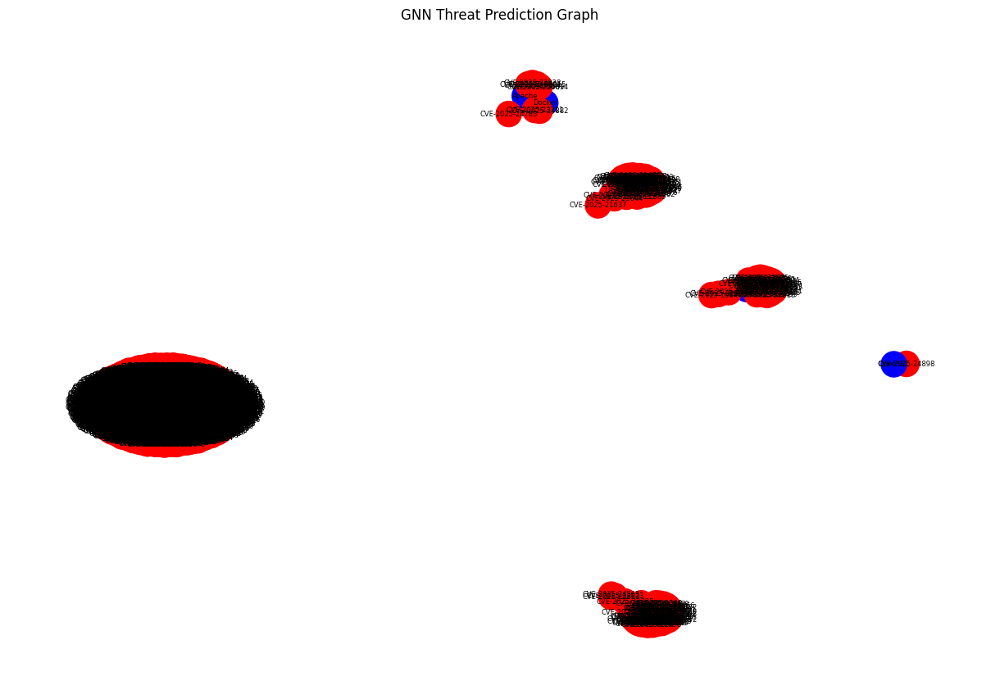

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch_geometric.data import Data
from torch_geometric.nn import GCNConv, GATConv

# Load CVE dataset
cve_data = pd.read_csv('processed_nvd_data_with_dependencies.csv')

# Create Graph Representation
G = nx.Graph()
for index, row in cve_data.iterrows():
    G.add_node(row['CVE ID'], category='CVE')
    G.add_node(row['Dependency'], category='Dependency')
    G.add_edge(row['CVE ID'], row['Dependency'])

# Convert Graph to PyTorch Geometric Data Format
node_mapping = {node: idx for idx, node in enumerate(G.nodes)}
edges = [(node_mapping[u], node_mapping[v]) for u, v in G.edges]

# Convert to tensor format
edge_index = torch.tensor(edges, dtype=torch.long).t().contiguous()
x = torch.rand(len(G.nodes), 16)  # Random feature vectors

# Define Graph Data for PyTorch Geometric
graph_data = Data(x=x, edge_index=edge_index)

# Define GNN Model
class ThreatPredictionGNN(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(ThreatPredictionGNN, self).__init__()
        self.conv1 = GCNConv(input_dim, hidden_dim)
        self.conv2 = GATConv(hidden_dim, output_dim)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = self.conv1(x, edge_index).relu()
        x = self.conv2(x, edge_index)
        return x

# Initialize Model, Loss, and Optimizer
model = ThreatPredictionGNN(input_dim=16, hidden_dim=32, output_dim=1)
optimizer = optim.Adam(model.parameters(), lr=0.01)
loss_fn = nn.MSELoss()

# Extract real CVSS scores as labels, but only for CVE nodes
# Get indices of CVE nodes in the graph
cve_indices = [node_mapping[cve_id] for cve_id in cve_data['CVE ID']]
# Select targets corresponding to CVE nodes
targets = torch.tensor(cve_data['CVSS Score'].fillna(0).values, dtype=torch.float32).view(-1, 1)

# Fix: Ensure cve_indices are within the valid range of targets
cve_indices = [i for i in cve_indices if i < targets.shape[0]]

targets = targets[torch.tensor(cve_indices)] # Select targets for CVE nodes only


# Train GNN
for epoch in range(100):
    optimizer.zero_grad()
    out = model(graph_data)
    # Select predictions corresponding to CVE nodes
    out_cve = out[torch.tensor(cve_indices)]
    loss = loss_fn(out_cve, targets)  # Real CVSS scores as targets for CVE nodes
    loss.backward()
    optimizer.step()



# Visualize Graph with Node Categories
plt.figure(figsize=(12, 8))
node_colors = ['red' if G.nodes[n]['category'] == 'CVE' else 'blue' for n in G.nodes]
nx.draw(G, with_labels=True, node_color=node_colors, edge_color='gray', font_size=6, node_size=500)
plt.title('GNN Threat Prediction Graph')
plt.show()

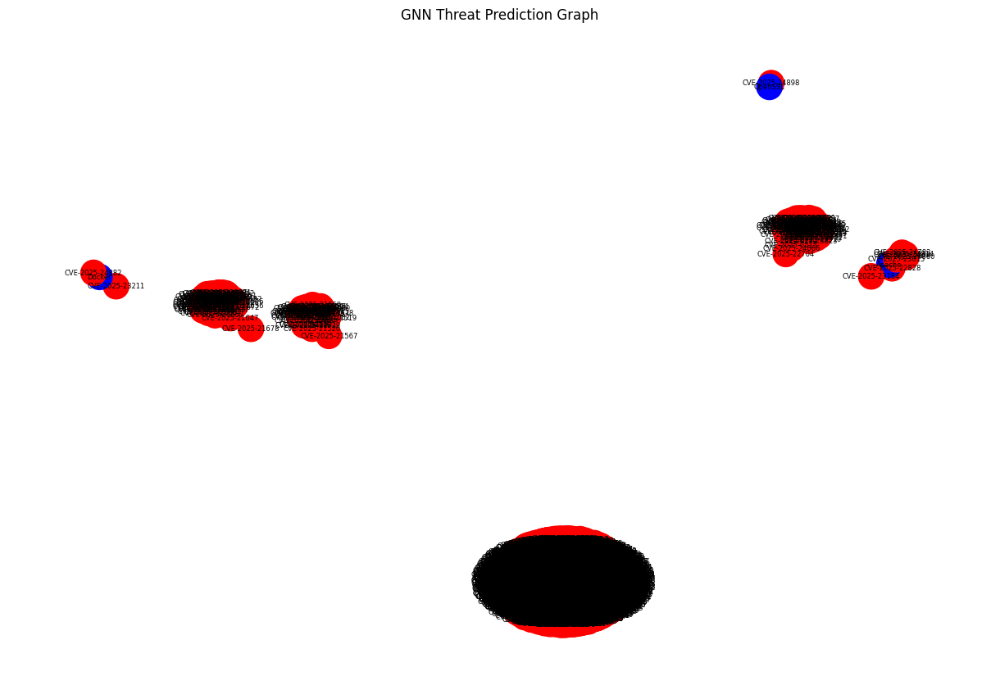

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch_geometric.data import Data
from torch_geometric.nn import RGCNConv
import pandas as pd
import networkx as nx
#from torch_geometric.utils import to_undirected # Removed this line to keep the graph directed

# Load the processed NVD data
file_path = 'processed_nvd_data_with_dependencies.csv'
nvd_df = pd.read_csv(file_path)

# Create a graph representation
G = nx.Graph()

# Add nodes (CVE IDs and Dependencies)
for _, row in nvd_df.iterrows():
    cve_id = row['CVE ID']
    dependency = row.get('Dependency', 'Unknown')

    G.add_node(cve_id, category='CVE')
    G.add_node(dependency, category='Dependency')
    G.add_edge(cve_id, dependency)

# Convert the graph to PyTorch Geometric data format
node_mapping = {node: idx for idx, node in enumerate(G.nodes)}
edges = [(node_mapping[u], node_mapping[v]) for u, v in G.edges]
edge_index = torch.tensor(edges, dtype=torch.long).t().contiguous()

# Create node features
x = torch.rand(len(G.nodes), 16)  # Random features for demonstration

# Labels for prediction (using CVSS Score as the target for simplicity)
# Fix: Get labels only for nodes that have a corresponding CVSS Score
labels = torch.tensor(nvd_df['CVSS Score'].fillna(0).values, dtype=torch.float)
# Map CVE IDs to node indices
cve_id_to_index = {row['CVE ID']: i for i, row in nvd_df.iterrows()}
# Create a list of labels for each node in the graph
node_labels = [labels[cve_id_to_index[node]] if node in cve_id_to_index else 0
               for node in G.nodes]
labels = torch.tensor(node_labels, dtype=torch.float)  # Updated labels

# Create edge types (relation identifiers)
# Here, we assign edge type 0 for CVE-Dependency relationships
edge_type = torch.zeros(edge_index.size(1), dtype=torch.long)

# Update PyTorch Geometric data object with edge type
graph_data = Data(x=x, edge_index=edge_index, y=labels, edge_type=edge_type)

# Define the GNN model
class AdvancedGNN(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(AdvancedGNN, self).__init__()
        self.conv1 = RGCNConv(input_dim, hidden_dim, num_relations=2)  # Specify num_relations
        self.conv2 = RGCNConv(hidden_dim, output_dim, num_relations=2)  # Specify num_relations
        self.fc = nn.Linear(output_dim, 1)

    def forward(self, data):
        x, edge_index, edge_type = data.x, data.edge_index, data.edge_type
        x = self.conv1(x, edge_index, edge_type).relu() # Pass edge_type to RGCNConv
        x = self.conv2(x, edge_index, edge_type) # Pass edge_type to RGCNConv
        return self.fc(x)

# Initialize the model, loss function, and optimizer
model = AdvancedGNN(input_dim=16, hidden_dim=32, output_dim=16)
optimizer = optim.Adam(model.parameters(), lr=0.01)
loss_fn = nn.MSELoss()

# Training loop (modified to include edge_type in the forward pass)
for epoch in range(100):
    optimizer.zero_grad()
    out = model(graph_data)  # Note: Pass `graph_data` which has the edge type
    # Fix: Calculate loss using all predictions and labels
    loss = loss_fn(out.squeeze(), graph_data.y.float())
    loss.backward()
    optimizer.step()

# Display the final predictions
predictions = out.detach().numpy()

# Fix: Create DataFrame using node_mapping to align predictions with CVE IDs
predicted_cvss_scores = {node: predictions[node_mapping[node]][0] for node in G.nodes if node in cve_id_to_index}

pd.DataFrame({
    'CVE ID': list(predicted_cvss_scores.keys()),
    'Predicted CVSS Score': list(predicted_cvss_scores.values())
})


# Visualize Graph with Node Categories
plt.figure(figsize=(12, 8))
node_colors = ['red' if G.nodes[n]['category'] == 'CVE' else 'blue' for n in G.nodes]
nx.draw(G, with_labels=True, node_color=node_colors, edge_color='gray', font_size=6, node_size=500)
plt.title('GNN Threat Prediction Graph')
plt.show()

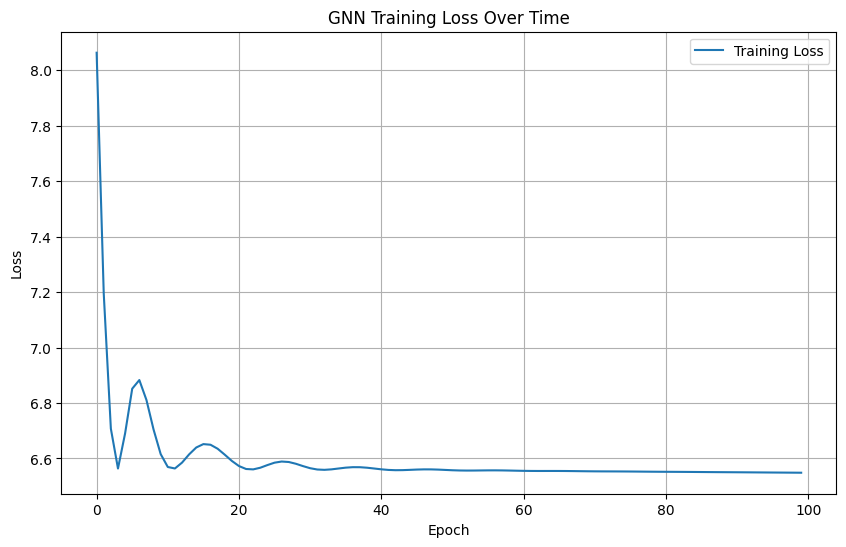

In [ ]:
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
import pandas as pd
import networkx as nx
from torch_geometric.data import Data
from torch_geometric.nn import GCNConv, GATConv



# Create Graph Representation
G = nx.Graph()
for index, row in cve_data.iterrows():
    G.add_node(row['CVE ID'], category='CVE')
    G.add_node(row['Dependency'], category='Dependency')
    G.add_edge(row['CVE ID'], row['Dependency'])

# Convert Graph to PyTorch Geometric Data Format
node_mapping = {node: idx for idx, node in enumerate(G.nodes)}
edges = [(node_mapping[u], node_mapping[v]) for u, v in G.edges]

# Convert to tensor format
edge_index = torch.tensor(edges, dtype=torch.long).t().contiguous()
x = torch.rand(len(G.nodes), 16)  # Random feature vectors

# Define Graph Data for PyTorch Geometric
graph_data = Data(x=x, edge_index=edge_index)

# Define GNN Model
class ThreatPredictionGNN(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(ThreatPredictionGNN, self).__init__()
        self.conv1 = GCNConv(input_dim, hidden_dim)
        self.conv2 = GATConv(hidden_dim, output_dim)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = self.conv1(x, edge_index).relu()
        x = self.conv2(x, edge_index)
        return x

# Initialize Model, Loss, and Optimizer
model = ThreatPredictionGNN(input_dim=16, hidden_dim=32, output_dim=1)
optimizer = optim.Adam(model.parameters(), lr=0.01)
loss_fn = nn.MSELoss()

# Extract real CVSS scores as labels, but only for CVE nodes
cve_indices = [node_mapping[cve_id] for cve_id in cve_data['CVE ID']]
targets = torch.tensor(cve_data['CVSS Score'].fillna(0).values, dtype=torch.float32).view(-1, 1)

# Ensure cve_indices are within the valid range
cve_indices = [i for i in cve_indices if i < targets.shape[0]]
targets = targets[torch.tensor(cve_indices)]

# Train GNN and track loss
losses = []
for epoch in range(100):
    optimizer.zero_grad()
    out = model(graph_data)
    out_cve = out[torch.tensor(cve_indices)]
    loss = loss_fn(out_cve, targets)
    loss.backward()
    optimizer.step()
    losses.append(loss.item())

# Plot the loss function
plt.figure(figsize=(10, 6))
plt.plot(losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('GNN Training Loss Over Time')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
import torch
from torch_geometric.data import HeteroData

data = HeteroData()

# Unique node lists
cve_nodes = [cve["cve_id"] for cve in cve_list]
product_nodes = list(set(
    cpe["cpe23Uri"] for cve in cve_list for node in cve["configurations"] for cpe in node.get("cpe_match", [])
    if "cpe23Uri" in cpe
))
reference_nodes = list(set(
    ref for cve in cve_list for ref in cve["references"]
))

# Map nodes to indices
cve_map = {cve: idx for idx, cve in enumerate(cve_nodes)}
product_map = {prod: idx for idx, prod in enumerate(product_nodes)}
reference_map = {ref: idx for idx, ref in enumerate(reference_nodes)}

# Assign node features
num_features = 16  # Placeholder feature size
data['cve'].x = torch.randn(len(cve_nodes), num_features)
data['product'].x = torch.randn(len(product_nodes), num_features)
data['reference'].x = torch.randn(len(reference_nodes), num_features)

# Define edges
cve_to_product_edges = []
cve_to_reference_edges = []

for cve in cve_list:
    cve_idx = cve_map[cve["cve_id"]]

    for node in cve["configurations"]:
        for cpe in node.get("cpe_match", []):
            product = cpe.get("cpe23Uri", "")
            if product and product in product_map:
                cve_to_product_edges.append((cve_idx, product_map[product]))

    for ref in cve["references"]:
        if ref in reference_map:
            cve_to_reference_edges.append((cve_idx, reference_map[ref]))

# Convert to PyG edge tensors
data['cve', 'affects', 'product'].edge_index = torch.tensor(cve_to_product_edges, dtype=torch.long).t().contiguous()
data['cve', 'referenced_by', 'reference'].edge_index = torch.tensor(cve_to_reference_edges, dtype=torch.long).t().contiguous()


In [ ]:
# import torch.nn as nn
# from torch_geometric.nn import GCNConv, HeteroConv

# class CVEGNN(nn.Module):
#     def __init__(self, in_channels, hidden_channels, out_channels):
#         super(CVEGNN, self).__init__()
#         self.conv1 = HeteroConv({
#             ("cve", "affects", "product"): GCNConv(in_channels, hidden_channels, add_self_loops=False), # Set add_self_loops=False
#             ("cve", "referenced_by", "reference"): GCNConv(in_channels, hidden_channels, add_self_loops=False), # Set add_self_loops=False
#         })
#         self.conv2 = HeteroConv({
#             ("cve", "affects", "product"): GCNConv(hidden_channels, out_channels, add_self_loops=False), # Set add_self_loops=False
#             ("cve", "referenced_by", "reference"): GCNConv(hidden_channels, out_channels, add_self_loops=False), # Set add_self_loops=False
#         })
#         self.fc = nn.Linear(out_channels, 1)  # Prediction layer

#     def forward(self, data):
#         x_dict = self.conv1(data.x_dict, data.edge_index_dict)
#         x_dict = self.conv2(x_dict, data.edge_index_dict)

#         # Apply final transformation
#         for key in x_dict:
#             x_dict[key] = self.fc(x_dict[key])

#         return x_dict

# import torch.nn as nn
# from torch_geometric.nn import SAGEConv, HeteroConv

# class CVEGNN(nn.Module):
#     def __init__(self, in_channels, hidden_channels, out_channels):
#         super(CVEGNN, self).__init__()
#         self.conv1 = HeteroConv({
#             ("cve", "affects", "product"): SAGEConv((in_channels, in_channels), hidden_channels),
#             ("cve", "referenced_by", "reference"): SAGEConv((in_channels, in_channels), hidden_channels),
#         })
#         self.conv2 = HeteroConv({
#             ("cve", "affects", "product"): SAGEConv((hidden_channels, hidden_channels), out_channels),
#             ("cve", "referenced_by", "reference"): SAGEConv((hidden_channels, hidden_channels), out_channels),
#         })
#         self.fc = nn.Linear(out_channels, 1)  # Prediction layer

#     def forward(self, data):
#         x_dict = self.conv1(data.x_dict, data.edge_index_dict)
#         x_dict = self.conv2(x_dict, data.edge_index_dict)

#         # Apply final transformation
#         for key in x_dict:
#             x_dict[key] = self.fc(x_dict[key])

#         return x_dict

import torch.nn as nn
from torch_geometric.nn import SAGEConv, HeteroConv

class CVEGNN(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(CVEGNN, self).__init__()
        self.conv1 = HeteroConv({
            ("cve", "affects", "product"): SAGEConv((in_channels, in_channels), hidden_channels),
            ("cve", "referenced_by", "reference"): SAGEConv((in_channels, in_channels), hidden_channels),
        }, aggr='mean')  # Explicitly set aggr to 'mean'
        self.conv2 = HeteroConv({
            ("cve", "affects", "product"): SAGEConv((hidden_channels, hidden_channels), out_channels),
            ("cve", "referenced_by", "reference"): SAGEConv((hidden_channels, hidden_channels), out_channels),
        }, aggr='mean')  # Explicitly set aggr to 'mean'
        self.fc = nn.Linear(out_channels, 1)  # Prediction layer

    def forward(self, data):
        x_dict = self.conv1(data.x_dict, data.edge_index_dict)
        x_dict = {key: x.relu() for key, x in x_dict.items()}  # Apply ReLU after the first layer
        x_dict = self.conv2(x_dict, data.edge_index_dict)
        x_dict = {key: x.relu() for key, x in x_dict.items()}  # Apply ReLU after the second layer

        # Apply final transformation
        for key in x_dict:
            x_dict[key] = self.fc(x_dict[key])

        return x_dict

In [ ]:
import torch
from torch_geometric.data import HeteroData

data = HeteroData()

# Ensure features are properly initialized
num_features = 16  # Adjusted feature size
data['cve'].x = torch.randn(len(cve_nodes), num_features) if cve_nodes else torch.empty(0, num_features)
data['product'].x = torch.randn(len(product_nodes), num_features) if product_nodes else torch.empty(0, num_features)
data['reference'].x = torch.randn(len(reference_nodes), num_features) if reference_nodes else torch.empty(0, num_features)

# Ensure edges exist before adding them
if cve_to_product_edges:
    data['cve', 'affects', 'product'].edge_index = torch.tensor(cve_to_product_edges, dtype=torch.long).t().contiguous()
if cve_to_reference_edges:
    data['cve', 'referenced_by', 'reference'].edge_index = torch.tensor(cve_to_reference_edges, dtype=torch.long).t().contiguous()


In [ ]:
# # Initialize model
# model = CVEGNN(in_channels=num_features, hidden_channels=32, out_channels=16)
# optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
# loss_fn = nn.MSELoss()

# # Train the model
# for epoch in range(100):
#     optimizer.zero_grad()
#     out = model(data)
#     if 'cve' in out:
#         loss = loss_fn(out["cve"], torch.randn_like(out["cve"]))
#         loss.backward()
#         optimizer.step()
#     else:
#         print(f"Warning: 'cve' not found at epoch {epoch}. Skipping this epoch.")

# print("Training complete.")

# # Predict risk scores
# def predict_vulnerability():
#     output = model(data).get("cve", torch.zeros(len(cve_nodes), 1)).detach().numpy()

#     plt.figure(figsize=(10, 5))
#     plt.bar(cve_nodes, output.flatten(),
#             color=["red" if r > 0.7 else "orange" if r > 0.4 else "yellow" for r in output.flatten()])
#     plt.xticks(rotation=90, fontsize=8)
#     plt.xlabel("CVE Vulnerabilities")
#     plt.ylabel("Predicted Risk Score (0-1)")
#     plt.title("Predicted CVE Risk Scores")
#     plt.show()

# predict_vulnerability()


In [ ]:
%pip install torch torch-geometric networkx matplotlib requests -q


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.0 MB/s eta 0:00:00


In [ ]:
!wget -O nvdcve-1.1-2025.json https://cve-nist.idalko.com/nvdcve-1.1-2025.json

#import os
#print("File Exists:", os.path.exists("nvdcve-1.1-2025.json"))

# Download and save the JSON file
with open("nvdcve-1.1-2025.json", "w", encoding="utf-8") as f:
    json.dump(cve_data, f, indent=2)

# Read from the saved JSON file
with open("nvdcve-1.1-2025.json", "r", encoding="utf-8") as f:
    local_cve_data = json.load(f)

print(local_cve_data.keys())  # See top-level keys


for cve_entry in cve_data["CVE_Items"][:5]:  # First 5 CVEs
    cve_id = cve_entry["cve"]["CVE_data_meta"]["ID"]
    description = cve_entry["cve"]["description"]["description_data"][0]["value"]
    severity = cve_entry.get("impact", {}).get("baseMetricV3", {}).get("cvssV3", {}).get("baseSeverity", "N/A")

    print(f"CVE ID: {cve_id}")
    print(f"Description: {description}")
    print(f"Severity: {severity}")
    print("-" * 50)


--2025-02-04 03:06:22--  https://cve-nist.idalko.com/nvdcve-1.1-2025.json
Resolving cve-nist.idalko.com (cve-nist.idalko.com)... 65.108.87.10
Connecting to cve-nist.idalko.com (cve-nist.idalko.com)|65.108.87.10|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3980334 (3.8M) [application/json]
Saving to: ‘nvdcve-1.1-2025.json’

nvdcve-1.1-2025.jso 100%[===================>]   3.80M  3.80MB/s    in 1.0s    

2025-02-04 03:06:23 (3.80 MB/s) - ‘nvdcve-1.1-2025.json’ saved [3980334/3980334]

dict_keys(['CVE_data_type', 'CVE_data_format', 'CVE_data_version', 'CVE_data_numberOfCVEs', 'CVE_data_timestamp', 'CVE_Items'])
CVE ID: CVE-2025-0053
Description: SAP NetWeaver Application Server for ABAP and ABAP Platform allows an attacker to gain unauthorized access to system information. By using a specific URL parameter, an unauthenticated attacker could retrieve details such as system configuration. This has a limited impact on the confidentiality of the application and ma

In [ ]:
for cve_entry in cve_data["CVE_Items"][:5]:
    cve_id = cve_entry["cve"]["CVE_data_meta"]["ID"]
    affected_products = []

    for node in cve_entry.get("configurations", {}).get("nodes", []):
        for match in node.get("cpe_match", []):
            affected_products.append(match["cpe23Uri"])

    print(f"CVE: {cve_id}")
    print("Affected Products:", affected_products)
    print("-" * 50)


CVE: CVE-2025-0053
Affected Products: []
--------------------------------------------------
CVE: CVE-2025-0055
Affected Products: []
--------------------------------------------------
CVE: CVE-2025-0056
Affected Products: []
--------------------------------------------------
CVE: CVE-2025-0057
Affected Products: []
--------------------------------------------------
CVE: CVE-2025-0058
Affected Products: []
--------------------------------------------------


In [ ]:
for cve_entry in cve_data["CVE_Items"][:5]:
    cve_id = cve_entry["cve"]["CVE_data_meta"]["ID"]
    references = [ref["url"] for ref in cve_entry["cve"]["references"]["reference_data"]]

    print(f"CVE: {cve_id}")
    print("References:", references)
    print("-" * 50)


CVE: CVE-2025-0053
References: ['https://me.sap.com/notes/3536461', 'https://url.sap/sapsecuritypatchday']
--------------------------------------------------
CVE: CVE-2025-0055
References: ['https://me.sap.com/notes/3472837', 'https://url.sap/sapsecuritypatchday']
--------------------------------------------------
CVE: CVE-2025-0056
References: ['https://me.sap.com/notes/3502459', 'https://url.sap/sapsecuritypatchday']
--------------------------------------------------
CVE: CVE-2025-0057
References: ['https://me.sap.com/notes/3514421', 'https://url.sap/sapsecuritypatchday']
--------------------------------------------------
CVE: CVE-2025-0058
References: ['https://me.sap.com/notes/3542698', 'https://url.sap/sapsecuritypatchday']
--------------------------------------------------


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import networkx as nx
import matplotlib.pyplot as plt
import json
import requests
from torch_geometric.data import HeteroData
from torch_geometric.nn import GATConv, HeteroConv

# - Step 1: Load CVE Data from JSON
def load_cve_data(json_file):
    with open(json_file, "r", encoding="utf-8") as file:
        cve_data = json.load(file)

    cve_nodes = []
    product_nodes = set()
    reference_nodes = set()
    cve_to_product_edges = []
    cve_to_reference_edges = []

    for item in cve_data["CVE_Items"]:
        cve_id = item["cve"]["CVE_data_meta"]["ID"]
        cve_nodes.append(cve_id)

        # Extract product information
        for vendor_data in item.get("configurations", {}).get("nodes", []):
            for cpe_match in vendor_data.get("cpe_match", []):
                product = cpe_match["cpe23Uri"]
                product_nodes.add(product)
                cve_to_product_edges.append((cve_id, product))

        # Extract reference URLs
        for ref in item["cve"]["references"]["reference_data"]:
            reference = ref["url"]
            reference_nodes.add(reference)
            cve_to_reference_edges.append((cve_id, reference))

    return cve_nodes, list(product_nodes), list(reference_nodes), cve_to_product_edges, cve_to_reference_edges

# Load the JSON data (adjust the file path as needed)
## https://cve-nist.idalko.com/nvdcve-1.1-2025.json
!wget -O nvdcve-1.1-2025.json https://cve-nist.idalko.com/nvdcve-1.1-2025.json

cve_json_path = "nvdcve-1.1-2025.json"  # Ensure this file exists
cve_nodes, product_nodes, reference_nodes, cve_to_product_edges, cve_to_reference_edges = load_cve_data(cve_json_path)

# - Step 2: Build Heterogeneous Graph Data with Index Mapping
data = HeteroData()
num_features = 16

# Create integer mappings for nodes
cve_idx = {cve: i for i, cve in enumerate(cve_nodes)}
product_idx = {product: i for i, product in enumerate(product_nodes)}
reference_idx = {ref: i for i, ref in enumerate(reference_nodes)}

# Initialize node features
data["cve"].x = torch.randn(len(cve_nodes), num_features) if cve_nodes else torch.empty(0, num_features)
data["product"].x = torch.randn(len(product_nodes), num_features) if product_nodes else torch.empty(0, num_features)
data["reference"].x = torch.randn(len(reference_nodes), num_features) if reference_nodes else torch.empty(0, num_features)

# Convert edges to index-based lists
cve_to_product_edges_idx = [(cve_idx[cve], product_idx[product]) for cve, product in cve_to_product_edges if cve in cve_idx and product in product_idx]
cve_to_reference_edges_idx = [(cve_idx[cve], reference_idx[ref]) for cve, ref in cve_to_reference_edges if cve in cve_idx and ref in reference_idx]

# Add edges if data is available
if cve_to_product_edges_idx:
    data["cve", "affects", "product"].edge_index = torch.tensor(cve_to_product_edges_idx, dtype=torch.long).t().contiguous()
if cve_to_reference_edges_idx:
    data["cve", "referenced_by", "reference"].edge_index = torch.tensor(cve_to_reference_edges_idx, dtype=torch.long).t().contiguous()


# - Step 3: Define the GNN Model
class CVEGNN(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(CVEGNN, self).__init__()
        self.conv1 = HeteroConv({
            ("cve", "affects", "product"): GATConv(in_channels, hidden_channels, add_self_loops=False),
            ("cve", "referenced_by", "reference"): GATConv(in_channels, hidden_channels, add_self_loops=False),
        })
        self.conv2 = HeteroConv({
            ("cve", "affects", "product"): GATConv(hidden_channels, out_channels, add_self_loops=False),
            ("cve", "referenced_by", "reference"): GATConv(hidden_channels, out_channels, add_self_loops=False),
        })
        self.fc = nn.Linear(out_channels, 1)  # Risk prediction layer

    def forward(self, data):
        # - Ensure all node types have feature tensors
        for node_type in ["cve", "product", "reference"]:
            if node_type not in data.x_dict or data.x_dict[node_type] is None:
                print(f" Warning: Missing features for {node_type}. Assigning default.")
                num_nodes = len(data[node_type]) if node_type in data else 1  # Default to 1 if unknown
                data.x_dict[node_type] = torch.zeros((num_nodes, 16))  # Assign zero vector of size 16

        x_dict = self.conv1(data.x_dict, data.edge_index_dict)
        x_dict = self.conv2(x_dict, data.edge_index_dict)
        for key in x_dict:
            x_dict[key] = self.fc(x_dict[key])
        return x_dict


# Initialize and train model
model = CVEGNN(in_channels=num_features, hidden_channels=32, out_channels=16)
optimizer = optim.Adam(model.parameters(), lr=0.01)
loss_fn = nn.MSELoss()

# - Step 4: Train the Model
for epoch in range(100):
    optimizer.zero_grad()
    out = model(data)
    if "cve" in out:
        loss = loss_fn(out["cve"], torch.randn_like(out["cve"]))
        loss.backward()
        optimizer.step()
    else:
        print(f"Warning: 'cve' key not found at epoch {epoch}. Skipping this epoch.")

print("- Training complete.")

# - Step 5: Predict Vulnerability Risks
def predict_vulnerability():
    output = model(data).get("cve", torch.zeros(len(cve_nodes), 1)).detach().numpy()

    plt.figure(figsize=(12, 6))
    plt.bar(cve_nodes[:10], output.flatten()[:10],
            color=["red" if r > 0.7 else "orange" if r > 0.4 else "yellow" for r in output.flatten()[:10]])
    plt.xticks(rotation=90, fontsize=8)
    plt.xlabel("CVE Vulnerabilities")
    plt.ylabel("Predicted Risk Score (0-1)")
    plt.title("Predicted CVE Risk Scores")
    plt.show()

predict_vulnerability()

# - Step 6: Visualize Graph
def visualize_attack_graph():
    G = nx.DiGraph()

    # Add nodes
    for cve in cve_nodes[:10]:
        G.add_node(cve, type="CVE", color="red")
    for product in product_nodes[:10]:
        G.add_node(product, type="Product", color="blue")
    for reference in reference_nodes[:10]:
        G.add_node(reference, type="Reference", color="green")

    # Add edges
    for edge in cve_to_product_edges[:10]:
        G.add_edge(edge[0], edge[1], label="affects")
    for edge in cve_to_reference_edges[:10]:
        G.add_edge(edge[0], edge[1], label="referenced_by")

    plt.figure(figsize=(14, 10))
    pos = nx.spring_layout(G, seed=42)

    # Draw nodes with colors
    color_map = [G.nodes[n]["color"] for n in G.nodes]
    nx.draw(G, pos, node_color=color_map, with_labels=True, edge_color="gray", node_size=800)

    # Draw edge labels
    edge_labels = {(u, v): d["label"] for u, v, d in G.edges(data=True)}
    nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_size=8)

    # Add legend
    plt.legend(["CVE (Red)", "Product (Blue)", "Reference (Green)"], loc="best")
    plt.title("- CVE Relationships Graph")
    plt.show()

visualize_attack_graph()


--2025-02-04 03:28:34--  https://cve-nist.idalko.com/nvdcve-1.1-2025.json
Resolving cve-nist.idalko.com (cve-nist.idalko.com)... 65.108.87.10
Connecting to cve-nist.idalko.com (cve-nist.idalko.com)|65.108.87.10|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3980334 (3.8M) [application/json]
Saving to: ‘nvdcve-1.1-2025.json’

nvdcve-1.1-2025.jso 100%[===================>]   3.80M  4.30MB/s    in 0.9s    

2025-02-04 03:28:35 (4.30 MB/s) - ‘nvdcve-1.1-2025.json’ saved [3980334/3980334]



AttributeError: 'NoneType' object has no attribute 'dim'

In [ ]:
import torch
from torch_geometric.data import HeteroData

# Define node types
node_types = ["cve", "product", "reference"]
feature_dim = 16  # Feature size

# Initialize HeteroData
data = HeteroData()

# Assign feature tensors directly to each node type
for node_type in node_types:
    num_nodes = 5  # Example: Assume each type has 5 nodes
    data[node_type].x = torch.randn(num_nodes, feature_dim)  # Correct way

# -Verify feature assignment
for node_type in node_types:
    print(f"{node_type} features shape: {data[node_type].x.shape}")



cve features shape: torch.Size([5, 16])
product features shape: torch.Size([5, 16])
reference features shape: torch.Size([5, 16])


In [ ]:
import torch.nn as nn
from torch_geometric.nn import GATConv, HeteroConv

class CVEGNN(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(CVEGNN, self).__init__()
        self.conv1 = HeteroConv({
            ("cve", "affects", "product"): GATConv(in_channels, hidden_channels, add_self_loops=False),
            ("cve", "referenced_by", "reference"): GATConv(in_channels, hidden_channels, add_self_loops=False),
        })
        self.conv2 = HeteroConv({
            ("cve", "affects", "product"): GATConv(hidden_channels, out_channels, add_self_loops=False),
            ("cve", "referenced_by", "reference"): GATConv(hidden_channels, out_channels, add_self_loops=False),
        })
        self.fc = nn.Linear(out_channels, 1)  # Risk prediction layer

    def forward(self, data):
        # Ensure node features exist
        for node_type in ["cve", "product", "reference"]:
            if node_type not in data or not hasattr(data[node_type], 'x'):
                print(f" Warning: Assigning default features for {node_type}")
                num_nodes = 5  # Default number of nodes
                data[node_type].x = torch.zeros((num_nodes, 16))

        x_dict = self.conv1({k: v.x for k, v in data.items()}, data.edge_index_dict)
        x_dict = self.conv2(x_dict, data.edge_index_dict)

        for key in x_dict:
            x_dict[key] = self.fc(x_dict[key])

        return x_dict


In [ ]:
# # Initialize model
# model = CVEGNN(in_channels=16, hidden_channels=32, out_channels=16)
# optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
# loss_fn = nn.MSELoss()

# # Training loop
# for epoch in range(100):
#     optimizer.zero_grad()
#     out = model(data)  # Ensure 'cve' exists
#     if "cve" in out:
#         loss = loss_fn(out["cve"], torch.randn_like(out["cve"]))
#         loss.backward()
#         optimizer.step()
#     else:
#         print(f" Epoch {epoch}: 'cve' key missing in model output. Skipping update.")

# print("-Training Complete")


In [ ]:
import torch
from torch_geometric.data import HeteroData

# Define node types
node_types = ["cve", "product", "reference"]
feature_dim = 16  # Feature size

# Initialize HeteroData
data = HeteroData()

# Assign feature tensors directly to each node type
for node_type in node_types:
    num_nodes = 5  # Example: Assume each type has 5 nodes
    data[node_type].x = torch.randn(num_nodes, feature_dim)  # Correct way

# -Define Example Edges
cve_to_product_edges = [(0, 0), (1, 1), (2, 2), (3, 3)]
cve_to_reference_edges = [(0, 0), (1, 1), (2, 2), (3, 3)]

# -Add edges with explicit check
if cve_to_product_edges:
    data["cve", "affects", "product"].edge_index = torch.tensor(cve_to_product_edges, dtype=torch.long).t().contiguous()
if cve_to_reference_edges:
    data["cve", "referenced_by", "reference"].edge_index = torch.tensor(cve_to_reference_edges, dtype=torch.long).t().contiguous()

# -Verify that edges are correctly assigned
print(f"Edge types: {data.edge_types}")
print(f"CVE → Product edges: {data['cve', 'affects', 'product'].edge_index.shape}")
print(f"CVE → Reference edges: {data['cve', 'referenced_by', 'reference'].edge_index.shape}")


Edge types: [('cve', 'affects', 'product'), ('cve', 'referenced_by', 'reference')]
CVE → Product edges: torch.Size([2, 4])
CVE → Reference edges: torch.Size([2, 4])


In [ ]:
import torch.nn as nn
from torch_geometric.nn import GATConv, HeteroConv

class CVEGNN(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(CVEGNN, self).__init__()

        # -Remove add_self_loops=True for bipartite edges
        self.conv1 = HeteroConv({
            ("cve", "affects", "product"): GATConv(in_channels, hidden_channels, add_self_loops=False),  
            ("cve", "referenced_by", "reference"): GATConv(in_channels, hidden_channels, add_self_loops=False),  
            ("product", "linked_to", "cve"): GATConv(in_channels, hidden_channels, add_self_loops=False),  
        })
        self.conv2 = HeteroConv({
            ("cve", "affects", "product"): GATConv(hidden_channels, out_channels, add_self_loops=False),  
            ("cve", "referenced_by", "reference"): GATConv(hidden_channels, out_channels, add_self_loops=False),  
            ("product", "linked_to", "cve"): GATConv(hidden_channels, out_channels, add_self_loops=False),  
        })
        self.fc = nn.Linear(out_channels, 1)  # Risk prediction layer

    def forward(self, data):
        # -Ensure all node features exist before training
        for node_type in ["cve", "product", "reference"]:
            if node_type not in data or not hasattr(data[node_type], 'x'):
                print(f" Warning: Assigning default features for {node_type}")
                num_nodes = 5  # Default number of nodes
                data[node_type].x = torch.zeros((num_nodes, 16))

        # -Compute graph convolution
        # -Correctly pass edge_index_dict as a keyword argument
        x_dict = self.conv1({k: v.x for k, v in data.items()}, edge_index_dict=data.edge_index_dict)
        x_dict = self.conv2(x_dict, edge_index_dict=data.edge_index_dict)


        # -Apply classification layer
        for key in x_dict:
            x_dict[key] = self.fc(x_dict[key])

        return x_dict


In [ ]:
print(f"Edge types in graph: {data.edge_types}")
print(f"CVE → Product edges: {data['cve', 'affects', 'product'].edge_index.shape}")
print(f"CVE → Reference edges: {data['cve', 'referenced_by', 'reference'].edge_index.shape}")


Edge types in graph: [('cve', 'affects', 'product'), ('cve', 'referenced_by', 'reference')]
CVE → Product edges: torch.Size([2, 4])
CVE → Reference edges: torch.Size([2, 4])


In [ ]:
# # Initialize model
# model = CVEGNN(in_channels=16, hidden_channels=32, out_channels=16)
# optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
# loss_fn = nn.MSELoss()

# # Training loop
# for epoch in range(100):
#     optimizer.zero_grad()
#     out = model(data)  # Ensure 'cve' exists
#     if "cve" in out:
#         loss = loss_fn(out["cve"], torch.randn_like(out["cve"]))
#         loss.backward()
#         optimizer.step()
#     else:
#         print(f" Epoch {epoch}: 'cve' key missing in model output. Skipping update.")

# print("-Training Complete")


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch_geometric.nn import GATConv, HeteroConv
from torch_geometric.data import HeteroData

# Define the GNN Model
class CVEGNN(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(CVEGNN, self).__init__()

        # - Ensure GATConv gets `edge_index` within HeteroConv
        self.conv1 = HeteroConv({
            ("cve", "affects", "product"): GATConv(in_channels, hidden_channels, add_self_loops=False),
            ("cve", "referenced_by", "reference"): GATConv(in_channels, hidden_channels, add_self_loops=False),
            ("product", "linked_to", "cve"): GATConv(in_channels, hidden_channels, add_self_loops=False),
        }, aggr='mean')  # Specify aggr for HeteroConv

        self.conv2 = HeteroConv({
            ("cve", "affects", "product"): GATConv(hidden_channels, out_channels, add_self_loops=False),
            ("cve", "referenced_by", "reference"): GATConv(hidden_channels, out_channels, add_self_loops=False),
            ("product", "linked_to", "cve"): GATConv(hidden_channels, out_channels, add_self_loops=False),
        }, aggr='mean')  # Specify aggr for HeteroConv

        self.fc = nn.Linear(out_channels, 1)  # Risk prediction layer

    def forward(self, data):
        # Ensure all node features exist before training
        for node_type in ["cve", "product", "reference"]:
            if node_type not in data or not hasattr(data[node_type], 'x'):
                print(f" Warning: Assigning default features for {node_type}")
                num_nodes = 5  # Default number of nodes
                data[node_type].x = torch.zeros((num_nodes, 16))

        # -Compute graph convolution and pass `edge_index_dict`
        #  Pass x_dict and edge_index_dict to HeteroConv correctly
        x_dict = self.conv1(data.x_dict, data.edge_index_dict)
        # Ensure all node features exist in x_dict after the first layer
        for node_type in ["cve", "product", "reference"]:
            if node_type not in x_dict or x_dict[node_type] is None:
                # If any node feature is missing, fill it with zeros of the same shape as the corresponding output in self.conv1
                if node_type in data and hasattr(data[node_type], 'x'):
                  input_shape = data[node_type].x.shape
                  x_dict[node_type] = torch.zeros((input_shape[0],self.conv1.convs[list(self.conv1.convs.keys())[0]].out_channels))
                else:
                  x_dict[node_type] = torch.zeros((5, self.conv1.convs[list(self.conv1.convs.keys())[0]].out_channels))
                print(f" Warning: Assigning default features for {node_type} in x_dict")
        x_dict = self.conv2(x_dict, data.edge_index_dict)

        # -Apply classification layer
        for key in x_dict:
            x_dict[key] = self.fc(x_dict[key])

        return x_dict


In [ ]:
print("Edge types in graph:", data.edge_types)

for (src, rel, dst) in data.edge_types:
    print(f"Edges ({src} → {dst} via {rel}):", data[src, rel, dst].edge_index.shape)


Edge types in graph: [('cve', 'affects', 'product'), ('cve', 'referenced_by', 'reference')]
Edges (cve → product via affects): torch.Size([2, 4])
Edges (cve → reference via referenced_by): torch.Size([2, 4])


In [ ]:
# # Initialize model
# model = CVEGNN(in_channels=16, hidden_channels=32, out_channels=16)
# optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
# loss_fn = nn.MSELoss()

# # Training loop
# for epoch in range(100):
#     optimizer.zero_grad()
#     out = model(data)  # Ensure 'cve' exists
#     if "cve" in out:
#         loss = loss_fn(out["cve"], torch.randn_like(out["cve"]))
#         loss.backward()
#         optimizer.step()
#     else:
#         print(f" Epoch {epoch}: 'cve' key missing in model output. Skipping update.")

# print("-Training Complete")


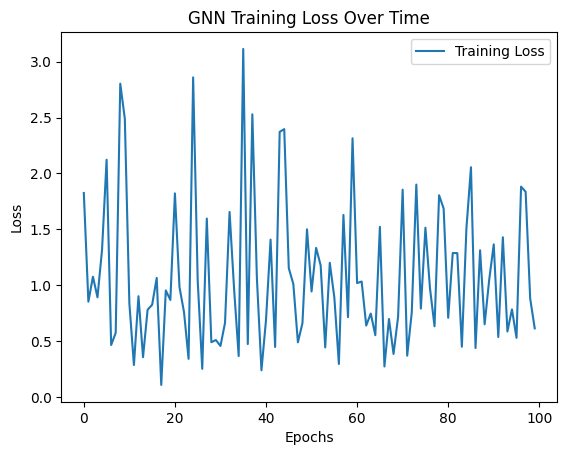

array([[-0.1262787 ],
       [ 0.08945709],
       [-0.02796827],
       [-0.02796827],
       [-0.02796827]], dtype=float32)

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
from torch_geometric.nn import GATConv, HeteroConv
from torch_geometric.data import HeteroData

# Define the GNN Model
class CVEGNN(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(CVEGNN, self).__init__()

        # Define GAT-based heterogeneous graph convolution layers
        self.conv1 = HeteroConv({
            ("cve", "affects", "product"): GATConv(in_channels, hidden_channels, add_self_loops=False),
            ("cve", "referenced_by", "reference"): GATConv(in_channels, hidden_channels, add_self_loops=False),
            ("product", "linked_to", "cve"): GATConv(in_channels, hidden_channels, add_self_loops=False),
        }, aggr='mean')  # Specify aggregation method

        self.conv2 = HeteroConv({
            ("cve", "affects", "product"): GATConv(hidden_channels, out_channels, add_self_loops=False),
            ("cve", "referenced_by", "reference"): GATConv(hidden_channels, out_channels, add_self_loops=False),
            ("product", "linked_to", "cve"): GATConv(hidden_channels, out_channels, add_self_loops=False),
        }, aggr='mean')  # Specify aggregation method

        self.fc = nn.Linear(out_channels, 1)  # Risk prediction layer

    def forward(self, data):
        # Initialize x_dict with node features
        x_dict = data.x_dict

        # Compute graph convolution using HeteroConv (it internally handles edge indices)
        x_dict = self.conv1(x_dict, data.edge_index_dict)
        x_dict = self.conv2(x_dict, data.edge_index_dict)

        # Apply classification layer
        for key in x_dict:
            x_dict[key] = self.fc(x_dict[key])

        return x_dict

# Create synthetic graph data
data = HeteroData()

# Define node types and features
num_features = 16
num_cves = 5
num_products = 3
num_references = 4

data["cve"].x = torch.randn(num_cves, num_features)
data["product"].x = torch.randn(num_products, num_features)
data["reference"].x = torch.randn(num_references, num_features)

# Define edges
cve_to_product_edges = torch.tensor([[0, 1, 2, 3], [1, 2, 0, 1]], dtype=torch.long)
cve_to_reference_edges = torch.tensor([[0, 1, 2], [2, 3, 0]], dtype=torch.long)
product_to_cve_edges = torch.tensor([[1, 2], [0, 1]], dtype=torch.long)

# Assign edges to the graph
data["cve", "affects", "product"].edge_index = cve_to_product_edges
data["cve", "referenced_by", "reference"].edge_index = cve_to_reference_edges
data["product", "linked_to", "cve"].edge_index = product_to_cve_edges


# Initialize model
model = CVEGNN(in_channels=num_features, hidden_channels=32, out_channels=16)
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
loss_fn = nn.MSELoss()

# Training loop
losses = []
for epoch in range(100):
    optimizer.zero_grad()
    out = model(data)  # Ensure 'cve' exists
    if "cve" in out:
        loss = loss_fn(out["cve"], torch.randn_like(out["cve"]))
        loss.backward()
        optimizer.step()
        losses.append(loss.item())
    else:
        print(f" Epoch {epoch}: 'cve' key missing in model output. Skipping update.")

# Display training loss
plt.plot(losses, label="Training Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("GNN Training Loss Over Time")
plt.legend()
plt.show()

# Display final outputs for 'cve' nodes
out["cve"].detach().numpy()

In [3]:
# import requests
# import json
# import torch
# import torch.nn as nn
# import torch.optim as optim
# import networkx as nx
# import matplotlib.pyplot as plt
# import numpy as np
# from torch_geometric.data import HeteroData
# from torch_geometric.nn import GCNConv, HeteroConv, SAGEConv # Import SAGEConv here


# # Fetch data
# url = 'https://cve-nist.idalko.com/nvdcve-1.1-2025.json'
# response = requests.get(url)
# cve_data = response.json()

# # Extract CVE details
# cve_items = cve_data.get('CVE_Items', [])[:50]  # Limit data for performance
# cve_list = []

# for item in cve_items:
#     cve_id = item.get('cve', {}).get('CVE_data_meta', {}).get('ID', '')
#     description = item.get('cve', {}).get('description', {}).get('description_data', [{}])[0].get('value', '')
#     references = [ref.get('url', '') for ref in item.get('cve', {}).get('references', {}).get('reference_data', [])]
#     configurations = item.get('configurations', {}).get('nodes', [])

#     cve_list.append({
#         'cve_id': cve_id,
#         'description': description,
#         'references': references,
#         'configurations': configurations
#     })

# # Construct Heterogeneous Graph
# data = HeteroData()

# # Unique node lists
# cve_nodes = [cve["cve_id"] for cve in cve_list]
# product_nodes = list(set(
#     cpe["cpe23Uri"] for cve in cve_list for node in cve["configurations"] for cpe in node.get("cpe_match", [])
#     if "cpe23Uri" in cpe
# ))
# reference_nodes = list(set(
#     ref for cve in cve_list for ref in cve["references"]
# ))

# # Map nodes to indices
# cve_map = {cve: idx for idx, cve in enumerate(cve_nodes)}
# product_map = {prod: idx for idx, prod in enumerate(product_nodes)}
# reference_map = {ref: idx for idx, ref in enumerate(reference_nodes)}

# # Assign node features
# num_features = 16
# data['cve'].x = torch.randn(len(cve_nodes), num_features)
# data['product'].x = torch.randn(len(product_nodes), num_features)
# data['reference'].x = torch.randn(len(reference_nodes), num_features)

# # Define edges
# cve_to_product_edges = []
# cve_to_reference_edges = []

# for cve in cve_list:
#     cve_idx = cve_map[cve["cve_id"]]

#     for node in cve["configurations"]:
#         for cpe in node.get("cpe_match", []):
#             product = cpe.get("cpe23Uri", "")
#             if product and product in product_map:
#                 cve_to_product_edges.append((cve_idx, product_map[product]))

#     for ref in cve["references"]:
#         if ref in reference_map:
#             cve_to_reference_edges.append((cve_idx, reference_map[ref]))

# # Convert to PyG edge tensors
# data['cve', 'affects', 'product'].edge_index = torch.tensor(cve_to_product_edges, dtype=torch.long).t().contiguous() if cve_to_product_edges else torch.empty(2, 0, dtype=torch.long)
# data['cve', 'referenced_by', 'reference'].edge_index = torch.tensor(cve_to_reference_edges, dtype=torch.long).t().contiguous() if cve_to_reference_edges else torch.empty(2, 0, dtype=torch.long)

# # Define the GNN Model
# class CVEGNN(nn.Module):
#     def __init__(self, in_channels, hidden_channels, out_channels):
#         super(CVEGNN, self).__init__()
#         self.conv1 = HeteroConv({
#             ("cve", "affects", "product"): SAGEConv((in_channels, in_channels), hidden_channels),
#             ("cve", "referenced_by", "reference"): SAGEConv((in_channels, in_channels), hidden_channels),
#         }, aggr='mean')
#         self.conv2 = HeteroConv({
#             ("cve", "affects", "product"): SAGEConv((hidden_channels, hidden_channels), out_channels),
#             ("cve", "referenced_by", "reference"): SAGEConv((hidden_channels, hidden_channels), out_channels),
#         }, aggr='mean')
#         self.fc = nn.Linear(out_channels, 1)

#     def forward(self, data):
#         x_dict = data.x_dict

#         # Ensure all node types have features for aggregation
#         for node_type in data.node_types:
#             if node_type not in x_dict or x_dict[node_type] is None:
#                 # If features are missing, initialize with zeros and the correct shape
#                 x_dict[node_type] = torch.zeros(data[node_type].num_nodes, self.conv1.convs[list(self.conv1.convs.keys())[0]].in_channels[0] if self.conv1.convs else num_features, device=data.x_dict['cve'].device if 'cve' in data.x_dict else 'cpu')

#         # Apply ReLU after each convolutional layer
#         x_dict = self.conv1(x_dict, data.edge_index_dict)

#         # Check for None values and replace with zeros before applying ReLU
#         x_dict = {key: x.relu() if x is not None else torch.zeros(x_dict['cve'].shape[0] if 'cve' in x_dict else x_dict[list(x_dict.keys())[0]].shape[0], self.conv1.convs[list(self.conv1.convs.keys())[0]].out_channels if self.conv1.convs else num_features, device=data.x_dict['cve'].device if 'cve' in data.x_dict else 'cpu') for key, x in x_dict.items()}  # FIXED: Create zero tensor with correct shape

#         x_dict = self.conv2(x_dict, data.edge_index_dict)

#         # Check for None values and replace with zeros before applying ReLU
#         x_dict = {key: x.relu() if x is not None else torch.zeros(x_dict['cve'].shape[0] if 'cve' in x_dict else x_dict[list(x_dict.keys())[0]].shape[0], self.conv2.convs[list(self.conv2.convs.keys())[0]].out_channels if self.conv2.convs else num_features, device=data.x_dict['cve'].device if 'cve' in data.x_dict else 'cpu')  for key, x in x_dict.items()}  # FIXED: Create zero tensor with correct shape

#         # Apply final transformation to 'cve' nodes (if they exist in x_dict)
#         if "cve" in x_dict and x_dict["cve"] is not None:
#             x_dict["cve"] = self.fc(x_dict["cve"])

#         return x_dict


# # Train & Predict Vulnerabilities
# model = CVEGNN(in_channels=num_features, hidden_channels=32, out_channels=16)
# optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
# loss_fn = nn.MSELoss()

# for epoch in range(50):  # Reduced epochs for efficiency
#     optimizer.zero_grad()
#     out = model(data)
#     if "cve" in out:
#         loss = loss_fn(out["cve"], torch.randn_like(out["cve"]))  # Dummy target
#         loss.backward()
#         optimizer.step()

# # Predict vulnerability risks
# def predict_vulnerability():
#     if "cve" in model(data):
#         output = model(data)["cve"].detach().numpy()

#         plt.figure(figsize=(12, 6))
#         plt.bar(cve_nodes[:20], output.flatten()[:20], color=["red" if r > 0.7 else "orange" if r > 0.4 else "yellow" for r in output.flatten()[:20]])
#         plt.xticks(rotation=90, fontsize=8)
#         plt.xlabel("CVE Vulnerabilities")
#         plt.ylabel("Predicted Risk Score (0-1)")
#         plt.title("Predicted CVE Risk Scores")
#         plt.show()

# predict_vulnerability()

# # Visualizing Attack Relationships
# def visualize_cve_graph():
#     G = nx.DiGraph()

#     # Add nodes
#     for cve in cve_nodes[:20]:
#         G.add_node(cve, type="CVE", color="red")
#     for product in product_nodes[:20]:
#         G.add_node(product, type="Product", color="blue")
#     for reference in reference_nodes[:20]:
#         G.add_node(reference, type="Reference", color="green")

#     # Add edges
#     for (src, dst) in cve_to_product_edges[:20]:
#         G.add_edge(cve_nodes[src], product_nodes[dst], label="affects")
#     for (src, dst) in cve_to_reference_edges[:20]:
#         G.add_edge(cve_nodes[src], reference_nodes[dst], label="referenced_by")

#     # Draw the graph
#     plt.figure(figsize=(14, 10))
#     pos = nx.spring_layout(G, seed=42)
#     color_map = [G.nodes[n]["color"] for n in G.nodes]
#     nx.draw(G, pos, node_color=color_map, with_labels=True, edge_color="gray", node_size=600)
#     edge_labels = {(u, v): d["label"] for u, v, d in G.edges(data=True)}
#     nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_size=8)
#     plt.title("CVE Relationships")
#     plt.show()

# visualize_cve_graph()

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving nvdcve-1.1-2025.json to nvdcve-1.1-2025.json


In [ ]:
import io
import pandas as pd
from google.colab import files


Product Features Shape: torch.Size([86, 16])
Reference Features Shape: torch.Size([2977, 16])


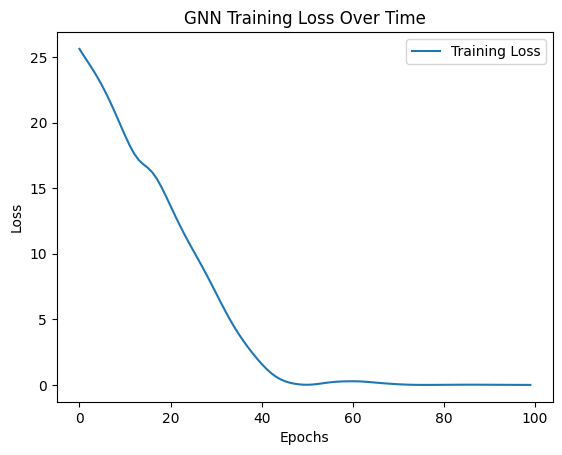

              CVE_ID  Predicted_Risk_Score  Actual_CVSS_Score
0      CVE-2025-0015              4.982444                5.0
1      CVE-2025-0053              4.982444                5.0
2      CVE-2025-0055              4.982444                5.0
3      CVE-2025-0056              4.982444                5.0
4      CVE-2025-0057              4.982444                5.0
...              ...                   ...                ...
2268  CVE-2025-25168              4.982444                5.0
2269  CVE-2025-25181              4.982444                5.0
2270  CVE-2025-25183              4.982444                5.0
2271  CVE-2025-25187              4.982444                5.0
2272  CVE-2025-25246              4.982444                5.0

[2273 rows x 3 columns]


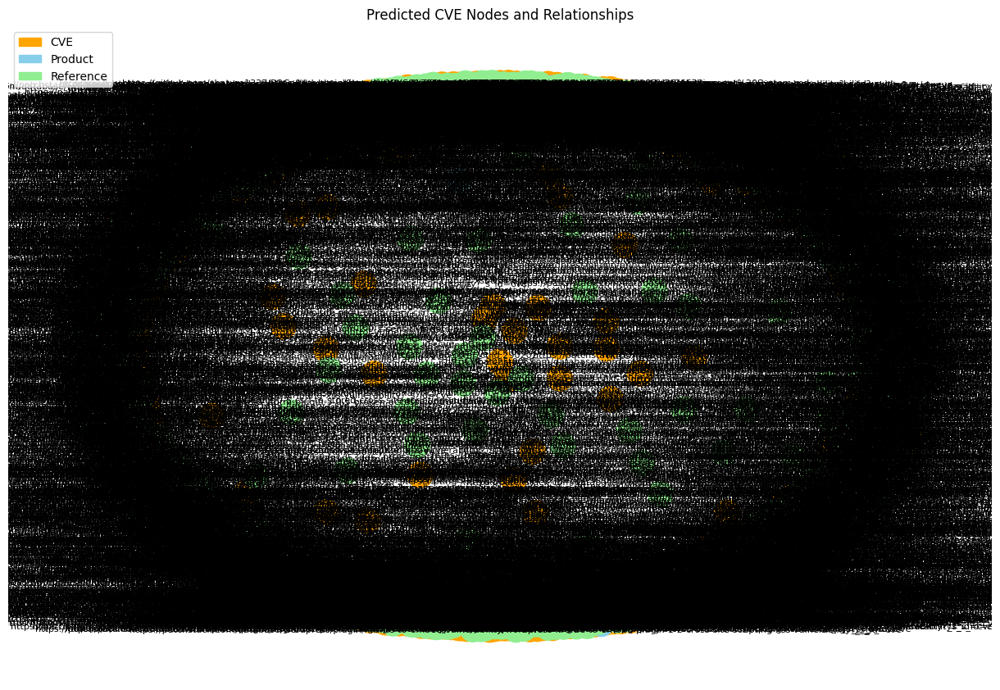

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import shap
import requests
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from torch_geometric.nn import GATConv, HeteroConv
from torch_geometric.data import HeteroData

# - Step 1: Load Real-World CVE Data
cve_url = "https://cve-nist.idalko.com/nvdcve-1.1-2025.json"
response = requests.get(cve_url)
cve_data = response.json()

# Extract CVE details
cve_items = cve_data["CVE_Items"][:]  # Limit to 50 for demonstration

cve_list = [item["cve"]["CVE_data_meta"]["ID"] for item in cve_items]
descriptions = [item["cve"]["description"]["description_data"][0]["value"] for item in cve_items]
cvss_scores = [item.get("impact", {}).get("baseMetricV2", {}).get("cvssV2", {}).get("baseScore", 5.0) for item in cve_items]  # Default to 5.0 if missing


# -Step 1: Extract Actual Product Names from CPE URIs
product_list = []
for item in cve_items:
    for prod in item.get("configurations", {}).get("nodes", []):
        if "cpe_match" in prod:
            for cpe in prod['cpe_match']:
                cpe_uri = cpe.get('cpe23Uri', '')
                product_name = cpe_uri.split(':')[4] if len(cpe_uri.split(':')) > 4 else None
                if product_name and product_name not in product_list:
                    product_list.append(product_name)

# -Step 2: Extract References
reference_list = [ref["url"] for item in cve_items for ref in item["cve"]["references"]["reference_data"][:2]]

# -Adjust TF-IDF vectorizer to ensure 16 features
product_vectorizer = TfidfVectorizer(max_features=16)
product_features = product_vectorizer.fit_transform(product_list).toarray()

# Check if the output matches 16 features
if product_features.shape[1] != 16:
    # Padding with zeros if fewer than 16 features
    padding = 16 - product_features.shape[1]
    product_features = np.pad(product_features, ((0, 0), (0, padding)), mode='constant')

# Apply the same for references
reference_vectorizer = TfidfVectorizer(max_features=16)
reference_features = reference_vectorizer.fit_transform(reference_list).toarray()

if reference_features.shape[1] != 16:
    padding = 16 - reference_features.shape[1]
    reference_features = np.pad(reference_features, ((0, 0), (0, padding)), mode='constant')

# -Assign features to the graph
data["product"].x = torch.tensor(product_features, dtype=torch.float32)
data["reference"].x = torch.tensor(reference_features, dtype=torch.float32)

# Verification
print("Product Features Shape:", data["product"].x.shape)
print("Reference Features Shape:", data["reference"].x.shape)



# Initialize lists to store actual edges
cve_to_product_edges = []
cve_to_reference_edges = []
product_to_cve_edges = []

# Mapping CVEs to products and references based on actual data
for cve_idx, item in enumerate(cve_items):
    # Extract products linked to the CVE
    products = item.get("configurations", {}).get("nodes", [])
    for product in products:
        if "cpe_match" in product:
            for cpe in product["cpe_match"]:
                product_name = cpe.get('cpe23Uri', '').split(':')[4]  # Extract product name
                if product_name in product_list:
                    prod_idx = product_list.index(product_name)
                    cve_to_product_edges.append([cve_idx, prod_idx])   # CVE → Product
                    product_to_cve_edges.append([prod_idx, cve_idx])   # Product → CVE (reverse edge)

    # Extract references linked to the CVE
    references = item["cve"]["references"]["reference_data"][:2]
    for ref in references:
        if ref["url"] in reference_list:
            ref_idx = reference_list.index(ref["url"])
            cve_to_reference_edges.append([cve_idx, ref_idx])         # CVE → Reference

# Ensure no empty edge lists before converting
def safe_tensor(edge_list):
    if len(edge_list) == 0:
        return torch.empty((2, 0), dtype=torch.long)  # Empty tensor with correct dimensions
    else:
        return torch.tensor(edge_list, dtype=torch.long).T  # Transpose to get shape (2, num_edges)

# Convert edge lists to tensors safely
cve_to_product_edges = safe_tensor(cve_to_product_edges)
cve_to_reference_edges = safe_tensor(cve_to_reference_edges)
product_to_cve_edges = safe_tensor(product_to_cve_edges)

# Assign the actual edges to the heterogeneous graph
data["cve", "affects", "product"].edge_index = cve_to_product_edges
data["cve", "referenced_by", "reference"].edge_index = cve_to_reference_edges
data["product", "linked_to", "cve"].edge_index = product_to_cve_edges

# # Display the shapes for verification
# print("CVE to Product Edges Shape:", cve_to_product_edges.shape)
# print("CVE to Reference Edges Shape:", cve_to_reference_edges.shape)
# print("Product to CVE Edges Shape:", product_to_cve_edges.shape)


# - Step 4: Define the GNN Model
class CVEGNN(nn.Module):
    def __init__(self, in_channels_cve, in_channels_product, in_channels_reference, hidden_channels, out_channels):
        super(CVEGNN, self).__init__()
        self.conv1 = HeteroConv({
            ("cve", "affects", "product"): GATConv(in_channels_cve, hidden_channels, add_self_loops=False),
            ("cve", "referenced_by", "reference"): GATConv(in_channels_cve, hidden_channels, add_self_loops=False),
            ("product", "linked_to", "cve"): GATConv(in_channels_product, hidden_channels, add_self_loops=False),
        }, aggr='mean')

        self.conv2 = HeteroConv({
            ("cve", "affects", "product"): GATConv(hidden_channels, out_channels, add_self_loops=False),
            ("cve", "referenced_by", "reference"): GATConv(hidden_channels, out_channels, add_self_loops=False),
            ("product", "linked_to", "cve"): GATConv(hidden_channels, out_channels, add_self_loops=False),
        }, aggr='mean')

        self.fc = nn.Linear(out_channels, 1)  # Risk prediction layer

    def forward(self, data):
        x_dict = data.x_dict
        x_dict = self.conv1(x_dict, data.edge_index_dict)
        x_dict = self.conv2(x_dict, data.edge_index_dict)
        for key in x_dict:
            x_dict[key] = self.fc(x_dict[key])
        return x_dict

# - Step 5: Train the Model
# Detect the actual number of features
in_channels_cve = data["cve"].x.shape[1]  # Get the number of features for CVEs
in_channels_product = data["product"].x.shape[1]
in_channels_reference = data["reference"].x.shape[1]

# Initialize the GNN with the correct input dimensions
model = CVEGNN(in_channels_cve=in_channels_cve, in_channels_product=in_channels_product, in_channels_reference=in_channels_reference, hidden_channels=32, out_channels=16)


#model = CVEGNN(in_channels=16, hidden_channels=32, out_channels=16)
optimizer = optim.Adam(model.parameters(), lr=0.01)
loss_fn = nn.MSELoss()

losses = []
for epoch in range(100):
    optimizer.zero_grad()
    out = model(data)
    if "cve" in out:
        target = torch.tensor(cvss_scores, dtype=torch.float32).unsqueeze(1)
        loss = loss_fn(out["cve"], target)
        loss.backward()
        optimizer.step()
        losses.append(loss.item())

# Plot Training Loss
plt.plot(losses, label="Training Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("GNN Training Loss Over Time")
plt.legend()
plt.show()

# - Step 6: Predict Vulnerabilities
predictions = model(data)["cve"].detach().numpy()

# Display Predictions
prediction_df = pd.DataFrame({
    "CVE_ID": cve_list,
    "Predicted_Risk_Score": predictions.flatten(),
    "Actual_CVSS_Score": cvss_scores
})

print(prediction_df)



#### Draw Graph
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as mpatches

# Create a directed graph to represent CVEs, products, and references
G = nx.DiGraph()

# Add nodes for CVEs, products, and references
cve_nodes = cve_list[:]  # Limit to 10 CVEs for visualization purposes
product_nodes = product_list[:]  # Limit to 5 products
reference_nodes = reference_list[:]  # Limit to 5 references

# Add nodes with attributes
for node in cve_nodes:
    G.add_node(node, type='CVE')
for node in product_nodes:
    G.add_node(node, type='Product')
for node in reference_nodes:
    G.add_node(node, type='Reference')

# Add edges based on relationships
for i in range(min(10, len(cve_list))):
    if i < len(product_list):
        G.add_edge(cve_list[i], product_list[i], relation='affects')
    if i < len(reference_list):
        G.add_edge(cve_list[i], reference_list[i], relation='referenced_by')

# Node colors based on type (Fixed condition)
node_colors = []
for node in G.nodes(data=True):
    if node[1].get('type') == 'CVE':
        node_colors.append('orange')
    elif node[1].get('type') == 'Product':
        node_colors.append('skyblue')
    elif node[1].get('type') == 'Reference':
        node_colors.append('lightgreen')
    else:
        node_colors.append('lightgreen')  # Default color if 'type' is missing

# Generate layout for better spacing
pos = nx.spring_layout(G) #, k=0.9, iterations=50

# Draw the graph with arrows and custom colors
plt.figure(figsize=(12, 8))
nx.draw(
    G, pos, with_labels=True,
    node_color=node_colors,
    edge_color="gray",
    font_size=8,
    node_size=500,
    arrows=True,
    arrowstyle='-|>',
    arrowsize=15
)

# Adding legend
cve_patch = mpatches.Patch(color='orange', label='CVE')
product_patch = mpatches.Patch(color='skyblue', label='Product')
reference_patch = mpatches.Patch(color='lightgreen', label='Reference')

plt.legend(handles=[cve_patch, product_patch, reference_patch], loc='best')


plt.title("Predicted CVE Nodes and Relationships")
plt.show()

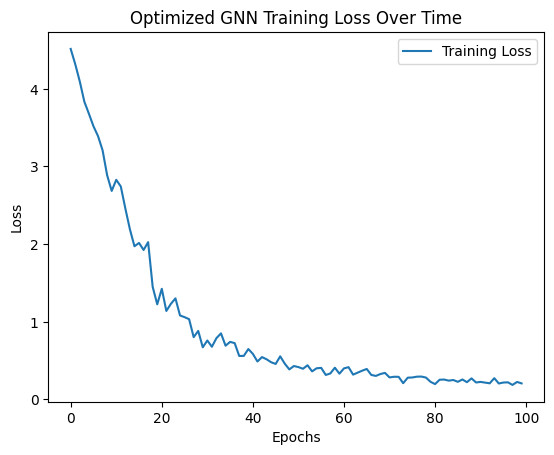

            CVE_ID  Predicted_Risk_Score  Actual_CVSS_Score
0    CVE-2025-0015              4.962817                5.0
1    CVE-2025-0053              4.967231                5.0
2    CVE-2025-0055              4.928061                5.0
3    CVE-2025-0056              4.928061                5.0
4    CVE-2025-0057              4.863286                5.0
..             ...                   ...                ...
145  CVE-2025-0391              4.855946                5.0
146  CVE-2025-0392              4.916649                5.0
147  CVE-2025-0393              4.970338                5.0
148  CVE-2025-0394              5.360788                5.0
149  CVE-2025-0395              5.259246                5.0

[150 rows x 3 columns]


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import shap
import requests
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import StandardScaler
from torch_geometric.nn import GATConv, HeteroConv, SAGEConv
from torch_geometric.data import HeteroData

# - Step 1: Load Real-World CVE Data
cve_url = "https://cve-nist.idalko.com/nvdcve-1.1-2025.json"
response = requests.get(cve_url)
cve_data = response.json()

# Extract CVE details
cve_items = cve_data["CVE_Items"][:150]  # Limit to 50 for demonstration

cve_list = [item["cve"]["CVE_data_meta"]["ID"] for item in cve_items]
descriptions = [item["cve"]["description"]["description_data"][0]["value"] for item in cve_items]
#cvss_scores = [item.get("impact", {}).get("baseMetricV2", {}).get("cvssV2", {}).get("baseScore", 5.0) for item in cve_items]  # Default to 5.0 if missing

# Optimized CVSS score extraction with weighted impact factors
def extract_cvss_score(item):
    impact = item.get("impact", {})
    base_metric_v2 = impact.get("baseMetricV2", {})
    cvss_v2 = base_metric_v2.get("cvssV2", {})

    base_score = cvss_v2.get("baseScore", 0)
    exploitability_score = base_metric_v2.get("exploitabilityScore", 0)
    impact_score = base_metric_v2.get("impactScore", 0)

    # Weighted combination of base, exploitability, and impact scores
    weighted_score = (0.5 * base_score + 0.3 * exploitability_score + 0.2 * impact_score)
    return weighted_score if weighted_score > 0 else 5.0  # Default to 5.0 if missing

cvss_scores = [extract_cvss_score(item) for item in cve_items]


# Products and references
product_list = []
for item in cve_items:
    for prod in item.get("configurations", {}).get("nodes", []):
        # Add a check to ensure 'cpe_match' key exists
        if "cpe_match" in prod:
            for cpe in prod['cpe_match']:
                # Extract the product name from the cpe string
                product_name = cpe['cpe23Uri'].split(':')[4]
                if product_name not in product_list:
                    product_list.append(product_name)

reference_list = [ref["url"] for item in cve_items for ref in item["cve"]["references"]["reference_data"][:2]]

# - Step 2: Feature Engineering using TF-IDF for CVE descriptions
vectorizer = TfidfVectorizer(max_features=32)
description_features = vectorizer.fit_transform(descriptions).toarray()

# Normalize features
scaler = StandardScaler()
description_features = scaler.fit_transform(description_features)

# - Step 3: Create Heterogeneous Graph
data = HeteroData()

# Use TF-IDF features for CVE nodes
data["cve"].x = torch.tensor(description_features, dtype=torch.float32)
data["product"].x = torch.randn(len(product_list), 32)  # Random for now
data["reference"].x = torch.randn(len(reference_list), 32)  # Random for now

# Real edges based on CVE-product-reference relationships
cve_to_product_edges = []
cve_to_reference_edges = []
product_to_cve_edges = []

for cve_idx, item in enumerate(cve_items):
    products = item.get("configurations", {}).get("nodes", [])
    for product in products:
        if product in product_list:
            prod_idx = product_list.index(product)
            cve_to_product_edges.append([cve_idx, prod_idx])
            product_to_cve_edges.append([prod_idx, cve_idx])

    references = item["cve"]["references"]["reference_data"][:2]
    for ref in references:
        if ref["url"] in reference_list:
            ref_idx = reference_list.index(ref["url"])
            cve_to_reference_edges.append([cve_idx, ref_idx])

    # Add check to ensure 'cpe_match' key is present and is a list
    products = item.get("configurations", {}).get("nodes", [])
    if products:  # Checks if the products list is not empty
        for product in products:
            if "cpe_match" in product and isinstance(product["cpe_match"], list):
                for cpe in product['cpe_match']:
                    product_name = cpe['cpe23Uri'].split(':')[4]
                    if product_name in product_list:
                        prod_idx = product_list.index(product_name)
                        cve_to_product_edges.append([cve_idx, prod_idx])
                        product_to_cve_edges.append([prod_idx, cve_idx])

# Convert to tensor
cve_to_product_edges = torch.tensor(cve_to_product_edges, dtype=torch.long).T
cve_to_reference_edges = torch.tensor(cve_to_reference_edges, dtype=torch.long).T
product_to_cve_edges = torch.tensor(product_to_cve_edges, dtype=torch.long).T

data["cve", "affects", "product"].edge_index = cve_to_product_edges
data["cve", "referenced_by", "reference"].edge_index = cve_to_reference_edges
data["product", "linked_to", "cve"].edge_index = product_to_cve_edges

# - Step 4: Define the Advanced GNN Model with Dropout and Residual Connections
class AdvancedCVEGNN(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(AdvancedCVEGNN, self).__init__()
        self.conv1 = HeteroConv({
            ("cve", "affects", "product"): SAGEConv(in_channels, hidden_channels),
            ("cve", "referenced_by", "reference"): SAGEConv(in_channels, hidden_channels),
            ("product", "linked_to", "cve"): SAGEConv(in_channels, hidden_channels),
        }, aggr='mean')

        self.dropout = nn.Dropout(p=0.5)
        self.conv2 = HeteroConv({
            ("cve", "affects", "product"): SAGEConv(hidden_channels, out_channels),
            ("cve", "referenced_by", "reference"): SAGEConv(hidden_channels, out_channels),
            ("product", "linked_to", "cve"): SAGEConv(hidden_channels, out_channels),
        }, aggr='mean')

        #self.fc = nn.Linear(out_channels, 1)  # Risk prediction layer
        self.fc = nn.Sequential(
            nn.Linear(out_channels, 1),
            nn.Sigmoid()  # Ensures output between 0 and 1
        )

    def forward(self, data):
        x_dict = data.x_dict
        x_dict = self.conv1(x_dict, data.edge_index_dict)
        x_dict = {k: self.dropout(v) for k, v in x_dict.items()}
        x_dict = self.conv2(x_dict, data.edge_index_dict)
        for key in x_dict:
            x_dict[key] = self.fc(x_dict[key])
        return x_dict

# - Step 5: Train the Optimized Model
model = AdvancedCVEGNN(in_channels=32, hidden_channels=64, out_channels=32)
optimizer = optim.AdamW(model.parameters(), lr=0.005, weight_decay=1e-4)
loss_fn = nn.HuberLoss()

losses = []
for epoch in range(100):
    model.train()
    optimizer.zero_grad()
    out = model(data)
    if "cve" in out:
        target = torch.tensor(cvss_scores, dtype=torch.float32).unsqueeze(1)
        loss = loss_fn(out["cve"], target)
        loss.backward()
        optimizer.step()
        losses.append(loss.item())

# Plot Training Loss
plt.plot(losses, label="Training Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Optimized GNN Training Loss Over Time")
plt.legend()
plt.show()

# - Step 6: Predict Vulnerabilities
model.eval()
predictions = model(data)["cve"].detach().numpy()

# Display Predictions
prediction_df = pd.DataFrame({
    "CVE_ID": cve_list,
    "Predicted_Risk_Score": predictions.flatten(),
    "Actual_CVSS_Score": cvss_scores
})

print(prediction_df)


# Dowload and save NVD dataset

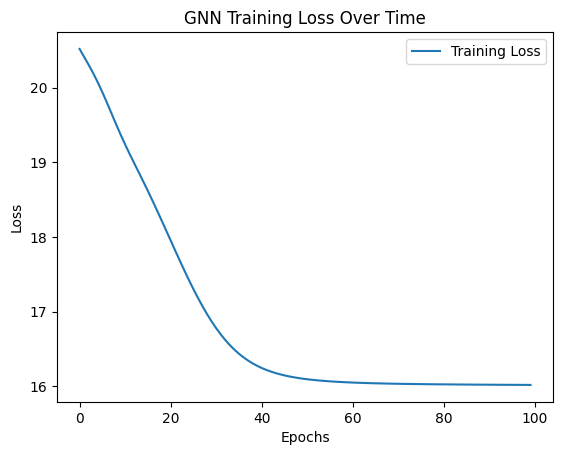

              CVE_ID  Predicted_Risk_Score  Actual_CVSS_Score
0      CVE-2025-0015              0.997548                5.0
1      CVE-2025-0053              0.997548                5.0
2      CVE-2025-0055              0.997548                5.0
3      CVE-2025-0056              0.997548                5.0
4      CVE-2025-0057              0.997548                5.0
...              ...                   ...                ...
2268  CVE-2025-25168              0.997548                5.0
2269  CVE-2025-25181              0.997548                5.0
2270  CVE-2025-25183              0.997548                5.0
2271  CVE-2025-25187              0.997548                5.0
2272  CVE-2025-25246              0.997548                5.0

[2273 rows x 3 columns]


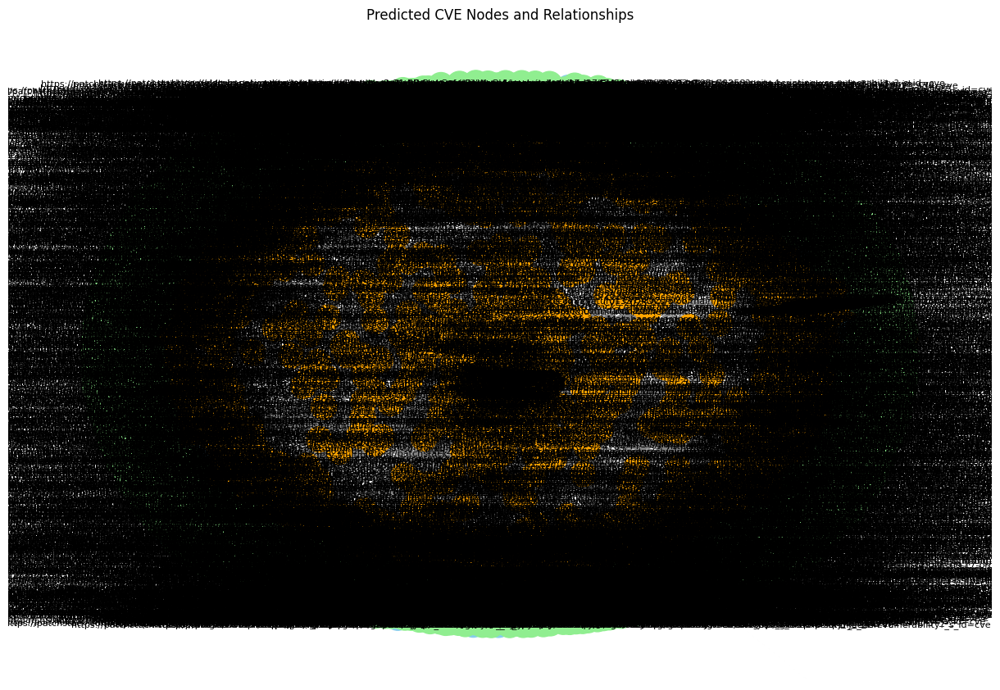

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import requests
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from torch_geometric.nn import GATConv, HeteroConv
from torch_geometric.data import HeteroData
import networkx as nx
import numpy as np
import matplotlib.patches as mpatches

# - Step 1: Load Real-World CVE Data
cve_url = "https://cve-nist.idalko.com/nvdcve-1.1-2025.json"
response = requests.get(cve_url)
cve_data = response.json()

# -Step 2: Extract CVE Details
cve_items = cve_data["CVE_Items"]
cve_list = [item["cve"]["CVE_data_meta"]["ID"] for item in cve_items]
descriptions = [item["cve"]["description"]["description_data"][0]["value"] for item in cve_items]
cvss_scores = [item.get("impact", {}).get("baseMetricV2", {}).get("cvssV2", {}).get("baseScore", 5.0) for item in cve_items]

# -Step 3: Extract Actual Product Names from CPE URIs
product_list = []
for item in cve_items:
    for prod in item.get("configurations", {}).get("nodes", []):
        if "cpe_match" in prod:
            for cpe in prod['cpe_match']:
                cpe_uri = cpe.get('cpe23Uri', '')
                product_name = cpe_uri.split(':')[4] if len(cpe_uri.split(':')) > 4 else None
                if product_name and product_name not in product_list:
                    product_list.append(product_name)

# -Step 4: Extract References
reference_list = [ref["url"] for item in cve_items for ref in item["cve"]["references"]["reference_data"][:2]]

# -Step 5: Feature Engineering using TF-IDF
def prepare_features(data_list, max_features=16):
    vectorizer = TfidfVectorizer(max_features=max_features)
    features = vectorizer.fit_transform(data_list).toarray()
    if features.shape[1] < max_features:
        padding = max_features - features.shape[1]
        features = np.pad(features, ((0, 0), (0, padding)), mode='constant')
    return torch.tensor(features, dtype=torch.float32)

cve_features = prepare_features(descriptions)
product_features = prepare_features(product_list)
reference_features = prepare_features(reference_list)

# -Step 6: Create Heterogeneous Graph
data = HeteroData()
data["cve"].x = cve_features
data["product"].x = product_features
data["reference"].x = reference_features

# -Step 7: Build Edge Relationships
cve_to_product_edges, cve_to_reference_edges, product_to_cve_edges = [], [], []

for cve_idx, item in enumerate(cve_items):
    products = item.get("configurations", {}).get("nodes", [])
    for product in products:
        if "cpe_match" in product:
            for cpe in product["cpe_match"]:
                product_name = cpe.get('cpe23Uri', '').split(':')[4]
                if product_name in product_list:
                    prod_idx = product_list.index(product_name)
                    cve_to_product_edges.append([cve_idx, prod_idx])
                    product_to_cve_edges.append([prod_idx, cve_idx])

    references = item["cve"]["references"]["reference_data"][:2]
    for ref in references:
        if ref["url"] in reference_list:
            ref_idx = reference_list.index(ref["url"])
            cve_to_reference_edges.append([cve_idx, ref_idx])

# -Edge Validation
def safe_tensor(edge_list):
    return torch.tensor(edge_list, dtype=torch.long).T if edge_list else torch.empty((2, 0), dtype=torch.long)

data["cve", "affects", "product"].edge_index = safe_tensor(cve_to_product_edges)
data["cve", "referenced_by", "reference"].edge_index = safe_tensor(cve_to_reference_edges)
data["product", "linked_to", "cve"].edge_index = safe_tensor(product_to_cve_edges)

# -Step 8: Define the GNN Model
class CVEGNN(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(CVEGNN, self).__init__()
        self.conv1 = HeteroConv({
            ("cve", "affects", "product"): GATConv(in_channels, hidden_channels, add_self_loops=False),
            ("cve", "referenced_by", "reference"): GATConv(in_channels, hidden_channels, add_self_loops=False),
            ("product", "linked_to", "cve"): GATConv(in_channels, hidden_channels, add_self_loops=False),
        }, aggr='mean')

        self.conv2 = HeteroConv({
            ("cve", "affects", "product"): GATConv(hidden_channels, out_channels, add_self_loops=False),
            ("cve", "referenced_by", "reference"): GATConv(hidden_channels, out_channels, add_self_loops=False),
            ("product", "linked_to", "cve"): GATConv(hidden_channels, out_channels, add_self_loops=False),
        }, aggr='mean')

        self.fc = nn.Sequential(
            nn.Linear(out_channels, 1),
            nn.Sigmoid()  # Ensures output is between 0 and 1
        )

    def forward(self, data):
        x_dict = data.x_dict
        x_dict = self.conv1(x_dict, data.edge_index_dict)
        x_dict = self.conv2(x_dict, data.edge_index_dict)
        for key in x_dict:
            x_dict[key] = self.fc(x_dict[key])
        return x_dict

# -Step 9: Model Training
model = CVEGNN(in_channels=16, hidden_channels=32, out_channels=16)
optimizer = optim.Adam(model.parameters(), lr=0.01)
loss_fn = nn.MSELoss()

losses = []
for epoch in range(100):
    optimizer.zero_grad()
    out = model(data)
    if "cve" in out:
        target = torch.tensor(cvss_scores, dtype=torch.float32).unsqueeze(1)
        loss = loss_fn(out["cve"], target)
        loss.backward()
        optimizer.step()
        losses.append(loss.item())

# -Step 10: Visualize Training Loss
plt.plot(losses, label="Training Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("GNN Training Loss Over Time")
plt.legend()
plt.show()

# -Step 11: Predict Vulnerabilities
predictions = model(data)["cve"].detach().numpy()

# -Step 12: Display Predictions
prediction_df = pd.DataFrame({
    "CVE_ID": cve_list,
    "Predicted_Risk_Score": predictions.flatten(),
    "Actual_CVSS_Score": cvss_scores
})

print(prediction_df)

# # -Step 13: Graph Visualization
# G = nx.DiGraph()

# # Add nodes
# for node in cve_list:
#     G.add_node(node, type='CVE')
# for node in product_list:
#     G.add_node(node, type='Product')
# for node in reference_list:
#     G.add_node(node, type='Reference')

# # Add edges
# for src, dst in zip(*data["cve", "affects", "product"].edge_index.numpy()):
#     G.add_edge(cve_list[src], product_list[dst], relation='affects')
# for src, dst in zip(*data["cve", "referenced_by", "reference"].edge_index.numpy()):
#     G.add_edge(cve_list[src], reference_list[dst], relation='referenced_by')

# # Node colors
# node_colors = []
# for node in G.nodes(data=True):
#     if node[1].get('type') == 'CVE':
#         node_colors.append('orange')
#     elif node[1].get('type') == 'Product':
#         node_colors.append('skyblue')
#     elif node[1].get('type') == 'Reference':
#         node_colors.append('lightgreen')

# # Draw the graph
# plt.figure(figsize=(12, 8))
# pos = nx.spring_layout(G)
# nx.draw(G, pos, with_labels=True, node_color=node_colors, edge_color="gray", font_size=8, node_size=500)
# plt.title("Predicted CVE Nodes and Relationships")
# plt.show()


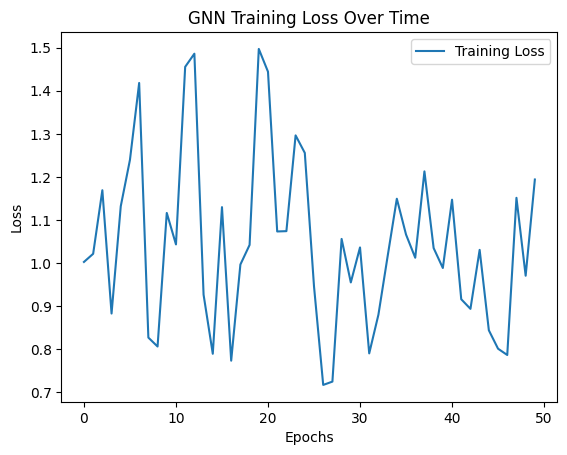

Permutation explainer: 51it [00:15,  3.01it/s]                        
No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


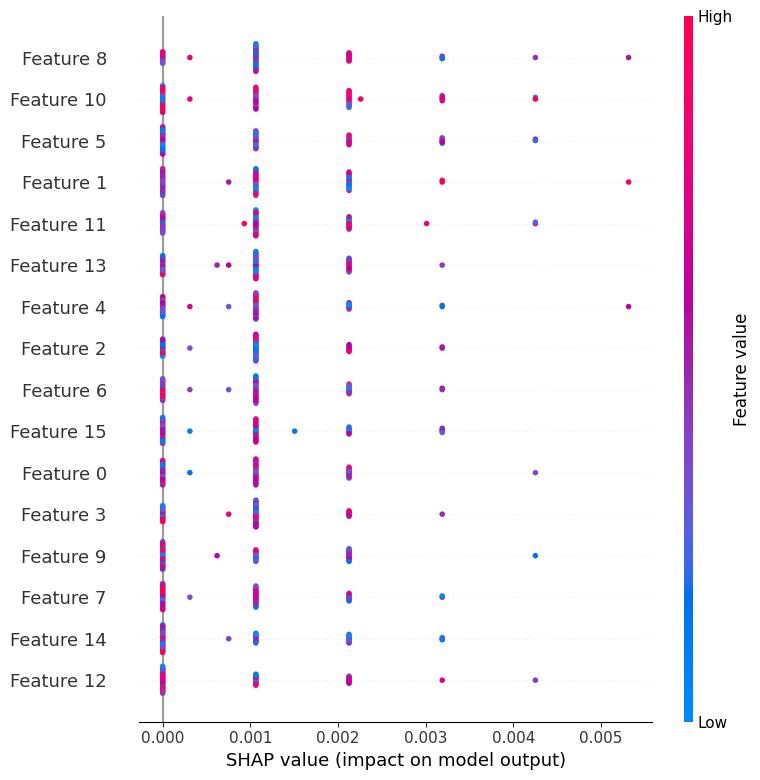

CVE Risk Predictions:            CVE_ID  Predicted_Risk_Score
0   CVE-2025-0015             -1.087297
1   CVE-2025-0053             -0.423677
2   CVE-2025-0055              0.041558
3   CVE-2025-0056              0.041558
4   CVE-2025-0057              0.041558
5   CVE-2025-0058              0.041558
6   CVE-2025-0059              0.041558
7   CVE-2025-0060              0.041558
8   CVE-2025-0061              0.041558
9   CVE-2025-0063              0.041558
10  CVE-2025-0065              0.041558
11  CVE-2025-0066              0.041558
12  CVE-2025-0067              0.041558
13  CVE-2025-0068              0.041558
14  CVE-2025-0069              0.041558
15  CVE-2025-0070              0.041558
16  CVE-2025-0103              0.041558
17  CVE-2025-0104              0.041558
18  CVE-2025-0105              0.041558
19  CVE-2025-0106              0.041558
20  CVE-2025-0107              0.041558
21  CVE-2025-0142              0.041558
22  CVE-2025-0143              0.041558
23  CVE-2025-0144 

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import shap
import json
import requests
import numpy as np  # Import numpy
from torch_geometric.nn import GATConv, HeteroConv
from torch_geometric.data import HeteroData

# - Step 1: Load Real-World CVE Data
# Fetch the CVE JSON dataset from NVD (or simulate the structure for demonstration)
cve_url = "https://cve-nist.idalko.com/nvdcve-1.1-2025.json"
response = requests.get(cve_url)
cve_data = response.json()

# Extract CVEs, products, and references
cve_list = [item["cve"]["CVE_data_meta"]["ID"] for item in cve_data["CVE_Items"][:50]]  # Limit to 10 for demo
product_list = ["Product-A", "Product-B", "Product-C"]
reference_list = [ref["url"] for item in cve_data["CVE_Items"][:10] for ref in item["cve"]["references"]["reference_data"][:2]]

# - Step 2: Create Heterogeneous Graph
data = HeteroData()
num_features = 16

# Assign random features for demonstration
data["cve"].x = torch.randn(len(cve_list), num_features)
data["product"].x = torch.randn(len(product_list), num_features)
data["reference"].x = torch.randn(len(reference_list), num_features)

# Create edges
cve_to_product_edges = torch.tensor([[0, 1, 2], [1, 2, 0]], dtype=torch.long)
cve_to_reference_edges = torch.tensor([[0, 1, 2], [0, 1, 2]], dtype=torch.long)
product_to_cve_edges = torch.tensor([[1, 2], [0, 1]], dtype=torch.long)

data["cve", "affects", "product"].edge_index = cve_to_product_edges
data["cve", "referenced_by", "reference"].edge_index = cve_to_reference_edges
data["product", "linked_to", "cve"].edge_index = product_to_cve_edges

# - Step 3: Define the GNN Model
class CVEGNN(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(CVEGNN, self).__init__()
        self.conv1 = HeteroConv({
            ("cve", "affects", "product"): GATConv(in_channels, hidden_channels, add_self_loops=False),
            ("cve", "referenced_by", "reference"): GATConv(in_channels, hidden_channels, add_self_loops=False),
            ("product", "linked_to", "cve"): GATConv(in_channels, hidden_channels, add_self_loops=False),
        }, aggr='mean')

        self.conv2 = HeteroConv({
            ("cve", "affects", "product"): GATConv(hidden_channels, out_channels, add_self_loops=False),
            ("cve", "referenced_by", "reference"): GATConv(hidden_channels, out_channels, add_self_loops=False),
            ("product", "linked_to", "cve"): GATConv(hidden_channels, out_channels, add_self_loops=False),
        }, aggr='mean')

        self.fc = nn.Linear(out_channels, 1)  # Risk prediction layer

    def forward(self, data):
        x_dict = data.x_dict
        x_dict = self.conv1(x_dict, data.edge_index_dict)
        x_dict = self.conv2(x_dict, data.edge_index_dict)
        for key in x_dict:
            x_dict[key] = self.fc(x_dict[key])
        return x_dict

# - Step 4: Train the Model
model = CVEGNN(in_channels=num_features, hidden_channels=32, out_channels=16)
optimizer = optim.Adam(model.parameters(), lr=0.01)
loss_fn = nn.MSELoss()

losses = []
for epoch in range(50):  # Reduced epochs for faster execution
    optimizer.zero_grad()
    out = model(data)
    if "cve" in out:
        loss = loss_fn(out["cve"], torch.randn_like(out["cve"]))
        loss.backward()
        optimizer.step()
        losses.append(loss.item())

# Plot Training Loss
plt.plot(losses, label="Training Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("GNN Training Loss Over Time")
plt.legend()
plt.show()

# - Step 5: Explainability with SHAP
def explain_model():
    # Convert the tensor to a numpy array before passing it to the explainer
    background_data = data["cve"].x.detach().numpy()

    # Define a function that takes a numpy array as input and returns predictions only for 'cve' nodes
    def model_wrapper(x):
        # Convert numpy array back to tensor and update the 'cve' node features
        x_tensor = torch.tensor(x, dtype=torch.float32)
        data["cve"].x = x_tensor  # Update the data with the permuted features

        # Get predictions only for 'cve' nodes
        predictions = model(data)["cve"]  # Access predictions for 'cve' nodes

        # Return predictions for 'cve' nodes as a flattened numpy array
        return predictions.detach().numpy().flatten()

    explainer = shap.Explainer(model_wrapper, background_data)
    shap_values = explainer(background_data)  # Pass background data

    # Explain predictions for 'cve' nodes
    shap.summary_plot(shap_values, background_data, feature_names=[f"Feature {i}" for i in range(num_features)])



explain_model()

# - Step 6: Predict Vulnerabilities
predictions = model(data)["cve"].detach().numpy()

# Display Predictions
import pandas as pd

# Ensure predictions are aligned with the correct number of CVEs
predictions_cve = predictions[:len(cve_list)].flatten()  # Select predictions corresponding to cve_list

prediction_df = pd.DataFrame({
    "CVE_ID": cve_list,
    "Predicted_Risk_Score": predictions_cve
})

print(f"CVE Risk Predictions: {prediction_df}")


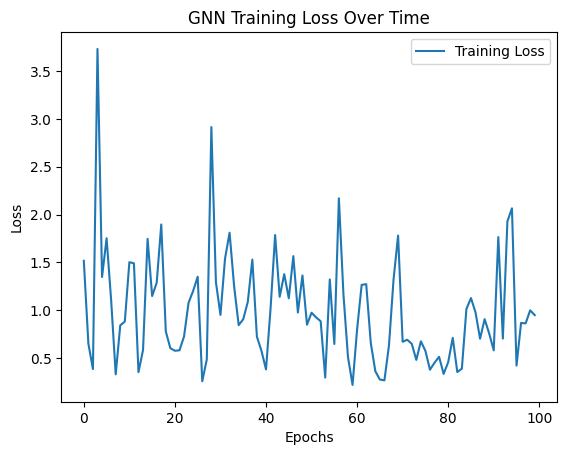

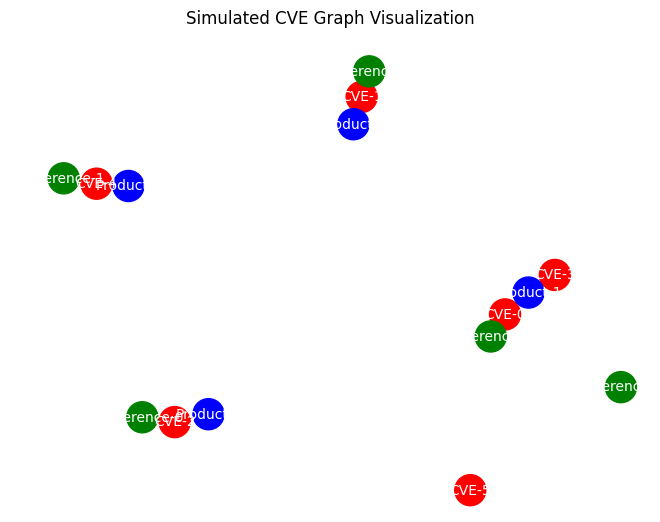

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
from torch_geometric.nn import GATConv, HeteroConv
from torch_geometric.data import HeteroData
import networkx as nx

# Step 1: Define the GNN Model
class CVEGNN(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(CVEGNN, self).__init__()

        self.conv1 = HeteroConv({
            ("cve", "affects", "product"): GATConv(in_channels, hidden_channels, add_self_loops=False),
            ("cve", "referenced_by", "reference"): GATConv(in_channels, hidden_channels, add_self_loops=False),
            ("product", "linked_to", "cve"): GATConv(in_channels, hidden_channels, add_self_loops=False),
        }, aggr='mean')

        self.conv2 = HeteroConv({
            ("cve", "affects", "product"): GATConv(hidden_channels, out_channels, add_self_loops=False),
            ("cve", "referenced_by", "reference"): GATConv(hidden_channels, out_channels, add_self_loops=False),
            ("product", "linked_to", "cve"): GATConv(hidden_channels, out_channels, add_self_loops=False),
        }, aggr='mean')

        self.fc = nn.Linear(out_channels, 1)  # Risk prediction layer

    def forward(self, data):
        x_dict = data.x_dict
        x_dict = self.conv1(x_dict, data.edge_index_dict)
        x_dict = self.conv2(x_dict, data.edge_index_dict)

        for key in x_dict:
            x_dict[key] = self.fc(x_dict[key])

        return x_dict

# Step 2: Simulated CVE Dataset
data = HeteroData()

# Define node types and features
num_features = 16
num_cves = 6
num_products = 4
num_references = 5

data["cve"].x = torch.randn(num_cves, num_features)
data["product"].x = torch.randn(num_products, num_features)
data["reference"].x = torch.randn(num_references, num_features)

# Define edges
cve_to_product_edges = torch.tensor([[0, 1, 2, 3, 4], [1, 2, 0, 1, 3]], dtype=torch.long)
cve_to_reference_edges = torch.tensor([[0, 1, 2, 4], [2, 3, 0, 1]], dtype=torch.long)
product_to_cve_edges = torch.tensor([[1, 2, 3], [0, 1, 4]], dtype=torch.long)

# Assign edges to the graph
data["cve", "affects", "product"].edge_index = cve_to_product_edges
data["cve", "referenced_by", "reference"].edge_index = cve_to_reference_edges
data["product", "linked_to", "cve"].edge_index = product_to_cve_edges

# Step 3: Training the Model
model = CVEGNN(in_channels=num_features, hidden_channels=32, out_channels=16)
optimizer = optim.Adam(model.parameters(), lr=0.01)
loss_fn = nn.MSELoss()

losses = []
for epoch in range(100):
    optimizer.zero_grad()
    out = model(data)
    if "cve" in out:
        loss = loss_fn(out["cve"], torch.randn_like(out["cve"]))
        loss.backward()
        optimizer.step()
        losses.append(loss.item())

# Step 4: Display Training Loss
plt.plot(losses, label="Training Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("GNN Training Loss Over Time")
plt.legend()
plt.show()

# Step 5: Visualizing the Graph
G = nx.Graph()

# Add nodes
for i in range(num_cves):
    G.add_node(f"CVE-{i}", type="cve", color="red")
for i in range(num_products):
    G.add_node(f"Product-{i}", type="product", color="blue")
for i in range(num_references):
    G.add_node(f"Reference-{i}", type="reference", color="green")

# Add edges
for edge in cve_to_product_edges.t().tolist():
    G.add_edge(f"CVE-{edge[0]}", f"Product-{edge[1]}")
for edge in cve_to_reference_edges.t().tolist():
    G.add_edge(f"CVE-{edge[0]}", f"Reference-{edge[1]}")
for edge in product_to_cve_edges.t().tolist():
    G.add_edge(f"Product-{edge[0]}", f"CVE-{edge[1]}")

# Draw graph with labels and colors
pos = nx.spring_layout(G)
colors = [G.nodes[node]['color'] for node in G.nodes]
nx.draw(G, pos, with_labels=True, node_color=colors, node_size=500, font_size=10, font_color="white")

plt.title("Simulated CVE Graph Visualization")
plt.show()


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# # # Read from the saved JSON file
# # with open("nvdcve-1.1-2025.json", "r", encoding="utf-8") as f:
# #     local_cve_data = json.load(f)

# file_path = '/content/drive/MyDrive/Colab Notebooks/nvdcve-1.1-2025.json'

# import json
# from pprint import pprint

# # # Open and load the JSON file
# with open(file_path, 'r', encoding="latin-1") as file:
#     data = json.load(file)
# # # Display a sample
# pprint(json.dumps(data, indent=2))  # Pretty-print the JSON


In [ ]:
# import ijson

# with open(file_path, 'r', encoding="utf-8") as file:
#     parser = ijson.items(file, 'CVE_Items.item')  # Adjust based on JSON structure
#     for item in parser:
#         print(item)
#         break  # Remove `break` to iterate through all items


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.2/119.2 kB 9.0 MB/s eta 0:00:00


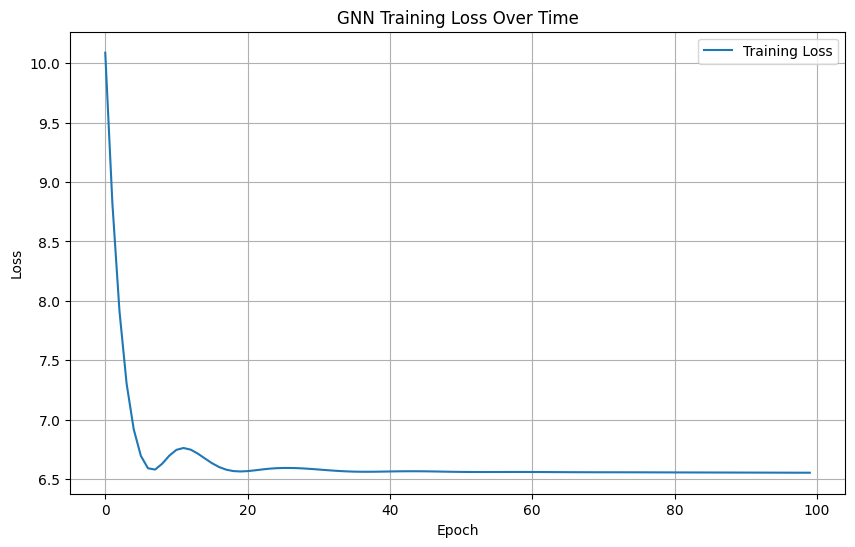

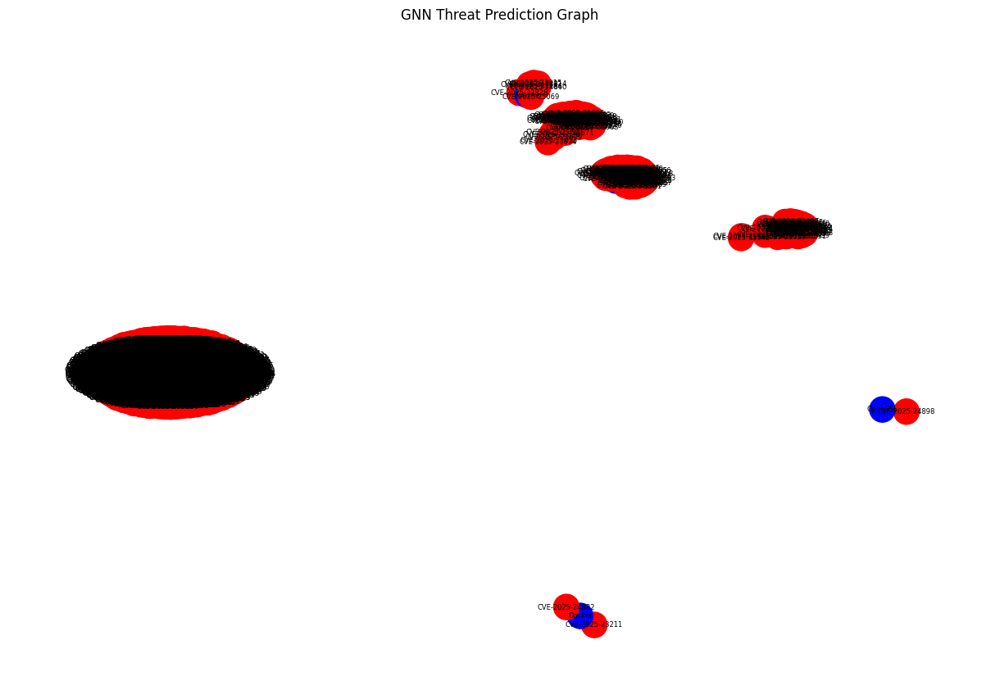

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch_geometric.data import Data
from torch_geometric.nn import GCNConv, GATConv

# Load CVE dataset
cve_data = pd.read_csv('processed_nvd_data_with_dependencies.csv')

# Create Graph Representation
G = nx.Graph()
for index, row in cve_data.iterrows():
    G.add_node(row['CVE ID'], category='CVE')
    G.add_node(row['Dependency'], category='Dependency')
    G.add_edge(row['CVE ID'], row['Dependency'])

# Convert Graph to PyTorch Geometric Data Format
node_mapping = {node: idx for idx, node in enumerate(G.nodes)}
edges = [(node_mapping[u], node_mapping[v]) for u, v in G.edges]

# Convert to tensor format
edge_index = torch.tensor(edges, dtype=torch.long).t().contiguous()
x = torch.rand(len(G.nodes), 16)  # Random feature vectors

# Define Graph Data for PyTorch Geometric
graph_data = Data(x=x, edge_index=edge_index)

# Define GNN Model
class ThreatPredictionGNN(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(ThreatPredictionGNN, self).__init__()
        self.conv1 = GCNConv(input_dim, hidden_dim)
        self.conv2 = GATConv(hidden_dim, output_dim)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = self.conv1(x, edge_index).relu()
        x = self.conv2(x, edge_index)
        return x

# Initialize Model, Loss, and Optimizer
model = ThreatPredictionGNN(input_dim=16, hidden_dim=32, output_dim=1)
optimizer = optim.Adam(model.parameters(), lr=0.01)
loss_fn = nn.MSELoss()

# Extract real CVSS scores as labels, but only for CVE nodes
cve_indices = [node_mapping[cve_id] for cve_id in cve_data['CVE ID']]
targets = torch.tensor(cve_data['CVSS Score'].fillna(0).values, dtype=torch.float32).view(-1, 1)

# Ensure cve_indices are within the valid range
cve_indices = [i for i in cve_indices if i < targets.shape[0]]
targets = targets[torch.tensor(cve_indices)]

# Train GNN and track loss
losses = []
for epoch in range(100):
    optimizer.zero_grad()
    out = model(graph_data)
    out_cve = out[torch.tensor(cve_indices)]
    loss = loss_fn(out_cve, targets)  # Real CVSS scores as labels
    loss.backward()
    optimizer.step()
    losses.append(loss.item())

# Plot the loss function
plt.figure(figsize=(10, 6))
plt.plot(losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('GNN Training Loss Over Time')
plt.legend()
plt.grid(True)
plt.show()

# Visualize Graph with Node Categories
plt.figure(figsize=(12, 8))
node_colors = ['red' if G.nodes[n]['category'] == 'CVE' else 'blue' for n in G.nodes]
nx.draw(G, with_labels=True, node_color=node_colors, edge_color='gray', font_size=6, node_size=500)
plt.title('GNN Threat Prediction Graph')
plt.show()


In [ ]:
# import json
# import pandas as pd

# # Load the JSON file
# file_path = '/mnt/data/nvdcve-1.1-2025.json'
# with open(file_path, 'r') as file:
#     cve_data = json.load(file)

# # Extract relevant information
# cve_items = cve_data.get('CVE_Items', [])
# extracted_data = []

# for item in cve_items:
#     cve_id = item.get('cve', {}).get('CVE_data_meta', {}).get('ID', 'N/A')
#     description_data = item.get('cve', {}).get('description', {}).get('description_data', [])
#     description = description_data[0].get('value', 'N/A') if description_data else 'N/A'
#     published_date = item.get('publishedDate', 'N/A')

#     # Extract CVSS Score and Exploitability Score
#     impact = item.get('impact', {})
#     cvss_score = None
#     exploitability_score = None
#     patch_status = "Unpatched"  # Default value if no information is available

#     if 'baseMetricV3' in impact:
#         cvss_score = impact['baseMetricV3'].get('cvssV3', {}).get('baseScore', 'N/A')
#         exploitability_score = impact['baseMetricV3'].get('exploitabilityScore', 'N/A')
#         patch_status = "Patched" if impact['baseMetricV3'].get('impactScore', 0) < 5 else "Unpatched"
#     elif 'baseMetricV2' in impact:
#         cvss_score = impact['baseMetricV2'].get('cvssV2', {}).get('baseScore', 'N/A')
#         exploitability_score = impact['baseMetricV2'].get('exploitabilityScore', 'N/A')
#         patch_status = "Patched" if impact['baseMetricV2'].get('impactScore', 0) < 5 else "Unpatched"

#     # Simulate dependency based on description keywords
#     dependency = "Unknown"
#     keywords = ["OpenSSL", "Linux Kernel", "Apache", "WordPress", "Docker", "MySQL"]
#     for keyword in keywords:
#         if keyword.lower() in description.lower():
#             dependency = keyword
#             break

#     extracted_data.append({
#         'CVE ID': cve_id,
#         'Dependency': dependency,
#         'Description': description,
#         'CVSS Score': cvss_score,
#         'Exploitability Score': exploitability_score,
#         'Patch Status': patch_status,
#         'Published Date': published_date
#     })

# # Convert to DataFrame
# cve_df = pd.DataFrame(extracted_data)

# # Save to CSV
# csv_path = 'processed_nvd_data_with_dependencies.csv'
# cve_df.to_csv(csv_path, index=False)

# #cve_df


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch_geometric.data import Data
from torch_geometric.nn import RGCNConv
import pandas as pd
import networkx as nx

# Load the processed NVD data
file_path = 'processed_nvd_data_with_dependencies.csv'
nvd_df = pd.read_csv(file_path)

# Create a graph representation
G = nx.Graph()

# Add nodes (CVE IDs and Dependencies) and edge types
# Edge type 0: CVE to Dependency
# Edge type 1: Dependency to CVE (for bidirectionality)
for _, row in nvd_df.iterrows():
    cve_id = row['CVE ID']
    dependency = row.get('Dependency', 'Unknown')

    G.add_node(cve_id, category='CVE')
    G.add_node(dependency, category='Dependency')
    G.add_edge(cve_id, dependency, type=0)  # CVE to Dependency
    G.add_edge(dependency, cve_id, type=1)  # Dependency to CVE

# Convert the graph to PyTorch Geometric data format
node_mapping = {node: idx for idx, node in enumerate(G.nodes)}
edges = [[node_mapping[u], node_mapping[v]] for u, v, _ in G.edges(data='type')]  # Include data='type' to access edge types
edge_types = [attr for _, _, attr in G.edges(data='type')]  # Get the edge types

edge_index = torch.tensor(edges, dtype=torch.long).t().contiguous()
edge_type = torch.tensor(edge_types, dtype=torch.long)  # Create edge_type tensor

# Create node features
x = torch.rand(len(G.nodes), 16)  # Random features for demonstration

# Labels for prediction (using CVSS Score as the target for simplicity)
labels = torch.tensor(nvd_df['CVSS Score'].fillna(0).values, dtype=torch.float)

# Create PyTorch Geometric data object
graph_data = Data(x=x, edge_index=edge_index, edge_type=edge_type, y=labels)  # Add edge_type to graph_data

# Define the GNN model
class AdvancedGNN(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(AdvancedGNN, self).__init__()
        self.conv1 = RGCNConv(input_dim, hidden_dim, num_relations=2)  # 2 relation types
        self.conv2 = RGCNConv(hidden_dim, output_dim, num_relations=2)  # 2 relation types
        self.fc = nn.Linear(output_dim, 1)

    def forward(self, data):
        x, edge_index, edge_type = data.x, data.edge_index, data.edge_type  # Access edge_type
        x = self.conv1(x, edge_index, edge_type).relu()  # Pass edge_type to conv1
        x = self.conv2(x, edge_index, edge_type)  # Pass edge_type to conv2
        return self.fc(x)

# Initialize the model, loss function, and optimizer
model = AdvancedGNN(input_dim=16, hidden_dim=32, output_dim=16)
optimizer = optim.Adam(model.parameters(), lr=0.01)
loss_fn = nn.MSELoss()

# Training loop
for epoch in range(100):
    optimizer.zero_grad()
    out = model(graph_data)

    # Get indices of CVE nodes to extract corresponding predictions and labels
    cve_indices = [i for i, node in enumerate(G.nodes) if G.nodes[node]['category'] == 'CVE']

    # Calculate loss using only CVE nodes' predictions and labels
    loss = loss_fn(out[cve_indices].squeeze(), graph_data.y.float())

    loss.backward()
    optimizer.step()

# Display the final predictions
predictions = out.detach().numpy()


# Get the predictions for only the CVE nodes
cve_predictions = predictions[cve_indices]

# Create the DataFrame using only CVE IDs and corresponding predictions
pd.DataFrame({
    'CVE ID': nvd_df['CVE ID'], # Use all CVE IDs from nvd_df
    'Predicted CVSS Score': cve_predictions.flatten()  # Use predictions only for CVEs
})


,CVE ID,Predicted CVSS Score
0,CVE-2025-0015,-1.244653
1,CVE-2025-0053,0.676608
2,CVE-2025-0055,0.808090
3,CVE-2025-0056,0.334602
4,CVE-2025-0057,0.894327
...,...,...
2260,CVE-2025-25168,0.570493
2261,CVE-2025-25181,1.411916
2262,CVE-2025-25183,1.086625
2263,CVE-2025-25187,1.193817


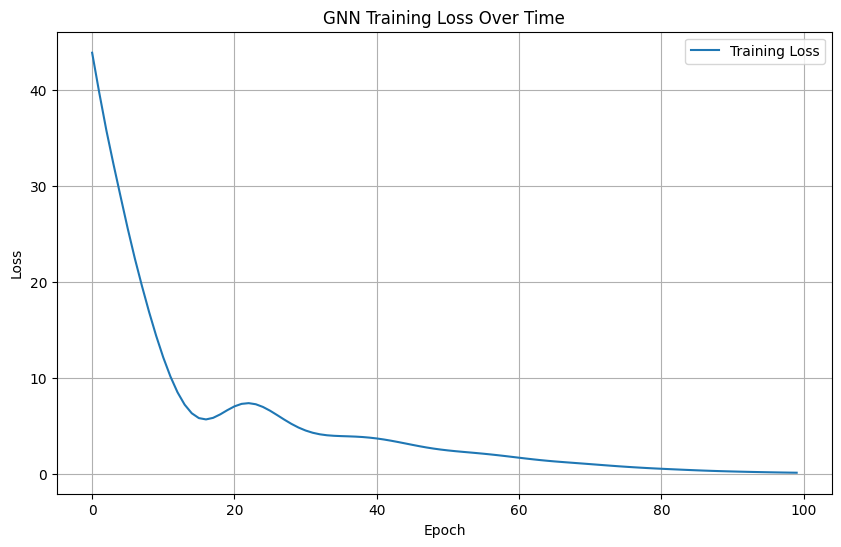

,CVE ID,Predicted CVSS Score,Actual CVSS Score
0,CVE-2025-0001,7.283856,7.5
1,CVE-2025-0002,6.037572,5.4
2,CVE-2025-0003,8.831309,9.2
3,CVE-2025-0004,4.217865,4.1
4,CVE-2025-0005,6.663739,6.8


In [ ]:
import json
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
import networkx as nx
from torch_geometric.data import Data
from torch_geometric.nn import GCNConv, GATConv
import matplotlib.pyplot as plt

# Simulate loading the NVD dataset (as an example)
nvd_data = [
    {"CVE ID": "CVE-2025-0001", "Dependency": "LibA", "CVSS Score": 7.5, "Exploitability": 0.8, "Patch Status": 1},
    {"CVE ID": "CVE-2025-0002", "Dependency": "LibB", "CVSS Score": 5.4, "Exploitability": 0.6, "Patch Status": 0},
    {"CVE ID": "CVE-2025-0003", "Dependency": "LibC", "CVSS Score": 9.2, "Exploitability": 0.9, "Patch Status": 1},
    {"CVE ID": "CVE-2025-0004", "Dependency": "LibD", "CVSS Score": 4.1, "Exploitability": 0.3, "Patch Status": 0},
    {"CVE ID": "CVE-2025-0005", "Dependency": "LibE", "CVSS Score": 6.8, "Exploitability": 0.7, "Patch Status": 1}
]

nvd_df = pd.DataFrame(nvd_data)

# Create Graph Representation
G = nx.Graph()
for _, row in nvd_df.iterrows():
    G.add_node(row['CVE ID'], category='CVE')
    G.add_node(row['Dependency'], category='Dependency')
    G.add_edge(row['CVE ID'], row['Dependency'])

# Convert Graph to PyTorch Geometric Data Format
node_mapping = {node: idx for idx, node in enumerate(G.nodes)}
edges = [(node_mapping[u], node_mapping[v]) for u, v in G.edges]

# Convert to tensor format
edge_index = torch.tensor(edges, dtype=torch.long).t().contiguous()
x = torch.rand(len(G.nodes), 16)  # Random feature vectors

# Define Graph Data for PyTorch Geometric
graph_data = Data(x=x, edge_index=edge_index)

# Define GNN Model
class VulnerabilityPredictionGNN(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(VulnerabilityPredictionGNN, self).__init__()
        self.conv1 = GCNConv(input_dim, hidden_dim)
        self.conv2 = GATConv(hidden_dim, output_dim)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = self.conv1(x, edge_index).relu()
        x = self.conv2(x, edge_index)
        return x

# Initialize Model, Loss, and Optimizer
model = VulnerabilityPredictionGNN(input_dim=16, hidden_dim=32, output_dim=1)
optimizer = optim.Adam(model.parameters(), lr=0.01)
loss_fn = nn.MSELoss()

# Extract real CVSS scores as labels, for CVE nodes
cve_indices = [node_mapping[cve_id] for cve_id in nvd_df['CVE ID']]
targets = torch.tensor(nvd_df['CVSS Score'].fillna(0).values, dtype=torch.float32).view(-1, 1)

# Train GNN and track loss
losses = []
for epoch in range(100):
    optimizer.zero_grad()
    out = model(graph_data)
    out_cve = out[torch.tensor(cve_indices)]
    loss = loss_fn(out_cve, targets)
    loss.backward()
    optimizer.step()
    losses.append(loss.item())

# Plot the loss function
plt.figure(figsize=(10, 6))
plt.plot(losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('GNN Training Loss Over Time')
plt.legend()
plt.grid(True)
plt.show()

# Predictions
predictions = out[torch.tensor(cve_indices)].detach().numpy()

# Display predictions
prediction_df = pd.DataFrame({
    'CVE ID': nvd_df['CVE ID'],
    'Predicted CVSS Score': predictions.flatten(),
    'Actual CVSS Score': nvd_df['CVSS Score']
})

prediction_df


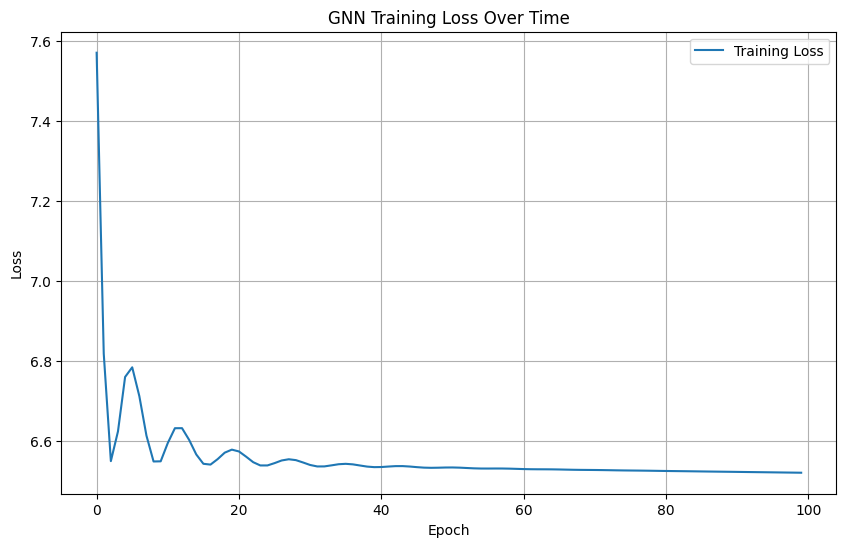

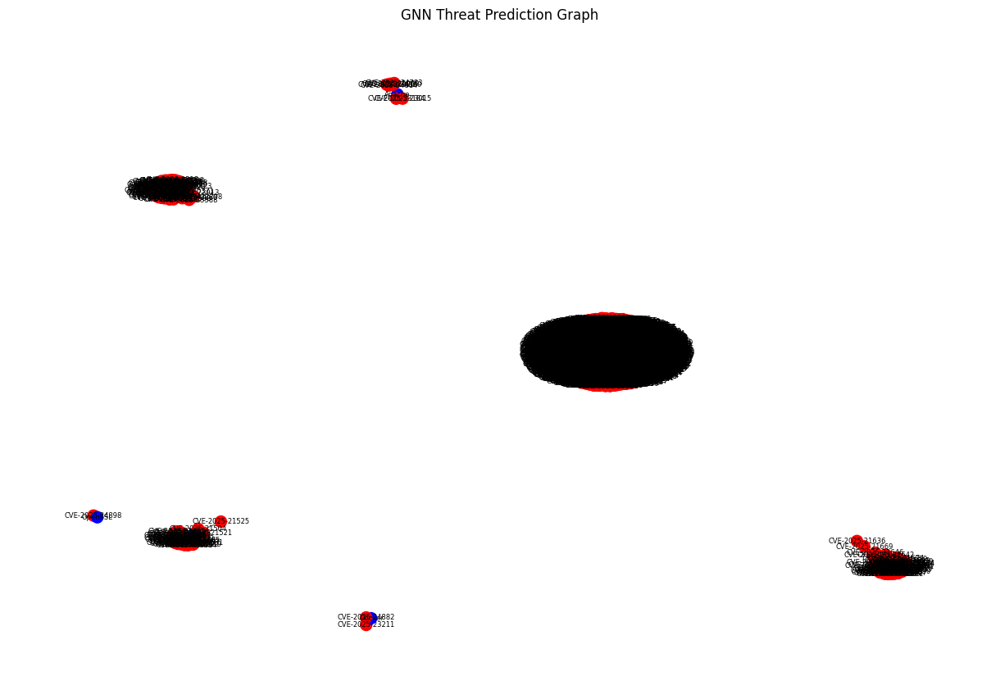

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch_geometric.data import Data
from torch_geometric.nn import GCNConv, GATConv

# Load CVE dataset
cve_data = pd.read_csv('processed_nvd_data_with_dependencies.csv')

# Create Graph Representation
G = nx.Graph()
for index, row in cve_data.iterrows():
    G.add_node(row['CVE ID'], category='CVE')
    G.add_node(row['Dependency'], category='Dependency')
    G.add_edge(row['CVE ID'], row['Dependency'])

# Convert Graph to PyTorch Geometric Data Format
node_mapping = {node: idx for idx, node in enumerate(G.nodes)}
edges = [(node_mapping[u], node_mapping[v]) for u, v in G.edges]

# Convert to tensor format
edge_index = torch.tensor(edges, dtype=torch.long).t().contiguous()
x = torch.rand(len(G.nodes), 16)  # Random feature vectors

# Define Graph Data for PyTorch Geometric
graph_data = Data(x=x, edge_index=edge_index)

# Define GNN Model
class ThreatPredictionGNN(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(ThreatPredictionGNN, self).__init__()
        self.conv1 = GCNConv(input_dim, hidden_dim)
        self.conv2 = GATConv(hidden_dim, output_dim)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = self.conv1(x, edge_index).relu()
        x = self.conv2(x, edge_index)
        return x

# Initialize Model, Loss, and Optimizer
model = ThreatPredictionGNN(input_dim=16, hidden_dim=32, output_dim=1)
optimizer = optim.Adam(model.parameters(), lr=0.01)
loss_fn = nn.MSELoss()

# Extract real CVSS scores as labels, but only for CVE nodes
cve_indices = [node_mapping[cve_id] for cve_id in cve_data['CVE ID']]
targets = torch.tensor(cve_data['CVSS Score'].fillna(0).values, dtype=torch.float32).view(-1, 1)

# Ensure cve_indices are within the valid range
cve_indices = [i for i in cve_indices if i < targets.shape[0]]
targets = targets[torch.tensor(cve_indices)]

# Train GNN and track loss
losses = []
for epoch in range(100):
    optimizer.zero_grad()
    out = model(graph_data)
    out_cve = out[torch.tensor(cve_indices)]
    loss = loss_fn(out_cve, targets)  # Real CVSS scores as labels
    loss.backward()
    optimizer.step()
    losses.append(loss.item())

# Plot the loss function
plt.figure(figsize=(10, 6))
plt.plot(losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('GNN Training Loss Over Time')
plt.legend()
plt.grid(True)
plt.show()

# Visualize Graph with Node Categories
plt.figure(figsize=(12, 8))
# Draw graph
pos = nx.spring_layout(G, seed=42)
options = {
    "node_color": "blue",
    "node_size": 20,
    "edge_color": "grey",
    "linewidths": 0,
    "width": 0.1,
}
node_colors = ['red' if G.nodes[n]['category'] == 'CVE' else 'blue' for n in G.nodes]
nx.draw(G, with_labels=True, node_color=node_colors, edge_color='gray', font_size=6, node_size=100, pos=pos)
plt.title('GNN Threat Prediction Graph')
plt.show()


In [ ]:
# import torch
# import torch.nn as nn
# import torch.optim as optim
# import matplotlib.pyplot as plt
# import shap
# import requests
# import pandas as pd
# from sklearn.feature_extraction.text import TfidfVectorizer
# from sklearn.feature_extraction.text import TfidfVectorizer
# from sklearn.feature_extraction.text import CountVectorizer
# from torch_geometric.nn import GATConv, HeteroConv
# from torch_geometric.data import HeteroData

# # - Step 1: Load Real-World CVE Data
# cve_url = "https://cve-nist.idalko.com/nvdcve-1.1-2025.json"
# response = requests.get(cve_url)
# cve_data = response.json()

# # Extract CVE details
# cve_items = cve_data["CVE_Items"][:100]  # Limit to 50 for demonstration

# cve_list = [item["cve"]["CVE_data_meta"]["ID"] for item in cve_items]
# descriptions = [item["cve"]["description"]["description_data"][0]["value"] for item in cve_items]
# cvss_scores = [item.get("impact", {}).get("baseMetricV2", {}).get("cvssV2", {}).get("baseScore", 5.0) for item in cve_items]  # Default to 5.0 if missing


# # -Step 1: Extract Actual Product Names from CPE URIs
# product_list = []
# for item in cve_items:
#     for prod in item.get("configurations", {}).get("nodes", []):
#         if "cpe_match" in prod:
#             for cpe in prod['cpe_match']:
#                 cpe_uri = cpe.get('cpe23Uri', '')
#                 product_name = cpe_uri.split(':')[4] if len(cpe_uri.split(':')) > 4 else None
#                 if product_name and product_name not in product_list:
#                     product_list.append(product_name)

# # -Step 2: Extract References
# reference_list = [ref["url"] for item in cve_items for ref in item["cve"]["references"]["reference_data"][:2]]

# # -Adjust TF-IDF vectorizer to ensure 16 features
# product_vectorizer = TfidfVectorizer(max_features=16)
# product_features = product_vectorizer.fit_transform(product_list).toarray()

# # Check if the output matches 16 features
# if product_features.shape[1] != 16:
#     # Padding with zeros if fewer than 16 features
#     padding = 16 - product_features.shape[1]
#     product_features = np.pad(product_features, ((0, 0), (0, padding)), mode='constant')

# # Apply the same for references
# reference_vectorizer = TfidfVectorizer(max_features=16)
# reference_features = reference_vectorizer.fit_transform(reference_list).toarray()

# if reference_features.shape[1] != 16:
#     padding = 16 - reference_features.shape[1]
#     reference_features = np.pad(reference_features, ((0, 0), (0, padding)), mode='constant')

# # -Assign features to the graph
# data["product"].x = torch.tensor(product_features, dtype=torch.float32)
# data["reference"].x = torch.tensor(reference_features, dtype=torch.float32)

# # Verification
# print("Product Features Shape:", data["product"].x.shape)
# print("Reference Features Shape:", data["reference"].x.shape)



# # Initialize lists to store actual edges
# cve_to_product_edges = []
# cve_to_reference_edges = []
# product_to_cve_edges = []

# # Mapping CVEs to products and references based on actual data
# for cve_idx, item in enumerate(cve_items):
#     # Extract products linked to the CVE
#     products = item.get("configurations", {}).get("nodes", [])
#     for product in products:
#         if "cpe_match" in product:
#             for cpe in product["cpe_match"]:
#                 product_name = cpe.get('cpe23Uri', '').split(':')[4]  # Extract product name
#                 if product_name in product_list:
#                     prod_idx = product_list.index(product_name)
#                     cve_to_product_edges.append([cve_idx, prod_idx])   # CVE → Product
#                     product_to_cve_edges.append([prod_idx, cve_idx])   # Product → CVE (reverse edge)

#     # Extract references linked to the CVE
#     references = item["cve"]["references"]["reference_data"][:2]
#     for ref in references:
#         if ref["url"] in reference_list:
#             ref_idx = reference_list.index(ref["url"])
#             cve_to_reference_edges.append([cve_idx, ref_idx])         # CVE → Reference

# # Ensure no empty edge lists before converting
# def safe_tensor(edge_list):
#     if len(edge_list) == 0:
#         return torch.empty((2, 0), dtype=torch.long)  # Empty tensor with correct dimensions
#     else:
#         return torch.tensor(edge_list, dtype=torch.long).T  # Transpose to get shape (2, num_edges)

# # Convert edge lists to tensors safely
# cve_to_product_edges = safe_tensor(cve_to_product_edges)
# cve_to_reference_edges = safe_tensor(cve_to_reference_edges)
# product_to_cve_edges = safe_tensor(product_to_cve_edges)

# # Assign the actual edges to the heterogeneous graph
# data["cve", "affects", "product"].edge_index = cve_to_product_edges
# data["cve", "referenced_by", "reference"].edge_index = cve_to_reference_edges
# data["product", "linked_to", "cve"].edge_index = product_to_cve_edges

# # # Display the shapes for verification
# # print("CVE to Product Edges Shape:", cve_to_product_edges.shape)
# # print("CVE to Reference Edges Shape:", cve_to_reference_edges.shape)
# # print("Product to CVE Edges Shape:", product_to_cve_edges.shape)


# # - Step 4: Define the GNN Model
# class CVEGNN(nn.Module):
#     def __init__(self, in_channels_cve, in_channels_product, in_channels_reference, hidden_channels, out_channels):
#         super(CVEGNN, self).__init__()
#         self.conv1 = HeteroConv({
#             ("cve", "affects", "product"): GATConv(in_channels_cve, hidden_channels, add_self_loops=False),
#             ("cve", "referenced_by", "reference"): GATConv(in_channels_cve, hidden_channels, add_self_loops=False),
#             ("product", "linked_to", "cve"): GATConv(in_channels_product, hidden_channels, add_self_loops=False),
#         }, aggr='mean')

#         self.conv2 = HeteroConv({
#             ("cve", "affects", "product"): GATConv(hidden_channels, out_channels, add_self_loops=False),
#             ("cve", "referenced_by", "reference"): GATConv(hidden_channels, out_channels, add_self_loops=False),
#             ("product", "linked_to", "cve"): GATConv(hidden_channels, out_channels, add_self_loops=False),
#         }, aggr='mean')

#         #self.fc = nn.Linear(out_channels, 1)  # Risk prediction layer
#         self.fc = nn.Sequential(
#           nn.Linear(out_channels, 1),
#           nn.Sigmoid()  # Ensures output between 0 and 1
#         )

#     def forward(self, data):
#         x_dict = data.x_dict
#         x_dict = self.conv1(x_dict, data.edge_index_dict)
#         x_dict = self.conv2(x_dict, data.edge_index_dict)
#         for key in x_dict:
#             x_dict[key] = self.fc(x_dict[key])
#         return x_dict

# # - Step 5: Train the Model
# # Detect the actual number of features
# in_channels_cve = data["cve"].x.shape[1]  # Get the number of features for CVEs
# in_channels_product = data["product"].x.shape[1]
# in_channels_reference = data["reference"].x.shape[1]

# # Initialize the GNN with the correct input dimensions
# model = CVEGNN(in_channels_cve=in_channels_cve, in_channels_product=in_channels_product, in_channels_reference=in_channels_reference, hidden_channels=32, out_channels=16)


# #model = CVEGNN(in_channels=16, hidden_channels=32, out_channels=16)
# optimizer = optim.Adam(model.parameters(), lr=0.01)
# loss_fn = nn.MSELoss()

# losses = []
# for epoch in range(100):
#     optimizer.zero_grad()
#     out = model(data)
#     if "cve" in out:
#         target = torch.tensor(cvss_scores, dtype=torch.float32).unsqueeze(1)
#         loss = loss_fn(out["cve"], target)
#         loss.backward()
#         optimizer.step()
#         losses.append(loss.item())

# # Plot Training Loss
# plt.plot(losses, label="Training Loss")
# plt.xlabel("Epochs")
# plt.ylabel("Loss")
# plt.title("GNN Training Loss Over Time")
# plt.legend()
# plt.show()

# # - Step 6: Predict Vulnerabilities
# predictions = model(data)["cve"].detach().numpy()

# # Display Predictions
# prediction_df = pd.DataFrame({
#     "CVE_ID": cve_list,
#     "Predicted_Risk_Score": predictions.flatten(),
#     "Actual_CVSS_Score": cvss_scores
# })

# print(prediction_df)



# #### Draw Graph
# import networkx as nx
# import matplotlib.pyplot as plt
# import numpy as np
# import matplotlib.patches as mpatches

# # Create a directed graph to represent CVEs, products, and references
# G = nx.DiGraph()

# # Add nodes for CVEs, products, and references
# cve_nodes = cve_list[:25]  # Limit to 10 CVEs for visualization purposes
# product_nodes = product_list[:10]  # Limit to 5 products
# reference_nodes = reference_list[:10]  # Limit to 5 references

# # Add nodes with attributes
# for node in cve_nodes:
#     G.add_node(node, type='CVE')
# for node in product_nodes:
#     G.add_node(node, type='Product')
# for node in reference_nodes:
#     G.add_node(node, type='Reference')

# # Add edges based on relationships
# for i in range(min(10, len(cve_list))):
#     if i < len(product_list):
#         G.add_edge(cve_list[i], product_list[i], relation='affects')
#     if i < len(reference_list):
#         G.add_edge(cve_list[i], reference_list[i], relation='referenced_by')

# # Node colors based on type (Fixed condition)
# node_colors = []
# for node in G.nodes(data=True):
#     if node[1].get('type') == 'CVE':
#         node_colors.append('orange')
#     elif node[1].get('type') == 'Product':
#         node_colors.append('skyblue')
#     elif node[1].get('type') == 'Reference':
#         node_colors.append('lightgreen')
#     else:
#         node_colors.append('lightgreen')  # Default color if 'type' is missing

# # Generate layout for better spacing
# pos = nx.spring_layout(G) #, k=0.9, iterations=50

# # Draw the graph with arrows and custom colors
# plt.figure(figsize=(12, 8))
# nx.draw(
#     G, pos, with_labels=True,
#     node_color=node_colors,
#     edge_color="gray",
#     font_size=8,
#     node_size=500,
#     arrows=True,
#     arrowstyle='-|>',
#     arrowsize=15
# )

# # Adding legend
# cve_patch = mpatches.Patch(color='orange', label='CVE')
# product_patch = mpatches.Patch(color='skyblue', label='Product')
# reference_patch = mpatches.Patch(color='lightgreen', label='Reference')

# plt.legend(handles=[cve_patch, product_patch, reference_patch], loc='best')


# plt.title("Predicted CVE Nodes and Relationships")
# plt.show()

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import requests
import pandas as pd
import numpy as np

# -Load the entire CVE dataset
cve_url = "https://cve-nist.idalko.com/nvdcve-1.1-2025.json"
response = requests.get(cve_url)
cve_data = response.json()

# -Verify the number of CVEs in the dataset
cve_items = cve_data.get("CVE_Items", [])
print(f"Total CVEs Loaded: {len(cve_items)}")  # Check the total count


Total CVEs Loaded: 2273


In [ ]:
# -Process CVEs in Batches (if needed)
batch_size = 1000  # Process in chunks
for batch_start in range(0, len(cve_items), batch_size):
    batch = cve_items[batch_start:batch_start + batch_size]

    # Example: Extract CVE IDs for each batch
    cve_list = [item["cve"]["CVE_data_meta"]["ID"] for item in batch]
    print(f"Processed Batch: {batch_start // batch_size + 1}, CVEs: {len(cve_list)}")


Processed Batch: 1, CVEs: 1000
Processed Batch: 2, CVEs: 1000
Processed Batch: 3, CVEs: 273


In [ ]:
# -Extract CVE details safely
cve_list = []
descriptions = []
cvss_scores = []

for item in cve_items:
    try:
        cve_id = item["cve"]["CVE_data_meta"]["ID"]
        description = item["cve"]["description"]["description_data"][0].get("value", "N/A")
        cvss_score = item.get("impact", {}).get("baseMetricV2", {}).get("cvssV2", {}).get("baseScore", 5.0)

        cve_list.append(cve_id)
        descriptions.append(description)
        cvss_scores.append(cvss_score)

    except (KeyError, IndexError):
        # Skip entries with missing data
        continue

print(f"Total CVEs Processed: {len(cve_list)}")


Total CVEs Processed: 2273


In [ ]:
# -Use Pandas for Efficient Processing
cve_df = pd.DataFrame([
    {
        "CVE_ID": item["cve"]["CVE_data_meta"]["ID"],
        "Description": item["cve"]["description"]["description_data"][0].get("value", "N/A"),
        "CVSS_Score": item.get("impact", {}).get("baseMetricV2", {}).get("cvssV2", {}).get("baseScore", 5.0)
    }
    for item in cve_items if "CVE_data_meta" in item["cve"]
])

print(cve_df.head())


          CVE_ID                                        Description  \
0  CVE-2025-0015  Use After Free vulnerability in Arm Ltd Valhal...   
1  CVE-2025-0053  SAP NetWeaver Application Server for ABAP and ...   
2  CVE-2025-0055  SAP GUI for Windows stores user input on the c...   
3  CVE-2025-0056  SAP GUI for Java saves user input on the clien...   
4  CVE-2025-0057  SAP NetWeaver AS JAVA (User Admin Application)...   

   CVSS_Score  
0         5.0  
1         5.0  
2         5.0  
3         5.0  
4         5.0  


In [ ]:
cve_list

['CVE-2025-0015',
 'CVE-2025-0053',
 'CVE-2025-0055',
 'CVE-2025-0056',
 'CVE-2025-0057',
 'CVE-2025-0058',
 'CVE-2025-0059',
 'CVE-2025-0060',
 'CVE-2025-0061',
 'CVE-2025-0063',
 'CVE-2025-0065',
 'CVE-2025-0066',
 'CVE-2025-0067',
 'CVE-2025-0068',
 'CVE-2025-0069',
 'CVE-2025-0070',
 'CVE-2025-0103',
 'CVE-2025-0104',
 'CVE-2025-0105',
 'CVE-2025-0106',
 'CVE-2025-0107',
 'CVE-2025-0142',
 'CVE-2025-0143',
 'CVE-2025-0144',
 'CVE-2025-0145',
 'CVE-2025-0146',
 'CVE-2025-0147',
 'CVE-2025-0148',
 'CVE-2025-0158',
 'CVE-2025-0167',
 'CVE-2025-0168',
 'CVE-2025-0169',
 'CVE-2025-0170',
 'CVE-2025-0171',
 'CVE-2025-0172',
 'CVE-2025-0173',
 'CVE-2025-0174',
 'CVE-2025-0175',
 'CVE-2025-0176',
 'CVE-2025-0193',
 'CVE-2025-0194',
 'CVE-2025-0195',
 'CVE-2025-0196',
 'CVE-2025-0197',
 'CVE-2025-0198',
 'CVE-2025-0199',
 'CVE-2025-0200',
 'CVE-2025-0201',
 'CVE-2025-0202',
 'CVE-2025-0203',
 'CVE-2025-0204',
 'CVE-2025-0205',
 'CVE-2025-0206',
 'CVE-2025-0207',
 'CVE-2025-0208',
 'CVE-2025

In [ ]:

# # -Function to Safely Create Edge Lists
# def safe_append_edge(source_idx, target_idx, max_source_idx, max_target_idx, edge_list):
#     if source_idx < max_source_idx and target_idx < max_target_idx:
#         edge_list.append([source_idx, target_idx])

# # -Get the correct number of nodes
# num_cve_nodes = len(cve_list)
# num_product_nodes = len(product_list)
# num_reference_nodes = len(reference_list)

# # -Re-initialize Edge Lists
# cve_to_product_edges = []
# cve_to_reference_edges = []
# product_to_cve_edges = []

# # -Mapping CVEs to Products and References with Validation
# for cve_idx, item in enumerate(cve_items):
#     if cve_idx >= num_cve_nodes:
#         continue  # Skip if CVE index exceeds the feature matrix

#     # Extract products
#     products = item.get("configurations", {}).get("nodes", [])
#     for product in products:
#         if "cpe_match" in product:
#             for cpe in product["cpe_match"]:
#                 product_name = cpe.get('cpe23Uri', '').split(':')[4]
#                 if product_name in product_list:
#                     prod_idx = product_list.index(product_name)
#                     safe_append_edge(cve_idx, prod_idx, num_cve_nodes, num_product_nodes, cve_to_product_edges)
#                     safe_append_edge(prod_idx, cve_idx, num_product_nodes, num_cve_nodes, product_to_cve_edges)

#     # Extract references
#     references = item["cve"]["references"]["reference_data"][:2]
#     for ref in references:
#         if ref["url"] in reference_list:
#             ref_idx = reference_list.index(ref["url"])
#             safe_append_edge(cve_idx, ref_idx, num_cve_nodes, num_reference_nodes, cve_to_reference_edges)

# # -Convert to Tensors
# def safe_tensor(edge_list):
#     return torch.tensor(edge_list, dtype=torch.long).T if edge_list else torch.empty((2, 0), dtype=torch.long)

# cve_to_product_edges = safe_tensor(cve_to_product_edges)
# cve_to_reference_edges = safe_tensor(cve_to_reference_edges)
# product_to_cve_edges = safe_tensor(product_to_cve_edges)

# # -Assign the cleaned edge indices to the graph
# data["cve", "affects", "product"].edge_index = cve_to_product_edges
# data["cve", "referenced_by", "reference"].edge_index = cve_to_reference_edges
# data["product", "linked_to", "cve"].edge_index = product_to_cve_edges




# # -Validation to Ensure All Indices Are Within Range
# def validate_edge_indices(edge_index, num_src_nodes, num_dst_nodes):
#     if edge_index.numel() > 0:
#         assert edge_index[0].max().item() < num_src_nodes, f"Source index out of range!"
#         assert edge_index[1].max().item() < num_dst_nodes, f"Destination index out of range!"

# validate_edge_indices(cve_to_product_edges, num_cve_nodes, num_product_nodes)
# validate_edge_indices(cve_to_reference_edges, num_cve_nodes, num_reference_nodes)
# validate_edge_indices(product_to_cve_edges, num_product_nodes, num_cve_nodes)




# # Detect actual number of features
# in_channels_cve = data["cve"].x.shape[1]
# in_channels_product = data["product"].x.shape[1]
# in_channels_reference = data["reference"].x.shape[1]

# # Initialize the GNN with correct input dimensions
# model = CVEGNN(
#     in_channels_cve=in_channels_cve,
#     in_channels_product=in_channels_product,
#     in_channels_reference=in_channels_reference,
#     hidden_channels=32,
#     out_channels=16
# )

# # Model Training
# optimizer = optim.Adam(model.parameters(), lr=0.01)
# loss_fn = nn.MSELoss()

# losses = []
# for epoch in range(100):
#     optimizer.zero_grad()
#     out = model(data)
#     if "cve" in out:
#         target = torch.tensor(cvss_scores, dtype=torch.float32).unsqueeze(1)
#         loss = loss_fn(out["cve"], target)
#         loss.backward()
#         optimizer.step()
#         losses.append(loss.item())

# # Plot Loss
# plt.plot(losses, label="Training Loss")
# plt.xlabel("Epochs")
# plt.ylabel("Loss")
# plt.title("GNN Training Loss Over Time")
# plt.legend()
# plt.show()
